# Part One - Building a Regressor Model

In [20]:
#Importing all the requisite libraries

import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split 
from tensorflow.keras import regularizers, optimizers
from tensorflow.keras.models import Sequential, save_model, load_model
from tensorflow.keras.layers import Input, Dense, Activation,Dropout
from tensorflow.keras.models import Model
from sklearn.metrics import mean_squared_error
from math import sqrt
import matplotlib.pyplot as plt
from keras.utils import np_utils
from sklearn.metrics import accuracy_score
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import GridSearchCV
import keras
from keras import losses
from keras import optimizers
from keras.layers import BatchNormalization
import tkinter as tk
from tkinter import ttk
import re
import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as stats 
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
import random

import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

In [24]:
# Reading the dataset

sdf = pd.read_excel('Signal_P123.xlsx')
# pd.set_option('display.max_column',None)
# pd.set_option('display.max_rows',None)

In [25]:
sdf.head(10)  #Displaying first 10 rows

,Parameter 1,Parameter 2,Parameter 3,Parameter 4,Parameter 5,Parameter 6,Parameter 7,Parameter 8,Parameter 9,Parameter 10,Parameter 11,Signal_Strength
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5
6,7.9,0.60,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5
7,7.3,0.65,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7
8,7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7
9,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5


## Data Analysis & Visualization

### Performing relevant and detailed statistical analysis on the data

In [26]:
sdf.shape  

(1599, 12)

In [27]:
sdf.isnull().sum()

Parameter 1        0
Parameter 2        0
Parameter 3        0
Parameter 4        0
Parameter 5        0
Parameter 6        0
Parameter 7        0
Parameter 8        0
Parameter 9        0
Parameter 10       0
Parameter 11       0
Signal_Strength    0
dtype: int64

In [28]:
sdf.describe().T

,count,mean,std,min,25%,50%,75%,max
Parameter 1,1599.0,8.319637,1.741096,4.60000,7.1000,7.90000,9.200000,15.90000
Parameter 2,1599.0,0.527821,0.179060,0.12000,0.3900,0.52000,0.640000,1.58000
Parameter 3,1599.0,0.270976,0.194801,0.00000,0.0900,0.26000,0.420000,1.00000
Parameter 4,1599.0,2.538806,1.409928,0.90000,1.9000,2.20000,2.600000,15.50000
Parameter 5,1599.0,0.087467,0.047065,0.01200,0.0700,0.07900,0.090000,0.61100
Parameter 6,1599.0,15.874922,10.460157,1.00000,7.0000,14.00000,21.000000,72.00000
Parameter 7,1599.0,46.467792,32.895324,6.00000,22.0000,38.00000,62.000000,289.00000
Parameter 8,1599.0,0.996747,0.001887,0.99007,0.9956,0.99675,0.997835,1.00369
Parameter 9,1599.0,3.311113,0.154386,2.74000,3.2100,3.31000,3.400000,4.01000
Parameter 10,1599.0,0.658149,0.169507,0.33000,0.5500,0.62000,0.730000,2.00000


In [29]:
sdf.corr()

,Parameter 1,Parameter 2,Parameter 3,Parameter 4,Parameter 5,Parameter 6,Parameter 7,Parameter 8,Parameter 9,Parameter 10,Parameter 11,Signal_Strength
Parameter 1,1.000000,-0.256131,0.671703,0.114777,0.093705,-0.153794,-0.113181,0.668047,-0.682978,0.183006,-0.061668,0.124052
Parameter 2,-0.256131,1.000000,-0.552496,0.001918,0.061298,-0.010504,0.076470,0.022026,0.234937,-0.260987,-0.202288,-0.390558
Parameter 3,0.671703,-0.552496,1.000000,0.143577,0.203823,-0.060978,0.035533,0.364947,-0.541904,0.312770,0.109903,0.226373
Parameter 4,0.114777,0.001918,0.143577,1.000000,0.055610,0.187049,0.203028,0.355283,-0.085652,0.005527,0.042075,0.013732
Parameter 5,0.093705,0.061298,0.203823,0.055610,1.000000,0.005562,0.047400,0.200632,-0.265026,0.371260,-0.221141,-0.128907
Parameter 6,-0.153794,-0.010504,-0.060978,0.187049,0.005562,1.000000,0.667666,-0.021946,0.070377,0.051658,-0.069408,-0.050656
Parameter 7,-0.113181,0.076470,0.035533,0.203028,0.047400,0.667666,1.000000,0.071269,-0.066495,0.042947,-0.205654,-0.185100
Parameter 8,0.668047,0.022026,0.364947,0.355283,0.200632,-0.021946,0.071269,1.000000,-0.341699,0.148506,-0.496180,-0.174919
Parameter 9,-0.682978,0.234937,-0.541904,-0.085652,-0.265026,0.070377,-0.066495,-0.341699,1.000000,-0.196648,0.205633,-0.057731
Parameter 10,0.183006,-0.260987,0.312770,0.005527,0.371260,0.051658,0.042947,0.148506,-0.196648,1.000000,0.093595,0.251397


The highly correlated parameters are Parameter 1 with Parameter 3, 8 & 9. And also Parameter 6 & 7 are highly correlated.

In [30]:
sdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Parameter 1      1599 non-null   float64
 1   Parameter 2      1599 non-null   float64
 2   Parameter 3      1599 non-null   float64
 3   Parameter 4      1599 non-null   float64
 4   Parameter 5      1599 non-null   float64
 5   Parameter 6      1599 non-null   float64
 6   Parameter 7      1599 non-null   float64
 7   Parameter 8      1599 non-null   float64
 8   Parameter 9      1599 non-null   float64
 9   Parameter 10     1599 non-null   float64
 10  Parameter 11     1599 non-null   float64
 11  Signal_Strength  1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [31]:
sdf.dtypes

Parameter 1        float64
Parameter 2        float64
Parameter 3        float64
Parameter 4        float64
Parameter 5        float64
Parameter 6        float64
Parameter 7        float64
Parameter 8        float64
Parameter 9        float64
Parameter 10       float64
Parameter 11       float64
Signal_Strength      int64
dtype: object

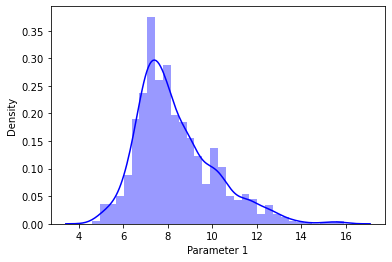

Distribution of  Parameter 1
Mean is: 8.31963727329581
Median is: 7.9
Mode is: 0    7.2
dtype: float64
Standard deviation is: 1.7410963181276953
Skewness is: 0.9827514413284587
Maximum is: 15.9
Minimum is: 4.6


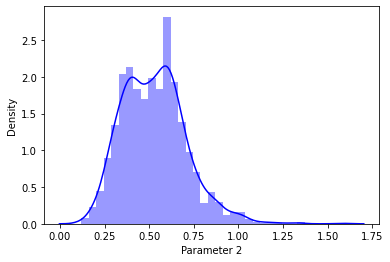

Distribution of  Parameter 2
Mean is: 0.5278205128205128
Median is: 0.52
Mode is: 0    0.6
dtype: float64
Standard deviation is: 0.17905970415353537
Skewness is: 0.6715925723840199
Maximum is: 1.58
Minimum is: 0.12


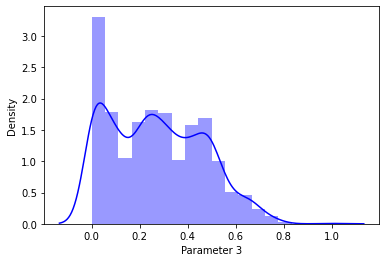

Distribution of  Parameter 3
Mean is: 0.2709756097560976
Median is: 0.26
Mode is: 0    0.0
dtype: float64
Standard deviation is: 0.19480113740531857
Skewness is: 0.3183372952546368
Maximum is: 1.0
Minimum is: 0.0


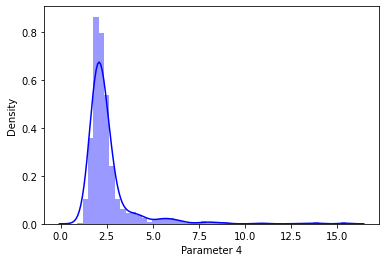

Distribution of  Parameter 4
Mean is: 2.53880550343965
Median is: 2.2
Mode is: 0    2.0
dtype: float64
Standard deviation is: 1.4099280595072798
Skewness is: 4.54065542590319
Maximum is: 15.5
Minimum is: 0.9


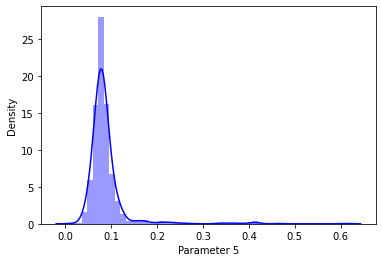

Distribution of  Parameter 5
Mean is: 0.08746654158849279
Median is: 0.079
Mode is: 0    0.08
dtype: float64
Standard deviation is: 0.0470653020100901
Skewness is: 5.680346571971724
Maximum is: 0.611
Minimum is: 0.012


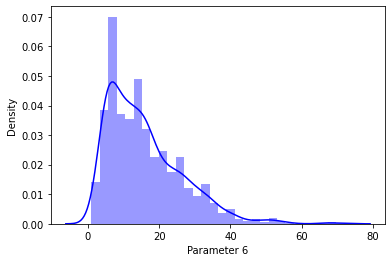

Distribution of  Parameter 6
Mean is: 15.874921826141339
Median is: 14.0
Mode is: 0    6.0
dtype: float64
Standard deviation is: 10.460156969809725
Skewness is: 1.250567293314441
Maximum is: 72.0
Minimum is: 1.0


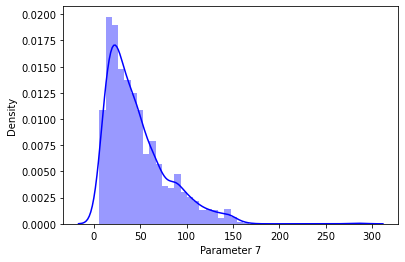

Distribution of  Parameter 7
Mean is: 46.46779237023139
Median is: 38.0
Mode is: 0    28.0
dtype: float64
Standard deviation is: 32.895324478299074
Skewness is: 1.515531257594554
Maximum is: 289.0
Minimum is: 6.0


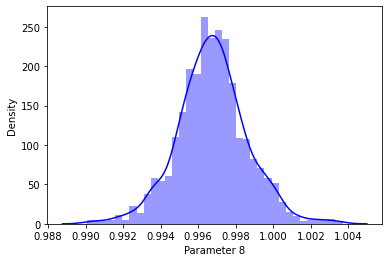

Distribution of  Parameter 8
Mean is: 0.9967466791744841
Median is: 0.99675
Mode is: 0    0.9972
dtype: float64
Standard deviation is: 0.0018873339538425554
Skewness is: 0.07128766294927483
Maximum is: 1.00369
Minimum is: 0.99007


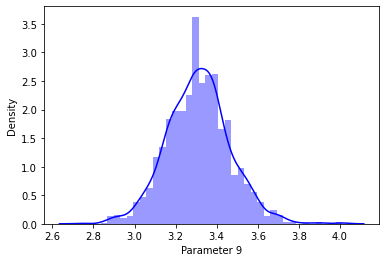

Distribution of  Parameter 9
Mean is: 3.3111131957473416
Median is: 3.31
Mode is: 0    3.3
dtype: float64
Standard deviation is: 0.15438646490354277
Skewness is: 0.19368349811284427
Maximum is: 4.01
Minimum is: 2.74


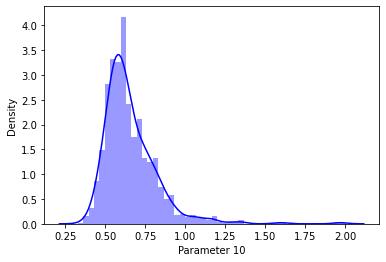

Distribution of  Parameter 10
Mean is: 0.6581488430268917
Median is: 0.62
Mode is: 0    0.6
dtype: float64
Standard deviation is: 0.16950697959010996
Skewness is: 2.4286723536602945
Maximum is: 2.0
Minimum is: 0.33


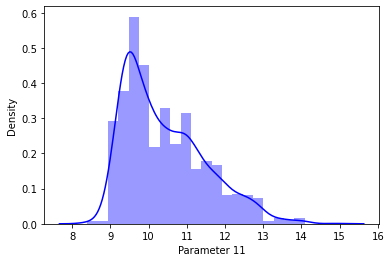

Distribution of  Parameter 11
Mean is: 10.422983114446529
Median is: 10.2
Mode is: 0    9.5
dtype: float64
Standard deviation is: 1.0656675818563988
Skewness is: 0.8608288069184189
Maximum is: 14.9
Minimum is: 8.4


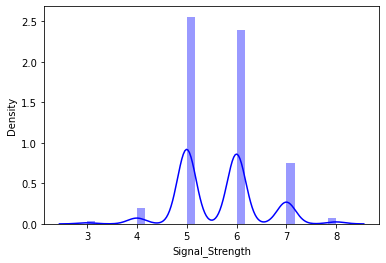

Distribution of  Signal_Strength
Mean is: 5.6360225140712945
Median is: 6.0
Mode is: 0    5
dtype: int64
Standard deviation is: 0.807569439734705
Skewness is: 0.21780157547366327
Maximum is: 8
Minimum is: 3


In [32]:
# Displaying statistical details of all the columns

cols = list(sdf)

for i in np.arange(len(cols)):
    sns.distplot(sdf[cols[i]], color='blue')
    plt.show()
    print('Distribution of ',cols[i])
    print('Mean is:',sdf[cols[i]].mean())
    print('Median is:',sdf[cols[i]].median())
    print('Mode is:',sdf[cols[i]].mode())
    print('Standard deviation is:',sdf[cols[i]].std())
    print('Skewness is:',sdf[cols[i]].skew())
    print('Maximum is:',sdf[cols[i]].max())
    print('Minimum is:',sdf[cols[i]].min())

### Performing relevant and detailed uni, bi and multi variate analysis

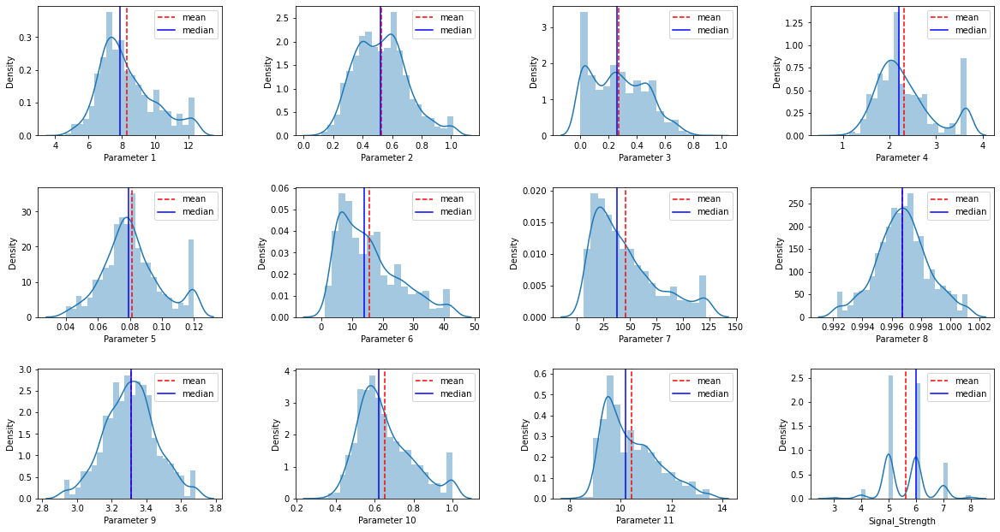

In [311]:
#Univariate Visualization

graph = sdf.copy()

# graph.drop('Signal_Strength',axis = 1, inplace = True)
f = []
for cols in graph:
    f.append(cols)
# print(len(f))
      
fig, ax = plt.subplots(nrows = 3, ncols = 4, figsize = [20,10])
# fig.tight_layout()
plt.subplots_adjust(left=0.125,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)

for f, ax in zip(f, ax.flatten()):
    sns.distplot(graph[f], ax = ax)
    mean = graph[f].mean()
    median = graph[f].median()
    ax.axvline(mean, color='r', linestyle='--', label = 'mean')
    ax.axvline(median, color='b', linestyle='-', label = 'median')
    ax.legend()

 - Most of the parameters distribution is right skewed as seen in the univariate plots since the mean in placed at the right of the plot.
 - Parameters that are right skewed are Parameter 1, 2, 3, 4, 5, 6, 7, 10 & 11
 - There are two parameters which has normal distribution shaped as a bell curve. Those are parameters 8 & 9.
 - The dependent variable paramter 'Signal_Strength' is left skewed and has two evident small peaks.

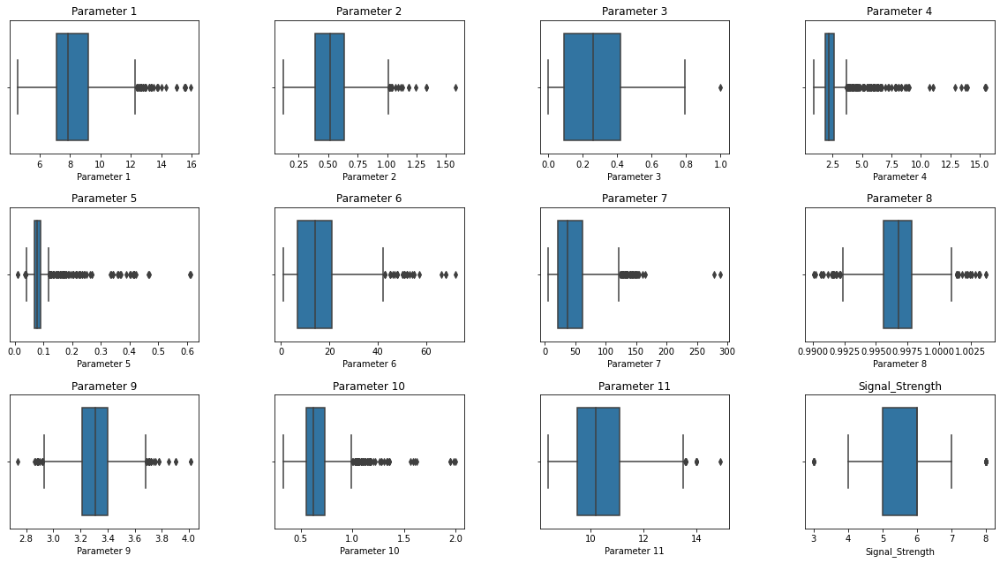

In [34]:
# Checking for outliers

fig, ax = plt.subplots(nrows = 3, ncols = 4, figsize = [20, 10])

plt.subplots_adjust(left=0.125,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)

parameters = sdf.columns

for param, ax in zip(parameters, ax.flatten()):
    sns.boxplot(sdf[param], ax = ax, orient = 'v')
    ax.set_title(param)

We know that the attributes Parameter 1 has high correlation with Parameter 3, 8 & 9. And also Parameter 6 & 7 are highly correlated. Lets treat the outliers for present in these attributes and check if treating outliers will help in model training.

In [35]:
#Checking for outliers in parameters 1, 3, 8, 9

feat = ['Parameter 9', 'Parameter 8', 'Parameter 3']

for c in feat:
    p_one = np.percentile(sdf['Parameter 1'], [25,75])
    p_c = np.percentile(sdf[c], [25,75])
    iqr_one = p_one[1] - p_one[0]
    iqr_c = p_c[1] - p_c[0]
    corrected_one = sdf['Parameter 1'].clip(p_one[0]-1.5*iqr_one, p_one[1]+1.5*iqr_one)
    corrected_c = sdf[c].clip(p_c[0]-1.5*iqr_c, p_c[1]+1.5*iqr_c)
    corr = np.corrcoef(corrected_c,corrected_one)
    corr_1 = np.corrcoef(sdf['Parameter 1'],sdf[c])
    print('\033[1m' + 'Correlation Coefficent of Parameter 1 and ' + c  + '\033[0m')
    print('\nAFTER OUTLIER CORRECTION --->\n\n',corr,'\n\nBEFORE OUTLIER CORRECTION --->\n\n',corr_1,'\n')

Correlation Coefficent of Parameter 1 and Parameter 9

AFTER OUTLIER CORRECTION --->

 [[ 1.         -0.68982419]
 [-0.68982419  1.        ]] 

BEFORE OUTLIER CORRECTION --->

 [[ 1.         -0.68297819]
 [-0.68297819  1.        ]] 

Correlation Coefficent of Parameter 1 and Parameter 8

AFTER OUTLIER CORRECTION --->

 [[1.         0.66807558]
 [0.66807558 1.        ]] 

BEFORE OUTLIER CORRECTION --->

 [[1.         0.66804729]
 [0.66804729 1.        ]] 

Correlation Coefficent of Parameter 1 and Parameter 3

AFTER OUTLIER CORRECTION --->

 [[1.         0.67870411]
 [0.67870411 1.        ]] 

BEFORE OUTLIER CORRECTION --->

 [[1.         0.67170343]
 [0.67170343 1.        ]] 



We can see that the correlation between attributes is almost close to the correlation of these parameters when outliers are present. So removing outliers won't affecting the nature of the information.

In [36]:
#Checking for outliers in parameters 6 & 7

p_six = np.percentile(sdf['Parameter 6'], [25,75])
p_seven = np.percentile(sdf['Parameter 7'], [25,75])
iqr_six = p_six[1] = p_six[0]
iqr_seven = p_seven[1] = p_seven[0]
corrected_six = sdf['Parameter 6'].clip(p_six[0]-1.5*iqr_six, p_six[1]+1.5*iqr_six)
corrected_seven = sdf['Parameter 7'].clip(p_seven[0]-1.5*iqr_seven, p_seven[1]+1.5*iqr_seven)
corr = np.corrcoef(corrected_seven,corrected_six)
corr_1 = np.corrcoef(sdf['Parameter 7'],sdf['Parameter 6'])
print('\033[1m' + 'Correlation Coefficent of Parameter 6 and Parameter 7' + '\033[0m')
print('\nAFTER OUTLIER CORRECTION --->\n\n',corr,'\n\nBEFORE OUTLIER CORRECTION --->\n\n',corr_1,'\n')

Correlation Coefficent of Parameter 6 and Parameter 7

AFTER OUTLIER CORRECTION --->

 [[1.         0.79009917]
 [0.79009917 1.        ]] 

BEFORE OUTLIER CORRECTION --->

 [[1.         0.66766645]
 [0.66766645 1.        ]] 



Here, we can see that the correlation between attributes is increased a little. So removing outliers wont affecting the nature of the information. In most practical circumstances an outlier decreases the value of a correlation coefficient and weakens the regression relationship, but it’s also possible that in some circumstances an outlier may increase a correlation value and improve regression. So, further we will br treating the outliers in the dataset.

In [37]:
#Treating outliers of all the independent columns

for col in sdf.columns[:-1]:
    p = np.percentile(sdf[col], [25, 75])
    iqr = p[1]-p[0]
    sdf.loc[:, col].clip(lower = p[0]-1.5*iqr, upper = p[1]+1.5*iqr, inplace = True)

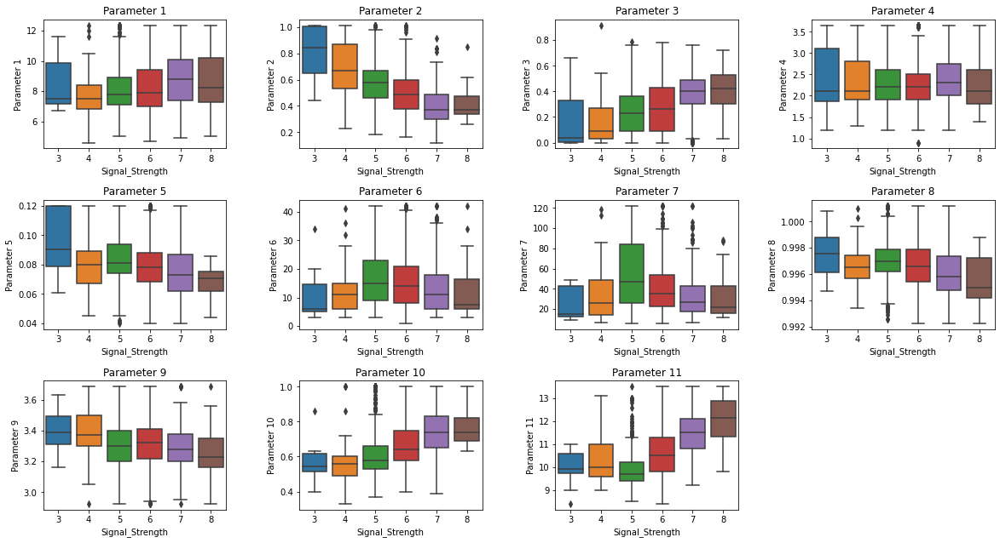

In [38]:
#Bivariate Visualization
#Distribution of independent features with respect to target column

f = []
for cols in sdf.columns:
    f.append(cols)
# # print(len(f))
      
fig, ax = plt.subplots(nrows = 3, ncols = 4, figsize = [20,10])

plt.subplots_adjust(left=0.125,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)

for f, ax in zip(f, ax.flatten()):
    sns.boxplot(x = 'Signal_Strength', y = f, data = sdf, ax = ax)  #
    ax.set_title(f)
    if f == 'Signal_Strength':
        plt.delaxes()

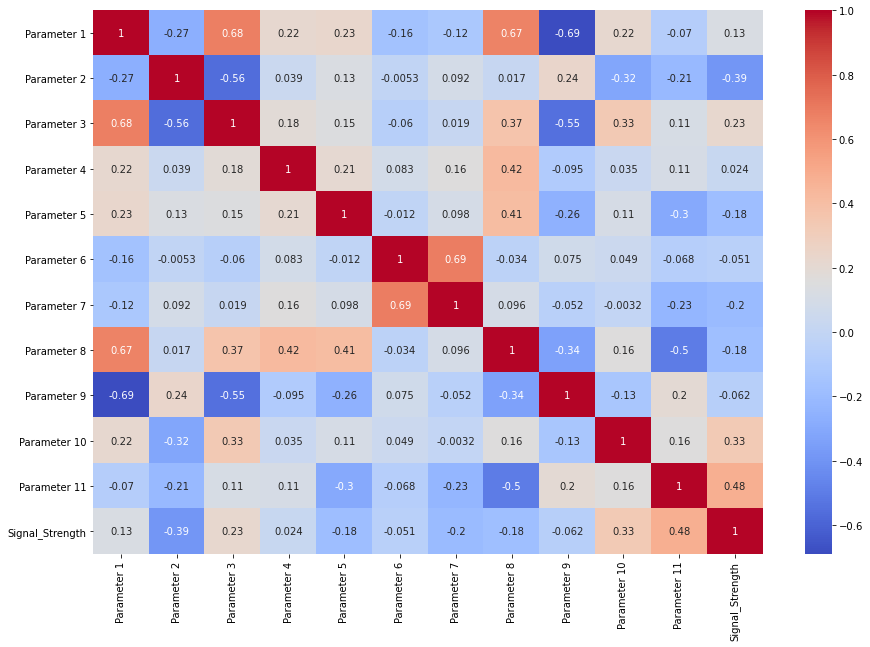

In [39]:
# Checking for the correlation between the attributes

corr = sdf.corr()
plt.subplots(figsize =(15, 10)) 
sns.heatmap(corr,annot=True, cmap='coolwarm')

plt.show()

Since we can consider the high correlation coefficient range value lies between ± 0.50 and ± 1 Parameter 1 is highly correlated with Parameter 3 and Parameter 8, Parameter 9. Parameter 6 and 7 are highly correlated. But since, the correlation is not too high near 0.8 or above not dropping the features.

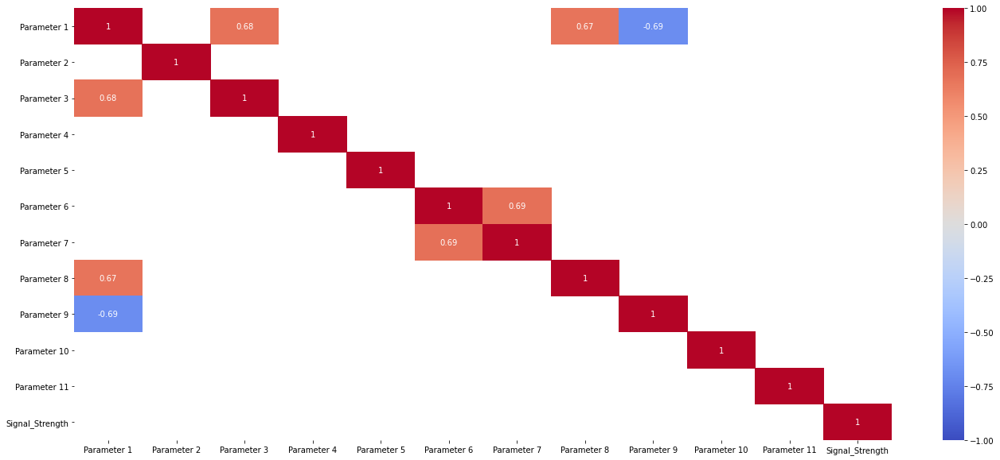

In [40]:
corr_pos = corr.abs()
mask = (corr_pos < 0.65 ) 
fig, ax = plt.subplots(figsize = [23,10])
sns.heatmap(corr, annot = True, vmin = -1, vmax = 1, center = 0, mask = mask, cmap='coolwarm')
plt.show()

In [41]:
sdf['Signal_Strength'].value_counts()    #Value count of the target variable

5    681
6    638
7    199
4     53
8     18
3     10
Name: Signal_Strength, dtype: int64

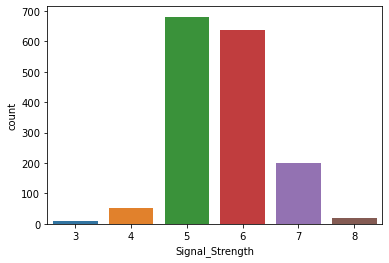

In [42]:
# Displaying the distribution of the target column

sns.countplot(sdf.Signal_Strength)       
plt.show()

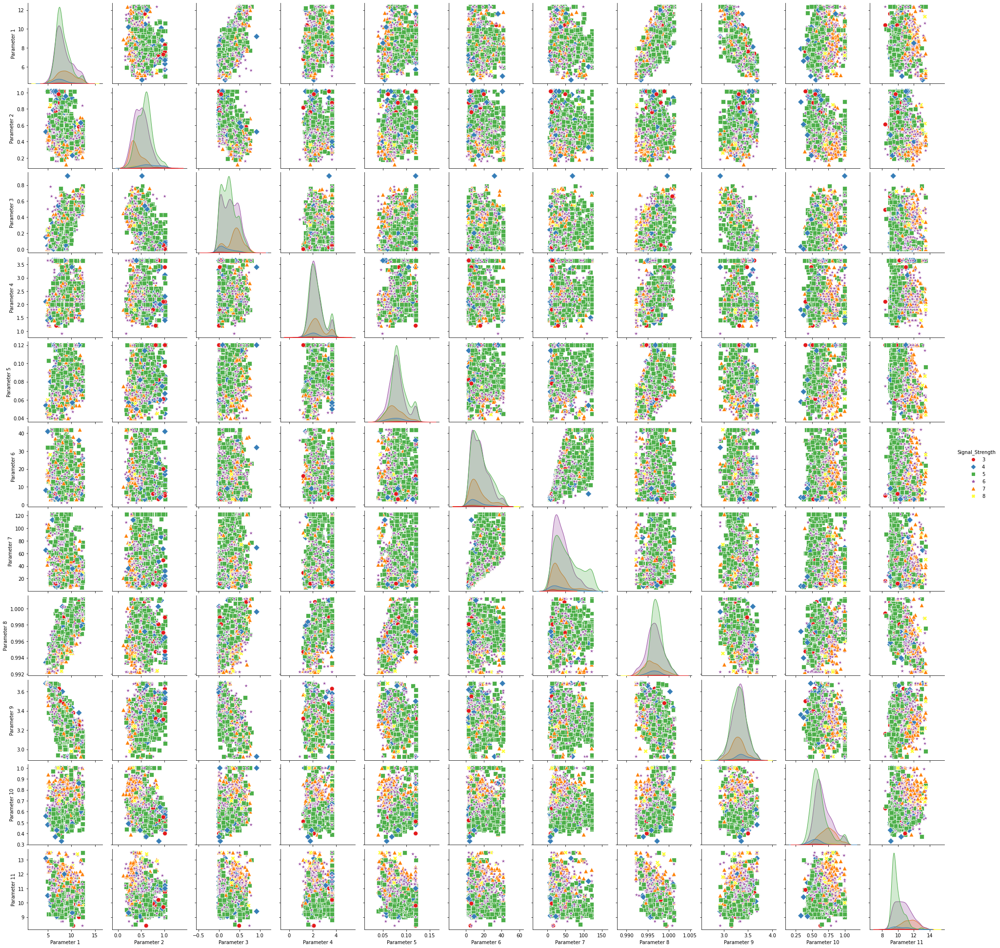

In [43]:
#Multivarate plotting of the data

sns.pairplot(sdf, diag_kind = 'kde', kind='scatter', palette = "Set1", markers = ["o","D","s","*","^","X"], plot_kws={"s": 80}, hue = 'Signal_Strength')
plt.show()

 - Signal strength '5' is the highest in all parameters.
 - Parameter 10 & 11 has considerate amount of 7 signal strength.
 - Parameter 3 has Signal strength 4 plotted above reading 8.0. (extreme values)

## Designing, training, tuning & testing a neural network regressor model

In [44]:
#Scaling

x = sdf.drop(['Signal_Strength'],axis=1)
y = sdf['Signal_Strength']
scaler = StandardScaler().fit(x)
X = scaler.transform(x)

In [45]:
seed = 7
np.random.seed(seed)

In [46]:
# splitting to create test data

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.30, random_state=seed)

In [47]:
#Function for plotting train and test loss of the regressor model

def plot_loss():
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()

In [62]:
#Designing the model for Regressor

def regressor(lr,Lambda):  
    
    global bmodel

    #input layer
    bmodel = Sequential()
    bmodel.add(Dense(300, input_shape=(11,)))

    #Hidden layers
    bmodel.add(Dense(250,activation='relu'))
    bmodel.add(Dense(100,activation='relu'))          
    bmodel.add(Dense(50,activation='relu'))
    
    #Regularization layer
    bmodel.add(Dropout(0.5))           

    #Output Layer
    bmodel.add(Dense(1, activation='relu'))           

    #Compile the model
    bmodel.compile(loss='mean_squared_error', optimizer=tf.keras.optimizers.Adam(lr,Lambda), metrics=['mean_squared_error'])
    
    return bmodel

Starting with small regularization and find learning rate that makes the loss go down.
   - we start with Lambda(small regularization) = 1e-9
   - we start with a small learning rate = 1e-7

In [63]:
regressor(1e-7,1e-7)

#Fit the model
history = bmodel.fit(X_train, y_train, batch_size=500, epochs=5000, verbose=1, validation_data = (X_test, y_test))

Epoch 1/5000
3/3 [==============================] - 0s 40ms/step - loss: 31.2058 - mean_squared_error: 31.2058 - val_loss: 31.7113 - val_mean_squared_error: 31.7113
Epoch 2/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.3125 - mean_squared_error: 31.3125 - val_loss: 31.7108 - val_mean_squared_error: 31.7108
Epoch 3/5000
3/3 [==============================] - 0s 5ms/step - loss: 31.3714 - mean_squared_error: 31.3714 - val_loss: 31.7102 - val_mean_squared_error: 31.7102
Epoch 4/5000
3/3 [==============================] - 0s 11ms/step - loss: 31.3100 - mean_squared_error: 31.3100 - val_loss: 31.7095 - val_mean_squared_error: 31.7095
Epoch 5/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.2650 - mean_squared_error: 31.2650 - val_loss: 31.7089 - val_mean_squared_error: 31.7089
Epoch 6/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.3231 - mean_squared_error: 31.3231 - val_loss: 31.7083 - val_mean_squared_error: 31.7083
Epoch 7/5000
3

3/3 [==============================] - 0s 8ms/step - loss: 31.2027 - mean_squared_error: 31.2027 - val_loss: 31.6489 - val_mean_squared_error: 31.6489
Epoch 100/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.1835 - mean_squared_error: 31.1835 - val_loss: 31.6482 - val_mean_squared_error: 31.6482
Epoch 101/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.2155 - mean_squared_error: 31.2155 - val_loss: 31.6476 - val_mean_squared_error: 31.6476
Epoch 102/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.1990 - mean_squared_error: 31.1990 - val_loss: 31.6470 - val_mean_squared_error: 31.6470
Epoch 103/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.2322 - mean_squared_error: 31.2322 - val_loss: 31.6464 - val_mean_squared_error: 31.6464
Epoch 104/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.1652 - mean_squared_error: 31.1652 - val_loss: 31.6458 - val_mean_squared_error: 31.6458
Epoch 105/5000
3/3 

3/3 [==============================] - 0s 8ms/step - loss: 31.1484 - mean_squared_error: 31.1484 - val_loss: 31.5849 - val_mean_squared_error: 31.5849
Epoch 198/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.1978 - mean_squared_error: 31.1978 - val_loss: 31.5842 - val_mean_squared_error: 31.5842
Epoch 199/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.1160 - mean_squared_error: 31.1160 - val_loss: 31.5835 - val_mean_squared_error: 31.5835
Epoch 200/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.1422 - mean_squared_error: 31.1422 - val_loss: 31.5829 - val_mean_squared_error: 31.5829
Epoch 201/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.1108 - mean_squared_error: 31.1108 - val_loss: 31.5822 - val_mean_squared_error: 31.5822
Epoch 202/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.1785 - mean_squared_error: 31.1785 - val_loss: 31.5815 - val_mean_squared_error: 31.5815
Epoch 203/5000
3/3 

3/3 [==============================] - 0s 5ms/step - loss: 31.0855 - mean_squared_error: 31.0855 - val_loss: 31.5180 - val_mean_squared_error: 31.5180
Epoch 296/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.0087 - mean_squared_error: 31.0087 - val_loss: 31.5173 - val_mean_squared_error: 31.5173
Epoch 297/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.0533 - mean_squared_error: 31.0533 - val_loss: 31.5167 - val_mean_squared_error: 31.5167
Epoch 298/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.2147 - mean_squared_error: 31.2147 - val_loss: 31.5161 - val_mean_squared_error: 31.5161
Epoch 299/5000
3/3 [==============================] - 0s 5ms/step - loss: 31.1274 - mean_squared_error: 31.1274 - val_loss: 31.5154 - val_mean_squared_error: 31.5154
Epoch 300/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.0764 - mean_squared_error: 31.0764 - val_loss: 31.5146 - val_mean_squared_error: 31.5146
Epoch 301/5000
3/3 

3/3 [==============================] - 0s 8ms/step - loss: 31.0610 - mean_squared_error: 31.0610 - val_loss: 31.4497 - val_mean_squared_error: 31.4497
Epoch 394/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.0595 - mean_squared_error: 31.0595 - val_loss: 31.4490 - val_mean_squared_error: 31.4490
Epoch 395/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.1101 - mean_squared_error: 31.1101 - val_loss: 31.4483 - val_mean_squared_error: 31.4483
Epoch 396/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.0346 - mean_squared_error: 31.0346 - val_loss: 31.4475 - val_mean_squared_error: 31.4475
Epoch 397/5000
3/3 [==============================] - 0s 11ms/step - loss: 31.0776 - mean_squared_error: 31.0776 - val_loss: 31.4468 - val_mean_squared_error: 31.4468
Epoch 398/5000
3/3 [==============================] - 0s 11ms/step - loss: 31.0712 - mean_squared_error: 31.0712 - val_loss: 31.4460 - val_mean_squared_error: 31.4460
Epoch 399/5000
3/

Epoch 491/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.9521 - mean_squared_error: 30.9521 - val_loss: 31.3787 - val_mean_squared_error: 31.3787
Epoch 492/5000
3/3 [==============================] - 0s 11ms/step - loss: 30.9470 - mean_squared_error: 30.9470 - val_loss: 31.3780 - val_mean_squared_error: 31.3780
Epoch 493/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.9560 - mean_squared_error: 30.9560 - val_loss: 31.3772 - val_mean_squared_error: 31.3772
Epoch 494/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.9982 - mean_squared_error: 30.9982 - val_loss: 31.3765 - val_mean_squared_error: 31.3765
Epoch 495/5000
3/3 [==============================] - 0s 11ms/step - loss: 30.9795 - mean_squared_error: 30.9795 - val_loss: 31.3758 - val_mean_squared_error: 31.3758
Epoch 496/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.9650 - mean_squared_error: 30.9650 - val_loss: 31.3750 - val_mean_squared_error: 31.3750
Ep

3/3 [==============================] - 0s 8ms/step - loss: 30.9096 - mean_squared_error: 30.9096 - val_loss: 31.3044 - val_mean_squared_error: 31.3044
Epoch 590/5000
3/3 [==============================] - 0s 5ms/step - loss: 30.8773 - mean_squared_error: 30.8773 - val_loss: 31.3036 - val_mean_squared_error: 31.3036
Epoch 591/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.8945 - mean_squared_error: 30.8945 - val_loss: 31.3029 - val_mean_squared_error: 31.3029
Epoch 592/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.8428 - mean_squared_error: 30.8428 - val_loss: 31.3020 - val_mean_squared_error: 31.3020
Epoch 593/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.9432 - mean_squared_error: 30.9432 - val_loss: 31.3012 - val_mean_squared_error: 31.3012
Epoch 594/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.0050 - mean_squared_error: 31.0050 - val_loss: 31.3005 - val_mean_squared_error: 31.3005
Epoch 595/5000
3/3 

3/3 [==============================] - 0s 8ms/step - loss: 30.8558 - mean_squared_error: 30.8558 - val_loss: 31.2266 - val_mean_squared_error: 31.2266
Epoch 688/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.9280 - mean_squared_error: 30.9280 - val_loss: 31.2258 - val_mean_squared_error: 31.2258
Epoch 689/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.8840 - mean_squared_error: 30.8840 - val_loss: 31.2250 - val_mean_squared_error: 31.2250
Epoch 690/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.9076 - mean_squared_error: 30.9076 - val_loss: 31.2242 - val_mean_squared_error: 31.2242
Epoch 691/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.9189 - mean_squared_error: 30.9189 - val_loss: 31.2235 - val_mean_squared_error: 31.2235
Epoch 692/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.9066 - mean_squared_error: 30.9066 - val_loss: 31.2227 - val_mean_squared_error: 31.2227
Epoch 693/5000
3/3 

3/3 [==============================] - 0s 8ms/step - loss: 30.8394 - mean_squared_error: 30.8394 - val_loss: 31.1872 - val_mean_squared_error: 31.1872
Epoch 737/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.7604 - mean_squared_error: 30.7604 - val_loss: 31.1864 - val_mean_squared_error: 31.1864
Epoch 738/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.7939 - mean_squared_error: 30.7939 - val_loss: 31.1855 - val_mean_squared_error: 31.1855
Epoch 739/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.8111 - mean_squared_error: 30.8111 - val_loss: 31.1847 - val_mean_squared_error: 31.1847
Epoch 740/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.7601 - mean_squared_error: 30.7601 - val_loss: 31.1839 - val_mean_squared_error: 31.1839
Epoch 741/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.8010 - mean_squared_error: 30.8010 - val_loss: 31.1830 - val_mean_squared_error: 31.1830
Epoch 742/5000
3/3 

Epoch 834/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.7701 - mean_squared_error: 30.7701 - val_loss: 31.1070 - val_mean_squared_error: 31.1070
Epoch 835/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.7231 - mean_squared_error: 30.7231 - val_loss: 31.1062 - val_mean_squared_error: 31.1062
Epoch 836/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.7041 - mean_squared_error: 30.7041 - val_loss: 31.1054 - val_mean_squared_error: 31.1054
Epoch 837/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.7797 - mean_squared_error: 30.7797 - val_loss: 31.1046 - val_mean_squared_error: 31.1046
Epoch 838/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.7023 - mean_squared_error: 30.7023 - val_loss: 31.1037 - val_mean_squared_error: 31.1037
Epoch 839/5000
3/3 [==============================] - ETA: 0s - loss: 30.4429 - mean_squared_error: 30.44 - 0s 8ms/step - loss: 30.7083 - mean_squared_error: 30.7083 - va

3/3 [==============================] - 0s 8ms/step - loss: 30.6604 - mean_squared_error: 30.6604 - val_loss: 31.0261 - val_mean_squared_error: 31.0261
Epoch 932/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.6954 - mean_squared_error: 30.6954 - val_loss: 31.0252 - val_mean_squared_error: 31.0252
Epoch 933/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.6404 - mean_squared_error: 30.6404 - val_loss: 31.0243 - val_mean_squared_error: 31.0243
Epoch 934/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.6028 - mean_squared_error: 30.6028 - val_loss: 31.0234 - val_mean_squared_error: 31.0234
Epoch 935/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.6563 - mean_squared_error: 30.6563 - val_loss: 31.0226 - val_mean_squared_error: 31.0226
Epoch 936/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.7588 - mean_squared_error: 30.7588 - val_loss: 31.0218 - val_mean_squared_error: 31.0218
Epoch 937/5000
3/3 

3/3 [==============================] - 0s 8ms/step - loss: 30.6325 - mean_squared_error: 30.6325 - val_loss: 30.9418 - val_mean_squared_error: 30.9418
Epoch 1030/5000
3/3 [==============================] - 0s 11ms/step - loss: 30.5729 - mean_squared_error: 30.5729 - val_loss: 30.9409 - val_mean_squared_error: 30.9409
Epoch 1031/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.5834 - mean_squared_error: 30.5834 - val_loss: 30.9401 - val_mean_squared_error: 30.9401
Epoch 1032/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.6262 - mean_squared_error: 30.6262 - val_loss: 30.9392 - val_mean_squared_error: 30.9392
Epoch 1033/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.6127 - mean_squared_error: 30.6127 - val_loss: 30.9384 - val_mean_squared_error: 30.9384
Epoch 1034/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.5933 - mean_squared_error: 30.5933 - val_loss: 30.9375 - val_mean_squared_error: 30.9375
Epoch 1035/50

Epoch 1127/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.4725 - mean_squared_error: 30.4725 - val_loss: 30.8571 - val_mean_squared_error: 30.8571
Epoch 1128/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.4721 - mean_squared_error: 30.4721 - val_loss: 30.8563 - val_mean_squared_error: 30.8563
Epoch 1129/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.4955 - mean_squared_error: 30.4955 - val_loss: 30.8554 - val_mean_squared_error: 30.8554
Epoch 1130/5000
3/3 [==============================] - 0s 11ms/step - loss: 30.6079 - mean_squared_error: 30.6079 - val_loss: 30.8545 - val_mean_squared_error: 30.8545
Epoch 1131/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.4572 - mean_squared_error: 30.4572 - val_loss: 30.8535 - val_mean_squared_error: 30.8535
Epoch 1132/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.5614 - mean_squared_error: 30.5614 - val_loss: 30.8527 - val_mean_squared_error: 30.85

Epoch 1176/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.3625 - mean_squared_error: 30.3625 - val_loss: 30.8140 - val_mean_squared_error: 30.8140
Epoch 1177/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.5312 - mean_squared_error: 30.5312 - val_loss: 30.8131 - val_mean_squared_error: 30.8131
Epoch 1178/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.4358 - mean_squared_error: 30.4358 - val_loss: 30.8122 - val_mean_squared_error: 30.8122
Epoch 1179/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.4863 - mean_squared_error: 30.4863 - val_loss: 30.8114 - val_mean_squared_error: 30.8114
Epoch 1180/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.4337 - mean_squared_error: 30.4337 - val_loss: 30.8105 - val_mean_squared_error: 30.8105
Epoch 1181/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.5316 - mean_squared_error: 30.5316 - val_loss: 30.8097 - val_mean_squared_error: 30.809

Epoch 1225/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.3858 - mean_squared_error: 30.3858 - val_loss: 30.7709 - val_mean_squared_error: 30.7709
Epoch 1226/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.3958 - mean_squared_error: 30.3958 - val_loss: 30.7700 - val_mean_squared_error: 30.7700
Epoch 1227/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.4395 - mean_squared_error: 30.4395 - val_loss: 30.7691 - val_mean_squared_error: 30.7691
Epoch 1228/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.4309 - mean_squared_error: 30.4309 - val_loss: 30.7683 - val_mean_squared_error: 30.7683
Epoch 1229/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.2674 - mean_squared_error: 30.2674 - val_loss: 30.7674 - val_mean_squared_error: 30.7674
Epoch 1230/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.4602 - mean_squared_error: 30.4602 - val_loss: 30.7665 - val_mean_squared_error: 30.766

Epoch 1274/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.3979 - mean_squared_error: 30.3979 - val_loss: 30.7277 - val_mean_squared_error: 30.7277
Epoch 1275/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.4500 - mean_squared_error: 30.4500 - val_loss: 30.7268 - val_mean_squared_error: 30.7268
Epoch 1276/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.4155 - mean_squared_error: 30.4155 - val_loss: 30.7259 - val_mean_squared_error: 30.7259
Epoch 1277/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.4709 - mean_squared_error: 30.4709 - val_loss: 30.7250 - val_mean_squared_error: 30.7250
Epoch 1278/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.4547 - mean_squared_error: 30.4547 - val_loss: 30.7242 - val_mean_squared_error: 30.7242
Epoch 1279/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.4717 - mean_squared_error: 30.4717 - val_loss: 30.7233 - val_mean_squared_error: 30.723

Epoch 1323/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.4028 - mean_squared_error: 30.4028 - val_loss: 30.6846 - val_mean_squared_error: 30.6846
Epoch 1324/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.3836 - mean_squared_error: 30.3836 - val_loss: 30.6838 - val_mean_squared_error: 30.6838
Epoch 1325/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.3439 - mean_squared_error: 30.3439 - val_loss: 30.6829 - val_mean_squared_error: 30.6829
Epoch 1326/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.4509 - mean_squared_error: 30.4509 - val_loss: 30.6820 - val_mean_squared_error: 30.6820
Epoch 1327/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.3712 - mean_squared_error: 30.3712 - val_loss: 30.6811 - val_mean_squared_error: 30.6811
Epoch 1328/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.3882 - mean_squared_error: 30.3882 - val_loss: 30.6802 - val_mean_squared_error: 30.680

Epoch 1420/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.3162 - mean_squared_error: 30.3162 - val_loss: 30.5972 - val_mean_squared_error: 30.5972
Epoch 1421/5000
3/3 [==============================] - 0s 11ms/step - loss: 30.2526 - mean_squared_error: 30.2526 - val_loss: 30.5962 - val_mean_squared_error: 30.5962
Epoch 1422/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.2865 - mean_squared_error: 30.2865 - val_loss: 30.5953 - val_mean_squared_error: 30.5953
Epoch 1423/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.2020 - mean_squared_error: 30.2020 - val_loss: 30.5943 - val_mean_squared_error: 30.5943
Epoch 1424/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.3324 - mean_squared_error: 30.3324 - val_loss: 30.5934 - val_mean_squared_error: 30.5934
Epoch 1425/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.3079 - mean_squared_error: 30.3079 - val_loss: 30.5924 - val_mean_squared_error: 30.59

3/3 [==============================] - 0s 5ms/step - loss: 30.3413 - mean_squared_error: 30.3413 - val_loss: 30.5518 - val_mean_squared_error: 30.5518
Epoch 1470/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.2899 - mean_squared_error: 30.2899 - val_loss: 30.5509 - val_mean_squared_error: 30.5509
Epoch 1471/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.1633 - mean_squared_error: 30.1633 - val_loss: 30.5500 - val_mean_squared_error: 30.5500
Epoch 1472/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.3364 - mean_squared_error: 30.3364 - val_loss: 30.5491 - val_mean_squared_error: 30.5491
Epoch 1473/5000
3/3 [==============================] - 0s 11ms/step - loss: 30.3601 - mean_squared_error: 30.3601 - val_loss: 30.5482 - val_mean_squared_error: 30.5482
Epoch 1474/5000
3/3 [==============================] - 0s 5ms/step - loss: 30.2194 - mean_squared_error: 30.2194 - val_loss: 30.5472 - val_mean_squared_error: 30.5472
Epoch 1475/50

Epoch 1518/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.2339 - mean_squared_error: 30.2339 - val_loss: 30.5064 - val_mean_squared_error: 30.5064
Epoch 1519/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.0700 - mean_squared_error: 30.0700 - val_loss: 30.5055 - val_mean_squared_error: 30.5055
Epoch 1520/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.1251 - mean_squared_error: 30.1251 - val_loss: 30.5046 - val_mean_squared_error: 30.5046
Epoch 1521/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.2117 - mean_squared_error: 30.2117 - val_loss: 30.5037 - val_mean_squared_error: 30.5037
Epoch 1522/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.1737 - mean_squared_error: 30.1737 - val_loss: 30.5027 - val_mean_squared_error: 30.5027
Epoch 1523/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.1589 - mean_squared_error: 30.1589 - val_loss: 30.5018 - val_mean_squared_error: 30.501

Epoch 1567/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.2045 - mean_squared_error: 30.2045 - val_loss: 30.4613 - val_mean_squared_error: 30.4613
Epoch 1568/5000
3/3 [==============================] - ETA: 0s - loss: 29.7025 - mean_squared_error: 29.70 - 0s 8ms/step - loss: 30.1605 - mean_squared_error: 30.1605 - val_loss: 30.4604 - val_mean_squared_error: 30.4604
Epoch 1569/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.2270 - mean_squared_error: 30.2270 - val_loss: 30.4595 - val_mean_squared_error: 30.4595
Epoch 1570/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.1326 - mean_squared_error: 30.1326 - val_loss: 30.4586 - val_mean_squared_error: 30.4586
Epoch 1571/5000
3/3 [==============================] - 0s 11ms/step - loss: 30.1307 - mean_squared_error: 30.1307 - val_loss: 30.4576 - val_mean_squared_error: 30.4576
Epoch 1572/5000
3/3 [==============================] - 0s 11ms/step - loss: 30.1645 - mean_squared_error: 30.1

Epoch 1616/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.2101 - mean_squared_error: 30.2101 - val_loss: 30.4155 - val_mean_squared_error: 30.4155
Epoch 1617/5000
3/3 [==============================] - 0s 5ms/step - loss: 30.1207 - mean_squared_error: 30.1207 - val_loss: 30.4146 - val_mean_squared_error: 30.4146
Epoch 1618/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.1576 - mean_squared_error: 30.1576 - val_loss: 30.4136 - val_mean_squared_error: 30.4136
Epoch 1619/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.1986 - mean_squared_error: 30.1986 - val_loss: 30.4127 - val_mean_squared_error: 30.4127
Epoch 1620/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.1522 - mean_squared_error: 30.1522 - val_loss: 30.4117 - val_mean_squared_error: 30.4117
Epoch 1621/5000
3/3 [==============================] - 0s 11ms/step - loss: 30.1990 - mean_squared_error: 30.1990 - val_loss: 30.4108 - val_mean_squared_error: 30.41

Epoch 1665/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.1003 - mean_squared_error: 30.1003 - val_loss: 30.3700 - val_mean_squared_error: 30.3700
Epoch 1666/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.9922 - mean_squared_error: 29.9922 - val_loss: 30.3690 - val_mean_squared_error: 30.3690
Epoch 1667/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.1016 - mean_squared_error: 30.1016 - val_loss: 30.3681 - val_mean_squared_error: 30.3681
Epoch 1668/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.1642 - mean_squared_error: 30.1642 - val_loss: 30.3672 - val_mean_squared_error: 30.3672
Epoch 1669/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.0386 - mean_squared_error: 30.0386 - val_loss: 30.3662 - val_mean_squared_error: 30.3662
Epoch 1670/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.1399 - mean_squared_error: 30.1399 - val_loss: 30.3653 - val_mean_squared_error: 30.365

Epoch 1714/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.1077 - mean_squared_error: 30.1077 - val_loss: 30.3241 - val_mean_squared_error: 30.3241
Epoch 1715/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.9950 - mean_squared_error: 29.9950 - val_loss: 30.3231 - val_mean_squared_error: 30.3231
Epoch 1716/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.1556 - mean_squared_error: 30.1556 - val_loss: 30.3222 - val_mean_squared_error: 30.3222
Epoch 1717/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.9748 - mean_squared_error: 29.9748 - val_loss: 30.3213 - val_mean_squared_error: 30.3213
Epoch 1718/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.1637 - mean_squared_error: 30.1637 - val_loss: 30.3204 - val_mean_squared_error: 30.3204
Epoch 1719/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.1330 - mean_squared_error: 30.1330 - val_loss: 30.3195 - val_mean_squared_error: 30.319

Epoch 1763/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.0238 - mean_squared_error: 30.0238 - val_loss: 30.2775 - val_mean_squared_error: 30.2775
Epoch 1764/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.9365 - mean_squared_error: 29.9365 - val_loss: 30.2765 - val_mean_squared_error: 30.2765
Epoch 1765/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.0679 - mean_squared_error: 30.0679 - val_loss: 30.2756 - val_mean_squared_error: 30.2756
Epoch 1766/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.1459 - mean_squared_error: 30.1459 - val_loss: 30.2747 - val_mean_squared_error: 30.2747
Epoch 1767/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.1437 - mean_squared_error: 30.1437 - val_loss: 30.2737 - val_mean_squared_error: 30.2737
Epoch 1768/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.0253 - mean_squared_error: 30.0253 - val_loss: 30.2727 - val_mean_squared_error: 30.272

3/3 [==============================] - 0s 8ms/step - loss: 30.0049 - mean_squared_error: 30.0049 - val_loss: 30.2306 - val_mean_squared_error: 30.2306
Epoch 1813/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.0647 - mean_squared_error: 30.0647 - val_loss: 30.2296 - val_mean_squared_error: 30.2296
Epoch 1814/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.9609 - mean_squared_error: 29.9609 - val_loss: 30.2286 - val_mean_squared_error: 30.2286
Epoch 1815/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.9934 - mean_squared_error: 29.9934 - val_loss: 30.2277 - val_mean_squared_error: 30.2277
Epoch 1816/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.9324 - mean_squared_error: 29.9324 - val_loss: 30.2267 - val_mean_squared_error: 30.2267
Epoch 1817/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.0090 - mean_squared_error: 30.0090 - val_loss: 30.2257 - val_mean_squared_error: 30.2257
Epoch 1818/500

Epoch 1861/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.9106 - mean_squared_error: 29.9106 - val_loss: 30.1833 - val_mean_squared_error: 30.1833
Epoch 1862/5000
3/3 [==============================] - 0s 8ms/step - loss: 30.0163 - mean_squared_error: 30.0163 - val_loss: 30.1824 - val_mean_squared_error: 30.1824
Epoch 1863/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.8372 - mean_squared_error: 29.8372 - val_loss: 30.1814 - val_mean_squared_error: 30.1814
Epoch 1864/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.9735 - mean_squared_error: 29.9735 - val_loss: 30.1804 - val_mean_squared_error: 30.1804
Epoch 1865/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.9542 - mean_squared_error: 29.9542 - val_loss: 30.1794 - val_mean_squared_error: 30.1794
Epoch 1866/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.9287 - mean_squared_error: 29.9287 - val_loss: 30.1785 - val_mean_squared_error: 30.178

Epoch 1910/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.9405 - mean_squared_error: 29.9405 - val_loss: 30.1362 - val_mean_squared_error: 30.1362
Epoch 1911/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.9528 - mean_squared_error: 29.9528 - val_loss: 30.1352 - val_mean_squared_error: 30.1352
Epoch 1912/5000
3/3 [==============================] - 0s 11ms/step - loss: 29.8531 - mean_squared_error: 29.8531 - val_loss: 30.1343 - val_mean_squared_error: 30.1343
Epoch 1913/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.9383 - mean_squared_error: 29.9383 - val_loss: 30.1333 - val_mean_squared_error: 30.1333
Epoch 1914/5000
3/3 [==============================] - 0s 11ms/step - loss: 29.9017 - mean_squared_error: 29.9017 - val_loss: 30.1324 - val_mean_squared_error: 30.1324
Epoch 1915/5000
3/3 [==============================] - 0s 11ms/step - loss: 29.9556 - mean_squared_error: 29.9556 - val_loss: 30.1314 - val_mean_squared_error: 30.

Epoch 2007/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.6921 - mean_squared_error: 29.6921 - val_loss: 30.0424 - val_mean_squared_error: 30.0424
Epoch 2008/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.8312 - mean_squared_error: 29.8312 - val_loss: 30.0414 - val_mean_squared_error: 30.0414
Epoch 2009/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.8361 - mean_squared_error: 29.8361 - val_loss: 30.0404 - val_mean_squared_error: 30.0404
Epoch 2010/5000
3/3 [==============================] - 0s 11ms/step - loss: 29.8101 - mean_squared_error: 29.8101 - val_loss: 30.0394 - val_mean_squared_error: 30.0394
Epoch 2011/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.7364 - mean_squared_error: 29.7364 - val_loss: 30.0384 - val_mean_squared_error: 30.0384
Epoch 2012/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.8009 - mean_squared_error: 29.8009 - val_loss: 30.0374 - val_mean_squared_error: 30.03

Epoch 2056/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.6819 - mean_squared_error: 29.6819 - val_loss: 29.9943 - val_mean_squared_error: 29.9943
Epoch 2057/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.8760 - mean_squared_error: 29.8760 - val_loss: 29.9933 - val_mean_squared_error: 29.9933
Epoch 2058/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.8715 - mean_squared_error: 29.8715 - val_loss: 29.9924 - val_mean_squared_error: 29.9924
Epoch 2059/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.6918 - mean_squared_error: 29.6918 - val_loss: 29.9914 - val_mean_squared_error: 29.9914
Epoch 2060/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.6419 - mean_squared_error: 29.6419 - val_loss: 29.9904 - val_mean_squared_error: 29.9904
Epoch 2061/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.7271 - mean_squared_error: 29.7271 - val_loss: 29.9894 - val_mean_squared_error: 29.989

3/3 [==============================] - 0s 8ms/step - loss: 29.7164 - mean_squared_error: 29.7164 - val_loss: 29.9461 - val_mean_squared_error: 29.9461
Epoch 2106/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.7103 - mean_squared_error: 29.7103 - val_loss: 29.9451 - val_mean_squared_error: 29.9451
Epoch 2107/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.8137 - mean_squared_error: 29.8137 - val_loss: 29.9441 - val_mean_squared_error: 29.9441
Epoch 2108/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.7160 - mean_squared_error: 29.7160 - val_loss: 29.9431 - val_mean_squared_error: 29.9431
Epoch 2109/5000
3/3 [==============================] - 0s 11ms/step - loss: 29.7144 - mean_squared_error: 29.7144 - val_loss: 29.9421 - val_mean_squared_error: 29.9421
Epoch 2110/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.7094 - mean_squared_error: 29.7094 - val_loss: 29.9412 - val_mean_squared_error: 29.9412
Epoch 2111/50

3/3 [==============================] - 0s 8ms/step - loss: 29.7210 - mean_squared_error: 29.7210 - val_loss: 29.8494 - val_mean_squared_error: 29.8494
Epoch 2204/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.5404 - mean_squared_error: 29.5404 - val_loss: 29.8484 - val_mean_squared_error: 29.8484
Epoch 2205/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.5909 - mean_squared_error: 29.5909 - val_loss: 29.8473 - val_mean_squared_error: 29.8473
Epoch 2206/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.6790 - mean_squared_error: 29.6790 - val_loss: 29.8464 - val_mean_squared_error: 29.8464
Epoch 2207/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.7873 - mean_squared_error: 29.7873 - val_loss: 29.8455 - val_mean_squared_error: 29.8455
Epoch 2208/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.6579 - mean_squared_error: 29.6579 - val_loss: 29.8445 - val_mean_squared_error: 29.8445
Epoch 2209/500

Epoch 2301/5000
3/3 [==============================] - 0s 11ms/step - loss: 29.5241 - mean_squared_error: 29.5241 - val_loss: 29.7525 - val_mean_squared_error: 29.7525
Epoch 2302/5000
3/3 [==============================] - 0s 11ms/step - loss: 29.5902 - mean_squared_error: 29.5902 - val_loss: 29.7514 - val_mean_squared_error: 29.7514
Epoch 2303/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.5990 - mean_squared_error: 29.5990 - val_loss: 29.7504 - val_mean_squared_error: 29.7504
Epoch 2304/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.5409 - mean_squared_error: 29.5409 - val_loss: 29.7495 - val_mean_squared_error: 29.7495
Epoch 2305/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.4702 - mean_squared_error: 29.4702 - val_loss: 29.7484 - val_mean_squared_error: 29.7484
Epoch 2306/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.6473 - mean_squared_error: 29.6473 - val_loss: 29.7474 - val_mean_squared_error: 29.7

3/3 [==============================] - 0s 5ms/step - loss: 29.4453 - mean_squared_error: 29.4453 - val_loss: 29.7051 - val_mean_squared_error: 29.7051
Epoch 2350/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.5080 - mean_squared_error: 29.5080 - val_loss: 29.7041 - val_mean_squared_error: 29.7041
Epoch 2351/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.5427 - mean_squared_error: 29.5427 - val_loss: 29.7031 - val_mean_squared_error: 29.7031
Epoch 2352/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.4609 - mean_squared_error: 29.4609 - val_loss: 29.7021 - val_mean_squared_error: 29.7021
Epoch 2353/5000
3/3 [==============================] - 0s 5ms/step - loss: 29.5069 - mean_squared_error: 29.5069 - val_loss: 29.7011 - val_mean_squared_error: 29.7011
Epoch 2354/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.4939 - mean_squared_error: 29.4939 - val_loss: 29.7001 - val_mean_squared_error: 29.7001
Epoch 2355/500

Epoch 2398/5000
3/3 [==============================] - 0s 11ms/step - loss: 29.4256 - mean_squared_error: 29.4256 - val_loss: 29.6563 - val_mean_squared_error: 29.6563
Epoch 2399/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.4586 - mean_squared_error: 29.4586 - val_loss: 29.6553 - val_mean_squared_error: 29.6553
Epoch 2400/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.3864 - mean_squared_error: 29.3864 - val_loss: 29.6543 - val_mean_squared_error: 29.6543
Epoch 2401/5000
3/3 [==============================] - 0s 11ms/step - loss: 29.4797 - mean_squared_error: 29.4797 - val_loss: 29.6533 - val_mean_squared_error: 29.6533
Epoch 2402/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.5257 - mean_squared_error: 29.5257 - val_loss: 29.6523 - val_mean_squared_error: 29.6523
Epoch 2403/5000
3/3 [==============================] - 0s 11ms/step - loss: 29.4973 - mean_squared_error: 29.4973 - val_loss: 29.6513 - val_mean_squared_error: 29.

Epoch 2447/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.4951 - mean_squared_error: 29.4951 - val_loss: 29.6076 - val_mean_squared_error: 29.6076
Epoch 2448/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.4289 - mean_squared_error: 29.4289 - val_loss: 29.6067 - val_mean_squared_error: 29.6067
Epoch 2449/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.3721 - mean_squared_error: 29.3721 - val_loss: 29.6056 - val_mean_squared_error: 29.6056
Epoch 2450/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.3413 - mean_squared_error: 29.3413 - val_loss: 29.6046 - val_mean_squared_error: 29.6046
Epoch 2451/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.4507 - mean_squared_error: 29.4507 - val_loss: 29.6037 - val_mean_squared_error: 29.6037
Epoch 2452/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.4653 - mean_squared_error: 29.4653 - val_loss: 29.6027 - val_mean_squared_error: 29.602

Epoch 2496/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.3357 - mean_squared_error: 29.3357 - val_loss: 29.5589 - val_mean_squared_error: 29.5589
Epoch 2497/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.4057 - mean_squared_error: 29.4057 - val_loss: 29.5579 - val_mean_squared_error: 29.5579
Epoch 2498/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.3671 - mean_squared_error: 29.3671 - val_loss: 29.5569 - val_mean_squared_error: 29.5569
Epoch 2499/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.3047 - mean_squared_error: 29.3047 - val_loss: 29.5559 - val_mean_squared_error: 29.5559
Epoch 2500/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.3170 - mean_squared_error: 29.3170 - val_loss: 29.5549 - val_mean_squared_error: 29.5549
Epoch 2501/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.3404 - mean_squared_error: 29.3404 - val_loss: 29.5539 - val_mean_squared_error: 29.553

3/3 [==============================] - 0s 8ms/step - loss: 29.1986 - mean_squared_error: 29.1986 - val_loss: 29.4621 - val_mean_squared_error: 29.4621
Epoch 2594/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.3176 - mean_squared_error: 29.3176 - val_loss: 29.4611 - val_mean_squared_error: 29.4611
Epoch 2595/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.2621 - mean_squared_error: 29.2621 - val_loss: 29.4601 - val_mean_squared_error: 29.4601
Epoch 2596/5000
3/3 [==============================] - 0s 11ms/step - loss: 29.2047 - mean_squared_error: 29.2047 - val_loss: 29.4591 - val_mean_squared_error: 29.4591
Epoch 2597/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.2578 - mean_squared_error: 29.2578 - val_loss: 29.4581 - val_mean_squared_error: 29.4581
Epoch 2598/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.3028 - mean_squared_error: 29.3028 - val_loss: 29.4571 - val_mean_squared_error: 29.4571
Epoch 2599/50

Epoch 2642/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.3382 - mean_squared_error: 29.3382 - val_loss: 29.4131 - val_mean_squared_error: 29.4131
Epoch 2643/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.2398 - mean_squared_error: 29.2398 - val_loss: 29.4121 - val_mean_squared_error: 29.4121
Epoch 2644/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.2095 - mean_squared_error: 29.2095 - val_loss: 29.4111 - val_mean_squared_error: 29.4111
Epoch 2645/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.2684 - mean_squared_error: 29.2684 - val_loss: 29.4101 - val_mean_squared_error: 29.4101
Epoch 2646/5000
3/3 [==============================] - 0s 11ms/step - loss: 29.2408 - mean_squared_error: 29.2408 - val_loss: 29.4090 - val_mean_squared_error: 29.4090
Epoch 2647/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.2895 - mean_squared_error: 29.2895 - val_loss: 29.4080 - val_mean_squared_error: 29.40

3/3 [==============================] - 0s 8ms/step - loss: 29.1765 - mean_squared_error: 29.1765 - val_loss: 29.3637 - val_mean_squared_error: 29.3637
Epoch 2692/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.2182 - mean_squared_error: 29.2182 - val_loss: 29.3627 - val_mean_squared_error: 29.3627
Epoch 2693/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.3211 - mean_squared_error: 29.3211 - val_loss: 29.3617 - val_mean_squared_error: 29.3617
Epoch 2694/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.1862 - mean_squared_error: 29.1862 - val_loss: 29.3607 - val_mean_squared_error: 29.3607
Epoch 2695/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.1979 - mean_squared_error: 29.1979 - val_loss: 29.3597 - val_mean_squared_error: 29.3597
Epoch 2696/5000
3/3 [==============================] - 0s 11ms/step - loss: 29.2140 - mean_squared_error: 29.2140 - val_loss: 29.3587 - val_mean_squared_error: 29.3587
Epoch 2697/50

Epoch 2740/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.2278 - mean_squared_error: 29.2278 - val_loss: 29.3142 - val_mean_squared_error: 29.3142
Epoch 2741/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.2492 - mean_squared_error: 29.2492 - val_loss: 29.3131 - val_mean_squared_error: 29.3131
Epoch 2742/5000
3/3 [==============================] - ETA: 0s - loss: 29.3716 - mean_squared_error: 29.37 - 0s 8ms/step - loss: 29.2835 - mean_squared_error: 29.2835 - val_loss: 29.3121 - val_mean_squared_error: 29.3121
Epoch 2743/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.1439 - mean_squared_error: 29.1439 - val_loss: 29.3111 - val_mean_squared_error: 29.3111
Epoch 2744/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.2275 - mean_squared_error: 29.2275 - val_loss: 29.3101 - val_mean_squared_error: 29.3101
Epoch 2745/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.1544 - mean_squared_error: 29.154

Epoch 2837/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.2208 - mean_squared_error: 29.2208 - val_loss: 29.2163 - val_mean_squared_error: 29.2163
Epoch 2838/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.1136 - mean_squared_error: 29.1136 - val_loss: 29.2153 - val_mean_squared_error: 29.2153
Epoch 2839/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.1431 - mean_squared_error: 29.1431 - val_loss: 29.2143 - val_mean_squared_error: 29.2143
Epoch 2840/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.0544 - mean_squared_error: 29.0544 - val_loss: 29.2133 - val_mean_squared_error: 29.2133
Epoch 2841/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.0895 - mean_squared_error: 29.0895 - val_loss: 29.2123 - val_mean_squared_error: 29.2123
Epoch 2842/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.1140 - mean_squared_error: 29.1140 - val_loss: 29.2113 - val_mean_squared_error: 29.211

Epoch 2886/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.1472 - mean_squared_error: 29.1472 - val_loss: 29.1670 - val_mean_squared_error: 29.1670
Epoch 2887/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.9437 - mean_squared_error: 28.9437 - val_loss: 29.1660 - val_mean_squared_error: 29.1660
Epoch 2888/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.0705 - mean_squared_error: 29.0705 - val_loss: 29.1650 - val_mean_squared_error: 29.1650
Epoch 2889/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.1536 - mean_squared_error: 29.1536 - val_loss: 29.1640 - val_mean_squared_error: 29.1640
Epoch 2890/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.1075 - mean_squared_error: 29.1075 - val_loss: 29.1631 - val_mean_squared_error: 29.1631
Epoch 2891/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.9626 - mean_squared_error: 28.9626 - val_loss: 29.1620 - val_mean_squared_error: 29.162

Epoch 2935/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.0012 - mean_squared_error: 29.0012 - val_loss: 29.1179 - val_mean_squared_error: 29.1179
Epoch 2936/5000
3/3 [==============================] - 0s 11ms/step - loss: 28.9340 - mean_squared_error: 28.9340 - val_loss: 29.1168 - val_mean_squared_error: 29.1168
Epoch 2937/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.9660 - mean_squared_error: 28.9660 - val_loss: 29.1159 - val_mean_squared_error: 29.1159
Epoch 2938/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.9359 - mean_squared_error: 28.9359 - val_loss: 29.1149 - val_mean_squared_error: 29.1149
Epoch 2939/5000
3/3 [==============================] - 0s 8ms/step - loss: 29.0816 - mean_squared_error: 29.0816 - val_loss: 29.1139 - val_mean_squared_error: 29.1139
Epoch 2940/5000
3/3 [==============================] - 0s 11ms/step - loss: 29.1387 - mean_squared_error: 29.1387 - val_loss: 29.1129 - val_mean_squared_error: 29.1

3/3 [==============================] - 0s 8ms/step - loss: 28.7864 - mean_squared_error: 28.7864 - val_loss: 29.0205 - val_mean_squared_error: 29.0205
Epoch 3033/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.8238 - mean_squared_error: 28.8238 - val_loss: 29.0195 - val_mean_squared_error: 29.0195
Epoch 3034/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.9618 - mean_squared_error: 28.9618 - val_loss: 29.0185 - val_mean_squared_error: 29.0185
Epoch 3035/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.9625 - mean_squared_error: 28.9625 - val_loss: 29.0175 - val_mean_squared_error: 29.0175
Epoch 3036/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.9923 - mean_squared_error: 28.9923 - val_loss: 29.0165 - val_mean_squared_error: 29.0165
Epoch 3037/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.8455 - mean_squared_error: 28.8455 - val_loss: 29.0155 - val_mean_squared_error: 29.0155
Epoch 3038/500

3/3 [==============================] - 0s 8ms/step - loss: 28.7329 - mean_squared_error: 28.7329 - val_loss: 28.9214 - val_mean_squared_error: 28.9214
Epoch 3131/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.8460 - mean_squared_error: 28.8460 - val_loss: 28.9204 - val_mean_squared_error: 28.9204
Epoch 3132/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.7437 - mean_squared_error: 28.7437 - val_loss: 28.9194 - val_mean_squared_error: 28.9194
Epoch 3133/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.9354 - mean_squared_error: 28.9354 - val_loss: 28.9184 - val_mean_squared_error: 28.9184
Epoch 3134/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.8509 - mean_squared_error: 28.8509 - val_loss: 28.9174 - val_mean_squared_error: 28.9174
Epoch 3135/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.9149 - mean_squared_error: 28.9149 - val_loss: 28.9164 - val_mean_squared_error: 28.9164
Epoch 3136/500

3/3 [==============================] - 0s 8ms/step - loss: 28.7735 - mean_squared_error: 28.7735 - val_loss: 28.8222 - val_mean_squared_error: 28.8222
Epoch 3229/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.8532 - mean_squared_error: 28.8532 - val_loss: 28.8212 - val_mean_squared_error: 28.8212
Epoch 3230/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.6280 - mean_squared_error: 28.6280 - val_loss: 28.8202 - val_mean_squared_error: 28.8202
Epoch 3231/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.7245 - mean_squared_error: 28.7245 - val_loss: 28.8192 - val_mean_squared_error: 28.8192
Epoch 3232/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.6086 - mean_squared_error: 28.6086 - val_loss: 28.8181 - val_mean_squared_error: 28.8181
Epoch 3233/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.7305 - mean_squared_error: 28.7305 - val_loss: 28.8171 - val_mean_squared_error: 28.8171
Epoch 3234/500

3/3 [==============================] - 0s 8ms/step - loss: 28.6195 - mean_squared_error: 28.6195 - val_loss: 28.7238 - val_mean_squared_error: 28.7238
Epoch 3326/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.6341 - mean_squared_error: 28.6341 - val_loss: 28.7227 - val_mean_squared_error: 28.7227
Epoch 3327/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.5667 - mean_squared_error: 28.5667 - val_loss: 28.7216 - val_mean_squared_error: 28.7216
Epoch 3328/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.5544 - mean_squared_error: 28.5544 - val_loss: 28.7206 - val_mean_squared_error: 28.7206
Epoch 3329/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.6282 - mean_squared_error: 28.6282 - val_loss: 28.7196 - val_mean_squared_error: 28.7196
Epoch 3330/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.6078 - mean_squared_error: 28.6078 - val_loss: 28.7185 - val_mean_squared_error: 28.7185
Epoch 3331/500

Epoch 3423/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.5443 - mean_squared_error: 28.5443 - val_loss: 28.6232 - val_mean_squared_error: 28.6232
Epoch 3424/5000
3/3 [==============================] - 0s 11ms/step - loss: 28.6069 - mean_squared_error: 28.6069 - val_loss: 28.6222 - val_mean_squared_error: 28.6222
Epoch 3425/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.5807 - mean_squared_error: 28.5807 - val_loss: 28.6212 - val_mean_squared_error: 28.6212
Epoch 3426/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.5554 - mean_squared_error: 28.5554 - val_loss: 28.6202 - val_mean_squared_error: 28.6202
Epoch 3427/5000
3/3 [==============================] - 0s 11ms/step - loss: 28.6905 - mean_squared_error: 28.6905 - val_loss: 28.6192 - val_mean_squared_error: 28.6192
Epoch 3428/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.5978 - mean_squared_error: 28.5978 - val_loss: 28.6181 - val_mean_squared_error: 28.6

3/3 [==============================] - 0s 8ms/step - loss: 28.5352 - mean_squared_error: 28.5352 - val_loss: 28.5729 - val_mean_squared_error: 28.5729
Epoch 3473/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.4373 - mean_squared_error: 28.4373 - val_loss: 28.5719 - val_mean_squared_error: 28.5719
Epoch 3474/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.4755 - mean_squared_error: 28.4755 - val_loss: 28.5708 - val_mean_squared_error: 28.5708
Epoch 3475/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.3779 - mean_squared_error: 28.3779 - val_loss: 28.5698 - val_mean_squared_error: 28.5698
Epoch 3476/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.5132 - mean_squared_error: 28.5132 - val_loss: 28.5687 - val_mean_squared_error: 28.5687
Epoch 3477/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.5838 - mean_squared_error: 28.5838 - val_loss: 28.5677 - val_mean_squared_error: 28.5677
Epoch 3478/500

Epoch 3521/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.4642 - mean_squared_error: 28.4642 - val_loss: 28.5226 - val_mean_squared_error: 28.5226
Epoch 3522/5000
3/3 [==============================] - 0s 11ms/step - loss: 28.4112 - mean_squared_error: 28.4112 - val_loss: 28.5216 - val_mean_squared_error: 28.5216
Epoch 3523/5000
3/3 [==============================] - 0s 5ms/step - loss: 28.4451 - mean_squared_error: 28.4451 - val_loss: 28.5206 - val_mean_squared_error: 28.5206
Epoch 3524/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.5316 - mean_squared_error: 28.5316 - val_loss: 28.5195 - val_mean_squared_error: 28.5195
Epoch 3525/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.4877 - mean_squared_error: 28.4877 - val_loss: 28.5185 - val_mean_squared_error: 28.5185
Epoch 3526/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.3891 - mean_squared_error: 28.3891 - val_loss: 28.5174 - val_mean_squared_error: 28.51

3/3 [==============================] - 0s 8ms/step - loss: 28.3956 - mean_squared_error: 28.3956 - val_loss: 28.4731 - val_mean_squared_error: 28.4731
Epoch 3570/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.3686 - mean_squared_error: 28.3686 - val_loss: 28.4721 - val_mean_squared_error: 28.4721
Epoch 3571/5000
3/3 [==============================] - 0s 5ms/step - loss: 28.4381 - mean_squared_error: 28.4381 - val_loss: 28.4711 - val_mean_squared_error: 28.4711
Epoch 3572/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.2801 - mean_squared_error: 28.2801 - val_loss: 28.4700 - val_mean_squared_error: 28.4700
Epoch 3573/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.5954 - mean_squared_error: 28.5954 - val_loss: 28.4690 - val_mean_squared_error: 28.4690
Epoch 3574/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.4485 - mean_squared_error: 28.4485 - val_loss: 28.4679 - val_mean_squared_error: 28.4679
Epoch 3575/500

3/3 [==============================] - 0s 8ms/step - loss: 28.4200 - mean_squared_error: 28.4200 - val_loss: 28.3730 - val_mean_squared_error: 28.3730
Epoch 3667/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.3019 - mean_squared_error: 28.3019 - val_loss: 28.3720 - val_mean_squared_error: 28.3720
Epoch 3668/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.4296 - mean_squared_error: 28.4296 - val_loss: 28.3709 - val_mean_squared_error: 28.3709
Epoch 3669/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.4868 - mean_squared_error: 28.4868 - val_loss: 28.3699 - val_mean_squared_error: 28.3699
Epoch 3670/5000
3/3 [==============================] - 0s 5ms/step - loss: 28.3495 - mean_squared_error: 28.3495 - val_loss: 28.3689 - val_mean_squared_error: 28.3689
Epoch 3671/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.2600 - mean_squared_error: 28.2600 - val_loss: 28.3678 - val_mean_squared_error: 28.3678
Epoch 3672/500

Epoch 3715/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.2414 - mean_squared_error: 28.2414 - val_loss: 28.3224 - val_mean_squared_error: 28.3224
Epoch 3716/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.2828 - mean_squared_error: 28.2828 - val_loss: 28.3214 - val_mean_squared_error: 28.3214
Epoch 3717/5000
3/3 [==============================] - 0s 5ms/step - loss: 28.2505 - mean_squared_error: 28.2505 - val_loss: 28.3203 - val_mean_squared_error: 28.3203
Epoch 3718/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.2673 - mean_squared_error: 28.2673 - val_loss: 28.3193 - val_mean_squared_error: 28.3193
Epoch 3719/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.1728 - mean_squared_error: 28.1728 - val_loss: 28.3182 - val_mean_squared_error: 28.3182
Epoch 3720/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.1041 - mean_squared_error: 28.1041 - val_loss: 28.3172 - val_mean_squared_error: 28.317

Epoch 3764/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.2508 - mean_squared_error: 28.2508 - val_loss: 28.2717 - val_mean_squared_error: 28.2717
Epoch 3765/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.2354 - mean_squared_error: 28.2354 - val_loss: 28.2707 - val_mean_squared_error: 28.2707
Epoch 3766/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.3113 - mean_squared_error: 28.3113 - val_loss: 28.2696 - val_mean_squared_error: 28.2696
Epoch 3767/5000
3/3 [==============================] - 0s 11ms/step - loss: 28.2757 - mean_squared_error: 28.2757 - val_loss: 28.2686 - val_mean_squared_error: 28.2686
Epoch 3768/5000
3/3 [==============================] - 0s 11ms/step - loss: 28.1875 - mean_squared_error: 28.1875 - val_loss: 28.2675 - val_mean_squared_error: 28.2675
Epoch 3769/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.1743 - mean_squared_error: 28.1743 - val_loss: 28.2665 - val_mean_squared_error: 28.2

3/3 [==============================] - 0s 5ms/step - loss: 28.2050 - mean_squared_error: 28.2050 - val_loss: 28.2209 - val_mean_squared_error: 28.2209
Epoch 3814/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.2675 - mean_squared_error: 28.2675 - val_loss: 28.2199 - val_mean_squared_error: 28.2199
Epoch 3815/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.1594 - mean_squared_error: 28.1594 - val_loss: 28.2189 - val_mean_squared_error: 28.2189
Epoch 3816/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.2793 - mean_squared_error: 28.2793 - val_loss: 28.2179 - val_mean_squared_error: 28.2179
Epoch 3817/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.0989 - mean_squared_error: 28.0989 - val_loss: 28.2169 - val_mean_squared_error: 28.2169
Epoch 3818/5000
3/3 [==============================] - 0s 11ms/step - loss: 28.1636 - mean_squared_error: 28.1636 - val_loss: 28.2158 - val_mean_squared_error: 28.2158
Epoch 3819/50

Epoch 3862/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.1464 - mean_squared_error: 28.1464 - val_loss: 28.1705 - val_mean_squared_error: 28.1705
Epoch 3863/5000
3/3 [==============================] - 0s 5ms/step - loss: 28.1326 - mean_squared_error: 28.1326 - val_loss: 28.1695 - val_mean_squared_error: 28.1695
Epoch 3864/5000
3/3 [==============================] - 0s 11ms/step - loss: 28.2839 - mean_squared_error: 28.2839 - val_loss: 28.1684 - val_mean_squared_error: 28.1684
Epoch 3865/5000
3/3 [==============================] - ETA: 0s - loss: 28.3055 - mean_squared_error: 28.30 - 0s 8ms/step - loss: 28.1345 - mean_squared_error: 28.1345 - val_loss: 28.1674 - val_mean_squared_error: 28.1674
Epoch 3866/5000
3/3 [==============================] - 0s 5ms/step - loss: 28.1981 - mean_squared_error: 28.1981 - val_loss: 28.1664 - val_mean_squared_error: 28.1664
Epoch 3867/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.2297 - mean_squared_error: 28.22

Epoch 3959/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.0447 - mean_squared_error: 28.0447 - val_loss: 28.0707 - val_mean_squared_error: 28.0707
Epoch 3960/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.0388 - mean_squared_error: 28.0388 - val_loss: 28.0696 - val_mean_squared_error: 28.0696
Epoch 3961/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.0781 - mean_squared_error: 28.0781 - val_loss: 28.0686 - val_mean_squared_error: 28.0686
Epoch 3962/5000
3/3 [==============================] - 0s 11ms/step - loss: 28.0752 - mean_squared_error: 28.0752 - val_loss: 28.0676 - val_mean_squared_error: 28.0676
Epoch 3963/5000
3/3 [==============================] - 0s 11ms/step - loss: 28.1698 - mean_squared_error: 28.1698 - val_loss: 28.0666 - val_mean_squared_error: 28.0666
Epoch 3964/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.0370 - mean_squared_error: 28.0370 - val_loss: 28.0656 - val_mean_squared_error: 28.0

3/3 [==============================] - 0s 8ms/step - loss: 27.8967 - mean_squared_error: 27.8967 - val_loss: 28.0204 - val_mean_squared_error: 28.0204
Epoch 4009/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.0229 - mean_squared_error: 28.0229 - val_loss: 28.0194 - val_mean_squared_error: 28.0194
Epoch 4010/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.1400 - mean_squared_error: 28.1400 - val_loss: 28.0183 - val_mean_squared_error: 28.0183
Epoch 4011/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.8848 - mean_squared_error: 27.8848 - val_loss: 28.0173 - val_mean_squared_error: 28.0173
Epoch 4012/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.9958 - mean_squared_error: 27.9958 - val_loss: 28.0163 - val_mean_squared_error: 28.0163
Epoch 4013/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.0231 - mean_squared_error: 28.0231 - val_loss: 28.0152 - val_mean_squared_error: 28.0152
Epoch 4014/500

3/3 [==============================] - 0s 8ms/step - loss: 27.7743 - mean_squared_error: 27.7743 - val_loss: 27.9195 - val_mean_squared_error: 27.9195
Epoch 4107/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.0984 - mean_squared_error: 28.0984 - val_loss: 27.9185 - val_mean_squared_error: 27.9185
Epoch 4108/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.9979 - mean_squared_error: 27.9979 - val_loss: 27.9175 - val_mean_squared_error: 27.9175
Epoch 4109/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.9643 - mean_squared_error: 27.9643 - val_loss: 27.9164 - val_mean_squared_error: 27.9164
Epoch 4110/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.7640 - mean_squared_error: 27.7640 - val_loss: 27.9154 - val_mean_squared_error: 27.9154
Epoch 4111/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.0539 - mean_squared_error: 28.0539 - val_loss: 27.9143 - val_mean_squared_error: 27.9143
Epoch 4112/500

Epoch 4204/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.7975 - mean_squared_error: 27.7975 - val_loss: 27.8188 - val_mean_squared_error: 27.8188
Epoch 4205/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.7858 - mean_squared_error: 27.7858 - val_loss: 27.8177 - val_mean_squared_error: 27.8177
Epoch 4206/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.8158 - mean_squared_error: 27.8158 - val_loss: 27.8167 - val_mean_squared_error: 27.8167
Epoch 4207/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.8166 - mean_squared_error: 27.8166 - val_loss: 27.8157 - val_mean_squared_error: 27.8157
Epoch 4208/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.8520 - mean_squared_error: 27.8520 - val_loss: 27.8146 - val_mean_squared_error: 27.8146
Epoch 4209/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.9065 - mean_squared_error: 27.9065 - val_loss: 27.8136 - val_mean_squared_error: 27.813

Epoch 4253/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.8807 - mean_squared_error: 27.8807 - val_loss: 27.7683 - val_mean_squared_error: 27.7683
Epoch 4254/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.6925 - mean_squared_error: 27.6925 - val_loss: 27.7673 - val_mean_squared_error: 27.7673
Epoch 4255/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.7404 - mean_squared_error: 27.7404 - val_loss: 27.7663 - val_mean_squared_error: 27.7663
Epoch 4256/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.7501 - mean_squared_error: 27.7501 - val_loss: 27.7652 - val_mean_squared_error: 27.7652
Epoch 4257/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.7898 - mean_squared_error: 27.7898 - val_loss: 27.7642 - val_mean_squared_error: 27.7642
Epoch 4258/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.7197 - mean_squared_error: 27.7197 - val_loss: 27.7632 - val_mean_squared_error: 27.763

3/3 [==============================] - 0s 8ms/step - loss: 27.7168 - mean_squared_error: 27.7168 - val_loss: 27.7178 - val_mean_squared_error: 27.7178
Epoch 4303/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.8933 - mean_squared_error: 27.8933 - val_loss: 27.7168 - val_mean_squared_error: 27.7168
Epoch 4304/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.8134 - mean_squared_error: 27.8134 - val_loss: 27.7158 - val_mean_squared_error: 27.7158
Epoch 4305/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.5996 - mean_squared_error: 27.5996 - val_loss: 27.7148 - val_mean_squared_error: 27.7148
Epoch 4306/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.6848 - mean_squared_error: 27.6848 - val_loss: 27.7137 - val_mean_squared_error: 27.7137
Epoch 4307/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.7775 - mean_squared_error: 27.7775 - val_loss: 27.7126 - val_mean_squared_error: 27.7126
Epoch 4308/500

Epoch 4400/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.5378 - mean_squared_error: 27.5378 - val_loss: 27.6170 - val_mean_squared_error: 27.6170
Epoch 4401/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.5919 - mean_squared_error: 27.5919 - val_loss: 27.6159 - val_mean_squared_error: 27.6159
Epoch 4402/5000
3/3 [==============================] - 0s 11ms/step - loss: 27.6570 - mean_squared_error: 27.6570 - val_loss: 27.6149 - val_mean_squared_error: 27.6149
Epoch 4403/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.7228 - mean_squared_error: 27.7228 - val_loss: 27.6138 - val_mean_squared_error: 27.6138
Epoch 4404/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.7180 - mean_squared_error: 27.7180 - val_loss: 27.6128 - val_mean_squared_error: 27.6128
Epoch 4405/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.5687 - mean_squared_error: 27.5687 - val_loss: 27.6118 - val_mean_squared_error: 27.61

3/3 [==============================] - 0s 11ms/step - loss: 27.4867 - mean_squared_error: 27.4867 - val_loss: 27.5172 - val_mean_squared_error: 27.5172
Epoch 4498/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.5328 - mean_squared_error: 27.5328 - val_loss: 27.5162 - val_mean_squared_error: 27.5162
Epoch 4499/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.5184 - mean_squared_error: 27.5184 - val_loss: 27.5152 - val_mean_squared_error: 27.5152
Epoch 4500/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.5613 - mean_squared_error: 27.5613 - val_loss: 27.5141 - val_mean_squared_error: 27.5141
Epoch 4501/5000
3/3 [==============================] - ETA: 0s - loss: 27.7203 - mean_squared_error: 27.72 - 0s 8ms/step - loss: 27.5622 - mean_squared_error: 27.5622 - val_loss: 27.5131 - val_mean_squared_error: 27.5131
Epoch 4502/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.4891 - mean_squared_error: 27.4891 - val_loss: 2

Epoch 4546/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.4712 - mean_squared_error: 27.4712 - val_loss: 27.4669 - val_mean_squared_error: 27.4669
Epoch 4547/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.5159 - mean_squared_error: 27.5159 - val_loss: 27.4659 - val_mean_squared_error: 27.4659
Epoch 4548/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.5290 - mean_squared_error: 27.5290 - val_loss: 27.4648 - val_mean_squared_error: 27.4648
Epoch 4549/5000
3/3 [==============================] - ETA: 0s - loss: 27.8593 - mean_squared_error: 27.85 - 0s 8ms/step - loss: 27.5180 - mean_squared_error: 27.5180 - val_loss: 27.4638 - val_mean_squared_error: 27.4638
Epoch 4550/5000
3/3 [==============================] - 0s 11ms/step - loss: 27.5897 - mean_squared_error: 27.5897 - val_loss: 27.4628 - val_mean_squared_error: 27.4628
Epoch 4551/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.4367 - mean_squared_error: 27.43

3/3 [==============================] - 0s 8ms/step - loss: 27.4059 - mean_squared_error: 27.4059 - val_loss: 27.4177 - val_mean_squared_error: 27.4177
Epoch 4595/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.4939 - mean_squared_error: 27.4939 - val_loss: 27.4167 - val_mean_squared_error: 27.4167
Epoch 4596/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.5140 - mean_squared_error: 27.5140 - val_loss: 27.4156 - val_mean_squared_error: 27.4156
Epoch 4597/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.2748 - mean_squared_error: 27.2748 - val_loss: 27.4146 - val_mean_squared_error: 27.4146
Epoch 4598/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.5150 - mean_squared_error: 27.5150 - val_loss: 27.4136 - val_mean_squared_error: 27.4136
Epoch 4599/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.4308 - mean_squared_error: 27.4308 - val_loss: 27.4126 - val_mean_squared_error: 27.4126
Epoch 4600/500

Epoch 4643/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.2620 - mean_squared_error: 27.2620 - val_loss: 27.3670 - val_mean_squared_error: 27.3670
Epoch 4644/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.4871 - mean_squared_error: 27.4871 - val_loss: 27.3660 - val_mean_squared_error: 27.3660
Epoch 4645/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.3731 - mean_squared_error: 27.3731 - val_loss: 27.3650 - val_mean_squared_error: 27.3650
Epoch 4646/5000
3/3 [==============================] - 0s 5ms/step - loss: 27.3961 - mean_squared_error: 27.3961 - val_loss: 27.3639 - val_mean_squared_error: 27.3639
Epoch 4647/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.3502 - mean_squared_error: 27.3502 - val_loss: 27.3629 - val_mean_squared_error: 27.3629
Epoch 4648/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.5021 - mean_squared_error: 27.5021 - val_loss: 27.3619 - val_mean_squared_error: 27.361

3/3 [==============================] - 0s 8ms/step - loss: 27.3788 - mean_squared_error: 27.3788 - val_loss: 27.3166 - val_mean_squared_error: 27.3166
Epoch 4693/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.2559 - mean_squared_error: 27.2559 - val_loss: 27.3156 - val_mean_squared_error: 27.3156
Epoch 4694/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.3906 - mean_squared_error: 27.3906 - val_loss: 27.3145 - val_mean_squared_error: 27.3145
Epoch 4695/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.3438 - mean_squared_error: 27.3438 - val_loss: 27.3135 - val_mean_squared_error: 27.3135
Epoch 4696/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.3142 - mean_squared_error: 27.3142 - val_loss: 27.3125 - val_mean_squared_error: 27.3125
Epoch 4697/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.2846 - mean_squared_error: 27.2846 - val_loss: 27.3115 - val_mean_squared_error: 27.3115
Epoch 4698/500

3/3 [==============================] - 0s 8ms/step - loss: 27.3290 - mean_squared_error: 27.3290 - val_loss: 27.2154 - val_mean_squared_error: 27.2154
Epoch 4791/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.2043 - mean_squared_error: 27.2043 - val_loss: 27.2143 - val_mean_squared_error: 27.2143
Epoch 4792/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.1356 - mean_squared_error: 27.1356 - val_loss: 27.2133 - val_mean_squared_error: 27.2133
Epoch 4793/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.2238 - mean_squared_error: 27.2238 - val_loss: 27.2122 - val_mean_squared_error: 27.2122
Epoch 4794/5000
3/3 [==============================] - 0s 5ms/step - loss: 27.3219 - mean_squared_error: 27.3219 - val_loss: 27.2112 - val_mean_squared_error: 27.2112
Epoch 4795/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.2717 - mean_squared_error: 27.2717 - val_loss: 27.2102 - val_mean_squared_error: 27.2102
Epoch 4796/500

Epoch 4888/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.2190 - mean_squared_error: 27.2190 - val_loss: 27.1144 - val_mean_squared_error: 27.1144
Epoch 4889/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.1310 - mean_squared_error: 27.1310 - val_loss: 27.1134 - val_mean_squared_error: 27.1134
Epoch 4890/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.1933 - mean_squared_error: 27.1933 - val_loss: 27.1123 - val_mean_squared_error: 27.1123
Epoch 4891/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.1999 - mean_squared_error: 27.1999 - val_loss: 27.1113 - val_mean_squared_error: 27.1113
Epoch 4892/5000
3/3 [==============================] - 0s 11ms/step - loss: 27.2520 - mean_squared_error: 27.2520 - val_loss: 27.1103 - val_mean_squared_error: 27.1103
Epoch 4893/5000
3/3 [==============================] - 0s 11ms/step - loss: 27.2859 - mean_squared_error: 27.2859 - val_loss: 27.1093 - val_mean_squared_error: 27.1

Epoch 4937/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.0426 - mean_squared_error: 27.0426 - val_loss: 27.0637 - val_mean_squared_error: 27.0637
Epoch 4938/5000
3/3 [==============================] - 0s 11ms/step - loss: 27.0668 - mean_squared_error: 27.0668 - val_loss: 27.0627 - val_mean_squared_error: 27.0627
Epoch 4939/5000
3/3 [==============================] - 0s 8ms/step - loss: 26.9569 - mean_squared_error: 26.9569 - val_loss: 27.0617 - val_mean_squared_error: 27.0617
Epoch 4940/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.0398 - mean_squared_error: 27.0398 - val_loss: 27.0606 - val_mean_squared_error: 27.0606
Epoch 4941/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.2039 - mean_squared_error: 27.2039 - val_loss: 27.0596 - val_mean_squared_error: 27.0596
Epoch 4942/5000
3/3 [==============================] - 0s 11ms/step - loss: 27.1735 - mean_squared_error: 27.1735 - val_loss: 27.0586 - val_mean_squared_error: 27.0

3/3 [==============================] - 0s 8ms/step - loss: 26.9497 - mean_squared_error: 26.9497 - val_loss: 27.0131 - val_mean_squared_error: 27.0131
Epoch 4987/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.1431 - mean_squared_error: 27.1431 - val_loss: 27.0120 - val_mean_squared_error: 27.0120
Epoch 4988/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.0926 - mean_squared_error: 27.0926 - val_loss: 27.0110 - val_mean_squared_error: 27.0110
Epoch 4989/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.0367 - mean_squared_error: 27.0367 - val_loss: 27.0100 - val_mean_squared_error: 27.0100
Epoch 4990/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.1687 - mean_squared_error: 27.1687 - val_loss: 27.0089 - val_mean_squared_error: 27.0089
Epoch 4991/5000
3/3 [==============================] - 0s 8ms/step - loss: 26.9985 - mean_squared_error: 26.9985 - val_loss: 27.0079 - val_mean_squared_error: 27.0079
Epoch 4992/500

Loss does not show a significant change. Learning rate is probably too low.

In [64]:
#Checking for MSE

bmodel.evaluate(X_test, y_test)          

15/15 [==============================] - ETA: 0s - loss: 26.7180 - mean_squared_error: 26.71 - 0s 2ms/step - loss: 26.9987 - mean_squared_error: 26.9987


[26.99869155883789, 26.99869155883789]

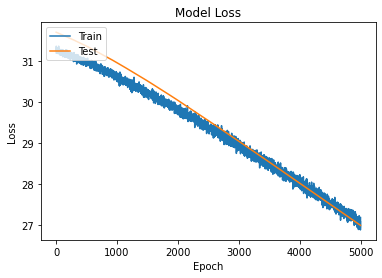

In [65]:
plot_loss()

Now increasing the learning rate to a larger value of 1e6 and lambda to 1e-6
 - Learning rate lr = 1e6
 - Regularization lambda = 1e-6

In [66]:
regressor(1e6,1e-6)
history = bmodel.fit(X_train, y_train, batch_size=500, epochs=5000, verbose=1, validation_data = (X_test, y_test))

Epoch 1/5000
3/3 [==============================] - 0s 40ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 5/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 6/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 7/5000
3/3 [==============================] - 0s 5ms/step - loss: nan - mean_squared_error: nan - val_los

3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 56/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 57/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 58/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 59/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 60/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 61/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan

Epoch 110/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 111/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 112/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 113/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 114/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 115/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 116/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 219/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 220/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 221/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 222/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 223/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 224/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss:

Epoch 327/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 328/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 329/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 330/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 331/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 332/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 333/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: 

Epoch 381/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 382/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 383/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 384/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 385/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 386/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 387/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_erro

Epoch 490/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 491/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 492/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 493/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 494/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 495/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 496/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: 

3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 599/5000
3/3 [==============================] - 0s 5ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 600/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 601/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 602/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 603/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 604/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss

Epoch 653/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 654/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 655/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 656/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 657/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 658/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 659/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: 

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 762/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 763/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 764/5000
3/3 [==============================] - 0s 5ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 765/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 766/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 767/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss

Epoch 816/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 817/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 818/5000
3/3 [==============================] - ETA: 0s - loss: nan - mean_squared_error: n - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 819/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 820/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 821/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 822/5000
3/3 [==============================] - 

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 924/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 925/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 926/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 927/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 928/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 929/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss:

Epoch 978/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 979/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 980/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 981/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 982/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 983/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 984/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error:

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1033/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1034/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1035/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1036/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1037/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1038/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - va

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1141/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1142/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1143/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1144/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1145/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1146/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val

Epoch 1248/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1249/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1250/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1251/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1252/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1253/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1254/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1356/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1357/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1358/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1359/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1360/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1361/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val

Epoch 1409/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1410/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1411/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1412/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1413/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1414/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1415/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_square

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1518/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1519/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1520/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1521/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1522/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1523/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - va

Epoch 1625/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1626/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1627/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1628/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1629/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1630/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1631/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_

3/3 [==============================] - 0s 5ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1733/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1734/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1735/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1736/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1737/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1738/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - va

Epoch 1840/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1841/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1842/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1843/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1844/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1845/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1846/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1949/5000
3/3 [==============================] - 0s 5ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1950/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1951/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1952/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1953/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 1954/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2003/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2004/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2005/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2006/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2007/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2008/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2057/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2058/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2059/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2060/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2061/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2062/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val

Epoch 2110/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2111/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2112/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2113/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2114/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2115/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2116/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared

3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2218/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2219/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2220/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2221/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2222/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2223/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - v

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2326/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2327/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2328/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2329/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2330/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2331/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - va

Epoch 2433/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2434/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2435/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2436/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2437/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2438/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2439/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2542/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2543/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2544/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2545/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2546/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2547/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - 

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2650/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2651/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2652/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2653/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2654/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2655/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - va

Epoch 2756/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2757/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2758/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2759/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2760/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2761/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2762/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squar

Epoch 2810/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2811/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2812/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2813/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2814/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2815/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2816/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_

Epoch 2864/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2865/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2866/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2867/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2868/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2869/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2870/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2973/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2974/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2975/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2976/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2977/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 2978/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3081/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3082/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3083/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3084/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3085/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3086/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3135/5000
3/3 [==============================] - ETA: 0s - loss: nan - mean_squared_error: n - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3136/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3137/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3138/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3139/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3140/5000
3/3 [==============================] - 0s 8ms/

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3188/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3189/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3190/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3191/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3192/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3193/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3296/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3297/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3298/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3299/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3300/5000
3/3 [==============================] - ETA: 0s - loss: nan - mean_squared_error: n - 0s 5ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3301/5000
3/3 [==============================] - 0s 11ms/

Epoch 3401/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3402/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3403/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3404/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3405/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3406/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3407/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squar

Epoch 3455/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3456/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3457/5000
3/3 [==============================] - 0s 5ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3458/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3459/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3460/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3461/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared

Epoch 3562/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3563/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3564/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3565/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3566/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3567/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3568/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3670/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3671/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3672/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3673/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3674/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3675/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3724/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3725/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3726/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3727/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3728/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3729/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3778/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3779/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3780/5000
3/3 [==============================] - 0s 5ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3781/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3782/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3783/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - v

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3886/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3887/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3888/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3889/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3890/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3891/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3994/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3995/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3996/5000
3/3 [==============================] - 0s 5ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3997/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3998/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 3999/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4102/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4103/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4104/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4105/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4106/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4107/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - va

Epoch 4155/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4156/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4157/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4158/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4159/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4160/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4161/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4263/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4264/5000
3/3 [==============================] - ETA: 0s - loss: nan - mean_squared_error: n - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4265/5000
3/3 [==============================] - 0s 5ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4266/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4267/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4268/5000
3/3 [==============================] - 0s 8ms/st

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4317/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4318/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4319/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4320/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4321/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4322/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val

Epoch 4423/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4424/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4425/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4426/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4427/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4428/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4429/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_square

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4532/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4533/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4534/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4535/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4536/5000
3/3 [==============================] - 0s 5ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4537/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4586/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4587/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4588/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4589/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4590/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4591/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - va

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4640/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4641/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4642/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4643/5000
3/3 [==============================] - 0s 11ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4644/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4645/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - va

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4694/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4695/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4696/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4697/5000
3/3 [==============================] - 0s 5ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4698/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4699/5000
3/3 [==============================] - 0s 5ms/step - loss: nan - mean_squared_error: nan - val

Epoch 4747/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4748/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4749/5000
3/3 [==============================] - 0s 6ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4750/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4751/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4752/5000
3/3 [==============================] - 0s 6ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4753/5000
3/3 [==============================] - 0s 5ms/step - loss: nan - mean_squared_

Epoch 4854/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4855/5000
3/3 [==============================] - 0s 5ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4856/5000
3/3 [==============================] - 0s 5ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4857/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4858/5000
3/3 [==============================] - 0s 5ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4859/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4860/5000
3/3 [==============================] - 0s 5ms/step - loss: nan - mean_squared_

3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4962/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4963/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4964/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4965/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4966/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val_loss: nan - val_mean_squared_error: nan
Epoch 4967/5000
3/3 [==============================] - 0s 8ms/step - loss: nan - mean_squared_error: nan - val

Loss is exploding because learning rate is too high.

Lets try to train now with a value of learning rate between 1e-7 and 1e6
 - Learning rate = 1e-3
 - Lambda = 1e-7

In [88]:
regressor(1e-3,1e-7)
history = bmodel.fit(X_train, y_train, batch_size=500, epochs=5000, verbose=1, validation_data = (X_test, y_test))

Epoch 1/5000
3/3 [==============================] - 0s 115ms/step - loss: 27.3468 - mean_squared_error: 27.3468 - val_loss: 18.6396 - val_mean_squared_error: 18.6396
Epoch 2/5000
3/3 [==============================] - 0s 8ms/step - loss: 16.6396 - mean_squared_error: 16.6396 - val_loss: 7.1396 - val_mean_squared_error: 7.1396
Epoch 3/5000
3/3 [==============================] - 0s 8ms/step - loss: 7.1806 - mean_squared_error: 7.1806 - val_loss: 3.5489 - val_mean_squared_error: 3.5489
Epoch 4/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.7832 - mean_squared_error: 4.7832 - val_loss: 2.8158 - val_mean_squared_error: 2.8158
Epoch 5/5000
3/3 [==============================] - 0s 5ms/step - loss: 4.5912 - mean_squared_error: 4.5912 - val_loss: 2.4509 - val_mean_squared_error: 2.4509
Epoch 6/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.9908 - mean_squared_error: 3.9908 - val_loss: 2.2185 - val_mean_squared_error: 2.2185
Epoch 7/5000
3/3 [==============

3/3 [==============================] - 0s 5ms/step - loss: 1.8695 - mean_squared_error: 1.8695 - val_loss: 1.0194 - val_mean_squared_error: 1.0194
Epoch 102/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.6939 - mean_squared_error: 1.6939 - val_loss: 0.5808 - val_mean_squared_error: 0.5808
Epoch 103/5000
3/3 [==============================] - 0s 5ms/step - loss: 1.6705 - mean_squared_error: 1.6705 - val_loss: 1.3059 - val_mean_squared_error: 1.3059
Epoch 104/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8766 - mean_squared_error: 1.8766 - val_loss: 1.2020 - val_mean_squared_error: 1.2020
Epoch 105/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8526 - mean_squared_error: 1.8526 - val_loss: 0.5874 - val_mean_squared_error: 0.5874
Epoch 106/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7555 - mean_squared_error: 1.7555 - val_loss: 1.0853 - val_mean_squared_error: 1.0853
Epoch 107/5000
3/3 [=======================

Epoch 151/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.3471 - mean_squared_error: 1.3471 - val_loss: 1.0723 - val_mean_squared_error: 1.0723
Epoch 152/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.6943 - mean_squared_error: 1.6943 - val_loss: 0.6951 - val_mean_squared_error: 0.6951
Epoch 153/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.5538 - mean_squared_error: 1.5538 - val_loss: 0.9133 - val_mean_squared_error: 0.9133
Epoch 154/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.6150 - mean_squared_error: 1.6150 - val_loss: 0.6598 - val_mean_squared_error: 0.6598
Epoch 155/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3650 - mean_squared_error: 1.3650 - val_loss: 0.5955 - val_mean_squared_error: 0.5955
Epoch 156/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.5199 - mean_squared_error: 1.5199 - val_loss: 0.5346 - val_mean_squared_error: 0.5346
Epoch 157/5000
3/3 [=======

3/3 [==============================] - 0s 8ms/step - loss: 1.1857 - mean_squared_error: 1.1857 - val_loss: 0.5206 - val_mean_squared_error: 0.5206
Epoch 252/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3245 - mean_squared_error: 1.3245 - val_loss: 0.5270 - val_mean_squared_error: 0.5270
Epoch 253/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2782 - mean_squared_error: 1.2782 - val_loss: 0.6283 - val_mean_squared_error: 0.6283
Epoch 254/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2961 - mean_squared_error: 1.2961 - val_loss: 0.5441 - val_mean_squared_error: 0.5441
Epoch 255/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2592 - mean_squared_error: 1.2592 - val_loss: 0.5627 - val_mean_squared_error: 0.5627
Epoch 256/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.1541 - mean_squared_error: 1.1541 - val_loss: 0.7677 - val_mean_squared_error: 0.7677
Epoch 257/5000
3/3 [=======================

3/3 [==============================] - 0s 8ms/step - loss: 1.1955 - mean_squared_error: 1.1955 - val_loss: 0.5694 - val_mean_squared_error: 0.5694
Epoch 352/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.0686 - mean_squared_error: 1.0686 - val_loss: 0.8679 - val_mean_squared_error: 0.8679
Epoch 353/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.4063 - mean_squared_error: 1.4063 - val_loss: 0.5265 - val_mean_squared_error: 0.5265
Epoch 354/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2024 - mean_squared_error: 1.2024 - val_loss: 0.4836 - val_mean_squared_error: 0.4836
Epoch 355/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2509 - mean_squared_error: 1.2509 - val_loss: 0.6734 - val_mean_squared_error: 0.6734
Epoch 356/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2808 - mean_squared_error: 1.2808 - val_loss: 0.5717 - val_mean_squared_error: 0.5717
Epoch 357/5000
3/3 [=======================

3/3 [==============================] - 0s 8ms/step - loss: 1.2123 - mean_squared_error: 1.2123 - val_loss: 0.6718 - val_mean_squared_error: 0.6718
Epoch 452/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.1150 - mean_squared_error: 1.1150 - val_loss: 0.5983 - val_mean_squared_error: 0.5983
Epoch 453/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.0549 - mean_squared_error: 1.0549 - val_loss: 0.5663 - val_mean_squared_error: 0.5663
Epoch 454/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.1461 - mean_squared_error: 1.1461 - val_loss: 0.5156 - val_mean_squared_error: 0.5156
Epoch 455/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.9847 - mean_squared_error: 0.9847 - val_loss: 0.6174 - val_mean_squared_error: 0.6174
Epoch 456/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.0464 - mean_squared_error: 1.0464 - val_loss: 0.6332 - val_mean_squared_error: 0.6332
Epoch 457/5000
3/3 [======================

Epoch 501/5000
3/3 [==============================] - 0s 5ms/step - loss: 1.1611 - mean_squared_error: 1.1611 - val_loss: 0.5170 - val_mean_squared_error: 0.5170
Epoch 502/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.0344 - mean_squared_error: 1.0344 - val_loss: 0.5492 - val_mean_squared_error: 0.5492
Epoch 503/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2007 - mean_squared_error: 1.2007 - val_loss: 0.8203 - val_mean_squared_error: 0.8203
Epoch 504/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2121 - mean_squared_error: 1.2121 - val_loss: 0.5908 - val_mean_squared_error: 0.5908
Epoch 505/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.1365 - mean_squared_error: 1.1365 - val_loss: 1.2309 - val_mean_squared_error: 1.2309
Epoch 506/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.5771 - mean_squared_error: 1.5771 - val_loss: 0.5584 - val_mean_squared_error: 0.5584
Epoch 507/5000
3/3 [=======

3/3 [==============================] - 0s 8ms/step - loss: 0.9793 - mean_squared_error: 0.9793 - val_loss: 0.6146 - val_mean_squared_error: 0.6146
Epoch 602/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.0047 - mean_squared_error: 1.0047 - val_loss: 0.6085 - val_mean_squared_error: 0.6085
Epoch 603/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.0477 - mean_squared_error: 1.0477 - val_loss: 0.5620 - val_mean_squared_error: 0.5620
Epoch 604/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.0172 - mean_squared_error: 1.0172 - val_loss: 0.5197 - val_mean_squared_error: 0.5197
Epoch 605/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.9446 - mean_squared_error: 0.9446 - val_loss: 0.5345 - val_mean_squared_error: 0.5345
Epoch 606/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.9322 - mean_squared_error: 0.9322 - val_loss: 0.5511 - val_mean_squared_error: 0.5511
Epoch 607/5000
3/3 [=======================

3/3 [==============================] - 0s 11ms/step - loss: 0.9648 - mean_squared_error: 0.9648 - val_loss: 0.5848 - val_mean_squared_error: 0.5848
Epoch 702/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.9818 - mean_squared_error: 0.9818 - val_loss: 0.6056 - val_mean_squared_error: 0.6056
Epoch 703/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.9325 - mean_squared_error: 0.9325 - val_loss: 0.5740 - val_mean_squared_error: 0.5740
Epoch 704/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.8819 - mean_squared_error: 0.8819 - val_loss: 0.5735 - val_mean_squared_error: 0.5735
Epoch 705/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.9459 - mean_squared_error: 0.9459 - val_loss: 0.6073 - val_mean_squared_error: 0.6073
Epoch 706/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.0607 - mean_squared_error: 1.0607 - val_loss: 1.0237 - val_mean_squared_error: 1.0237
Epoch 707/5000
3/3 [=====================

3/3 [==============================] - 0s 11ms/step - loss: 0.9075 - mean_squared_error: 0.9075 - val_loss: 0.5358 - val_mean_squared_error: 0.5358
Epoch 802/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.8172 - mean_squared_error: 0.8172 - val_loss: 0.6308 - val_mean_squared_error: 0.6308
Epoch 803/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.9385 - mean_squared_error: 0.9385 - val_loss: 0.5433 - val_mean_squared_error: 0.5433
Epoch 804/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.7920 - mean_squared_error: 0.7920 - val_loss: 0.5516 - val_mean_squared_error: 0.5516
Epoch 805/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.8312 - mean_squared_error: 0.8312 - val_loss: 0.6985 - val_mean_squared_error: 0.6985
Epoch 806/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.9604 - mean_squared_error: 0.9604 - val_loss: 0.5616 - val_mean_squared_error: 0.5616
Epoch 807/5000
3/3 [=====================

3/3 [==============================] - 0s 5ms/step - loss: 0.8190 - mean_squared_error: 0.8190 - val_loss: 0.6209 - val_mean_squared_error: 0.6209
Epoch 902/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.8204 - mean_squared_error: 0.8204 - val_loss: 0.5768 - val_mean_squared_error: 0.5768
Epoch 903/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.7722 - mean_squared_error: 0.7722 - val_loss: 0.5968 - val_mean_squared_error: 0.5968
Epoch 904/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.7671 - mean_squared_error: 0.7671 - val_loss: 0.5893 - val_mean_squared_error: 0.5893
Epoch 905/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.8450 - mean_squared_error: 0.8450 - val_loss: 0.6016 - val_mean_squared_error: 0.6016
Epoch 906/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.7777 - mean_squared_error: 0.7777 - val_loss: 0.5495 - val_mean_squared_error: 0.5495
Epoch 907/5000
3/3 [======================

3/3 [==============================] - 0s 8ms/step - loss: 0.9357 - mean_squared_error: 0.9357 - val_loss: 0.5910 - val_mean_squared_error: 0.5910
Epoch 1002/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.8534 - mean_squared_error: 0.8534 - val_loss: 0.6907 - val_mean_squared_error: 0.6907
Epoch 1003/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.8472 - mean_squared_error: 0.8472 - val_loss: 0.5415 - val_mean_squared_error: 0.5415
Epoch 1004/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.7185 - mean_squared_error: 0.7185 - val_loss: 0.5881 - val_mean_squared_error: 0.5881
Epoch 1005/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.7669 - mean_squared_error: 0.7669 - val_loss: 0.5614 - val_mean_squared_error: 0.5614
Epoch 1006/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.7131 - mean_squared_error: 0.7131 - val_loss: 0.6455 - val_mean_squared_error: 0.6455
Epoch 1007/5000
3/3 [================

3/3 [==============================] - 0s 11ms/step - loss: 0.7911 - mean_squared_error: 0.7911 - val_loss: 0.5232 - val_mean_squared_error: 0.5232
Epoch 1102/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.6903 - mean_squared_error: 0.6903 - val_loss: 0.5642 - val_mean_squared_error: 0.5642
Epoch 1103/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.6233 - mean_squared_error: 0.6233 - val_loss: 0.5469 - val_mean_squared_error: 0.5469
Epoch 1104/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.6882 - mean_squared_error: 0.6882 - val_loss: 0.5969 - val_mean_squared_error: 0.5969
Epoch 1105/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.7178 - mean_squared_error: 0.7178 - val_loss: 0.5852 - val_mean_squared_error: 0.5852
Epoch 1106/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.7556 - mean_squared_error: 0.7556 - val_loss: 0.5629 - val_mean_squared_error: 0.5629
Epoch 1107/5000
3/3 [================

Epoch 1151/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.6355 - mean_squared_error: 0.6355 - val_loss: 0.5779 - val_mean_squared_error: 0.5779
Epoch 1152/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.6798 - mean_squared_error: 0.6798 - val_loss: 0.5428 - val_mean_squared_error: 0.5428
Epoch 1153/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.6524 - mean_squared_error: 0.6524 - val_loss: 0.5268 - val_mean_squared_error: 0.5268
Epoch 1154/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.6979 - mean_squared_error: 0.6979 - val_loss: 0.5467 - val_mean_squared_error: 0.5467
Epoch 1155/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.6227 - mean_squared_error: 0.6227 - val_loss: 0.6677 - val_mean_squared_error: 0.6677
Epoch 1156/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.6929 - mean_squared_error: 0.6929 - val_loss: 0.5183 - val_mean_squared_error: 0.5183
Epoch 1157/5000
3/3 

3/3 [==============================] - 0s 8ms/step - loss: 0.6391 - mean_squared_error: 0.6391 - val_loss: 0.5887 - val_mean_squared_error: 0.5887
Epoch 1251/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.5931 - mean_squared_error: 0.5931 - val_loss: 0.5436 - val_mean_squared_error: 0.5436
Epoch 1252/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.6332 - mean_squared_error: 0.6332 - val_loss: 0.5605 - val_mean_squared_error: 0.5605
Epoch 1253/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.6578 - mean_squared_error: 0.6578 - val_loss: 0.5401 - val_mean_squared_error: 0.5401
Epoch 1254/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.5801 - mean_squared_error: 0.5801 - val_loss: 0.5781 - val_mean_squared_error: 0.5781
Epoch 1255/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.5933 - mean_squared_error: 0.5933 - val_loss: 0.5768 - val_mean_squared_error: 0.5768
Epoch 1256/5000
3/3 [===============

3/3 [==============================] - 0s 11ms/step - loss: 0.5803 - mean_squared_error: 0.5803 - val_loss: 0.5401 - val_mean_squared_error: 0.5401
Epoch 1350/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.5293 - mean_squared_error: 0.5293 - val_loss: 0.5305 - val_mean_squared_error: 0.5305
Epoch 1351/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.5470 - mean_squared_error: 0.5470 - val_loss: 0.5553 - val_mean_squared_error: 0.5553
Epoch 1352/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.5466 - mean_squared_error: 0.5466 - val_loss: 0.5662 - val_mean_squared_error: 0.5662
Epoch 1353/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.6257 - mean_squared_error: 0.6257 - val_loss: 0.5850 - val_mean_squared_error: 0.5850
Epoch 1354/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.5855 - mean_squared_error: 0.5855 - val_loss: 0.6163 - val_mean_squared_error: 0.6163
Epoch 1355/5000
3/3 [===============

3/3 [==============================] - 0s 8ms/step - loss: 0.5999 - mean_squared_error: 0.5999 - val_loss: 0.5678 - val_mean_squared_error: 0.5678
Epoch 1450/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.4995 - mean_squared_error: 0.4995 - val_loss: 0.5354 - val_mean_squared_error: 0.5354
Epoch 1451/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.5162 - mean_squared_error: 0.5162 - val_loss: 0.5435 - val_mean_squared_error: 0.5435
Epoch 1452/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.5232 - mean_squared_error: 0.5232 - val_loss: 0.5676 - val_mean_squared_error: 0.5676
Epoch 1453/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.5339 - mean_squared_error: 0.5339 - val_loss: 0.5504 - val_mean_squared_error: 0.5504
Epoch 1454/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.5041 - mean_squared_error: 0.5041 - val_loss: 0.5449 - val_mean_squared_error: 0.5449
Epoch 1455/5000
3/3 [===============

Epoch 1499/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.5233 - mean_squared_error: 0.5233 - val_loss: 0.5221 - val_mean_squared_error: 0.5221
Epoch 1500/5000
3/3 [==============================] - 0s 13ms/step - loss: 0.4752 - mean_squared_error: 0.4752 - val_loss: 0.5287 - val_mean_squared_error: 0.5287
Epoch 1501/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.4853 - mean_squared_error: 0.4853 - val_loss: 0.5971 - val_mean_squared_error: 0.5971
Epoch 1502/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.5712 - mean_squared_error: 0.5712 - val_loss: 0.5371 - val_mean_squared_error: 0.5371
Epoch 1503/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.4632 - mean_squared_error: 0.4632 - val_loss: 0.5408 - val_mean_squared_error: 0.5408
Epoch 1504/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.4872 - mean_squared_error: 0.4872 - val_loss: 0.5325 - val_mean_squared_error: 0.5325
Epoch 1505/5000
3/

Epoch 1549/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.4660 - mean_squared_error: 0.4660 - val_loss: 0.5315 - val_mean_squared_error: 0.5315
Epoch 1550/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.4534 - mean_squared_error: 0.4534 - val_loss: 0.5328 - val_mean_squared_error: 0.5328
Epoch 1551/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.4403 - mean_squared_error: 0.4403 - val_loss: 0.5355 - val_mean_squared_error: 0.5355
Epoch 1552/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.5005 - mean_squared_error: 0.5005 - val_loss: 0.5565 - val_mean_squared_error: 0.5565
Epoch 1553/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.4883 - mean_squared_error: 0.4883 - val_loss: 0.5277 - val_mean_squared_error: 0.5277
Epoch 1554/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.4578 - mean_squared_error: 0.4578 - val_loss: 0.5207 - val_mean_squared_error: 0.5207
Epoch 1555/5000
3/3 

Epoch 1599/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.4512 - mean_squared_error: 0.4512 - val_loss: 0.5689 - val_mean_squared_error: 0.5689
Epoch 1600/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.4602 - mean_squared_error: 0.4602 - val_loss: 0.5603 - val_mean_squared_error: 0.5603
Epoch 1601/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.4150 - mean_squared_error: 0.4150 - val_loss: 0.5550 - val_mean_squared_error: 0.5550
Epoch 1602/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.4439 - mean_squared_error: 0.4439 - val_loss: 0.7182 - val_mean_squared_error: 0.7182
Epoch 1603/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.5318 - mean_squared_error: 0.5318 - val_loss: 0.5487 - val_mean_squared_error: 0.5487
Epoch 1604/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.4415 - mean_squared_error: 0.4415 - val_loss: 0.5336 - val_mean_squared_error: 0.5336
Epoch 1605/5000
3/3

3/3 [==============================] - 0s 8ms/step - loss: 0.3660 - mean_squared_error: 0.3660 - val_loss: 0.5130 - val_mean_squared_error: 0.5130
Epoch 1700/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.4208 - mean_squared_error: 0.4208 - val_loss: 0.5322 - val_mean_squared_error: 0.5322
Epoch 1701/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.3990 - mean_squared_error: 0.3990 - val_loss: 0.5236 - val_mean_squared_error: 0.5236
Epoch 1702/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.4083 - mean_squared_error: 0.4083 - val_loss: 0.5356 - val_mean_squared_error: 0.5356
Epoch 1703/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.4045 - mean_squared_error: 0.4045 - val_loss: 0.5491 - val_mean_squared_error: 0.5491
Epoch 1704/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.3923 - mean_squared_error: 0.3923 - val_loss: 0.5608 - val_mean_squared_error: 0.5608
Epoch 1705/5000
3/3 [================

3/3 [==============================] - 0s 8ms/step - loss: 0.3635 - mean_squared_error: 0.3635 - val_loss: 0.5241 - val_mean_squared_error: 0.5241
Epoch 1800/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.3686 - mean_squared_error: 0.3686 - val_loss: 0.5338 - val_mean_squared_error: 0.5338
Epoch 1801/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.3651 - mean_squared_error: 0.3651 - val_loss: 0.5065 - val_mean_squared_error: 0.5065
Epoch 1802/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.3454 - mean_squared_error: 0.3454 - val_loss: 0.5389 - val_mean_squared_error: 0.5389
Epoch 1803/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.3567 - mean_squared_error: 0.3567 - val_loss: 0.5109 - val_mean_squared_error: 0.5109
Epoch 1804/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.3483 - mean_squared_error: 0.3483 - val_loss: 0.5243 - val_mean_squared_error: 0.5243
Epoch 1805/5000
3/3 [=================

Epoch 1849/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.3692 - mean_squared_error: 0.3692 - val_loss: 0.5662 - val_mean_squared_error: 0.5662
Epoch 1850/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.3630 - mean_squared_error: 0.3630 - val_loss: 0.5181 - val_mean_squared_error: 0.5181
Epoch 1851/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.3406 - mean_squared_error: 0.3406 - val_loss: 0.5375 - val_mean_squared_error: 0.5375
Epoch 1852/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.3495 - mean_squared_error: 0.3495 - val_loss: 0.5267 - val_mean_squared_error: 0.5267
Epoch 1853/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.3515 - mean_squared_error: 0.3515 - val_loss: 0.5374 - val_mean_squared_error: 0.5374
Epoch 1854/5000
3/3 [==============================] - ETA: 0s - loss: 0.3945 - mean_squared_error: 0.39 - 0s 8ms/step - loss: 0.3547 - mean_squared_error: 0.3547 - val_loss: 0.5281 - v

Epoch 1899/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.3357 - mean_squared_error: 0.3357 - val_loss: 0.5347 - val_mean_squared_error: 0.5347
Epoch 1900/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.3378 - mean_squared_error: 0.3378 - val_loss: 0.5277 - val_mean_squared_error: 0.5277
Epoch 1901/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.3308 - mean_squared_error: 0.3308 - val_loss: 0.5235 - val_mean_squared_error: 0.5235
Epoch 1902/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.3174 - mean_squared_error: 0.3174 - val_loss: 0.5143 - val_mean_squared_error: 0.5143
Epoch 1903/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.3691 - mean_squared_error: 0.3691 - val_loss: 0.5203 - val_mean_squared_error: 0.5203
Epoch 1904/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.3611 - mean_squared_error: 0.3611 - val_loss: 0.5115 - val_mean_squared_error: 0.5115
Epoch 1905/5000
3/3 

3/3 [==============================] - 0s 8ms/step - loss: 0.3345 - mean_squared_error: 0.3345 - val_loss: 0.5248 - val_mean_squared_error: 0.5248
Epoch 2000/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.3003 - mean_squared_error: 0.3003 - val_loss: 0.5421 - val_mean_squared_error: 0.5421
Epoch 2001/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.3200 - mean_squared_error: 0.3200 - val_loss: 0.5641 - val_mean_squared_error: 0.5641
Epoch 2002/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.2686 - mean_squared_error: 0.2686 - val_loss: 0.5265 - val_mean_squared_error: 0.5265
Epoch 2003/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.3079 - mean_squared_error: 0.3079 - val_loss: 0.5474 - val_mean_squared_error: 0.5474
Epoch 2004/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.2987 - mean_squared_error: 0.2987 - val_loss: 0.5139 - val_mean_squared_error: 0.5139
Epoch 2005/5000
3/3 [===============

3/3 [==============================] - 0s 8ms/step - loss: 0.2836 - mean_squared_error: 0.2836 - val_loss: 0.5448 - val_mean_squared_error: 0.5448
Epoch 2100/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.2544 - mean_squared_error: 0.2544 - val_loss: 0.5983 - val_mean_squared_error: 0.5983
Epoch 2101/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.2446 - mean_squared_error: 0.2446 - val_loss: 0.5515 - val_mean_squared_error: 0.5515
Epoch 2102/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.2521 - mean_squared_error: 0.2521 - val_loss: 0.5410 - val_mean_squared_error: 0.5410
Epoch 2103/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.2666 - mean_squared_error: 0.2666 - val_loss: 0.5434 - val_mean_squared_error: 0.5434
Epoch 2104/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.2655 - mean_squared_error: 0.2655 - val_loss: 0.5436 - val_mean_squared_error: 0.5436
Epoch 2105/5000
3/3 [================

Epoch 2199/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.2322 - mean_squared_error: 0.2322 - val_loss: 0.5423 - val_mean_squared_error: 0.5423
Epoch 2200/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.2401 - mean_squared_error: 0.2401 - val_loss: 0.5116 - val_mean_squared_error: 0.5116
Epoch 2201/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.2314 - mean_squared_error: 0.2314 - val_loss: 0.5283 - val_mean_squared_error: 0.5283
Epoch 2202/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.2148 - mean_squared_error: 0.2148 - val_loss: 0.5283 - val_mean_squared_error: 0.5283
Epoch 2203/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.2357 - mean_squared_error: 0.2357 - val_loss: 0.5180 - val_mean_squared_error: 0.5180
Epoch 2204/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.2256 - mean_squared_error: 0.2256 - val_loss: 0.5332 - val_mean_squared_error: 0.5332
Epoch 2205/5000
3/3 

3/3 [==============================] - 0s 8ms/step - loss: 0.1881 - mean_squared_error: 0.1881 - val_loss: 0.5135 - val_mean_squared_error: 0.5135
Epoch 2300/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1934 - mean_squared_error: 0.1934 - val_loss: 0.5267 - val_mean_squared_error: 0.5267
Epoch 2301/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.1993 - mean_squared_error: 0.1993 - val_loss: 0.5222 - val_mean_squared_error: 0.5222
Epoch 2302/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.2047 - mean_squared_error: 0.2047 - val_loss: 0.5122 - val_mean_squared_error: 0.5122
Epoch 2303/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.1964 - mean_squared_error: 0.1964 - val_loss: 0.5243 - val_mean_squared_error: 0.5243
Epoch 2304/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.2160 - mean_squared_error: 0.2160 - val_loss: 0.5170 - val_mean_squared_error: 0.5170
Epoch 2305/5000
3/3 [==============

3/3 [==============================] - 0s 11ms/step - loss: 0.1763 - mean_squared_error: 0.1763 - val_loss: 0.5064 - val_mean_squared_error: 0.5064
Epoch 2398/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.1745 - mean_squared_error: 0.1745 - val_loss: 0.5332 - val_mean_squared_error: 0.5332
Epoch 2399/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1850 - mean_squared_error: 0.1850 - val_loss: 0.5188 - val_mean_squared_error: 0.5188
Epoch 2400/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1948 - mean_squared_error: 0.1948 - val_loss: 0.5107 - val_mean_squared_error: 0.5107
Epoch 2401/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1777 - mean_squared_error: 0.1777 - val_loss: 0.5131 - val_mean_squared_error: 0.5131
Epoch 2402/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.1700 - mean_squared_error: 0.1700 - val_loss: 0.5142 - val_mean_squared_error: 0.5142
Epoch 2403/5000
3/3 [==============

Epoch 2497/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1642 - mean_squared_error: 0.1642 - val_loss: 0.5188 - val_mean_squared_error: 0.5188
Epoch 2498/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1510 - mean_squared_error: 0.1510 - val_loss: 0.5324 - val_mean_squared_error: 0.5324
Epoch 2499/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1771 - mean_squared_error: 0.1771 - val_loss: 0.5243 - val_mean_squared_error: 0.5243
Epoch 2500/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1620 - mean_squared_error: 0.1620 - val_loss: 0.5197 - val_mean_squared_error: 0.5197
Epoch 2501/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1686 - mean_squared_error: 0.1686 - val_loss: 0.5162 - val_mean_squared_error: 0.5162
Epoch 2502/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1627 - mean_squared_error: 0.1627 - val_loss: 0.5258 - val_mean_squared_error: 0.5258
Epoch 2503/5000
3/3 [=

Epoch 2547/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1305 - mean_squared_error: 0.1305 - val_loss: 0.5152 - val_mean_squared_error: 0.5152
Epoch 2548/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1515 - mean_squared_error: 0.1515 - val_loss: 0.5037 - val_mean_squared_error: 0.5037
Epoch 2549/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1471 - mean_squared_error: 0.1471 - val_loss: 0.5367 - val_mean_squared_error: 0.5367
Epoch 2550/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1517 - mean_squared_error: 0.1517 - val_loss: 0.5153 - val_mean_squared_error: 0.5153
Epoch 2551/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.1439 - mean_squared_error: 0.1439 - val_loss: 0.5030 - val_mean_squared_error: 0.5030
Epoch 2552/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1519 - mean_squared_error: 0.1519 - val_loss: 0.5251 - val_mean_squared_error: 0.5251
Epoch 2553/5000
3/3 [

3/3 [==============================] - 0s 8ms/step - loss: 0.1353 - mean_squared_error: 0.1353 - val_loss: 0.5077 - val_mean_squared_error: 0.5077
Epoch 2647/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.1303 - mean_squared_error: 0.1303 - val_loss: 0.5129 - val_mean_squared_error: 0.5129
Epoch 2648/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1109 - mean_squared_error: 0.1109 - val_loss: 0.5225 - val_mean_squared_error: 0.5225
Epoch 2649/5000
3/3 [==============================] - ETA: 0s - loss: 0.1530 - mean_squared_error: 0.15 - 0s 8ms/step - loss: 0.1368 - mean_squared_error: 0.1368 - val_loss: 0.4995 - val_mean_squared_error: 0.4995
Epoch 2650/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1321 - mean_squared_error: 0.1321 - val_loss: 0.5113 - val_mean_squared_error: 0.5113
Epoch 2651/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1276 - mean_squared_error: 0.1276 - val_loss: 0.5050 - val_mean_squared

3/3 [==============================] - 0s 8ms/step - loss: 0.1096 - mean_squared_error: 0.1096 - val_loss: 0.5138 - val_mean_squared_error: 0.5138
Epoch 2745/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1096 - mean_squared_error: 0.1096 - val_loss: 0.5018 - val_mean_squared_error: 0.5018
Epoch 2746/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1221 - mean_squared_error: 0.1221 - val_loss: 0.5419 - val_mean_squared_error: 0.5419
Epoch 2747/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1186 - mean_squared_error: 0.1186 - val_loss: 0.5146 - val_mean_squared_error: 0.5146
Epoch 2748/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1166 - mean_squared_error: 0.1166 - val_loss: 0.5102 - val_mean_squared_error: 0.5102
Epoch 2749/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.1224 - mean_squared_error: 0.1224 - val_loss: 0.5114 - val_mean_squared_error: 0.5114
Epoch 2750/5000
3/3 [================

3/3 [==============================] - 0s 8ms/step - loss: 0.1047 - mean_squared_error: 0.1047 - val_loss: 0.5063 - val_mean_squared_error: 0.5063
Epoch 2845/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0986 - mean_squared_error: 0.0986 - val_loss: 0.5228 - val_mean_squared_error: 0.5228
Epoch 2846/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0852 - mean_squared_error: 0.0852 - val_loss: 0.5022 - val_mean_squared_error: 0.5022
Epoch 2847/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1059 - mean_squared_error: 0.1059 - val_loss: 0.5091 - val_mean_squared_error: 0.5091
Epoch 2848/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0924 - mean_squared_error: 0.0924 - val_loss: 0.5565 - val_mean_squared_error: 0.5565
Epoch 2849/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.1135 - mean_squared_error: 0.1135 - val_loss: 0.5096 - val_mean_squared_error: 0.5096
Epoch 2850/5000
3/3 [================

3/3 [==============================] - 0s 8ms/step - loss: 0.0877 - mean_squared_error: 0.0877 - val_loss: 0.4954 - val_mean_squared_error: 0.4954
Epoch 2945/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0854 - mean_squared_error: 0.0854 - val_loss: 0.5128 - val_mean_squared_error: 0.5128
Epoch 2946/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0919 - mean_squared_error: 0.0919 - val_loss: 0.5127 - val_mean_squared_error: 0.5127
Epoch 2947/5000
3/3 [==============================] - ETA: 0s - loss: 0.0755 - mean_squared_error: 0.07 - 0s 8ms/step - loss: 0.0783 - mean_squared_error: 0.0783 - val_loss: 0.5070 - val_mean_squared_error: 0.5070
Epoch 2948/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0774 - mean_squared_error: 0.0774 - val_loss: 0.5330 - val_mean_squared_error: 0.5330
Epoch 2949/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0852 - mean_squared_error: 0.0852 - val_loss: 0.5089 - val_mean_squared

Epoch 3043/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0728 - mean_squared_error: 0.0728 - val_loss: 0.4976 - val_mean_squared_error: 0.4976
Epoch 3044/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0788 - mean_squared_error: 0.0788 - val_loss: 0.5132 - val_mean_squared_error: 0.5132
Epoch 3045/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0740 - mean_squared_error: 0.0740 - val_loss: 0.5161 - val_mean_squared_error: 0.5161
Epoch 3046/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0831 - mean_squared_error: 0.0831 - val_loss: 0.5204 - val_mean_squared_error: 0.5204
Epoch 3047/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0693 - mean_squared_error: 0.0693 - val_loss: 0.4952 - val_mean_squared_error: 0.4952
Epoch 3048/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0687 - mean_squared_error: 0.0687 - val_loss: 0.5161 - val_mean_squared_error: 0.5161
Epoch 3049/5000
3/3 

Epoch 3093/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0709 - mean_squared_error: 0.0709 - val_loss: 0.5049 - val_mean_squared_error: 0.5049
Epoch 3094/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0670 - mean_squared_error: 0.0670 - val_loss: 0.5174 - val_mean_squared_error: 0.5174
Epoch 3095/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0742 - mean_squared_error: 0.0742 - val_loss: 0.5065 - val_mean_squared_error: 0.5065
Epoch 3096/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0702 - mean_squared_error: 0.0702 - val_loss: 0.5001 - val_mean_squared_error: 0.5001
Epoch 3097/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0778 - mean_squared_error: 0.0778 - val_loss: 0.4923 - val_mean_squared_error: 0.4923
Epoch 3098/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0647 - mean_squared_error: 0.0647 - val_loss: 0.5168 - val_mean_squared_error: 0.5168
Epoch 3099/5000
3/3 

Epoch 3143/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0666 - mean_squared_error: 0.0666 - val_loss: 0.5022 - val_mean_squared_error: 0.5022
Epoch 3144/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0702 - mean_squared_error: 0.0702 - val_loss: 0.5073 - val_mean_squared_error: 0.5073
Epoch 3145/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0718 - mean_squared_error: 0.0718 - val_loss: 0.5072 - val_mean_squared_error: 0.5072
Epoch 3146/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0712 - mean_squared_error: 0.0712 - val_loss: 0.4923 - val_mean_squared_error: 0.4923
Epoch 3147/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0642 - mean_squared_error: 0.0642 - val_loss: 0.4872 - val_mean_squared_error: 0.4872
Epoch 3148/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0648 - mean_squared_error: 0.0648 - val_loss: 0.5025 - val_mean_squared_error: 0.5025
Epoch 3149/5000
3/3 [

Epoch 3242/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0632 - mean_squared_error: 0.0632 - val_loss: 0.5219 - val_mean_squared_error: 0.5219
Epoch 3243/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0641 - mean_squared_error: 0.0641 - val_loss: 0.4877 - val_mean_squared_error: 0.4877
Epoch 3244/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0570 - mean_squared_error: 0.0570 - val_loss: 0.5122 - val_mean_squared_error: 0.5122
Epoch 3245/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0584 - mean_squared_error: 0.0584 - val_loss: 0.5039 - val_mean_squared_error: 0.5039
Epoch 3246/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0581 - mean_squared_error: 0.0581 - val_loss: 0.5165 - val_mean_squared_error: 0.5165
Epoch 3247/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0628 - mean_squared_error: 0.0628 - val_loss: 0.4966 - val_mean_squared_error: 0.4966
Epoch 3248/5000
3/3 [

3/3 [==============================] - 0s 8ms/step - loss: 0.0476 - mean_squared_error: 0.0476 - val_loss: 0.5199 - val_mean_squared_error: 0.5199
Epoch 3342/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0553 - mean_squared_error: 0.0553 - val_loss: 0.5132 - val_mean_squared_error: 0.5132
Epoch 3343/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0498 - mean_squared_error: 0.0498 - val_loss: 0.5145 - val_mean_squared_error: 0.5145
Epoch 3344/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0595 - mean_squared_error: 0.0595 - val_loss: 0.5096 - val_mean_squared_error: 0.5096
Epoch 3345/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0496 - mean_squared_error: 0.0496 - val_loss: 0.4799 - val_mean_squared_error: 0.4799
Epoch 3346/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0517 - mean_squared_error: 0.0517 - val_loss: 0.4786 - val_mean_squared_error: 0.4786
Epoch 3347/5000
3/3 [================

Epoch 3441/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0470 - mean_squared_error: 0.0470 - val_loss: 0.5032 - val_mean_squared_error: 0.5032
Epoch 3442/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0493 - mean_squared_error: 0.0493 - val_loss: 0.4925 - val_mean_squared_error: 0.4925
Epoch 3443/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0420 - mean_squared_error: 0.0420 - val_loss: 0.4934 - val_mean_squared_error: 0.4934
Epoch 3444/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0538 - mean_squared_error: 0.0538 - val_loss: 0.4843 - val_mean_squared_error: 0.4843
Epoch 3445/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0500 - mean_squared_error: 0.0500 - val_loss: 0.4941 - val_mean_squared_error: 0.4941
Epoch 3446/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0489 - mean_squared_error: 0.0489 - val_loss: 0.5176 - val_mean_squared_error: 0.5176
Epoch 3447/5000
3/3 [

Epoch 3491/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0468 - mean_squared_error: 0.0468 - val_loss: 0.5181 - val_mean_squared_error: 0.5181
Epoch 3492/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0428 - mean_squared_error: 0.0428 - val_loss: 0.5248 - val_mean_squared_error: 0.5248
Epoch 3493/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0464 - mean_squared_error: 0.0464 - val_loss: 0.5246 - val_mean_squared_error: 0.5246
Epoch 3494/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0479 - mean_squared_error: 0.0479 - val_loss: 0.5029 - val_mean_squared_error: 0.5029
Epoch 3495/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0452 - mean_squared_error: 0.0452 - val_loss: 0.4895 - val_mean_squared_error: 0.4895
Epoch 3496/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0423 - mean_squared_error: 0.0423 - val_loss: 0.5007 - val_mean_squared_error: 0.5007
Epoch 3497/5000
3/3 [

Epoch 3590/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0415 - mean_squared_error: 0.0415 - val_loss: 0.5156 - val_mean_squared_error: 0.5156
Epoch 3591/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0421 - mean_squared_error: 0.0421 - val_loss: 0.5048 - val_mean_squared_error: 0.5048
Epoch 3592/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0397 - mean_squared_error: 0.0397 - val_loss: 0.5279 - val_mean_squared_error: 0.5279
Epoch 3593/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0520 - mean_squared_error: 0.0520 - val_loss: 0.5227 - val_mean_squared_error: 0.5227
Epoch 3594/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0533 - mean_squared_error: 0.0533 - val_loss: 0.5083 - val_mean_squared_error: 0.5083
Epoch 3595/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0412 - mean_squared_error: 0.0412 - val_loss: 0.5020 - val_mean_squared_error: 0.5020
Epoch 3596/5000
3/3

Epoch 3640/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0444 - mean_squared_error: 0.0444 - val_loss: 0.4937 - val_mean_squared_error: 0.4937
Epoch 3641/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0435 - mean_squared_error: 0.0435 - val_loss: 0.4931 - val_mean_squared_error: 0.4931
Epoch 3642/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0393 - mean_squared_error: 0.0393 - val_loss: 0.5041 - val_mean_squared_error: 0.5041
Epoch 3643/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0458 - mean_squared_error: 0.0458 - val_loss: 0.4974 - val_mean_squared_error: 0.4974
Epoch 3644/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0415 - mean_squared_error: 0.0415 - val_loss: 0.4955 - val_mean_squared_error: 0.4955
Epoch 3645/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0399 - mean_squared_error: 0.0399 - val_loss: 0.5013 - val_mean_squared_error: 0.5013
Epoch 3646/5000
3/3

3/3 [==============================] - 0s 8ms/step - loss: 0.0413 - mean_squared_error: 0.0413 - val_loss: 0.5227 - val_mean_squared_error: 0.5227
Epoch 3740/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0377 - mean_squared_error: 0.0377 - val_loss: 0.5008 - val_mean_squared_error: 0.5008
Epoch 3741/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0455 - mean_squared_error: 0.0455 - val_loss: 0.5206 - val_mean_squared_error: 0.5206
Epoch 3742/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0456 - mean_squared_error: 0.0456 - val_loss: 0.5117 - val_mean_squared_error: 0.5117
Epoch 3743/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0370 - mean_squared_error: 0.0370 - val_loss: 0.5082 - val_mean_squared_error: 0.5082
Epoch 3744/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0400 - mean_squared_error: 0.0400 - val_loss: 0.4980 - val_mean_squared_error: 0.4980
Epoch 3745/5000
3/3 [================

3/3 [==============================] - 0s 8ms/step - loss: 0.0338 - mean_squared_error: 0.0338 - val_loss: 0.5206 - val_mean_squared_error: 0.5206
Epoch 3839/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0473 - mean_squared_error: 0.0473 - val_loss: 0.5224 - val_mean_squared_error: 0.5224
Epoch 3840/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0423 - mean_squared_error: 0.0423 - val_loss: 0.5125 - val_mean_squared_error: 0.5125
Epoch 3841/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0434 - mean_squared_error: 0.0434 - val_loss: 0.5128 - val_mean_squared_error: 0.5128
Epoch 3842/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0345 - mean_squared_error: 0.0345 - val_loss: 0.5224 - val_mean_squared_error: 0.5224
Epoch 3843/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0387 - mean_squared_error: 0.0387 - val_loss: 0.4911 - val_mean_squared_error: 0.4911
Epoch 3844/5000
3/3 [==============

3/3 [==============================] - 0s 8ms/step - loss: 0.0425 - mean_squared_error: 0.0425 - val_loss: 0.5057 - val_mean_squared_error: 0.5057
Epoch 3939/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0321 - mean_squared_error: 0.0321 - val_loss: 0.5080 - val_mean_squared_error: 0.5080
Epoch 3940/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0369 - mean_squared_error: 0.0369 - val_loss: 0.5118 - val_mean_squared_error: 0.5118
Epoch 3941/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0359 - mean_squared_error: 0.0359 - val_loss: 0.4959 - val_mean_squared_error: 0.4959
Epoch 3942/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0349 - mean_squared_error: 0.0349 - val_loss: 0.4937 - val_mean_squared_error: 0.4937
Epoch 3943/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0376 - mean_squared_error: 0.0376 - val_loss: 0.5008 - val_mean_squared_error: 0.5008
Epoch 3944/5000
3/3 [================

3/3 [==============================] - 0s 8ms/step - loss: 0.0366 - mean_squared_error: 0.0366 - val_loss: 0.5001 - val_mean_squared_error: 0.5001
Epoch 4039/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0366 - mean_squared_error: 0.0366 - val_loss: 0.4924 - val_mean_squared_error: 0.4924
Epoch 4040/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0377 - mean_squared_error: 0.0377 - val_loss: 0.4972 - val_mean_squared_error: 0.4972
Epoch 4041/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0363 - mean_squared_error: 0.0363 - val_loss: 0.5093 - val_mean_squared_error: 0.5093
Epoch 4042/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0359 - mean_squared_error: 0.0359 - val_loss: 0.5174 - val_mean_squared_error: 0.5174
Epoch 4043/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0356 - mean_squared_error: 0.0356 - val_loss: 0.4902 - val_mean_squared_error: 0.4902
Epoch 4044/5000
3/3 [===============

Epoch 4088/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0344 - mean_squared_error: 0.0344 - val_loss: 0.5085 - val_mean_squared_error: 0.5085
Epoch 4089/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0353 - mean_squared_error: 0.0353 - val_loss: 0.5056 - val_mean_squared_error: 0.5056
Epoch 4090/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0348 - mean_squared_error: 0.0348 - val_loss: 0.5218 - val_mean_squared_error: 0.5218
Epoch 4091/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0385 - mean_squared_error: 0.0385 - val_loss: 0.5031 - val_mean_squared_error: 0.5031
Epoch 4092/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0371 - mean_squared_error: 0.0371 - val_loss: 0.4994 - val_mean_squared_error: 0.4994
Epoch 4093/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0358 - mean_squared_error: 0.0358 - val_loss: 0.4971 - val_mean_squared_error: 0.4971
Epoch 4094/5000
3/3 [

3/3 [==============================] - 0s 8ms/step - loss: 0.0330 - mean_squared_error: 0.0330 - val_loss: 0.5116 - val_mean_squared_error: 0.5116
Epoch 4189/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0333 - mean_squared_error: 0.0333 - val_loss: 0.5068 - val_mean_squared_error: 0.5068
Epoch 4190/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0362 - mean_squared_error: 0.0362 - val_loss: 0.5144 - val_mean_squared_error: 0.5144
Epoch 4191/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0344 - mean_squared_error: 0.0344 - val_loss: 0.5001 - val_mean_squared_error: 0.5001
Epoch 4192/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0357 - mean_squared_error: 0.0357 - val_loss: 0.5205 - val_mean_squared_error: 0.5205
Epoch 4193/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0365 - mean_squared_error: 0.0365 - val_loss: 0.4902 - val_mean_squared_error: 0.4902
Epoch 4194/5000
3/3 [==============

Epoch 4238/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0330 - mean_squared_error: 0.0330 - val_loss: 0.5156 - val_mean_squared_error: 0.5156
Epoch 4239/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0338 - mean_squared_error: 0.0338 - val_loss: 0.5025 - val_mean_squared_error: 0.5025
Epoch 4240/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0309 - mean_squared_error: 0.0309 - val_loss: 0.5083 - val_mean_squared_error: 0.5083
Epoch 4241/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0378 - mean_squared_error: 0.0378 - val_loss: 0.5029 - val_mean_squared_error: 0.5029
Epoch 4242/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0361 - mean_squared_error: 0.0361 - val_loss: 0.5214 - val_mean_squared_error: 0.5214
Epoch 4243/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0372 - mean_squared_error: 0.0372 - val_loss: 0.5126 - val_mean_squared_error: 0.5126
Epoch 4244/5000
3/3 [

3/3 [==============================] - 0s 8ms/step - loss: 0.0369 - mean_squared_error: 0.0369 - val_loss: 0.4996 - val_mean_squared_error: 0.4996
Epoch 4338/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0323 - mean_squared_error: 0.0323 - val_loss: 0.5045 - val_mean_squared_error: 0.5045
Epoch 4339/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0299 - mean_squared_error: 0.0299 - val_loss: 0.5004 - val_mean_squared_error: 0.5004
Epoch 4340/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0348 - mean_squared_error: 0.0348 - val_loss: 0.4930 - val_mean_squared_error: 0.4930
Epoch 4341/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0376 - mean_squared_error: 0.0376 - val_loss: 0.5066 - val_mean_squared_error: 0.5066
Epoch 4342/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0359 - mean_squared_error: 0.0359 - val_loss: 0.4941 - val_mean_squared_error: 0.4941
Epoch 4343/5000
3/3 [=============

Epoch 4387/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0337 - mean_squared_error: 0.0337 - val_loss: 0.5165 - val_mean_squared_error: 0.5165
Epoch 4388/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0398 - mean_squared_error: 0.0398 - val_loss: 0.4963 - val_mean_squared_error: 0.4963
Epoch 4389/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0405 - mean_squared_error: 0.0405 - val_loss: 0.5215 - val_mean_squared_error: 0.5215
Epoch 4390/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0357 - mean_squared_error: 0.0357 - val_loss: 0.5058 - val_mean_squared_error: 0.5058
Epoch 4391/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0324 - mean_squared_error: 0.0324 - val_loss: 0.5036 - val_mean_squared_error: 0.5036
Epoch 4392/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0315 - mean_squared_error: 0.0315 - val_loss: 0.5084 - val_mean_squared_error: 0.5084
Epoch 4393/5000
3/3 

Epoch 4487/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0279 - mean_squared_error: 0.0279 - val_loss: 0.4936 - val_mean_squared_error: 0.4936
Epoch 4488/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0318 - mean_squared_error: 0.0318 - val_loss: 0.4978 - val_mean_squared_error: 0.4978
Epoch 4489/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0332 - mean_squared_error: 0.0332 - val_loss: 0.5066 - val_mean_squared_error: 0.5066
Epoch 4490/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0375 - mean_squared_error: 0.0375 - val_loss: 0.5329 - val_mean_squared_error: 0.5329
Epoch 4491/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0372 - mean_squared_error: 0.0372 - val_loss: 0.4900 - val_mean_squared_error: 0.4900
Epoch 4492/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0386 - mean_squared_error: 0.0386 - val_loss: 0.5062 - val_mean_squared_error: 0.5062
Epoch 4493/5000
3/3 

3/3 [==============================] - 0s 8ms/step - loss: 0.0311 - mean_squared_error: 0.0311 - val_loss: 0.5062 - val_mean_squared_error: 0.5062
Epoch 4588/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0338 - mean_squared_error: 0.0338 - val_loss: 0.4871 - val_mean_squared_error: 0.4871
Epoch 4589/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0399 - mean_squared_error: 0.0399 - val_loss: 0.5097 - val_mean_squared_error: 0.5097
Epoch 4590/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0321 - mean_squared_error: 0.0321 - val_loss: 0.5133 - val_mean_squared_error: 0.5133
Epoch 4591/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0354 - mean_squared_error: 0.0354 - val_loss: 0.4964 - val_mean_squared_error: 0.4964
Epoch 4592/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0340 - mean_squared_error: 0.0340 - val_loss: 0.4947 - val_mean_squared_error: 0.4947
Epoch 4593/5000
3/3 [================

3/3 [==============================] - 0s 8ms/step - loss: 0.0345 - mean_squared_error: 0.0345 - val_loss: 0.4986 - val_mean_squared_error: 0.4986
Epoch 4688/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0367 - mean_squared_error: 0.0367 - val_loss: 0.5082 - val_mean_squared_error: 0.5082
Epoch 4689/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.4946 - val_mean_squared_error: 0.4946
Epoch 4690/5000
3/3 [==============================] - ETA: 0s - loss: 0.0328 - mean_squared_error: 0.03 - 0s 8ms/step - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.4707 - val_mean_squared_error: 0.4707
Epoch 4691/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0366 - mean_squared_error: 0.0366 - val_loss: 0.4876 - val_mean_squared_error: 0.4876
Epoch 4692/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0305 - mean_squared_error: 0.0305 - val_loss: 0.5165 - val_mean_squared

3/3 [==============================] - 0s 11ms/step - loss: 0.0407 - mean_squared_error: 0.0407 - val_loss: 0.5117 - val_mean_squared_error: 0.5117
Epoch 4787/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0341 - mean_squared_error: 0.0341 - val_loss: 0.4946 - val_mean_squared_error: 0.4946
Epoch 4788/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0324 - mean_squared_error: 0.0324 - val_loss: 0.4975 - val_mean_squared_error: 0.4975
Epoch 4789/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0298 - mean_squared_error: 0.0298 - val_loss: 0.5027 - val_mean_squared_error: 0.5027
Epoch 4790/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0315 - mean_squared_error: 0.0315 - val_loss: 0.4750 - val_mean_squared_error: 0.4750
Epoch 4791/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0361 - mean_squared_error: 0.0361 - val_loss: 0.5060 - val_mean_squared_error: 0.5060
Epoch 4792/5000
3/3 [================

Epoch 4836/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.5098 - val_mean_squared_error: 0.5098
Epoch 4837/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0283 - mean_squared_error: 0.0283 - val_loss: 0.5050 - val_mean_squared_error: 0.5050
Epoch 4838/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0347 - mean_squared_error: 0.0347 - val_loss: 0.5008 - val_mean_squared_error: 0.5008
Epoch 4839/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0342 - mean_squared_error: 0.0342 - val_loss: 0.5096 - val_mean_squared_error: 0.5096
Epoch 4840/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0323 - mean_squared_error: 0.0323 - val_loss: 0.5095 - val_mean_squared_error: 0.5095
Epoch 4841/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0346 - mean_squared_error: 0.0346 - val_loss: 0.4987 - val_mean_squared_error: 0.4987
Epoch 4842/5000
3/3 [

Epoch 4935/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0324 - mean_squared_error: 0.0324 - val_loss: 0.4872 - val_mean_squared_error: 0.4872
Epoch 4936/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0315 - mean_squared_error: 0.0315 - val_loss: 0.5002 - val_mean_squared_error: 0.5002
Epoch 4937/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0300 - mean_squared_error: 0.0300 - val_loss: 0.4955 - val_mean_squared_error: 0.4955
Epoch 4938/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0342 - mean_squared_error: 0.0342 - val_loss: 0.5099 - val_mean_squared_error: 0.5099
Epoch 4939/5000
3/3 [==============================] - 0s 8ms/step - loss: 0.0278 - mean_squared_error: 0.0278 - val_loss: 0.4975 - val_mean_squared_error: 0.4975
Epoch 4940/5000
3/3 [==============================] - 0s 11ms/step - loss: 0.0325 - mean_squared_error: 0.0325 - val_loss: 0.5007 - val_mean_squared_error: 0.5007
Epoch 4941/5000
3/3 

In [89]:
#Checking for MSE

bmodel.evaluate(X_test, y_test)          

15/15 [==============================] - 0s 1ms/step - loss: 0.4811 - mean_squared_error: 0.4811


[0.4811006784439087, 0.4811006784439087]

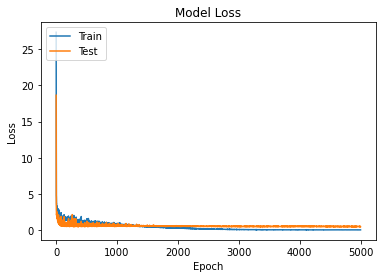

In [90]:
plot_loss()

Cranking up the learning rate a little bit to see how the model performs.
 - Learning Rate = 1e-5
 - Lambda = 1e-7

In [72]:
regressor(1e-5,1e-7)
history = bmodel.fit(X_train, y_train, batch_size=500, epochs=5000, verbose=1, validation_data = (X_test, y_test))

Epoch 1/5000
3/3 [==============================] - 0s 38ms/step - loss: 31.7319 - mean_squared_error: 31.7319 - val_loss: 32.3319 - val_mean_squared_error: 32.3319
Epoch 2/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.7039 - mean_squared_error: 31.7039 - val_loss: 32.3045 - val_mean_squared_error: 32.3045
Epoch 3/5000
3/3 [==============================] - 0s 5ms/step - loss: 31.6427 - mean_squared_error: 31.6427 - val_loss: 32.2718 - val_mean_squared_error: 32.2718
Epoch 4/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.6741 - mean_squared_error: 31.6741 - val_loss: 32.2395 - val_mean_squared_error: 32.2395
Epoch 5/5000
3/3 [==============================] - 0s 5ms/step - loss: 31.5767 - mean_squared_error: 31.5767 - val_loss: 32.2022 - val_mean_squared_error: 32.2022
Epoch 6/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.5380 - mean_squared_error: 31.5380 - val_loss: 32.1570 - val_mean_squared_error: 32.1570
Epoch 7/5000
3/

Epoch 51/5000
3/3 [==============================] - 0s 5ms/step - loss: 27.3725 - mean_squared_error: 27.3725 - val_loss: 27.3930 - val_mean_squared_error: 27.3930
Epoch 52/5000
3/3 [==============================] - 0s 9ms/step - loss: 27.2439 - mean_squared_error: 27.2439 - val_loss: 27.2860 - val_mean_squared_error: 27.2860
Epoch 53/5000
3/3 [==============================] - ETA: 0s - loss: 26.8018 - mean_squared_error: 26.80 - 0s 8ms/step - loss: 27.0297 - mean_squared_error: 27.0297 - val_loss: 27.1752 - val_mean_squared_error: 27.1752
Epoch 54/5000
3/3 [==============================] - 0s 8ms/step - loss: 27.0142 - mean_squared_error: 27.0142 - val_loss: 27.0673 - val_mean_squared_error: 27.0673
Epoch 55/5000
3/3 [==============================] - 0s 6ms/step - loss: 26.9255 - mean_squared_error: 26.9255 - val_loss: 26.9555 - val_mean_squared_error: 26.9555
Epoch 56/5000
3/3 [==============================] - 0s 5ms/step - loss: 26.9262 - mean_squared_error: 26.9262 - val_loss

Epoch 100/5000
3/3 [==============================] - 0s 8ms/step - loss: 22.2542 - mean_squared_error: 22.2542 - val_loss: 22.1662 - val_mean_squared_error: 22.1662
Epoch 101/5000
3/3 [==============================] - 0s 5ms/step - loss: 22.0921 - mean_squared_error: 22.0921 - val_loss: 22.0569 - val_mean_squared_error: 22.0569
Epoch 102/5000
3/3 [==============================] - 0s 8ms/step - loss: 21.9098 - mean_squared_error: 21.9098 - val_loss: 21.9501 - val_mean_squared_error: 21.9501
Epoch 103/5000
3/3 [==============================] - 0s 8ms/step - loss: 21.9059 - mean_squared_error: 21.9059 - val_loss: 21.8442 - val_mean_squared_error: 21.8442
Epoch 104/5000
3/3 [==============================] - 0s 5ms/step - loss: 22.0073 - mean_squared_error: 22.0073 - val_loss: 21.7382 - val_mean_squared_error: 21.7382
Epoch 105/5000
3/3 [==============================] - 0s 8ms/step - loss: 21.7062 - mean_squared_error: 21.7062 - val_loss: 21.6314 - val_mean_squared_error: 21.6314
Epoc

Epoch 149/5000
3/3 [==============================] - 0s 5ms/step - loss: 17.1629 - mean_squared_error: 17.1629 - val_loss: 16.8600 - val_mean_squared_error: 16.8600
Epoch 150/5000
3/3 [==============================] - 0s 8ms/step - loss: 17.0498 - mean_squared_error: 17.0498 - val_loss: 16.7532 - val_mean_squared_error: 16.7532
Epoch 151/5000
3/3 [==============================] - 0s 9ms/step - loss: 16.8726 - mean_squared_error: 16.8726 - val_loss: 16.6454 - val_mean_squared_error: 16.6454
Epoch 152/5000
3/3 [==============================] - 0s 8ms/step - loss: 17.0492 - mean_squared_error: 17.0492 - val_loss: 16.5364 - val_mean_squared_error: 16.5364
Epoch 153/5000
3/3 [==============================] - 0s 8ms/step - loss: 17.0555 - mean_squared_error: 17.0555 - val_loss: 16.4289 - val_mean_squared_error: 16.4289
Epoch 154/5000
3/3 [==============================] - 0s 8ms/step - loss: 16.6866 - mean_squared_error: 16.6866 - val_loss: 16.3215 - val_mean_squared_error: 16.3215
Epoc

Epoch 198/5000
3/3 [==============================] - 0s 8ms/step - loss: 12.6737 - mean_squared_error: 12.6737 - val_loss: 11.8609 - val_mean_squared_error: 11.8609
Epoch 199/5000
3/3 [==============================] - 0s 5ms/step - loss: 12.3513 - mean_squared_error: 12.3513 - val_loss: 11.7666 - val_mean_squared_error: 11.7666
Epoch 200/5000
3/3 [==============================] - 0s 8ms/step - loss: 12.3112 - mean_squared_error: 12.3112 - val_loss: 11.6732 - val_mean_squared_error: 11.6732
Epoch 201/5000
3/3 [==============================] - 0s 8ms/step - loss: 12.1977 - mean_squared_error: 12.1977 - val_loss: 11.5829 - val_mean_squared_error: 11.5829
Epoch 202/5000
3/3 [==============================] - 0s 6ms/step - loss: 12.2316 - mean_squared_error: 12.2316 - val_loss: 11.4932 - val_mean_squared_error: 11.4932
Epoch 203/5000
3/3 [==============================] - 0s 5ms/step - loss: 12.3436 - mean_squared_error: 12.3436 - val_loss: 11.4026 - val_mean_squared_error: 11.4026
Epoc

3/3 [==============================] - 0s 8ms/step - loss: 6.8526 - mean_squared_error: 6.8526 - val_loss: 5.3704 - val_mean_squared_error: 5.3704
Epoch 298/5000
3/3 [==============================] - 0s 5ms/step - loss: 7.0485 - mean_squared_error: 7.0485 - val_loss: 5.3351 - val_mean_squared_error: 5.3351
Epoch 299/5000
3/3 [==============================] - 0s 8ms/step - loss: 6.9083 - mean_squared_error: 6.9083 - val_loss: 5.3058 - val_mean_squared_error: 5.3058
Epoch 300/5000
3/3 [==============================] - 0s 8ms/step - loss: 6.8699 - mean_squared_error: 6.8699 - val_loss: 5.2717 - val_mean_squared_error: 5.2717
Epoch 301/5000
3/3 [==============================] - 0s 5ms/step - loss: 6.7576 - mean_squared_error: 6.7576 - val_loss: 5.2352 - val_mean_squared_error: 5.2352
Epoch 302/5000
3/3 [==============================] - 0s 8ms/step - loss: 6.7795 - mean_squared_error: 6.7795 - val_loss: 5.1985 - val_mean_squared_error: 5.1985
Epoch 303/5000
3/3 [=======================

3/3 [==============================] - 0s 8ms/step - loss: 5.2680 - mean_squared_error: 5.2680 - val_loss: 3.3815 - val_mean_squared_error: 3.3815
Epoch 397/5000
3/3 [==============================] - 0s 5ms/step - loss: 5.5296 - mean_squared_error: 5.5296 - val_loss: 3.3688 - val_mean_squared_error: 3.3688
Epoch 398/5000
3/3 [==============================] - 0s 8ms/step - loss: 5.5612 - mean_squared_error: 5.5612 - val_loss: 3.3567 - val_mean_squared_error: 3.3567
Epoch 399/5000
3/3 [==============================] - 0s 8ms/step - loss: 5.1848 - mean_squared_error: 5.1848 - val_loss: 3.3468 - val_mean_squared_error: 3.3468
Epoch 400/5000
3/3 [==============================] - 0s 7ms/step - loss: 5.2777 - mean_squared_error: 5.2777 - val_loss: 3.3360 - val_mean_squared_error: 3.3360
Epoch 401/5000
3/3 [==============================] - 0s 5ms/step - loss: 5.2874 - mean_squared_error: 5.2874 - val_loss: 3.3268 - val_mean_squared_error: 3.3268
Epoch 402/5000
3/3 [=======================

3/3 [==============================] - 0s 5ms/step - loss: 5.2722 - mean_squared_error: 5.2722 - val_loss: 3.0474 - val_mean_squared_error: 3.0474
Epoch 447/5000
3/3 [==============================] - 0s 8ms/step - loss: 5.1357 - mean_squared_error: 5.1357 - val_loss: 3.0431 - val_mean_squared_error: 3.0431
Epoch 448/5000
3/3 [==============================] - 0s 8ms/step - loss: 5.3766 - mean_squared_error: 5.3766 - val_loss: 3.0363 - val_mean_squared_error: 3.0363
Epoch 449/5000
3/3 [==============================] - 0s 5ms/step - loss: 5.3313 - mean_squared_error: 5.3313 - val_loss: 3.0337 - val_mean_squared_error: 3.0337
Epoch 450/5000
3/3 [==============================] - 0s 8ms/step - loss: 5.1116 - mean_squared_error: 5.1116 - val_loss: 3.0285 - val_mean_squared_error: 3.0285
Epoch 451/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.9812 - mean_squared_error: 4.9812 - val_loss: 3.0203 - val_mean_squared_error: 3.0203
Epoch 452/5000
3/3 [=======================

Epoch 496/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.9668 - mean_squared_error: 4.9668 - val_loss: 2.8224 - val_mean_squared_error: 2.8224
Epoch 497/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.7004 - mean_squared_error: 4.7004 - val_loss: 2.8189 - val_mean_squared_error: 2.8189
Epoch 498/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.5076 - mean_squared_error: 4.5076 - val_loss: 2.8191 - val_mean_squared_error: 2.8191
Epoch 499/5000
3/3 [==============================] - 0s 6ms/step - loss: 5.0051 - mean_squared_error: 5.0051 - val_loss: 2.8189 - val_mean_squared_error: 2.8189
Epoch 500/5000
3/3 [==============================] - 0s 5ms/step - loss: 4.6996 - mean_squared_error: 4.6996 - val_loss: 2.8139 - val_mean_squared_error: 2.8139
Epoch 501/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.4923 - mean_squared_error: 4.4923 - val_loss: 2.8083 - val_mean_squared_error: 2.8083
Epoch 502/5000
3/3 [========

Epoch 596/5000
3/3 [==============================] - 0s 5ms/step - loss: 4.9167 - mean_squared_error: 4.9167 - val_loss: 2.5770 - val_mean_squared_error: 2.5770
Epoch 597/5000
3/3 [==============================] - 0s 9ms/step - loss: 4.4662 - mean_squared_error: 4.4662 - val_loss: 2.5742 - val_mean_squared_error: 2.5742
Epoch 598/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.5010 - mean_squared_error: 4.5010 - val_loss: 2.5695 - val_mean_squared_error: 2.5695
Epoch 599/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.6043 - mean_squared_error: 4.6043 - val_loss: 2.5661 - val_mean_squared_error: 2.5661
Epoch 600/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.7324 - mean_squared_error: 4.7324 - val_loss: 2.5666 - val_mean_squared_error: 2.5666
Epoch 601/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.2943 - mean_squared_error: 4.2943 - val_loss: 2.5608 - val_mean_squared_error: 2.5608
Epoch 602/5000
3/3 [========

Epoch 696/5000
3/3 [==============================] - 0s 5ms/step - loss: 4.2239 - mean_squared_error: 4.2239 - val_loss: 2.3805 - val_mean_squared_error: 2.3805
Epoch 697/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.3703 - mean_squared_error: 4.3703 - val_loss: 2.3799 - val_mean_squared_error: 2.3799
Epoch 698/5000
3/3 [==============================] - 0s 5ms/step - loss: 4.4785 - mean_squared_error: 4.4785 - val_loss: 2.3797 - val_mean_squared_error: 2.3797
Epoch 699/5000
3/3 [==============================] - 0s 9ms/step - loss: 4.0894 - mean_squared_error: 4.0894 - val_loss: 2.3757 - val_mean_squared_error: 2.3757
Epoch 700/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.4028 - mean_squared_error: 4.4028 - val_loss: 2.3735 - val_mean_squared_error: 2.3735
Epoch 701/5000
3/3 [==============================] - 0s 5ms/step - loss: 4.3054 - mean_squared_error: 4.3054 - val_loss: 2.3732 - val_mean_squared_error: 2.3732
Epoch 702/5000
3/3 [========

3/3 [==============================] - 0s 5ms/step - loss: 3.9170 - mean_squared_error: 3.9170 - val_loss: 2.1959 - val_mean_squared_error: 2.1959
Epoch 797/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.9807 - mean_squared_error: 3.9807 - val_loss: 2.1930 - val_mean_squared_error: 2.1930
Epoch 798/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.9253 - mean_squared_error: 3.9253 - val_loss: 2.1850 - val_mean_squared_error: 2.1850
Epoch 799/5000
3/3 [==============================] - 0s 5ms/step - loss: 4.1712 - mean_squared_error: 4.1712 - val_loss: 2.1899 - val_mean_squared_error: 2.1899
Epoch 800/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.9935 - mean_squared_error: 3.9935 - val_loss: 2.1853 - val_mean_squared_error: 2.1853
Epoch 801/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.1007 - mean_squared_error: 4.1007 - val_loss: 2.1871 - val_mean_squared_error: 2.1871
Epoch 802/5000
3/3 [=======================

Epoch 847/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.8953 - mean_squared_error: 3.8953 - val_loss: 2.1465 - val_mean_squared_error: 2.1465
Epoch 848/5000
3/3 [==============================] - 0s 5ms/step - loss: 3.7963 - mean_squared_error: 3.7963 - val_loss: 2.1428 - val_mean_squared_error: 2.1428
Epoch 849/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.9437 - mean_squared_error: 3.9437 - val_loss: 2.1384 - val_mean_squared_error: 2.1384
Epoch 850/5000
3/3 [==============================] - 0s 13ms/step - loss: 3.6755 - mean_squared_error: 3.6755 - val_loss: 2.1355 - val_mean_squared_error: 2.1355
Epoch 851/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.8365 - mean_squared_error: 3.8365 - val_loss: 2.1359 - val_mean_squared_error: 2.1359
Epoch 852/5000
3/3 [==============================] - 0s 11ms/step - loss: 3.5368 - mean_squared_error: 3.5368 - val_loss: 2.1329 - val_mean_squared_error: 2.1329
Epoch 853/5000
3/3 [======

Epoch 897/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.6935 - mean_squared_error: 3.6935 - val_loss: 2.0687 - val_mean_squared_error: 2.0687
Epoch 898/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.8090 - mean_squared_error: 3.8090 - val_loss: 2.0699 - val_mean_squared_error: 2.0699
Epoch 899/5000
3/3 [==============================] - 0s 11ms/step - loss: 3.7155 - mean_squared_error: 3.7155 - val_loss: 2.0704 - val_mean_squared_error: 2.0704
Epoch 900/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.8083 - mean_squared_error: 3.8083 - val_loss: 2.0719 - val_mean_squared_error: 2.0719
Epoch 901/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.8711 - mean_squared_error: 3.8711 - val_loss: 2.0740 - val_mean_squared_error: 2.0740
Epoch 902/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.0138 - mean_squared_error: 4.0138 - val_loss: 2.0749 - val_mean_squared_error: 2.0749
Epoch 903/5000
3/3 [=======

Epoch 997/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.5381 - mean_squared_error: 3.5381 - val_loss: 1.9442 - val_mean_squared_error: 1.9442
Epoch 998/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.4551 - mean_squared_error: 3.4551 - val_loss: 1.9438 - val_mean_squared_error: 1.9438
Epoch 999/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.4252 - mean_squared_error: 3.4252 - val_loss: 1.9422 - val_mean_squared_error: 1.9422
Epoch 1000/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.8398 - mean_squared_error: 3.8398 - val_loss: 1.9495 - val_mean_squared_error: 1.9495
Epoch 1001/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.4610 - mean_squared_error: 3.4610 - val_loss: 1.9454 - val_mean_squared_error: 1.9454
Epoch 1002/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.6170 - mean_squared_error: 3.6170 - val_loss: 1.9453 - val_mean_squared_error: 1.9453
Epoch 1003/5000
3/3 [====

3/3 [==============================] - 0s 8ms/step - loss: 3.2606 - mean_squared_error: 3.2606 - val_loss: 1.8326 - val_mean_squared_error: 1.8326
Epoch 1097/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.1579 - mean_squared_error: 3.1579 - val_loss: 1.8322 - val_mean_squared_error: 1.8322
Epoch 1098/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.3783 - mean_squared_error: 3.3783 - val_loss: 1.8333 - val_mean_squared_error: 1.8333
Epoch 1099/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.5231 - mean_squared_error: 3.5231 - val_loss: 1.8350 - val_mean_squared_error: 1.8350
Epoch 1100/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.3611 - mean_squared_error: 3.3611 - val_loss: 1.8331 - val_mean_squared_error: 1.8331
Epoch 1101/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.4436 - mean_squared_error: 3.4436 - val_loss: 1.8320 - val_mean_squared_error: 1.8320
Epoch 1102/5000
3/3 [=================

Epoch 1196/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.3023 - mean_squared_error: 3.3023 - val_loss: 1.7418 - val_mean_squared_error: 1.7418
Epoch 1197/5000
3/3 [==============================] - 0s 11ms/step - loss: 3.1917 - mean_squared_error: 3.1917 - val_loss: 1.7396 - val_mean_squared_error: 1.7396
Epoch 1198/5000
3/3 [==============================] - 0s 11ms/step - loss: 3.0838 - mean_squared_error: 3.0838 - val_loss: 1.7363 - val_mean_squared_error: 1.7363
Epoch 1199/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.0958 - mean_squared_error: 3.0958 - val_loss: 1.7346 - val_mean_squared_error: 1.7346
Epoch 1200/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.5009 - mean_squared_error: 3.5009 - val_loss: 1.7350 - val_mean_squared_error: 1.7350
Epoch 1201/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.3215 - mean_squared_error: 3.3215 - val_loss: 1.7310 - val_mean_squared_error: 1.7310
Epoch 1202/5000
3/3 

3/3 [==============================] - 0s 11ms/step - loss: 3.2102 - mean_squared_error: 3.2102 - val_loss: 1.6428 - val_mean_squared_error: 1.6428
Epoch 1296/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.9553 - mean_squared_error: 2.9553 - val_loss: 1.6434 - val_mean_squared_error: 1.6434
Epoch 1297/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.0702 - mean_squared_error: 3.0702 - val_loss: 1.6358 - val_mean_squared_error: 1.6358
Epoch 1298/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.0681 - mean_squared_error: 3.0681 - val_loss: 1.6304 - val_mean_squared_error: 1.6304
Epoch 1299/5000
3/3 [==============================] - 0s 11ms/step - loss: 3.0448 - mean_squared_error: 3.0448 - val_loss: 1.6302 - val_mean_squared_error: 1.6302
Epoch 1300/5000
3/3 [==============================] - 0s 11ms/step - loss: 3.1104 - mean_squared_error: 3.1104 - val_loss: 1.6301 - val_mean_squared_error: 1.6301
Epoch 1301/5000
3/3 [==============

Epoch 1345/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.1225 - mean_squared_error: 3.1225 - val_loss: 1.5969 - val_mean_squared_error: 1.5969
Epoch 1346/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.9676 - mean_squared_error: 2.9676 - val_loss: 1.6003 - val_mean_squared_error: 1.6003
Epoch 1347/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.0948 - mean_squared_error: 3.0948 - val_loss: 1.5984 - val_mean_squared_error: 1.5984
Epoch 1348/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.9966 - mean_squared_error: 2.9966 - val_loss: 1.5950 - val_mean_squared_error: 1.5950
Epoch 1349/5000
3/3 [==============================] - 0s 11ms/step - loss: 3.1243 - mean_squared_error: 3.1243 - val_loss: 1.5931 - val_mean_squared_error: 1.5931
Epoch 1350/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.0628 - mean_squared_error: 3.0628 - val_loss: 1.5928 - val_mean_squared_error: 1.5928
Epoch 1351/5000
3/3 [

Epoch 1395/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.9871 - mean_squared_error: 2.9871 - val_loss: 1.5431 - val_mean_squared_error: 1.5431
Epoch 1396/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.0251 - mean_squared_error: 3.0251 - val_loss: 1.5421 - val_mean_squared_error: 1.5421
Epoch 1397/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.9671 - mean_squared_error: 2.9671 - val_loss: 1.5487 - val_mean_squared_error: 1.5487
Epoch 1398/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.0271 - mean_squared_error: 3.0271 - val_loss: 1.5516 - val_mean_squared_error: 1.5516
Epoch 1399/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.1587 - mean_squared_error: 3.1587 - val_loss: 1.5469 - val_mean_squared_error: 1.5469
Epoch 1400/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.8049 - mean_squared_error: 2.8049 - val_loss: 1.5432 - val_mean_squared_error: 1.5432
Epoch 1401/5000
3/3 [=

Epoch 1445/5000
3/3 [==============================] - 0s 11ms/step - loss: 3.0566 - mean_squared_error: 3.0566 - val_loss: 1.4875 - val_mean_squared_error: 1.4875
Epoch 1446/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.9231 - mean_squared_error: 2.9231 - val_loss: 1.4838 - val_mean_squared_error: 1.4838
Epoch 1447/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.9216 - mean_squared_error: 2.9216 - val_loss: 1.4860 - val_mean_squared_error: 1.4860
Epoch 1448/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.0457 - mean_squared_error: 3.0457 - val_loss: 1.4850 - val_mean_squared_error: 1.4850
Epoch 1449/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.8570 - mean_squared_error: 2.8570 - val_loss: 1.4805 - val_mean_squared_error: 1.4805
Epoch 1450/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.9403 - mean_squared_error: 2.9403 - val_loss: 1.4824 - val_mean_squared_error: 1.4824
Epoch 1451/5000
3/3 [

Epoch 1545/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.9687 - mean_squared_error: 2.9687 - val_loss: 1.3989 - val_mean_squared_error: 1.3989
Epoch 1546/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.7098 - mean_squared_error: 2.7098 - val_loss: 1.4015 - val_mean_squared_error: 1.4015
Epoch 1547/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.6954 - mean_squared_error: 2.6954 - val_loss: 1.3968 - val_mean_squared_error: 1.3968
Epoch 1548/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.9067 - mean_squared_error: 2.9067 - val_loss: 1.4000 - val_mean_squared_error: 1.4000
Epoch 1549/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.9707 - mean_squared_error: 2.9707 - val_loss: 1.4050 - val_mean_squared_error: 1.4050
Epoch 1550/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.8943 - mean_squared_error: 2.8943 - val_loss: 1.4038 - val_mean_squared_error: 1.4038
Epoch 1551/5000
3/3 [

Epoch 1644/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.9526 - mean_squared_error: 2.9526 - val_loss: 1.3067 - val_mean_squared_error: 1.3067
Epoch 1645/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.6829 - mean_squared_error: 2.6829 - val_loss: 1.3074 - val_mean_squared_error: 1.3074
Epoch 1646/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.8421 - mean_squared_error: 2.8421 - val_loss: 1.3015 - val_mean_squared_error: 1.3015
Epoch 1647/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.8043 - mean_squared_error: 2.8043 - val_loss: 1.2978 - val_mean_squared_error: 1.2978
Epoch 1648/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.8252 - mean_squared_error: 2.8252 - val_loss: 1.3030 - val_mean_squared_error: 1.3030
Epoch 1649/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.8640 - mean_squared_error: 2.8640 - val_loss: 1.3023 - val_mean_squared_error: 1.3023
Epoch 1650/5000
3

Epoch 1694/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.7642 - mean_squared_error: 2.7642 - val_loss: 1.2663 - val_mean_squared_error: 1.2663
Epoch 1695/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.7979 - mean_squared_error: 2.7979 - val_loss: 1.2645 - val_mean_squared_error: 1.2645
Epoch 1696/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.7133 - mean_squared_error: 2.7133 - val_loss: 1.2655 - val_mean_squared_error: 1.2655
Epoch 1697/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.6452 - mean_squared_error: 2.6452 - val_loss: 1.2671 - val_mean_squared_error: 1.2671
Epoch 1698/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.8787 - mean_squared_error: 2.8787 - val_loss: 1.2662 - val_mean_squared_error: 1.2662
Epoch 1699/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.7536 - mean_squared_error: 2.7536 - val_loss: 1.2660 - val_mean_squared_error: 1.2660
Epoch 1700/5000
3/3

Epoch 1793/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.7580 - mean_squared_error: 2.7580 - val_loss: 1.1749 - val_mean_squared_error: 1.1749
Epoch 1794/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.6109 - mean_squared_error: 2.6109 - val_loss: 1.1759 - val_mean_squared_error: 1.1759
Epoch 1795/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.3498 - mean_squared_error: 2.3498 - val_loss: 1.1806 - val_mean_squared_error: 1.1806
Epoch 1796/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.7320 - mean_squared_error: 2.7320 - val_loss: 1.1860 - val_mean_squared_error: 1.1860
Epoch 1797/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.8395 - mean_squared_error: 2.8395 - val_loss: 1.1910 - val_mean_squared_error: 1.1910
Epoch 1798/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.7904 - mean_squared_error: 2.7904 - val_loss: 1.1891 - val_mean_squared_error: 1.1891
Epoch 1799/5000
3/3

Epoch 1893/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.5010 - mean_squared_error: 2.5010 - val_loss: 1.1042 - val_mean_squared_error: 1.1042
Epoch 1894/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.5045 - mean_squared_error: 2.5045 - val_loss: 1.0987 - val_mean_squared_error: 1.0987
Epoch 1895/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.5433 - mean_squared_error: 2.5433 - val_loss: 1.0942 - val_mean_squared_error: 1.0942
Epoch 1896/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.5116 - mean_squared_error: 2.5116 - val_loss: 1.0995 - val_mean_squared_error: 1.0995
Epoch 1897/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.3770 - mean_squared_error: 2.3770 - val_loss: 1.0979 - val_mean_squared_error: 1.0979
Epoch 1898/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.5447 - mean_squared_error: 2.5447 - val_loss: 1.1015 - val_mean_squared_error: 1.1015
Epoch 1899/5000
3/3 [

Epoch 1992/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.3583 - mean_squared_error: 2.3583 - val_loss: 1.0347 - val_mean_squared_error: 1.0347
Epoch 1993/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.3716 - mean_squared_error: 2.3716 - val_loss: 1.0338 - val_mean_squared_error: 1.0338
Epoch 1994/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.3312 - mean_squared_error: 2.3312 - val_loss: 1.0319 - val_mean_squared_error: 1.0319
Epoch 1995/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.4479 - mean_squared_error: 2.4479 - val_loss: 1.0321 - val_mean_squared_error: 1.0321
Epoch 1996/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.6019 - mean_squared_error: 2.6019 - val_loss: 1.0410 - val_mean_squared_error: 1.0410
Epoch 1997/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.5278 - mean_squared_error: 2.5278 - val_loss: 1.0362 - val_mean_squared_error: 1.0362
Epoch 1998/5000
3/3 [

3/3 [==============================] - 0s 8ms/step - loss: 2.4898 - mean_squared_error: 2.4898 - val_loss: 0.9531 - val_mean_squared_error: 0.9531
Epoch 2093/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.2364 - mean_squared_error: 2.2364 - val_loss: 0.9476 - val_mean_squared_error: 0.9476
Epoch 2094/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.4913 - mean_squared_error: 2.4913 - val_loss: 0.9472 - val_mean_squared_error: 0.9472
Epoch 2095/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.2441 - mean_squared_error: 2.2441 - val_loss: 0.9437 - val_mean_squared_error: 0.9437
Epoch 2096/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.4685 - mean_squared_error: 2.4685 - val_loss: 0.9493 - val_mean_squared_error: 0.9493
Epoch 2097/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.3931 - mean_squared_error: 2.3931 - val_loss: 0.9483 - val_mean_squared_error: 0.9483
Epoch 2098/5000
3/3 [================

Epoch 2142/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.4502 - mean_squared_error: 2.4502 - val_loss: 0.9355 - val_mean_squared_error: 0.9355
Epoch 2143/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.3530 - mean_squared_error: 2.3530 - val_loss: 0.9327 - val_mean_squared_error: 0.9327
Epoch 2144/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.3829 - mean_squared_error: 2.3829 - val_loss: 0.9366 - val_mean_squared_error: 0.9366
Epoch 2145/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.4367 - mean_squared_error: 2.4367 - val_loss: 0.9310 - val_mean_squared_error: 0.9310
Epoch 2146/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.2791 - mean_squared_error: 2.2791 - val_loss: 0.9303 - val_mean_squared_error: 0.9303
Epoch 2147/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.3068 - mean_squared_error: 2.3068 - val_loss: 0.9281 - val_mean_squared_error: 0.9281
Epoch 2148/5000
3/3 [

3/3 [==============================] - 0s 8ms/step - loss: 2.2499 - mean_squared_error: 2.2499 - val_loss: 0.8610 - val_mean_squared_error: 0.8610
Epoch 2243/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.3431 - mean_squared_error: 2.3431 - val_loss: 0.8637 - val_mean_squared_error: 0.8637
Epoch 2244/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.2501 - mean_squared_error: 2.2501 - val_loss: 0.8614 - val_mean_squared_error: 0.8614
Epoch 2245/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.4503 - mean_squared_error: 2.4503 - val_loss: 0.8626 - val_mean_squared_error: 0.8626
Epoch 2246/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.2127 - mean_squared_error: 2.2127 - val_loss: 0.8576 - val_mean_squared_error: 0.8576
Epoch 2247/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.3368 - mean_squared_error: 2.3368 - val_loss: 0.8601 - val_mean_squared_error: 0.8601
Epoch 2248/5000
3/3 [================

Epoch 2292/5000
3/3 [==============================] - 0s 5ms/step - loss: 2.1857 - mean_squared_error: 2.1857 - val_loss: 0.8430 - val_mean_squared_error: 0.8430
Epoch 2293/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0733 - mean_squared_error: 2.0733 - val_loss: 0.8307 - val_mean_squared_error: 0.8307
Epoch 2294/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.2911 - mean_squared_error: 2.2911 - val_loss: 0.8274 - val_mean_squared_error: 0.8274
Epoch 2295/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.2220 - mean_squared_error: 2.2220 - val_loss: 0.8368 - val_mean_squared_error: 0.8368
Epoch 2296/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.2915 - mean_squared_error: 2.2915 - val_loss: 0.8397 - val_mean_squared_error: 0.8397
Epoch 2297/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.2247 - mean_squared_error: 2.2247 - val_loss: 0.8359 - val_mean_squared_error: 0.8359
Epoch 2298/5000
3/3

Epoch 2342/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1009 - mean_squared_error: 2.1009 - val_loss: 0.8160 - val_mean_squared_error: 0.8160
Epoch 2343/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1372 - mean_squared_error: 2.1372 - val_loss: 0.8200 - val_mean_squared_error: 0.8200
Epoch 2344/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.2997 - mean_squared_error: 2.2997 - val_loss: 0.8110 - val_mean_squared_error: 0.8110
Epoch 2345/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.2450 - mean_squared_error: 2.2450 - val_loss: 0.8085 - val_mean_squared_error: 0.8085
Epoch 2346/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.3178 - mean_squared_error: 2.3178 - val_loss: 0.8087 - val_mean_squared_error: 0.8087
Epoch 2347/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.2031 - mean_squared_error: 2.2031 - val_loss: 0.8123 - val_mean_squared_error: 0.8123
Epoch 2348/5000
3/3 

Epoch 2392/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1512 - mean_squared_error: 2.1512 - val_loss: 0.7887 - val_mean_squared_error: 0.7887
Epoch 2393/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.2515 - mean_squared_error: 2.2515 - val_loss: 0.7896 - val_mean_squared_error: 0.7896
Epoch 2394/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.3352 - mean_squared_error: 2.3352 - val_loss: 0.7948 - val_mean_squared_error: 0.7948
Epoch 2395/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.2235 - mean_squared_error: 2.2235 - val_loss: 0.7920 - val_mean_squared_error: 0.7920
Epoch 2396/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1967 - mean_squared_error: 2.1967 - val_loss: 0.7867 - val_mean_squared_error: 0.7867
Epoch 2397/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1297 - mean_squared_error: 2.1297 - val_loss: 0.7920 - val_mean_squared_error: 0.7920
Epoch 2398/5000
3/3 [=

Epoch 2442/5000
3/3 [==============================] - 0s 5ms/step - loss: 2.1818 - mean_squared_error: 2.1818 - val_loss: 0.7612 - val_mean_squared_error: 0.7612
Epoch 2443/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.2951 - mean_squared_error: 2.2951 - val_loss: 0.7686 - val_mean_squared_error: 0.7686
Epoch 2444/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0569 - mean_squared_error: 2.0569 - val_loss: 0.7667 - val_mean_squared_error: 0.7667
Epoch 2445/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.0943 - mean_squared_error: 2.0943 - val_loss: 0.7595 - val_mean_squared_error: 0.7595
Epoch 2446/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1024 - mean_squared_error: 2.1024 - val_loss: 0.7634 - val_mean_squared_error: 0.7634
Epoch 2447/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.2114 - mean_squared_error: 2.2114 - val_loss: 0.7650 - val_mean_squared_error: 0.7650
Epoch 2448/5000
3/3 

Epoch 2542/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.1490 - mean_squared_error: 2.1490 - val_loss: 0.7287 - val_mean_squared_error: 0.7287
Epoch 2543/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.2414 - mean_squared_error: 2.2414 - val_loss: 0.7270 - val_mean_squared_error: 0.7270
Epoch 2544/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1735 - mean_squared_error: 2.1735 - val_loss: 0.7241 - val_mean_squared_error: 0.7241
Epoch 2545/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.2181 - mean_squared_error: 2.2181 - val_loss: 0.7308 - val_mean_squared_error: 0.7308
Epoch 2546/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0176 - mean_squared_error: 2.0176 - val_loss: 0.7320 - val_mean_squared_error: 0.7320
Epoch 2547/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.2245 - mean_squared_error: 2.2245 - val_loss: 0.7325 - val_mean_squared_error: 0.7325
Epoch 2548/5000
3/3 [

Epoch 2642/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.0320 - mean_squared_error: 2.0320 - val_loss: 0.6991 - val_mean_squared_error: 0.6991
Epoch 2643/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1827 - mean_squared_error: 2.1827 - val_loss: 0.6903 - val_mean_squared_error: 0.6903
Epoch 2644/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.1009 - mean_squared_error: 2.1009 - val_loss: 0.6847 - val_mean_squared_error: 0.6847
Epoch 2645/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.0283 - mean_squared_error: 2.0283 - val_loss: 0.6835 - val_mean_squared_error: 0.6835
Epoch 2646/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.9772 - mean_squared_error: 1.9772 - val_loss: 0.6796 - val_mean_squared_error: 0.6796
Epoch 2647/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.0867 - mean_squared_error: 2.0867 - val_loss: 0.6857 - val_mean_squared_error: 0.6857
Epoch 2648/5000
3

Epoch 2742/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0366 - mean_squared_error: 2.0366 - val_loss: 0.6673 - val_mean_squared_error: 0.6673
Epoch 2743/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9915 - mean_squared_error: 1.9915 - val_loss: 0.6634 - val_mean_squared_error: 0.6634
Epoch 2744/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0583 - mean_squared_error: 2.0583 - val_loss: 0.6628 - val_mean_squared_error: 0.6628
Epoch 2745/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0175 - mean_squared_error: 2.0175 - val_loss: 0.6685 - val_mean_squared_error: 0.6685
Epoch 2746/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1170 - mean_squared_error: 2.1170 - val_loss: 0.6659 - val_mean_squared_error: 0.6659
Epoch 2747/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0908 - mean_squared_error: 2.0908 - val_loss: 0.6528 - val_mean_squared_error: 0.6528
Epoch 2748/5000
3/3 [=

Epoch 2792/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1406 - mean_squared_error: 2.1406 - val_loss: 0.6375 - val_mean_squared_error: 0.6375
Epoch 2793/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.2226 - mean_squared_error: 2.2226 - val_loss: 0.6375 - val_mean_squared_error: 0.6375
Epoch 2794/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1424 - mean_squared_error: 2.1424 - val_loss: 0.6464 - val_mean_squared_error: 0.6464
Epoch 2795/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1069 - mean_squared_error: 2.1069 - val_loss: 0.6465 - val_mean_squared_error: 0.6465
Epoch 2796/5000
3/3 [==============================] - 0s 5ms/step - loss: 2.1409 - mean_squared_error: 2.1409 - val_loss: 0.6485 - val_mean_squared_error: 0.6485
Epoch 2797/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0476 - mean_squared_error: 2.0476 - val_loss: 0.6525 - val_mean_squared_error: 0.6525
Epoch 2798/5000
3/3 [=

Epoch 2892/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9094 - mean_squared_error: 1.9094 - val_loss: 0.6094 - val_mean_squared_error: 0.6094
Epoch 2893/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0866 - mean_squared_error: 2.0866 - val_loss: 0.6180 - val_mean_squared_error: 0.6180
Epoch 2894/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9484 - mean_squared_error: 1.9484 - val_loss: 0.6146 - val_mean_squared_error: 0.6146
Epoch 2895/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.1686 - mean_squared_error: 2.1686 - val_loss: 0.6123 - val_mean_squared_error: 0.6123
Epoch 2896/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9999 - mean_squared_error: 1.9999 - val_loss: 0.6141 - val_mean_squared_error: 0.6141
Epoch 2897/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.0172 - mean_squared_error: 2.0172 - val_loss: 0.6167 - val_mean_squared_error: 0.6167
Epoch 2898/5000
3/3 

Epoch 2991/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1217 - mean_squared_error: 2.1217 - val_loss: 0.6177 - val_mean_squared_error: 0.6177
Epoch 2992/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0855 - mean_squared_error: 2.0855 - val_loss: 0.6245 - val_mean_squared_error: 0.6245
Epoch 2993/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0566 - mean_squared_error: 2.0566 - val_loss: 0.6250 - val_mean_squared_error: 0.6250
Epoch 2994/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1314 - mean_squared_error: 2.1314 - val_loss: 0.6256 - val_mean_squared_error: 0.6256
Epoch 2995/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0125 - mean_squared_error: 2.0125 - val_loss: 0.6140 - val_mean_squared_error: 0.6140
Epoch 2996/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0662 - mean_squared_error: 2.0662 - val_loss: 0.6193 - val_mean_squared_error: 0.6193
Epoch 2997/5000
3/3 [=

3/3 [==============================] - 0s 11ms/step - loss: 2.0300 - mean_squared_error: 2.0300 - val_loss: 0.5764 - val_mean_squared_error: 0.5764
Epoch 3091/5000
3/3 [==============================] - ETA: 0s - loss: 1.8709 - mean_squared_error: 1.87 - 0s 5ms/step - loss: 1.9605 - mean_squared_error: 1.9605 - val_loss: 0.5771 - val_mean_squared_error: 0.5771
Epoch 3092/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0978 - mean_squared_error: 2.0978 - val_loss: 0.5778 - val_mean_squared_error: 0.5778
Epoch 3093/5000
3/3 [==============================] - 0s 5ms/step - loss: 1.9032 - mean_squared_error: 1.9032 - val_loss: 0.5789 - val_mean_squared_error: 0.5789
Epoch 3094/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9589 - mean_squared_error: 1.9589 - val_loss: 0.5813 - val_mean_squared_error: 0.5813
Epoch 3095/5000
3/3 [==============================] - 0s 5ms/step - loss: 2.0185 - mean_squared_error: 2.0185 - val_loss: 0.5818 - val_mean_squared

Epoch 3140/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.9824 - mean_squared_error: 1.9824 - val_loss: 0.5808 - val_mean_squared_error: 0.5808
Epoch 3141/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9832 - mean_squared_error: 1.9832 - val_loss: 0.5755 - val_mean_squared_error: 0.5755
Epoch 3142/5000
3/3 [==============================] - 0s 11ms/step - loss: 2.0753 - mean_squared_error: 2.0753 - val_loss: 0.5770 - val_mean_squared_error: 0.5770
Epoch 3143/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1257 - mean_squared_error: 2.1257 - val_loss: 0.5795 - val_mean_squared_error: 0.5795
Epoch 3144/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.9956 - mean_squared_error: 1.9956 - val_loss: 0.5770 - val_mean_squared_error: 0.5770
Epoch 3145/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1100 - mean_squared_error: 2.1100 - val_loss: 0.5734 - val_mean_squared_error: 0.5734
Epoch 3146/5000
3/3

3/3 [==============================] - 0s 8ms/step - loss: 1.7801 - mean_squared_error: 1.7801 - val_loss: 0.5630 - val_mean_squared_error: 0.5630
Epoch 3240/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1008 - mean_squared_error: 2.1008 - val_loss: 0.5641 - val_mean_squared_error: 0.5641
Epoch 3241/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9011 - mean_squared_error: 1.9011 - val_loss: 0.5669 - val_mean_squared_error: 0.5669
Epoch 3242/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0546 - mean_squared_error: 2.0546 - val_loss: 0.5647 - val_mean_squared_error: 0.5647
Epoch 3243/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0335 - mean_squared_error: 2.0335 - val_loss: 0.5671 - val_mean_squared_error: 0.5671
Epoch 3244/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9428 - mean_squared_error: 1.9428 - val_loss: 0.5622 - val_mean_squared_error: 0.5622
Epoch 3245/5000
3/3 [=================

Epoch 3289/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.9742 - mean_squared_error: 1.9742 - val_loss: 0.5458 - val_mean_squared_error: 0.5458
Epoch 3290/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0549 - mean_squared_error: 2.0549 - val_loss: 0.5496 - val_mean_squared_error: 0.5496
Epoch 3291/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0084 - mean_squared_error: 2.0084 - val_loss: 0.5569 - val_mean_squared_error: 0.5569
Epoch 3292/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9490 - mean_squared_error: 1.9490 - val_loss: 0.5517 - val_mean_squared_error: 0.5517
Epoch 3293/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9772 - mean_squared_error: 1.9772 - val_loss: 0.5566 - val_mean_squared_error: 0.5566
Epoch 3294/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0700 - mean_squared_error: 2.0700 - val_loss: 0.5568 - val_mean_squared_error: 0.5568
Epoch 3295/5000
3/3 [

3/3 [==============================] - 0s 11ms/step - loss: 1.8663 - mean_squared_error: 1.8663 - val_loss: 0.5430 - val_mean_squared_error: 0.5430
Epoch 3390/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8895 - mean_squared_error: 1.8895 - val_loss: 0.5431 - val_mean_squared_error: 0.5431
Epoch 3391/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0269 - mean_squared_error: 2.0269 - val_loss: 0.5370 - val_mean_squared_error: 0.5370
Epoch 3392/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8682 - mean_squared_error: 1.8682 - val_loss: 0.5329 - val_mean_squared_error: 0.5329
Epoch 3393/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0218 - mean_squared_error: 2.0218 - val_loss: 0.5358 - val_mean_squared_error: 0.5358
Epoch 3394/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9597 - mean_squared_error: 1.9597 - val_loss: 0.5405 - val_mean_squared_error: 0.5405
Epoch 3395/5000
3/3 [================

3/3 [==============================] - 0s 11ms/step - loss: 1.9527 - mean_squared_error: 1.9527 - val_loss: 0.5413 - val_mean_squared_error: 0.5413
Epoch 3489/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.8610 - mean_squared_error: 1.8610 - val_loss: 0.5425 - val_mean_squared_error: 0.5425
Epoch 3490/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8828 - mean_squared_error: 1.8828 - val_loss: 0.5407 - val_mean_squared_error: 0.5407
Epoch 3491/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0111 - mean_squared_error: 2.0111 - val_loss: 0.5444 - val_mean_squared_error: 0.5444
Epoch 3492/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.9485 - mean_squared_error: 1.9485 - val_loss: 0.5492 - val_mean_squared_error: 0.5492
Epoch 3493/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9668 - mean_squared_error: 1.9668 - val_loss: 0.5540 - val_mean_squared_error: 0.5540
Epoch 3494/5000
3/3 [==============

Epoch 3588/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.9030 - mean_squared_error: 1.9030 - val_loss: 0.5368 - val_mean_squared_error: 0.5368
Epoch 3589/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9670 - mean_squared_error: 1.9670 - val_loss: 0.5301 - val_mean_squared_error: 0.5301
Epoch 3590/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.9536 - mean_squared_error: 1.9536 - val_loss: 0.5318 - val_mean_squared_error: 0.5318
Epoch 3591/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9620 - mean_squared_error: 1.9620 - val_loss: 0.5327 - val_mean_squared_error: 0.5327
Epoch 3592/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9350 - mean_squared_error: 1.9350 - val_loss: 0.5340 - val_mean_squared_error: 0.5340
Epoch 3593/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1099 - mean_squared_error: 2.1099 - val_loss: 0.5207 - val_mean_squared_error: 0.5207
Epoch 3594/5000
3/3 

Epoch 3687/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0229 - mean_squared_error: 2.0229 - val_loss: 0.5243 - val_mean_squared_error: 0.5243
Epoch 3688/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0109 - mean_squared_error: 2.0109 - val_loss: 0.5231 - val_mean_squared_error: 0.5231
Epoch 3689/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9759 - mean_squared_error: 1.9759 - val_loss: 0.5258 - val_mean_squared_error: 0.5258
Epoch 3690/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0343 - mean_squared_error: 2.0343 - val_loss: 0.5213 - val_mean_squared_error: 0.5213
Epoch 3691/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0060 - mean_squared_error: 2.0060 - val_loss: 0.5254 - val_mean_squared_error: 0.5254
Epoch 3692/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1175 - mean_squared_error: 2.1175 - val_loss: 0.5312 - val_mean_squared_error: 0.5312
Epoch 3693/5000
3/3 [=

Epoch 3787/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8360 - mean_squared_error: 1.8360 - val_loss: 0.5168 - val_mean_squared_error: 0.5168
Epoch 3788/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9661 - mean_squared_error: 1.9661 - val_loss: 0.5185 - val_mean_squared_error: 0.5185
Epoch 3789/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9653 - mean_squared_error: 1.9653 - val_loss: 0.5121 - val_mean_squared_error: 0.5121
Epoch 3790/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.8769 - mean_squared_error: 1.8769 - val_loss: 0.5148 - val_mean_squared_error: 0.5148
Epoch 3791/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.9818 - mean_squared_error: 1.9818 - val_loss: 0.5115 - val_mean_squared_error: 0.5115
Epoch 3792/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9649 - mean_squared_error: 1.9649 - val_loss: 0.5033 - val_mean_squared_error: 0.5033
Epoch 3793/5000
3/3 

Epoch 3887/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0216 - mean_squared_error: 2.0216 - val_loss: 0.5258 - val_mean_squared_error: 0.5258
Epoch 3888/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8486 - mean_squared_error: 1.8486 - val_loss: 0.5119 - val_mean_squared_error: 0.5119
Epoch 3889/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9600 - mean_squared_error: 1.9600 - val_loss: 0.5049 - val_mean_squared_error: 0.5049
Epoch 3890/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9354 - mean_squared_error: 1.9354 - val_loss: 0.5093 - val_mean_squared_error: 0.5093
Epoch 3891/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0295 - mean_squared_error: 2.0295 - val_loss: 0.5107 - val_mean_squared_error: 0.5107
Epoch 3892/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9273 - mean_squared_error: 1.9273 - val_loss: 0.5157 - val_mean_squared_error: 0.5157
Epoch 3893/5000
3/3 [=

Epoch 3937/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0263 - mean_squared_error: 2.0263 - val_loss: 0.5160 - val_mean_squared_error: 0.5160
Epoch 3938/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9138 - mean_squared_error: 1.9138 - val_loss: 0.5183 - val_mean_squared_error: 0.5183
Epoch 3939/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0569 - mean_squared_error: 2.0569 - val_loss: 0.5282 - val_mean_squared_error: 0.5282
Epoch 3940/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0573 - mean_squared_error: 2.0573 - val_loss: 0.5266 - val_mean_squared_error: 0.5266
Epoch 3941/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7904 - mean_squared_error: 1.7904 - val_loss: 0.5296 - val_mean_squared_error: 0.5296
Epoch 3942/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9388 - mean_squared_error: 1.9388 - val_loss: 0.5266 - val_mean_squared_error: 0.5266
Epoch 3943/5000
3/3 [=

3/3 [==============================] - 0s 11ms/step - loss: 1.8786 - mean_squared_error: 1.8786 - val_loss: 0.5112 - val_mean_squared_error: 0.5112
Epoch 4037/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9493 - mean_squared_error: 1.9493 - val_loss: 0.5158 - val_mean_squared_error: 0.5158
Epoch 4038/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9447 - mean_squared_error: 1.9447 - val_loss: 0.5202 - val_mean_squared_error: 0.5202
Epoch 4039/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9322 - mean_squared_error: 1.9322 - val_loss: 0.5187 - val_mean_squared_error: 0.5187
Epoch 4040/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9706 - mean_squared_error: 1.9706 - val_loss: 0.5155 - val_mean_squared_error: 0.5155
Epoch 4041/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9050 - mean_squared_error: 1.9050 - val_loss: 0.5226 - val_mean_squared_error: 0.5226
Epoch 4042/5000
3/3 [================

Epoch 4136/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7698 - mean_squared_error: 1.7698 - val_loss: 0.5039 - val_mean_squared_error: 0.5039
Epoch 4137/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.8478 - mean_squared_error: 1.8478 - val_loss: 0.5023 - val_mean_squared_error: 0.5023
Epoch 4138/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9226 - mean_squared_error: 1.9226 - val_loss: 0.5183 - val_mean_squared_error: 0.5183
Epoch 4139/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8337 - mean_squared_error: 1.8337 - val_loss: 0.5152 - val_mean_squared_error: 0.5152
Epoch 4140/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8916 - mean_squared_error: 1.8916 - val_loss: 0.5142 - val_mean_squared_error: 0.5142
Epoch 4141/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7247 - mean_squared_error: 1.7247 - val_loss: 0.5148 - val_mean_squared_error: 0.5148
Epoch 4142/5000
3/3 [

Epoch 4235/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8562 - mean_squared_error: 1.8562 - val_loss: 0.4955 - val_mean_squared_error: 0.4955
Epoch 4236/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7386 - mean_squared_error: 1.7386 - val_loss: 0.5047 - val_mean_squared_error: 0.5047
Epoch 4237/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8629 - mean_squared_error: 1.8629 - val_loss: 0.5046 - val_mean_squared_error: 0.5046
Epoch 4238/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9927 - mean_squared_error: 1.9927 - val_loss: 0.4986 - val_mean_squared_error: 0.4986
Epoch 4239/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.8186 - mean_squared_error: 1.8186 - val_loss: 0.4953 - val_mean_squared_error: 0.4953
Epoch 4240/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9700 - mean_squared_error: 1.9700 - val_loss: 0.5042 - val_mean_squared_error: 0.5042
Epoch 4241/5000
3/3 [

Epoch 4335/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8597 - mean_squared_error: 1.8597 - val_loss: 0.4995 - val_mean_squared_error: 0.4995
Epoch 4336/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8445 - mean_squared_error: 1.8445 - val_loss: 0.4923 - val_mean_squared_error: 0.4923
Epoch 4337/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8827 - mean_squared_error: 1.8827 - val_loss: 0.4907 - val_mean_squared_error: 0.4907
Epoch 4338/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7821 - mean_squared_error: 1.7821 - val_loss: 0.4854 - val_mean_squared_error: 0.4854
Epoch 4339/5000
3/3 [==============================] - ETA: 0s - loss: 2.1636 - mean_squared_error: 2.16 - 0s 8ms/step - loss: 1.9365 - mean_squared_error: 1.9365 - val_loss: 0.4847 - val_mean_squared_error: 0.4847
Epoch 4340/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7817 - mean_squared_error: 1.7817 - val_loss: 0.4870 - v

Epoch 4384/5000
3/3 [==============================] - ETA: 0s - loss: 1.9316 - mean_squared_error: 1.93 - 0s 8ms/step - loss: 1.8332 - mean_squared_error: 1.8332 - val_loss: 0.4931 - val_mean_squared_error: 0.4931
Epoch 4385/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7697 - mean_squared_error: 1.7697 - val_loss: 0.4895 - val_mean_squared_error: 0.4895
Epoch 4386/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9293 - mean_squared_error: 1.9293 - val_loss: 0.4974 - val_mean_squared_error: 0.4974
Epoch 4387/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.9129 - mean_squared_error: 1.9129 - val_loss: 0.4955 - val_mean_squared_error: 0.4955
Epoch 4388/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8144 - mean_squared_error: 1.8144 - val_loss: 0.4917 - val_mean_squared_error: 0.4917
Epoch 4389/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7868 - mean_squared_error: 1.7868 - val_loss: 0.4860 - 

Epoch 4483/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7301 - mean_squared_error: 1.7301 - val_loss: 0.5025 - val_mean_squared_error: 0.5025
Epoch 4484/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0389 - mean_squared_error: 2.0389 - val_loss: 0.5000 - val_mean_squared_error: 0.5000
Epoch 4485/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8157 - mean_squared_error: 1.8157 - val_loss: 0.5015 - val_mean_squared_error: 0.5015
Epoch 4486/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8328 - mean_squared_error: 1.8328 - val_loss: 0.5043 - val_mean_squared_error: 0.5043
Epoch 4487/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9204 - mean_squared_error: 1.9204 - val_loss: 0.5035 - val_mean_squared_error: 0.5035
Epoch 4488/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.9678 - mean_squared_error: 1.9678 - val_loss: 0.4998 - val_mean_squared_error: 0.4998
Epoch 4489/5000
3/3 [

Epoch 4533/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8570 - mean_squared_error: 1.8570 - val_loss: 0.4928 - val_mean_squared_error: 0.4928
Epoch 4534/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9050 - mean_squared_error: 1.9050 - val_loss: 0.4878 - val_mean_squared_error: 0.4878
Epoch 4535/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8257 - mean_squared_error: 1.8257 - val_loss: 0.4910 - val_mean_squared_error: 0.4910
Epoch 4536/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.7602 - mean_squared_error: 1.7602 - val_loss: 0.4888 - val_mean_squared_error: 0.4888
Epoch 4537/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7145 - mean_squared_error: 1.7145 - val_loss: 0.4872 - val_mean_squared_error: 0.4872
Epoch 4538/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8668 - mean_squared_error: 1.8668 - val_loss: 0.4843 - val_mean_squared_error: 0.4843
Epoch 4539/5000
3/3 [

Epoch 4633/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7835 - mean_squared_error: 1.7835 - val_loss: 0.4922 - val_mean_squared_error: 0.4922
Epoch 4634/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8755 - mean_squared_error: 1.8755 - val_loss: 0.4959 - val_mean_squared_error: 0.4959
Epoch 4635/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8487 - mean_squared_error: 1.8487 - val_loss: 0.4959 - val_mean_squared_error: 0.4959
Epoch 4636/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7821 - mean_squared_error: 1.7821 - val_loss: 0.4940 - val_mean_squared_error: 0.4940
Epoch 4637/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.6281 - mean_squared_error: 1.6281 - val_loss: 0.4985 - val_mean_squared_error: 0.4985
Epoch 4638/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8678 - mean_squared_error: 1.8678 - val_loss: 0.5018 - val_mean_squared_error: 0.5018
Epoch 4639/5000
3/3 [=

3/3 [==============================] - 0s 8ms/step - loss: 1.9385 - mean_squared_error: 1.9385 - val_loss: 0.4998 - val_mean_squared_error: 0.4998
Epoch 4733/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7887 - mean_squared_error: 1.7887 - val_loss: 0.4931 - val_mean_squared_error: 0.4931
Epoch 4734/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8184 - mean_squared_error: 1.8184 - val_loss: 0.4982 - val_mean_squared_error: 0.4982
Epoch 4735/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7530 - mean_squared_error: 1.7530 - val_loss: 0.4980 - val_mean_squared_error: 0.4980
Epoch 4736/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8084 - mean_squared_error: 1.8084 - val_loss: 0.4987 - val_mean_squared_error: 0.4987
Epoch 4737/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7380 - mean_squared_error: 1.7380 - val_loss: 0.4988 - val_mean_squared_error: 0.4988
Epoch 4738/5000
3/3 [=================

Epoch 4782/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.8231 - mean_squared_error: 1.8231 - val_loss: 0.4804 - val_mean_squared_error: 0.4804
Epoch 4783/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8170 - mean_squared_error: 1.8170 - val_loss: 0.4781 - val_mean_squared_error: 0.4781
Epoch 4784/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8015 - mean_squared_error: 1.8015 - val_loss: 0.4760 - val_mean_squared_error: 0.4760
Epoch 4785/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.7947 - mean_squared_error: 1.7947 - val_loss: 0.4738 - val_mean_squared_error: 0.4738
Epoch 4786/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8486 - mean_squared_error: 1.8486 - val_loss: 0.4748 - val_mean_squared_error: 0.4748
Epoch 4787/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.7793 - mean_squared_error: 1.7793 - val_loss: 0.4848 - val_mean_squared_error: 0.4848
Epoch 4788/5000
3/3

3/3 [==============================] - 0s 8ms/step - loss: 1.9221 - mean_squared_error: 1.9221 - val_loss: 0.4926 - val_mean_squared_error: 0.4926
Epoch 4882/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8718 - mean_squared_error: 1.8718 - val_loss: 0.4861 - val_mean_squared_error: 0.4861
Epoch 4883/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8728 - mean_squared_error: 1.8728 - val_loss: 0.4856 - val_mean_squared_error: 0.4856
Epoch 4884/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9030 - mean_squared_error: 1.9030 - val_loss: 0.4840 - val_mean_squared_error: 0.4840
Epoch 4885/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7851 - mean_squared_error: 1.7851 - val_loss: 0.4833 - val_mean_squared_error: 0.4833
Epoch 4886/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8711 - mean_squared_error: 1.8711 - val_loss: 0.4891 - val_mean_squared_error: 0.4891
Epoch 4887/5000
3/3 [=================

Epoch 4981/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8086 - mean_squared_error: 1.8086 - val_loss: 0.4852 - val_mean_squared_error: 0.4852
Epoch 4982/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8220 - mean_squared_error: 1.8220 - val_loss: 0.4838 - val_mean_squared_error: 0.4838
Epoch 4983/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8110 - mean_squared_error: 1.8110 - val_loss: 0.4809 - val_mean_squared_error: 0.4809
Epoch 4984/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.8647 - mean_squared_error: 1.8647 - val_loss: 0.4823 - val_mean_squared_error: 0.4823
Epoch 4985/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.7462 - mean_squared_error: 1.7462 - val_loss: 0.4784 - val_mean_squared_error: 0.4784
Epoch 4986/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.7792 - mean_squared_error: 1.7792 - val_loss: 0.4786 - val_mean_squared_error: 0.4786
Epoch 4987/5000
3/3

In [73]:
#Checking for MSE

bmodel.evaluate(X_test, y_test)          

15/15 [==============================] - 0s 2ms/step - loss: 0.4863 - mean_squared_error: 0.4863


[0.4863319993019104, 0.4863319993019104]

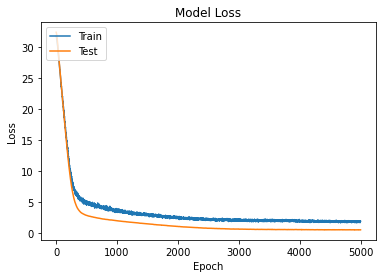

In [74]:
plot_loss()

Increasing the regularization value.
- Learning Rate = 1e-5
- Lambda = 1e-3

In [108]:
regressor(1e-5,1e-3)
history = bmodel.fit(X_train, y_train, batch_size=500, epochs=5000, verbose=1, validation_data = (X_test, y_test))

Epoch 1/5000
3/3 [==============================] - 0s 48ms/step - loss: 31.8427 - mean_squared_error: 31.8427 - val_loss: 32.4577 - val_mean_squared_error: 32.4577
Epoch 2/5000
3/3 [==============================] - 0s 7ms/step - loss: 31.7577 - mean_squared_error: 31.7577 - val_loss: 32.4399 - val_mean_squared_error: 32.4399
Epoch 3/5000
3/3 [==============================] - 0s 7ms/step - loss: 31.7458 - mean_squared_error: 31.7458 - val_loss: 32.4215 - val_mean_squared_error: 32.4215
Epoch 4/5000
3/3 [==============================] - 0s 9ms/step - loss: 31.7463 - mean_squared_error: 31.7463 - val_loss: 32.4017 - val_mean_squared_error: 32.4017
Epoch 5/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.6544 - mean_squared_error: 31.6544 - val_loss: 32.3795 - val_mean_squared_error: 32.3795
Epoch 6/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.5736 - mean_squared_error: 31.5736 - val_loss: 32.3508 - val_mean_squared_error: 32.3508
Epoch 7/5000
3/

Epoch 51/5000
3/3 [==============================] - 0s 8ms/step - loss: 28.0140 - mean_squared_error: 28.0140 - val_loss: 28.4330 - val_mean_squared_error: 28.4330
Epoch 52/5000
3/3 [==============================] - 0s 9ms/step - loss: 28.0329 - mean_squared_error: 28.0329 - val_loss: 28.3270 - val_mean_squared_error: 28.3270
Epoch 53/5000
3/3 [==============================] - 0s 10ms/step - loss: 27.8717 - mean_squared_error: 27.8717 - val_loss: 28.2218 - val_mean_squared_error: 28.2218
Epoch 54/5000
3/3 [==============================] - 0s 9ms/step - loss: 27.8549 - mean_squared_error: 27.8549 - val_loss: 28.1172 - val_mean_squared_error: 28.1172
Epoch 55/5000
3/3 [==============================] - 0s 10ms/step - loss: 27.8370 - mean_squared_error: 27.8370 - val_loss: 28.0168 - val_mean_squared_error: 28.0168
Epoch 56/5000
3/3 [==============================] - 0s 10ms/step - loss: 27.5512 - mean_squared_error: 27.5512 - val_loss: 27.9173 - val_mean_squared_error: 27.9173
Epoch 5

3/3 [==============================] - 0s 8ms/step - loss: 17.8281 - mean_squared_error: 17.8281 - val_loss: 17.6915 - val_mean_squared_error: 17.6915
Epoch 150/5000
3/3 [==============================] - 0s 8ms/step - loss: 17.7106 - mean_squared_error: 17.7106 - val_loss: 17.5718 - val_mean_squared_error: 17.5718
Epoch 151/5000
3/3 [==============================] - 0s 9ms/step - loss: 17.6357 - mean_squared_error: 17.6357 - val_loss: 17.4477 - val_mean_squared_error: 17.4477
Epoch 152/5000
3/3 [==============================] - 0s 13ms/step - loss: 17.5438 - mean_squared_error: 17.5438 - val_loss: 17.3288 - val_mean_squared_error: 17.3288
Epoch 153/5000
3/3 [==============================] - 0s 11ms/step - loss: 17.6266 - mean_squared_error: 17.6266 - val_loss: 17.2086 - val_mean_squared_error: 17.2086
Epoch 154/5000
3/3 [==============================] - 0s 13ms/step - loss: 17.3961 - mean_squared_error: 17.3961 - val_loss: 17.0868 - val_mean_squared_error: 17.0868
Epoch 155/5000
3

Epoch 248/5000
3/3 [==============================] - 0s 10ms/step - loss: 8.9206 - mean_squared_error: 8.9206 - val_loss: 7.7127 - val_mean_squared_error: 7.7127
Epoch 249/5000
3/3 [==============================] - 0s 10ms/step - loss: 9.1526 - mean_squared_error: 9.1526 - val_loss: 7.6462 - val_mean_squared_error: 7.6462
Epoch 250/5000
3/3 [==============================] - 0s 8ms/step - loss: 9.0109 - mean_squared_error: 9.0109 - val_loss: 7.5769 - val_mean_squared_error: 7.5769
Epoch 251/5000
3/3 [==============================] - 0s 11ms/step - loss: 8.9014 - mean_squared_error: 8.9014 - val_loss: 7.5107 - val_mean_squared_error: 7.5107
Epoch 252/5000
3/3 [==============================] - 0s 8ms/step - loss: 8.7232 - mean_squared_error: 8.7232 - val_loss: 7.4476 - val_mean_squared_error: 7.4476
Epoch 253/5000
3/3 [==============================] - 0s 8ms/step - loss: 8.9025 - mean_squared_error: 8.9025 - val_loss: 7.3823 - val_mean_squared_error: 7.3823
Epoch 254/5000
3/3 [=====

3/3 [==============================] - 0s 9ms/step - loss: 6.3183 - mean_squared_error: 6.3183 - val_loss: 4.0059 - val_mean_squared_error: 4.0059
Epoch 349/5000
3/3 [==============================] - 0s 11ms/step - loss: 5.6840 - mean_squared_error: 5.6840 - val_loss: 3.9885 - val_mean_squared_error: 3.9885
Epoch 350/5000
3/3 [==============================] - 0s 9ms/step - loss: 6.0727 - mean_squared_error: 6.0727 - val_loss: 3.9749 - val_mean_squared_error: 3.9749
Epoch 351/5000
3/3 [==============================] - 0s 11ms/step - loss: 6.0356 - mean_squared_error: 6.0356 - val_loss: 3.9631 - val_mean_squared_error: 3.9631
Epoch 352/5000
3/3 [==============================] - 0s 12ms/step - loss: 6.0387 - mean_squared_error: 6.0387 - val_loss: 3.9462 - val_mean_squared_error: 3.9462
Epoch 353/5000
3/3 [==============================] - 0s 9ms/step - loss: 6.0728 - mean_squared_error: 6.0728 - val_loss: 3.9343 - val_mean_squared_error: 3.9343
Epoch 354/5000
3/3 [====================

3/3 [==============================] - 0s 8ms/step - loss: 5.0873 - mean_squared_error: 5.0873 - val_loss: 3.1275 - val_mean_squared_error: 3.1275
Epoch 449/5000
3/3 [==============================] - 0s 9ms/step - loss: 5.1127 - mean_squared_error: 5.1127 - val_loss: 3.1229 - val_mean_squared_error: 3.1229
Epoch 450/5000
3/3 [==============================] - 0s 9ms/step - loss: 5.2512 - mean_squared_error: 5.2512 - val_loss: 3.1160 - val_mean_squared_error: 3.1160
Epoch 451/5000
3/3 [==============================] - 0s 8ms/step - loss: 5.2277 - mean_squared_error: 5.2277 - val_loss: 3.1092 - val_mean_squared_error: 3.1092
Epoch 452/5000
3/3 [==============================] - 0s 8ms/step - loss: 5.1875 - mean_squared_error: 5.1875 - val_loss: 3.1065 - val_mean_squared_error: 3.1065
Epoch 453/5000
3/3 [==============================] - 0s 8ms/step - loss: 5.2496 - mean_squared_error: 5.2496 - val_loss: 3.0999 - val_mean_squared_error: 3.0999
Epoch 454/5000
3/3 [=======================

3/3 [==============================] - 0s 9ms/step - loss: 4.7970 - mean_squared_error: 4.7970 - val_loss: 2.7321 - val_mean_squared_error: 2.7321
Epoch 549/5000
3/3 [==============================] - 0s 9ms/step - loss: 4.5134 - mean_squared_error: 4.5134 - val_loss: 2.7288 - val_mean_squared_error: 2.7288
Epoch 550/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.7434 - mean_squared_error: 4.7434 - val_loss: 2.7285 - val_mean_squared_error: 2.7285
Epoch 551/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.5957 - mean_squared_error: 4.5957 - val_loss: 2.7246 - val_mean_squared_error: 2.7246
Epoch 552/5000
3/3 [==============================] - 0s 9ms/step - loss: 4.8673 - mean_squared_error: 4.8673 - val_loss: 2.7196 - val_mean_squared_error: 2.7196
Epoch 553/5000
3/3 [==============================] - 0s 9ms/step - loss: 4.4791 - mean_squared_error: 4.4791 - val_loss: 2.7155 - val_mean_squared_error: 2.7155
Epoch 554/5000
3/3 [=======================

3/3 [==============================] - 0s 9ms/step - loss: 4.2351 - mean_squared_error: 4.2351 - val_loss: 2.4988 - val_mean_squared_error: 2.4988
Epoch 649/5000
3/3 [==============================] - 0s 9ms/step - loss: 4.4489 - mean_squared_error: 4.4489 - val_loss: 2.4993 - val_mean_squared_error: 2.4993
Epoch 650/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.3204 - mean_squared_error: 4.3204 - val_loss: 2.4977 - val_mean_squared_error: 2.4977
Epoch 651/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.2472 - mean_squared_error: 4.2472 - val_loss: 2.4959 - val_mean_squared_error: 2.4959
Epoch 652/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.1687 - mean_squared_error: 4.1687 - val_loss: 2.4924 - val_mean_squared_error: 2.4924
Epoch 653/5000
3/3 [==============================] - 0s 9ms/step - loss: 4.1204 - mean_squared_error: 4.1204 - val_loss: 2.4916 - val_mean_squared_error: 2.4916
Epoch 654/5000
3/3 [=======================

3/3 [==============================] - 0s 8ms/step - loss: 4.0217 - mean_squared_error: 4.0217 - val_loss: 2.3039 - val_mean_squared_error: 2.3039
Epoch 749/5000
3/3 [==============================] - 0s 9ms/step - loss: 3.9446 - mean_squared_error: 3.9446 - val_loss: 2.3041 - val_mean_squared_error: 2.3041
Epoch 750/5000
3/3 [==============================] - 0s 9ms/step - loss: 4.1280 - mean_squared_error: 4.1280 - val_loss: 2.3013 - val_mean_squared_error: 2.3013
Epoch 751/5000
3/3 [==============================] - 0s 9ms/step - loss: 4.3223 - mean_squared_error: 4.3223 - val_loss: 2.2983 - val_mean_squared_error: 2.2983
Epoch 752/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.8409 - mean_squared_error: 3.8409 - val_loss: 2.2956 - val_mean_squared_error: 2.2956
Epoch 753/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.7802 - mean_squared_error: 3.7802 - val_loss: 2.2896 - val_mean_squared_error: 2.2896
Epoch 754/5000
3/3 [=======================

3/3 [==============================] - 0s 12ms/step - loss: 3.7480 - mean_squared_error: 3.7480 - val_loss: 2.1416 - val_mean_squared_error: 2.1416
Epoch 849/5000
3/3 [==============================] - 0s 9ms/step - loss: 3.4960 - mean_squared_error: 3.4960 - val_loss: 2.1383 - val_mean_squared_error: 2.1383
Epoch 850/5000
3/3 [==============================] - 0s 7ms/step - loss: 3.7006 - mean_squared_error: 3.7006 - val_loss: 2.1356 - val_mean_squared_error: 2.1356
Epoch 851/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.8260 - mean_squared_error: 3.8260 - val_loss: 2.1353 - val_mean_squared_error: 2.1353
Epoch 852/5000
3/3 [==============================] - 0s 9ms/step - loss: 3.7469 - mean_squared_error: 3.7469 - val_loss: 2.1334 - val_mean_squared_error: 2.1334
Epoch 853/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.7315 - mean_squared_error: 3.7315 - val_loss: 2.1298 - val_mean_squared_error: 2.1298
Epoch 854/5000
3/3 [======================

3/3 [==============================] - 0s 10ms/step - loss: 3.4963 - mean_squared_error: 3.4963 - val_loss: 1.9865 - val_mean_squared_error: 1.9865
Epoch 949/5000
3/3 [==============================] - 0s 10ms/step - loss: 3.3954 - mean_squared_error: 3.3954 - val_loss: 1.9863 - val_mean_squared_error: 1.9863
Epoch 950/5000
3/3 [==============================] - 0s 9ms/step - loss: 3.4487 - mean_squared_error: 3.4487 - val_loss: 1.9854 - val_mean_squared_error: 1.9854
Epoch 951/5000
3/3 [==============================] - 0s 9ms/step - loss: 3.5731 - mean_squared_error: 3.5731 - val_loss: 1.9825 - val_mean_squared_error: 1.9825
Epoch 952/5000
3/3 [==============================] - 0s 11ms/step - loss: 3.6406 - mean_squared_error: 3.6406 - val_loss: 1.9814 - val_mean_squared_error: 1.9814
Epoch 953/5000
3/3 [==============================] - 0s 9ms/step - loss: 3.6443 - mean_squared_error: 3.6443 - val_loss: 1.9791 - val_mean_squared_error: 1.9791
Epoch 954/5000
3/3 [====================

3/3 [==============================] - 0s 8ms/step - loss: 3.5423 - mean_squared_error: 3.5423 - val_loss: 1.8688 - val_mean_squared_error: 1.8688
Epoch 1049/5000
3/3 [==============================] - 0s 10ms/step - loss: 3.1996 - mean_squared_error: 3.1996 - val_loss: 1.8644 - val_mean_squared_error: 1.8644
Epoch 1050/5000
3/3 [==============================] - 0s 9ms/step - loss: 3.1037 - mean_squared_error: 3.1037 - val_loss: 1.8582 - val_mean_squared_error: 1.8582
Epoch 1051/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.3421 - mean_squared_error: 3.3421 - val_loss: 1.8548 - val_mean_squared_error: 1.8548
Epoch 1052/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.2810 - mean_squared_error: 3.2810 - val_loss: 1.8539 - val_mean_squared_error: 1.8539
Epoch 1053/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.1385 - mean_squared_error: 3.1385 - val_loss: 1.8549 - val_mean_squared_error: 1.8549
Epoch 1054/5000
3/3 [================

3/3 [==============================] - 0s 10ms/step - loss: 3.1360 - mean_squared_error: 3.1360 - val_loss: 1.7356 - val_mean_squared_error: 1.7356
Epoch 1149/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.0466 - mean_squared_error: 3.0466 - val_loss: 1.7340 - val_mean_squared_error: 1.7340
Epoch 1150/5000
3/3 [==============================] - 0s 9ms/step - loss: 3.0338 - mean_squared_error: 3.0338 - val_loss: 1.7282 - val_mean_squared_error: 1.7282
Epoch 1151/5000
3/3 [==============================] - 0s 10ms/step - loss: 2.8890 - mean_squared_error: 2.8890 - val_loss: 1.7228 - val_mean_squared_error: 1.7228
Epoch 1152/5000
3/3 [==============================] - 0s 10ms/step - loss: 3.0651 - mean_squared_error: 3.0651 - val_loss: 1.7217 - val_mean_squared_error: 1.7217
Epoch 1153/5000
3/3 [==============================] - 0s 10ms/step - loss: 3.1453 - mean_squared_error: 3.1453 - val_loss: 1.7170 - val_mean_squared_error: 1.7170
Epoch 1154/5000
3/3 [=============

3/3 [==============================] - 0s 9ms/step - loss: 3.0052 - mean_squared_error: 3.0052 - val_loss: 1.6246 - val_mean_squared_error: 1.6246
Epoch 1249/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.7655 - mean_squared_error: 2.7655 - val_loss: 1.6221 - val_mean_squared_error: 1.6221
Epoch 1250/5000
3/3 [==============================] - 0s 10ms/step - loss: 3.1578 - mean_squared_error: 3.1578 - val_loss: 1.6241 - val_mean_squared_error: 1.6241
Epoch 1251/5000
3/3 [==============================] - 0s 11ms/step - loss: 3.2173 - mean_squared_error: 3.2173 - val_loss: 1.6233 - val_mean_squared_error: 1.6233
Epoch 1252/5000
3/3 [==============================] - 0s 13ms/step - loss: 2.9571 - mean_squared_error: 2.9571 - val_loss: 1.6215 - val_mean_squared_error: 1.6215
Epoch 1253/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.9142 - mean_squared_error: 2.9142 - val_loss: 1.6204 - val_mean_squared_error: 1.6204
Epoch 1254/5000
3/3 [==============

3/3 [==============================] - 0s 8ms/step - loss: 2.8792 - mean_squared_error: 2.8792 - val_loss: 1.5167 - val_mean_squared_error: 1.5167
Epoch 1349/5000
3/3 [==============================] - 0s 7ms/step - loss: 2.8703 - mean_squared_error: 2.8703 - val_loss: 1.5193 - val_mean_squared_error: 1.5193
Epoch 1350/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.8308 - mean_squared_error: 2.8308 - val_loss: 1.5240 - val_mean_squared_error: 1.5240
Epoch 1351/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.8715 - mean_squared_error: 2.8715 - val_loss: 1.5289 - val_mean_squared_error: 1.5289
Epoch 1352/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.7165 - mean_squared_error: 2.7165 - val_loss: 1.5252 - val_mean_squared_error: 1.5252
Epoch 1353/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.6205 - mean_squared_error: 2.6205 - val_loss: 1.5268 - val_mean_squared_error: 1.5268
Epoch 1354/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 2.7375 - mean_squared_error: 2.7375 - val_loss: 1.4128 - val_mean_squared_error: 1.4128
Epoch 1449/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.7472 - mean_squared_error: 2.7472 - val_loss: 1.4139 - val_mean_squared_error: 1.4139
Epoch 1450/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.7560 - mean_squared_error: 2.7560 - val_loss: 1.4139 - val_mean_squared_error: 1.4139
Epoch 1451/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.7231 - mean_squared_error: 2.7231 - val_loss: 1.4179 - val_mean_squared_error: 1.4179
Epoch 1452/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.7399 - mean_squared_error: 2.7399 - val_loss: 1.4184 - val_mean_squared_error: 1.4184
Epoch 1453/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.8248 - mean_squared_error: 2.8248 - val_loss: 1.4180 - val_mean_squared_error: 1.4180
Epoch 1454/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 2.6757 - mean_squared_error: 2.6757 - val_loss: 1.3336 - val_mean_squared_error: 1.3336
Epoch 1549/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.6720 - mean_squared_error: 2.6720 - val_loss: 1.3293 - val_mean_squared_error: 1.3293
Epoch 1550/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.6241 - mean_squared_error: 2.6241 - val_loss: 1.3256 - val_mean_squared_error: 1.3256
Epoch 1551/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.8384 - mean_squared_error: 2.8384 - val_loss: 1.3261 - val_mean_squared_error: 1.3261
Epoch 1552/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.7076 - mean_squared_error: 2.7076 - val_loss: 1.3267 - val_mean_squared_error: 1.3267
Epoch 1553/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.6951 - mean_squared_error: 2.6951 - val_loss: 1.3267 - val_mean_squared_error: 1.3267
Epoch 1554/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 2.5107 - mean_squared_error: 2.5107 - val_loss: 1.2370 - val_mean_squared_error: 1.2370
Epoch 1649/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.5229 - mean_squared_error: 2.5229 - val_loss: 1.2328 - val_mean_squared_error: 1.2328
Epoch 1650/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.5928 - mean_squared_error: 2.5928 - val_loss: 1.2334 - val_mean_squared_error: 1.2334
Epoch 1651/5000
3/3 [==============================] - 0s 12ms/step - loss: 2.4642 - mean_squared_error: 2.4642 - val_loss: 1.2329 - val_mean_squared_error: 1.2329
Epoch 1652/5000
3/3 [==============================] - 0s 7ms/step - loss: 2.6395 - mean_squared_error: 2.6395 - val_loss: 1.2349 - val_mean_squared_error: 1.2349
Epoch 1653/5000
3/3 [==============================] - 0s 10ms/step - loss: 2.4766 - mean_squared_error: 2.4766 - val_loss: 1.2354 - val_mean_squared_error: 1.2354
Epoch 1654/5000
3/3 [===============

3/3 [==============================] - 0s 13ms/step - loss: 2.3688 - mean_squared_error: 2.3688 - val_loss: 1.1559 - val_mean_squared_error: 1.1559
Epoch 1749/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.5246 - mean_squared_error: 2.5246 - val_loss: 1.1610 - val_mean_squared_error: 1.1610
Epoch 1750/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.4893 - mean_squared_error: 2.4893 - val_loss: 1.1574 - val_mean_squared_error: 1.1574
Epoch 1751/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.2809 - mean_squared_error: 2.2809 - val_loss: 1.1540 - val_mean_squared_error: 1.1540
Epoch 1752/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.3288 - mean_squared_error: 2.3288 - val_loss: 1.1525 - val_mean_squared_error: 1.1525
Epoch 1753/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.6000 - mean_squared_error: 2.6000 - val_loss: 1.1537 - val_mean_squared_error: 1.1537
Epoch 1754/5000
3/3 [================

3/3 [==============================] - 0s 9ms/step - loss: 2.1707 - mean_squared_error: 2.1707 - val_loss: 1.0745 - val_mean_squared_error: 1.0745
Epoch 1849/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.3581 - mean_squared_error: 2.3581 - val_loss: 1.0735 - val_mean_squared_error: 1.0735
Epoch 1850/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.4793 - mean_squared_error: 2.4793 - val_loss: 1.0693 - val_mean_squared_error: 1.0693
Epoch 1851/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.3070 - mean_squared_error: 2.3070 - val_loss: 1.0645 - val_mean_squared_error: 1.0645
Epoch 1852/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.2461 - mean_squared_error: 2.2461 - val_loss: 1.0728 - val_mean_squared_error: 1.0728
Epoch 1853/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.4086 - mean_squared_error: 2.4086 - val_loss: 1.0750 - val_mean_squared_error: 1.0750
Epoch 1854/5000
3/3 [=================

Epoch 1948/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.3092 - mean_squared_error: 2.3092 - val_loss: 0.9892 - val_mean_squared_error: 0.9892
Epoch 1949/5000
3/3 [==============================] - 0s 10ms/step - loss: 2.2764 - mean_squared_error: 2.2764 - val_loss: 0.9920 - val_mean_squared_error: 0.9920
Epoch 1950/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.2260 - mean_squared_error: 2.2260 - val_loss: 0.9902 - val_mean_squared_error: 0.9902
Epoch 1951/5000
3/3 [==============================] - 0s 12ms/step - loss: 2.2442 - mean_squared_error: 2.2442 - val_loss: 0.9864 - val_mean_squared_error: 0.9864
Epoch 1952/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.3015 - mean_squared_error: 2.3015 - val_loss: 0.9902 - val_mean_squared_error: 0.9902
Epoch 1953/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.3094 - mean_squared_error: 2.3094 - val_loss: 0.9948 - val_mean_squared_error: 0.9948
Epoch 1954/5000
3/3 

3/3 [==============================] - 0s 9ms/step - loss: 2.1519 - mean_squared_error: 2.1519 - val_loss: 0.9367 - val_mean_squared_error: 0.9367
Epoch 2049/5000
3/3 [==============================] - 0s 10ms/step - loss: 2.1497 - mean_squared_error: 2.1497 - val_loss: 0.9377 - val_mean_squared_error: 0.9377
Epoch 2050/5000
3/3 [==============================] - 0s 7ms/step - loss: 2.2164 - mean_squared_error: 2.2164 - val_loss: 0.9333 - val_mean_squared_error: 0.9333
Epoch 2051/5000
3/3 [==============================] - 0s 7ms/step - loss: 2.1333 - mean_squared_error: 2.1333 - val_loss: 0.9293 - val_mean_squared_error: 0.9293
Epoch 2052/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1705 - mean_squared_error: 2.1705 - val_loss: 0.9289 - val_mean_squared_error: 0.9289
Epoch 2053/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.2735 - mean_squared_error: 2.2735 - val_loss: 0.9271 - val_mean_squared_error: 0.9271
Epoch 2054/5000
3/3 [================

3/3 [==============================] - 0s 8ms/step - loss: 2.0566 - mean_squared_error: 2.0566 - val_loss: 0.8755 - val_mean_squared_error: 0.8755
Epoch 2149/5000
3/3 [==============================] - 0s 10ms/step - loss: 2.1545 - mean_squared_error: 2.1545 - val_loss: 0.8739 - val_mean_squared_error: 0.8739
Epoch 2150/5000
3/3 [==============================] - 0s 10ms/step - loss: 2.1888 - mean_squared_error: 2.1888 - val_loss: 0.8704 - val_mean_squared_error: 0.8704
Epoch 2151/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.0751 - mean_squared_error: 2.0751 - val_loss: 0.8717 - val_mean_squared_error: 0.8717
Epoch 2152/5000
3/3 [==============================] - 0s 10ms/step - loss: 2.1397 - mean_squared_error: 2.1397 - val_loss: 0.8673 - val_mean_squared_error: 0.8673
Epoch 2153/5000
3/3 [==============================] - 0s 10ms/step - loss: 2.2206 - mean_squared_error: 2.2206 - val_loss: 0.8676 - val_mean_squared_error: 0.8676
Epoch 2154/5000
3/3 [=============

3/3 [==============================] - 0s 8ms/step - loss: 2.0932 - mean_squared_error: 2.0932 - val_loss: 0.8373 - val_mean_squared_error: 0.8373
Epoch 2249/5000
3/3 [==============================] - 0s 7ms/step - loss: 2.2549 - mean_squared_error: 2.2549 - val_loss: 0.8369 - val_mean_squared_error: 0.8369
Epoch 2250/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.1811 - mean_squared_error: 2.1811 - val_loss: 0.8336 - val_mean_squared_error: 0.8336
Epoch 2251/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0990 - mean_squared_error: 2.0990 - val_loss: 0.8371 - val_mean_squared_error: 0.8371
Epoch 2252/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1398 - mean_squared_error: 2.1398 - val_loss: 0.8333 - val_mean_squared_error: 0.8333
Epoch 2253/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0497 - mean_squared_error: 2.0497 - val_loss: 0.8341 - val_mean_squared_error: 0.8341
Epoch 2254/5000
3/3 [=================

3/3 [==============================] - 0s 12ms/step - loss: 2.0098 - mean_squared_error: 2.0098 - val_loss: 0.7769 - val_mean_squared_error: 0.7769
Epoch 2349/5000
3/3 [==============================] - 0s 10ms/step - loss: 2.1195 - mean_squared_error: 2.1195 - val_loss: 0.7809 - val_mean_squared_error: 0.7809
Epoch 2350/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0547 - mean_squared_error: 2.0547 - val_loss: 0.7795 - val_mean_squared_error: 0.7795
Epoch 2351/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0426 - mean_squared_error: 2.0426 - val_loss: 0.7794 - val_mean_squared_error: 0.7794
Epoch 2352/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.9632 - mean_squared_error: 1.9632 - val_loss: 0.7762 - val_mean_squared_error: 0.7762
Epoch 2353/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.1046 - mean_squared_error: 2.1046 - val_loss: 0.7748 - val_mean_squared_error: 0.7748
Epoch 2354/5000
3/3 [===============

3/3 [==============================] - 0s 10ms/step - loss: 2.1513 - mean_squared_error: 2.1513 - val_loss: 0.7352 - val_mean_squared_error: 0.7352
Epoch 2449/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9641 - mean_squared_error: 1.9641 - val_loss: 0.7301 - val_mean_squared_error: 0.7301
Epoch 2450/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.9888 - mean_squared_error: 1.9888 - val_loss: 0.7269 - val_mean_squared_error: 0.7269
Epoch 2451/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.0414 - mean_squared_error: 2.0414 - val_loss: 0.7298 - val_mean_squared_error: 0.7298
Epoch 2452/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1833 - mean_squared_error: 2.1833 - val_loss: 0.7267 - val_mean_squared_error: 0.7267
Epoch 2453/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.0471 - mean_squared_error: 2.0471 - val_loss: 0.7261 - val_mean_squared_error: 0.7261
Epoch 2454/5000
3/3 [================

3/3 [==============================] - 0s 9ms/step - loss: 2.0796 - mean_squared_error: 2.0796 - val_loss: 0.6949 - val_mean_squared_error: 0.6949
Epoch 2549/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0132 - mean_squared_error: 2.0132 - val_loss: 0.6913 - val_mean_squared_error: 0.6913
Epoch 2550/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0631 - mean_squared_error: 2.0631 - val_loss: 0.6944 - val_mean_squared_error: 0.6944
Epoch 2551/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9864 - mean_squared_error: 1.9864 - val_loss: 0.6940 - val_mean_squared_error: 0.6940
Epoch 2552/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1131 - mean_squared_error: 2.1131 - val_loss: 0.6992 - val_mean_squared_error: 0.6992
Epoch 2553/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9953 - mean_squared_error: 1.9953 - val_loss: 0.6938 - val_mean_squared_error: 0.6938
Epoch 2554/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 1.9686 - mean_squared_error: 1.9686 - val_loss: 0.6649 - val_mean_squared_error: 0.6649
Epoch 2649/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1785 - mean_squared_error: 2.1785 - val_loss: 0.6653 - val_mean_squared_error: 0.6653
Epoch 2650/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.9241 - mean_squared_error: 1.9241 - val_loss: 0.6616 - val_mean_squared_error: 0.6616
Epoch 2651/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9659 - mean_squared_error: 1.9659 - val_loss: 0.6639 - val_mean_squared_error: 0.6639
Epoch 2652/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.8822 - mean_squared_error: 1.8822 - val_loss: 0.6639 - val_mean_squared_error: 0.6639
Epoch 2653/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7911 - mean_squared_error: 1.7911 - val_loss: 0.6667 - val_mean_squared_error: 0.6667
Epoch 2654/5000
3/3 [=================

3/3 [==============================] - 0s 9ms/step - loss: 2.0118 - mean_squared_error: 2.0118 - val_loss: 0.6411 - val_mean_squared_error: 0.6411
Epoch 2749/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9440 - mean_squared_error: 1.9440 - val_loss: 0.6422 - val_mean_squared_error: 0.6422
Epoch 2750/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0401 - mean_squared_error: 2.0401 - val_loss: 0.6408 - val_mean_squared_error: 0.6408
Epoch 2751/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1874 - mean_squared_error: 2.1874 - val_loss: 0.6399 - val_mean_squared_error: 0.6399
Epoch 2752/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.9541 - mean_squared_error: 1.9541 - val_loss: 0.6384 - val_mean_squared_error: 0.6384
Epoch 2753/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9611 - mean_squared_error: 1.9611 - val_loss: 0.6372 - val_mean_squared_error: 0.6372
Epoch 2754/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 2.0496 - mean_squared_error: 2.0496 - val_loss: 0.6189 - val_mean_squared_error: 0.6189
Epoch 2849/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.9684 - mean_squared_error: 1.9684 - val_loss: 0.6163 - val_mean_squared_error: 0.6163
Epoch 2850/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.8882 - mean_squared_error: 1.8882 - val_loss: 0.6128 - val_mean_squared_error: 0.6128
Epoch 2851/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.0023 - mean_squared_error: 2.0023 - val_loss: 0.6172 - val_mean_squared_error: 0.6172
Epoch 2852/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.7828 - mean_squared_error: 1.7828 - val_loss: 0.6219 - val_mean_squared_error: 0.6219
Epoch 2853/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.0383 - mean_squared_error: 2.0383 - val_loss: 0.6191 - val_mean_squared_error: 0.6191
Epoch 2854/5000
3/3 [=================

3/3 [==============================] - 0s 11ms/step - loss: 1.9431 - mean_squared_error: 1.9431 - val_loss: 0.5948 - val_mean_squared_error: 0.5948
Epoch 2949/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8847 - mean_squared_error: 1.8847 - val_loss: 0.5960 - val_mean_squared_error: 0.5960
Epoch 2950/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8072 - mean_squared_error: 1.8072 - val_loss: 0.5904 - val_mean_squared_error: 0.5904
Epoch 2951/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9580 - mean_squared_error: 1.9580 - val_loss: 0.5936 - val_mean_squared_error: 0.5936
Epoch 2952/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9770 - mean_squared_error: 1.9770 - val_loss: 0.5967 - val_mean_squared_error: 0.5967
Epoch 2953/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9038 - mean_squared_error: 1.9038 - val_loss: 0.6006 - val_mean_squared_error: 0.6006
Epoch 2954/5000
3/3 [================

3/3 [==============================] - 0s 7ms/step - loss: 1.8698 - mean_squared_error: 1.8698 - val_loss: 0.5809 - val_mean_squared_error: 0.5809
Epoch 3049/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8169 - mean_squared_error: 1.8169 - val_loss: 0.5775 - val_mean_squared_error: 0.5775
Epoch 3050/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9587 - mean_squared_error: 1.9587 - val_loss: 0.5812 - val_mean_squared_error: 0.5812
Epoch 3051/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9672 - mean_squared_error: 1.9672 - val_loss: 0.5815 - val_mean_squared_error: 0.5815
Epoch 3052/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9619 - mean_squared_error: 1.9619 - val_loss: 0.5780 - val_mean_squared_error: 0.5780
Epoch 3053/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.9325 - mean_squared_error: 1.9325 - val_loss: 0.5814 - val_mean_squared_error: 0.5814
Epoch 3054/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 2.0666 - mean_squared_error: 2.0666 - val_loss: 0.5775 - val_mean_squared_error: 0.5775
Epoch 3149/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9256 - mean_squared_error: 1.9256 - val_loss: 0.5771 - val_mean_squared_error: 0.5771
Epoch 3150/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.8467 - mean_squared_error: 1.8467 - val_loss: 0.5710 - val_mean_squared_error: 0.5710
Epoch 3151/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9989 - mean_squared_error: 1.9989 - val_loss: 0.5697 - val_mean_squared_error: 0.5697
Epoch 3152/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8187 - mean_squared_error: 1.8187 - val_loss: 0.5777 - val_mean_squared_error: 0.5777
Epoch 3153/5000
3/3 [==============================] - 0s 10ms/step - loss: 1.8479 - mean_squared_error: 1.8479 - val_loss: 0.5791 - val_mean_squared_error: 0.5791
Epoch 3154/5000
3/3 [================

3/3 [==============================] - 0s 9ms/step - loss: 1.8384 - mean_squared_error: 1.8384 - val_loss: 0.5613 - val_mean_squared_error: 0.5613
Epoch 3249/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8474 - mean_squared_error: 1.8474 - val_loss: 0.5554 - val_mean_squared_error: 0.5554
Epoch 3250/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.9461 - mean_squared_error: 1.9461 - val_loss: 0.5565 - val_mean_squared_error: 0.5565
Epoch 3251/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.9181 - mean_squared_error: 1.9181 - val_loss: 0.5593 - val_mean_squared_error: 0.5593
Epoch 3252/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.6439 - mean_squared_error: 1.6439 - val_loss: 0.5580 - val_mean_squared_error: 0.5580
Epoch 3253/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9084 - mean_squared_error: 1.9084 - val_loss: 0.5555 - val_mean_squared_error: 0.5555
Epoch 3254/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 1.8365 - mean_squared_error: 1.8365 - val_loss: 0.5450 - val_mean_squared_error: 0.5450
Epoch 3349/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.7872 - mean_squared_error: 1.7872 - val_loss: 0.5459 - val_mean_squared_error: 0.5459
Epoch 3350/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0148 - mean_squared_error: 2.0148 - val_loss: 0.5493 - val_mean_squared_error: 0.5493
Epoch 3351/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8932 - mean_squared_error: 1.8932 - val_loss: 0.5477 - val_mean_squared_error: 0.5477
Epoch 3352/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8043 - mean_squared_error: 1.8043 - val_loss: 0.5426 - val_mean_squared_error: 0.5426
Epoch 3353/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9523 - mean_squared_error: 1.9523 - val_loss: 0.5424 - val_mean_squared_error: 0.5424
Epoch 3354/5000
3/3 [=================

3/3 [==============================] - 0s 12ms/step - loss: 1.7257 - mean_squared_error: 1.7257 - val_loss: 0.5481 - val_mean_squared_error: 0.5481
Epoch 3449/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.9228 - mean_squared_error: 1.9228 - val_loss: 0.5512 - val_mean_squared_error: 0.5512
Epoch 3450/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.8985 - mean_squared_error: 1.8985 - val_loss: 0.5474 - val_mean_squared_error: 0.5474
Epoch 3451/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.7293 - mean_squared_error: 1.7293 - val_loss: 0.5423 - val_mean_squared_error: 0.5423
Epoch 3452/5000
3/3 [==============================] - 0s 10ms/step - loss: 1.9577 - mean_squared_error: 1.9577 - val_loss: 0.5411 - val_mean_squared_error: 0.5411
Epoch 3453/5000
3/3 [==============================] - 0s 12ms/step - loss: 1.8493 - mean_squared_error: 1.8493 - val_loss: 0.5452 - val_mean_squared_error: 0.5452
Epoch 3454/5000
3/3 [=============

3/3 [==============================] - 0s 11ms/step - loss: 1.7792 - mean_squared_error: 1.7792 - val_loss: 0.5357 - val_mean_squared_error: 0.5357
Epoch 3549/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.8332 - mean_squared_error: 1.8332 - val_loss: 0.5362 - val_mean_squared_error: 0.5362
Epoch 3550/5000
3/3 [==============================] - 0s 10ms/step - loss: 1.8434 - mean_squared_error: 1.8434 - val_loss: 0.5330 - val_mean_squared_error: 0.5330
Epoch 3551/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.8491 - mean_squared_error: 1.8491 - val_loss: 0.5335 - val_mean_squared_error: 0.5335
Epoch 3552/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.7334 - mean_squared_error: 1.7334 - val_loss: 0.5377 - val_mean_squared_error: 0.5377
Epoch 3553/5000
3/3 [==============================] - 0s 13ms/step - loss: 1.7453 - mean_squared_error: 1.7453 - val_loss: 0.5354 - val_mean_squared_error: 0.5354
Epoch 3554/5000
3/3 [===========

3/3 [==============================] - 0s 14ms/step - loss: 1.9379 - mean_squared_error: 1.9379 - val_loss: 0.5307 - val_mean_squared_error: 0.5307
Epoch 3599/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.8267 - mean_squared_error: 1.8267 - val_loss: 0.5285 - val_mean_squared_error: 0.5285
Epoch 3600/5000
3/3 [==============================] - 0s 10ms/step - loss: 1.8788 - mean_squared_error: 1.8788 - val_loss: 0.5291 - val_mean_squared_error: 0.5291
Epoch 3601/5000
3/3 [==============================] - 0s 10ms/step - loss: 1.7779 - mean_squared_error: 1.7779 - val_loss: 0.5276 - val_mean_squared_error: 0.5276
Epoch 3602/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8551 - mean_squared_error: 1.8551 - val_loss: 0.5359 - val_mean_squared_error: 0.5359
Epoch 3603/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.6684 - mean_squared_error: 1.6684 - val_loss: 0.5277 - val_mean_squared_error: 0.5277
Epoch 3604/5000
3/3 [==============

3/3 [==============================] - 0s 6ms/step - loss: 1.8098 - mean_squared_error: 1.8098 - val_loss: 0.5253 - val_mean_squared_error: 0.5253
Epoch 3699/5000
3/3 [==============================] - 0s 6ms/step - loss: 1.9457 - mean_squared_error: 1.9457 - val_loss: 0.5307 - val_mean_squared_error: 0.5307
Epoch 3700/5000
3/3 [==============================] - 0s 6ms/step - loss: 1.8053 - mean_squared_error: 1.8053 - val_loss: 0.5179 - val_mean_squared_error: 0.5179
Epoch 3701/5000
3/3 [==============================] - 0s 6ms/step - loss: 1.8192 - mean_squared_error: 1.8192 - val_loss: 0.5176 - val_mean_squared_error: 0.5176
Epoch 3702/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.8581 - mean_squared_error: 1.8581 - val_loss: 0.5178 - val_mean_squared_error: 0.5178
Epoch 3703/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.6759 - mean_squared_error: 1.6759 - val_loss: 0.5254 - val_mean_squared_error: 0.5254
Epoch 3704/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 1.9103 - mean_squared_error: 1.9103 - val_loss: 0.5184 - val_mean_squared_error: 0.5184
Epoch 3799/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7904 - mean_squared_error: 1.7904 - val_loss: 0.5236 - val_mean_squared_error: 0.5236
Epoch 3800/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7207 - mean_squared_error: 1.7207 - val_loss: 0.5181 - val_mean_squared_error: 0.5181
Epoch 3801/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7040 - mean_squared_error: 1.7040 - val_loss: 0.5270 - val_mean_squared_error: 0.5270
Epoch 3802/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.8598 - mean_squared_error: 1.8598 - val_loss: 0.5204 - val_mean_squared_error: 0.5204
Epoch 3803/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.7545 - mean_squared_error: 1.7545 - val_loss: 0.5240 - val_mean_squared_error: 0.5240
Epoch 3804/5000
3/3 [=================

3/3 [==============================] - 0s 10ms/step - loss: 1.8821 - mean_squared_error: 1.8821 - val_loss: 0.5080 - val_mean_squared_error: 0.5080
Epoch 3899/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.6872 - mean_squared_error: 1.6872 - val_loss: 0.5053 - val_mean_squared_error: 0.5053
Epoch 3900/5000
3/3 [==============================] - 0s 10ms/step - loss: 1.7197 - mean_squared_error: 1.7197 - val_loss: 0.5054 - val_mean_squared_error: 0.5054
Epoch 3901/5000
3/3 [==============================] - 0s 10ms/step - loss: 1.7385 - mean_squared_error: 1.7385 - val_loss: 0.5075 - val_mean_squared_error: 0.5075
Epoch 3902/5000
3/3 [==============================] - 0s 10ms/step - loss: 1.8678 - mean_squared_error: 1.8678 - val_loss: 0.5084 - val_mean_squared_error: 0.5084
Epoch 3903/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.8135 - mean_squared_error: 1.8135 - val_loss: 0.5083 - val_mean_squared_error: 0.5083
Epoch 3904/5000
3/3 [============

3/3 [==============================] - 0s 8ms/step - loss: 1.8096 - mean_squared_error: 1.8096 - val_loss: 0.5129 - val_mean_squared_error: 0.5129
Epoch 3999/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.6613 - mean_squared_error: 1.6613 - val_loss: 0.5115 - val_mean_squared_error: 0.5115
Epoch 4000/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.7736 - mean_squared_error: 1.7736 - val_loss: 0.5068 - val_mean_squared_error: 0.5068
Epoch 4001/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.8403 - mean_squared_error: 1.8403 - val_loss: 0.5046 - val_mean_squared_error: 0.5046
Epoch 4002/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.7623 - mean_squared_error: 1.7623 - val_loss: 0.5024 - val_mean_squared_error: 0.5024
Epoch 4003/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.7567 - mean_squared_error: 1.7567 - val_loss: 0.5003 - val_mean_squared_error: 0.5003
Epoch 4004/5000
3/3 [=================

3/3 [==============================] - 0s 10ms/step - loss: 1.6923 - mean_squared_error: 1.6923 - val_loss: 0.5059 - val_mean_squared_error: 0.5059
Epoch 4099/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.8524 - mean_squared_error: 1.8524 - val_loss: 0.5104 - val_mean_squared_error: 0.5104
Epoch 4100/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.8190 - mean_squared_error: 1.8190 - val_loss: 0.5111 - val_mean_squared_error: 0.5111
Epoch 4101/5000
3/3 [==============================] - 0s 10ms/step - loss: 1.8162 - mean_squared_error: 1.8162 - val_loss: 0.5152 - val_mean_squared_error: 0.5152
Epoch 4102/5000
3/3 [==============================] - 0s 12ms/step - loss: 1.7217 - mean_squared_error: 1.7217 - val_loss: 0.5140 - val_mean_squared_error: 0.5140
Epoch 4103/5000
3/3 [==============================] - 0s 10ms/step - loss: 1.9031 - mean_squared_error: 1.9031 - val_loss: 0.5084 - val_mean_squared_error: 0.5084
Epoch 4104/5000
3/3 [=============

3/3 [==============================] - 0s 8ms/step - loss: 1.7222 - mean_squared_error: 1.7222 - val_loss: 0.5137 - val_mean_squared_error: 0.5137
Epoch 4199/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.6660 - mean_squared_error: 1.6660 - val_loss: 0.5135 - val_mean_squared_error: 0.5135
Epoch 4200/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8747 - mean_squared_error: 1.8747 - val_loss: 0.5123 - val_mean_squared_error: 0.5123
Epoch 4201/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8048 - mean_squared_error: 1.8048 - val_loss: 0.5080 - val_mean_squared_error: 0.5080
Epoch 4202/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.7600 - mean_squared_error: 1.7600 - val_loss: 0.5014 - val_mean_squared_error: 0.5014
Epoch 4203/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.8673 - mean_squared_error: 1.8673 - val_loss: 0.4990 - val_mean_squared_error: 0.4990
Epoch 4204/5000
3/3 [=================

Epoch 4248/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8049 - mean_squared_error: 1.8049 - val_loss: 0.4972 - val_mean_squared_error: 0.4972
Epoch 4249/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.8978 - mean_squared_error: 1.8978 - val_loss: 0.5003 - val_mean_squared_error: 0.5003
Epoch 4250/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7301 - mean_squared_error: 1.7301 - val_loss: 0.5020 - val_mean_squared_error: 0.5020
Epoch 4251/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.8345 - mean_squared_error: 1.8345 - val_loss: 0.5004 - val_mean_squared_error: 0.5004
Epoch 4252/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.7845 - mean_squared_error: 1.7845 - val_loss: 0.4971 - val_mean_squared_error: 0.4971
Epoch 4253/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.8132 - mean_squared_error: 1.8132 - val_loss: 0.4953 - val_mean_squared_error: 0.4953
Epoch 4254/5000
3/3 [

3/3 [==============================] - 0s 12ms/step - loss: 1.7927 - mean_squared_error: 1.7927 - val_loss: 0.5115 - val_mean_squared_error: 0.5115
Epoch 4349/5000
3/3 [==============================] - 0s 12ms/step - loss: 1.7985 - mean_squared_error: 1.7985 - val_loss: 0.5044 - val_mean_squared_error: 0.5044
Epoch 4350/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.8393 - mean_squared_error: 1.8393 - val_loss: 0.5053 - val_mean_squared_error: 0.5053
Epoch 4351/5000
3/3 [==============================] - 0s 10ms/step - loss: 1.7432 - mean_squared_error: 1.7432 - val_loss: 0.5078 - val_mean_squared_error: 0.5078
Epoch 4352/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.7447 - mean_squared_error: 1.7447 - val_loss: 0.5158 - val_mean_squared_error: 0.5158
Epoch 4353/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8694 - mean_squared_error: 1.8694 - val_loss: 0.5244 - val_mean_squared_error: 0.5244
Epoch 4354/5000
3/3 [============

3/3 [==============================] - 0s 8ms/step - loss: 1.8121 - mean_squared_error: 1.8121 - val_loss: 0.4882 - val_mean_squared_error: 0.4882
Epoch 4449/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0081 - mean_squared_error: 2.0081 - val_loss: 0.4930 - val_mean_squared_error: 0.4930
Epoch 4450/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7577 - mean_squared_error: 1.7577 - val_loss: 0.4921 - val_mean_squared_error: 0.4921
Epoch 4451/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.8326 - mean_squared_error: 1.8326 - val_loss: 0.4891 - val_mean_squared_error: 0.4891
Epoch 4452/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7063 - mean_squared_error: 1.7063 - val_loss: 0.4911 - val_mean_squared_error: 0.4911
Epoch 4453/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.8349 - mean_squared_error: 1.8349 - val_loss: 0.4930 - val_mean_squared_error: 0.4930
Epoch 4454/5000
3/3 [================

3/3 [==============================] - 0s 8ms/step - loss: 1.7592 - mean_squared_error: 1.7592 - val_loss: 0.5000 - val_mean_squared_error: 0.5000
Epoch 4549/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.6193 - mean_squared_error: 1.6193 - val_loss: 0.4990 - val_mean_squared_error: 0.4990
Epoch 4550/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.6728 - mean_squared_error: 1.6728 - val_loss: 0.4967 - val_mean_squared_error: 0.4967
Epoch 4551/5000
3/3 [==============================] - 0s 10ms/step - loss: 1.8034 - mean_squared_error: 1.8034 - val_loss: 0.4983 - val_mean_squared_error: 0.4983
Epoch 4552/5000
3/3 [==============================] - 0s 10ms/step - loss: 1.7126 - mean_squared_error: 1.7126 - val_loss: 0.5049 - val_mean_squared_error: 0.5049
Epoch 4553/5000
3/3 [==============================] - 0s 16ms/step - loss: 1.6449 - mean_squared_error: 1.6449 - val_loss: 0.5048 - val_mean_squared_error: 0.5048
Epoch 4554/5000
3/3 [==============

3/3 [==============================] - 0s 8ms/step - loss: 1.6620 - mean_squared_error: 1.6620 - val_loss: 0.4956 - val_mean_squared_error: 0.4956
Epoch 4649/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.7198 - mean_squared_error: 1.7198 - val_loss: 0.4982 - val_mean_squared_error: 0.4982
Epoch 4650/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.7353 - mean_squared_error: 1.7353 - val_loss: 0.5041 - val_mean_squared_error: 0.5041
Epoch 4651/5000
3/3 [==============================] - 0s 10ms/step - loss: 1.8134 - mean_squared_error: 1.8134 - val_loss: 0.5041 - val_mean_squared_error: 0.5041
Epoch 4652/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7468 - mean_squared_error: 1.7468 - val_loss: 0.4978 - val_mean_squared_error: 0.4978
Epoch 4653/5000
3/3 [==============================] - 0s 10ms/step - loss: 1.8359 - mean_squared_error: 1.8359 - val_loss: 0.4950 - val_mean_squared_error: 0.4950
Epoch 4654/5000
3/3 [===============

3/3 [==============================] - 0s 8ms/step - loss: 1.6114 - mean_squared_error: 1.6114 - val_loss: 0.4819 - val_mean_squared_error: 0.4819
Epoch 4749/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.6809 - mean_squared_error: 1.6809 - val_loss: 0.4852 - val_mean_squared_error: 0.4852
Epoch 4750/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.7345 - mean_squared_error: 1.7345 - val_loss: 0.4796 - val_mean_squared_error: 0.4796
Epoch 4751/5000
3/3 [==============================] - 0s 10ms/step - loss: 1.9059 - mean_squared_error: 1.9059 - val_loss: 0.4826 - val_mean_squared_error: 0.4826
Epoch 4752/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.5965 - mean_squared_error: 1.5965 - val_loss: 0.4853 - val_mean_squared_error: 0.4853
Epoch 4753/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.7846 - mean_squared_error: 1.7846 - val_loss: 0.4848 - val_mean_squared_error: 0.4848
Epoch 4754/5000
3/3 [================

3/3 [==============================] - 0s 10ms/step - loss: 1.7837 - mean_squared_error: 1.7837 - val_loss: 0.4932 - val_mean_squared_error: 0.4932
Epoch 4849/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.6440 - mean_squared_error: 1.6440 - val_loss: 0.4949 - val_mean_squared_error: 0.4949
Epoch 4850/5000
3/3 [==============================] - 0s 11ms/step - loss: 1.6724 - mean_squared_error: 1.6724 - val_loss: 0.5027 - val_mean_squared_error: 0.5027
Epoch 4851/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.8288 - mean_squared_error: 1.8288 - val_loss: 0.4966 - val_mean_squared_error: 0.4966
Epoch 4852/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.7719 - mean_squared_error: 1.7719 - val_loss: 0.4943 - val_mean_squared_error: 0.4943
Epoch 4853/5000
3/3 [==============================] - 0s 14ms/step - loss: 1.6962 - mean_squared_error: 1.6962 - val_loss: 0.4949 - val_mean_squared_error: 0.4949
Epoch 4854/5000
3/3 [=============

3/3 [==============================] - 0s 8ms/step - loss: 1.8081 - mean_squared_error: 1.8081 - val_loss: 0.4812 - val_mean_squared_error: 0.4812
Epoch 4949/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.8729 - mean_squared_error: 1.8729 - val_loss: 0.4777 - val_mean_squared_error: 0.4777
Epoch 4950/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.7324 - mean_squared_error: 1.7324 - val_loss: 0.4800 - val_mean_squared_error: 0.4800
Epoch 4951/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.6973 - mean_squared_error: 1.6973 - val_loss: 0.4832 - val_mean_squared_error: 0.4832
Epoch 4952/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9151 - mean_squared_error: 1.9151 - val_loss: 0.4856 - val_mean_squared_error: 0.4856
Epoch 4953/5000
3/3 [==============================] - 0s 10ms/step - loss: 1.6361 - mean_squared_error: 1.6361 - val_loss: 0.4887 - val_mean_squared_error: 0.4887
Epoch 4954/5000
3/3 [================

In [109]:
#Checking for MSE

bmodel.evaluate(X_test, y_test)          

15/15 [==============================] - 0s 1ms/step - loss: 0.4825 - mean_squared_error: 0.4825


[0.48250922560691833, 0.48250922560691833]

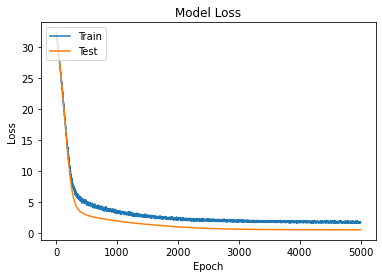

In [110]:
plot_loss()

## Pickling the model for future use

In [111]:
bmodel.save("model_reg.h5")

In [112]:
model_rr = load_model('model_reg.h5')

In [113]:
y_pred = model_rr.predict(X_test)

In [114]:
print(np.round(y_pred[0],1))
print(np.round(y_pred[1],1))
print(np.round(y_pred[2],1))
print(np.round(y_pred[3],1))
print(np.round(y_pred[4],1))

[5.4]
[5.7]
[6.1]
[5.3]
[5.5]


In [107]:
print(y_test.head())

1526    6
674     6
1508    6
58      5
1351    6
Name: Signal_Strength, dtype: int64


# Part Two - Building a Classifier Model

In [176]:
# Reading the dataset
sdf1 = pd.read_excel('Signal_P123.xlsx')

In [177]:
sdf1['Signal_Strength'].value_counts()

5    681
6    638
7    199
4     53
8     18
3     10
Name: Signal_Strength, dtype: int64

In [178]:
#Treating outliers of all the independent columns

for col in sdf1.columns[:-1]:
    p = np.percentile(sdf1[col], [25, 75])
    iqr = p[1]-p[0]
    sdf1.loc[:, col].clip(lower = p[0]-1.5*iqr, upper = p[1]+1.5*iqr, inplace = True)

In [179]:
# Normalizing the data using the minmax scaler to bring the feature variables within the range -1 to 1

x = sdf1.drop(['Signal_Strength'],axis=1)
y = sdf1['Signal_Strength']

# X = preprocessing.normalize(x)
scaler = StandardScaler().fit(x)
X = scaler.transform(x)

In [180]:
seed = 7
np.random.seed(seed)

In [181]:
# splitting to create test data
Xc_train, Xc_test, yc_train, yc_test = train_test_split(X, y, test_size=.30, random_state=seed)

### Designing, training, tuning and testing a neural network classifier.

In [182]:
#Converting array of labeled data to a binary class matrix

yc_train = np_utils.to_categorical(yc_train, 9)
yc_test = np_utils.to_categorical(yc_test, 9)

In [139]:
def cls_model(Xc_train, yc_train, Xc_test, yc_test, lrate):

    #Input Layer
    input_layer = Input(shape=(X.shape[1],))

    #Hidden Layer
    dense_layer_1 = Dense(512, activation='relu')(input_layer)
    dense_layer_2 = Dense(300, activation='relu')(dense_layer_1)

    #Output Layer
    output = Dense(9, activation='softmax', kernel_regularizer=regularizers.l2(0.01))(dense_layer_2)

    #Compiling the model
    cfmodel = Model(inputs=input_layer, outputs=output)
    cfmodel.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc'])
    
    history = cfmodel.fit(Xc_train, yc_train, batch_size=1200, epochs=3000, verbose=1, validation_data = (Xc_test, yc_test))

    #Plotting the learning curves
    plt.plot(history.history['acc'], label='train')
    plt.plot(history.history['val_acc'], label='test')
    plt.title('Learning Rate ='+str(lrate), pad=-80)
    

Epoch 1/3000
1/1 [==============================] - 0s 132ms/step - loss: 2.2440 - acc: 0.4173 - val_loss: 2.0190 - val_acc: 0.4604
Epoch 2/3000
1/1 [==============================] - 0s 18ms/step - loss: 2.0170 - acc: 0.4915 - val_loss: 1.8247 - val_acc: 0.5042
Epoch 3/3000
1/1 [==============================] - 0s 17ms/step - loss: 1.8219 - acc: 0.5451 - val_loss: 1.6636 - val_acc: 0.5312
Epoch 4/3000
1/1 [==============================] - 0s 16ms/step - loss: 1.6600 - acc: 0.5693 - val_loss: 1.5360 - val_acc: 0.5375
Epoch 5/3000
1/1 [==============================] - 0s 18ms/step - loss: 1.5315 - acc: 0.5719 - val_loss: 1.4409 - val_acc: 0.5479
Epoch 6/3000
1/1 [==============================] - 0s 15ms/step - loss: 1.4350 - acc: 0.5737 - val_loss: 1.3734 - val_acc: 0.5708
Epoch 7/3000
1/1 [==============================] - 0s 17ms/step - loss: 1.3652 - acc: 0.5746 - val_loss: 1.3268 - val_acc: 0.5771
Epoch 8/3000
1/1 [==============================] - 0s 17ms/step - loss: 1.3150 - 

Epoch 125/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.6731 - acc: 0.7882 - val_loss: 1.0822 - val_acc: 0.6146
Epoch 126/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.6693 - acc: 0.7891 - val_loss: 1.0829 - val_acc: 0.6146
Epoch 127/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.6656 - acc: 0.7936 - val_loss: 1.0837 - val_acc: 0.6167
Epoch 128/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.6618 - acc: 0.7980 - val_loss: 1.0844 - val_acc: 0.6208
Epoch 129/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.6580 - acc: 0.7989 - val_loss: 1.0850 - val_acc: 0.6250
Epoch 130/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.6541 - acc: 0.7998 - val_loss: 1.0858 - val_acc: 0.6250
Epoch 131/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.6503 - acc: 0.8025 - val_loss: 1.0867 - val_acc: 0.6229
Epoch 132/3000
1/1 [==============================] - 0s 17ms/step - 

Epoch 248/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.3175 - acc: 0.9571 - val_loss: 1.2736 - val_acc: 0.6562
Epoch 249/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.3159 - acc: 0.9580 - val_loss: 1.2733 - val_acc: 0.6521
Epoch 250/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.3143 - acc: 0.9598 - val_loss: 1.2769 - val_acc: 0.6521
Epoch 251/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.3127 - acc: 0.9589 - val_loss: 1.2789 - val_acc: 0.6562
Epoch 252/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.3111 - acc: 0.9625 - val_loss: 1.2800 - val_acc: 0.6521
Epoch 253/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.3095 - acc: 0.9625 - val_loss: 1.2826 - val_acc: 0.6562
Epoch 254/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.3079 - acc: 0.9625 - val_loss: 1.2835 - val_acc: 0.6521
Epoch 255/3000
1/1 [==============================] - 0s 18ms/step - 

Epoch 371/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.1866 - acc: 0.9893 - val_loss: 1.4655 - val_acc: 0.6500
Epoch 372/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1860 - acc: 0.9902 - val_loss: 1.4683 - val_acc: 0.6479
Epoch 373/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.1853 - acc: 0.9893 - val_loss: 1.4678 - val_acc: 0.6500
Epoch 374/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1847 - acc: 0.9911 - val_loss: 1.4707 - val_acc: 0.6479
Epoch 375/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.1841 - acc: 0.9911 - val_loss: 1.4699 - val_acc: 0.6500
Epoch 376/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1835 - acc: 0.9911 - val_loss: 1.4729 - val_acc: 0.6521
Epoch 377/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1829 - acc: 0.9911 - val_loss: 1.4722 - val_acc: 0.6521
Epoch 378/3000
1/1 [==============================] - 0s 16ms/step - 

Epoch 494/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.1296 - acc: 1.0000 - val_loss: 1.5712 - val_acc: 0.6562
Epoch 495/3000
1/1 [==============================] - 0s 23ms/step - loss: 0.1293 - acc: 1.0000 - val_loss: 1.5719 - val_acc: 0.6542
Epoch 496/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.1290 - acc: 1.0000 - val_loss: 1.5718 - val_acc: 0.6562
Epoch 497/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.1287 - acc: 1.0000 - val_loss: 1.5728 - val_acc: 0.6562
Epoch 498/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1283 - acc: 1.0000 - val_loss: 1.5732 - val_acc: 0.6562
Epoch 499/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1280 - acc: 1.0000 - val_loss: 1.5742 - val_acc: 0.6562
Epoch 500/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.1277 - acc: 1.0000 - val_loss: 1.5742 - val_acc: 0.6562
Epoch 501/3000
1/1 [==============================] - 0s 15ms/step - 

Epoch 617/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0984 - acc: 1.0000 - val_loss: 1.6217 - val_acc: 0.6625
Epoch 618/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0982 - acc: 1.0000 - val_loss: 1.6225 - val_acc: 0.6625
Epoch 619/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0980 - acc: 1.0000 - val_loss: 1.6225 - val_acc: 0.6625
Epoch 620/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0978 - acc: 1.0000 - val_loss: 1.6231 - val_acc: 0.6625
Epoch 621/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0976 - acc: 1.0000 - val_loss: 1.6229 - val_acc: 0.6625
Epoch 622/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0974 - acc: 1.0000 - val_loss: 1.6236 - val_acc: 0.6625
Epoch 623/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0972 - acc: 1.0000 - val_loss: 1.6238 - val_acc: 0.6625
Epoch 624/3000
1/1 [==============================] - 0s 15ms/step - 

Epoch 740/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0787 - acc: 1.0000 - val_loss: 1.6620 - val_acc: 0.6583
Epoch 741/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0785 - acc: 1.0000 - val_loss: 1.6624 - val_acc: 0.6583
Epoch 742/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0784 - acc: 1.0000 - val_loss: 1.6626 - val_acc: 0.6583
Epoch 743/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0783 - acc: 1.0000 - val_loss: 1.6633 - val_acc: 0.6583
Epoch 744/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0781 - acc: 1.0000 - val_loss: 1.6634 - val_acc: 0.6583
Epoch 745/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0780 - acc: 1.0000 - val_loss: 1.6640 - val_acc: 0.6583
Epoch 746/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0779 - acc: 1.0000 - val_loss: 1.6642 - val_acc: 0.6583
Epoch 747/3000
1/1 [==============================] - 0s 16ms/step - 

Epoch 863/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0652 - acc: 1.0000 - val_loss: 1.7027 - val_acc: 0.6625
Epoch 864/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0651 - acc: 1.0000 - val_loss: 1.7027 - val_acc: 0.6625
Epoch 865/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0650 - acc: 1.0000 - val_loss: 1.7029 - val_acc: 0.6625
Epoch 866/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0649 - acc: 1.0000 - val_loss: 1.7033 - val_acc: 0.6625
Epoch 867/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0648 - acc: 1.0000 - val_loss: 1.7035 - val_acc: 0.6625
Epoch 868/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0647 - acc: 1.0000 - val_loss: 1.7039 - val_acc: 0.6625
Epoch 869/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0646 - acc: 1.0000 - val_loss: 1.7042 - val_acc: 0.6625
Epoch 870/3000
1/1 [==============================] - 0s 17ms/step - 

Epoch 986/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0554 - acc: 1.0000 - val_loss: 1.7409 - val_acc: 0.6646
Epoch 987/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0553 - acc: 1.0000 - val_loss: 1.7411 - val_acc: 0.6646
Epoch 988/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0552 - acc: 1.0000 - val_loss: 1.7414 - val_acc: 0.6646
Epoch 989/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0552 - acc: 1.0000 - val_loss: 1.7417 - val_acc: 0.6646
Epoch 990/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0551 - acc: 1.0000 - val_loss: 1.7420 - val_acc: 0.6646
Epoch 991/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0550 - acc: 1.0000 - val_loss: 1.7425 - val_acc: 0.6646
Epoch 992/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0550 - acc: 1.0000 - val_loss: 1.7425 - val_acc: 0.6646
Epoch 993/3000
1/1 [==============================] - 0s 18ms/step - 

1/1 [==============================] - 0s 17ms/step - loss: 0.0480 - acc: 1.0000 - val_loss: 1.7774 - val_acc: 0.6604
Epoch 1109/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0479 - acc: 1.0000 - val_loss: 1.7776 - val_acc: 0.6604
Epoch 1110/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0479 - acc: 1.0000 - val_loss: 1.7779 - val_acc: 0.6604
Epoch 1111/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0478 - acc: 1.0000 - val_loss: 1.7782 - val_acc: 0.6604
Epoch 1112/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0478 - acc: 1.0000 - val_loss: 1.7783 - val_acc: 0.6604
Epoch 1113/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0477 - acc: 1.0000 - val_loss: 1.7787 - val_acc: 0.6604
Epoch 1114/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0477 - acc: 1.0000 - val_loss: 1.7789 - val_acc: 0.6604
Epoch 1115/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0422 - acc: 1.0000 - val_loss: 1.8109 - val_acc: 0.6625
Epoch 1231/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0421 - acc: 1.0000 - val_loss: 1.8110 - val_acc: 0.6646
Epoch 1232/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0421 - acc: 1.0000 - val_loss: 1.8114 - val_acc: 0.6646
Epoch 1233/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0421 - acc: 1.0000 - val_loss: 1.8116 - val_acc: 0.6625
Epoch 1234/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0420 - acc: 1.0000 - val_loss: 1.8117 - val_acc: 0.6646
Epoch 1235/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0420 - acc: 1.0000 - val_loss: 1.8120 - val_acc: 0.6625
Epoch 1236/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0419 - acc: 1.0000 - val_loss: 1.8124 - val_acc: 0.6625
Epoch 1237/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.

1/1 [==============================] - 0s 17ms/step - loss: 0.0375 - acc: 1.0000 - val_loss: 1.8427 - val_acc: 0.6625
Epoch 1353/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0374 - acc: 1.0000 - val_loss: 1.8429 - val_acc: 0.6625
Epoch 1354/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0374 - acc: 1.0000 - val_loss: 1.8434 - val_acc: 0.6625
Epoch 1355/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0374 - acc: 1.0000 - val_loss: 1.8437 - val_acc: 0.6625
Epoch 1356/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0373 - acc: 1.0000 - val_loss: 1.8439 - val_acc: 0.6625
Epoch 1357/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0373 - acc: 1.0000 - val_loss: 1.8442 - val_acc: 0.6625
Epoch 1358/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0373 - acc: 1.0000 - val_loss: 1.8446 - val_acc: 0.6625
Epoch 1359/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.

1/1 [==============================] - 0s 19ms/step - loss: 0.0336 - acc: 1.0000 - val_loss: 1.8724 - val_acc: 0.6625
Epoch 1475/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0336 - acc: 1.0000 - val_loss: 1.8724 - val_acc: 0.6625
Epoch 1476/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0335 - acc: 1.0000 - val_loss: 1.8728 - val_acc: 0.6625
Epoch 1477/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0335 - acc: 1.0000 - val_loss: 1.8730 - val_acc: 0.6625
Epoch 1478/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0335 - acc: 1.0000 - val_loss: 1.8732 - val_acc: 0.6625
Epoch 1479/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0334 - acc: 1.0000 - val_loss: 1.8736 - val_acc: 0.6625
Epoch 1480/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0334 - acc: 1.0000 - val_loss: 1.8738 - val_acc: 0.6625
Epoch 1481/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.

Epoch 1596/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0303 - acc: 1.0000 - val_loss: 1.8978 - val_acc: 0.6625
Epoch 1597/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0303 - acc: 1.0000 - val_loss: 1.8979 - val_acc: 0.6625
Epoch 1598/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0303 - acc: 1.0000 - val_loss: 1.8982 - val_acc: 0.6625
Epoch 1599/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0303 - acc: 1.0000 - val_loss: 1.8983 - val_acc: 0.6625
Epoch 1600/3000
1/1 [==============================] - 0s 23ms/step - loss: 0.0302 - acc: 1.0000 - val_loss: 1.8984 - val_acc: 0.6625
Epoch 1601/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0302 - acc: 1.0000 - val_loss: 1.8986 - val_acc: 0.6625
Epoch 1602/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0302 - acc: 1.0000 - val_loss: 1.8988 - val_acc: 0.6625
Epoch 1603/3000
1/1 [==============================] - 0s 18ms

1/1 [==============================] - 0s 19ms/step - loss: 0.0276 - acc: 1.0000 - val_loss: 1.9231 - val_acc: 0.6604
Epoch 1719/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0276 - acc: 1.0000 - val_loss: 1.9235 - val_acc: 0.6604
Epoch 1720/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0276 - acc: 1.0000 - val_loss: 1.9234 - val_acc: 0.6604
Epoch 1721/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0275 - acc: 1.0000 - val_loss: 1.9238 - val_acc: 0.6604
Epoch 1722/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0275 - acc: 1.0000 - val_loss: 1.9239 - val_acc: 0.6604
Epoch 1723/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0275 - acc: 1.0000 - val_loss: 1.9241 - val_acc: 0.6604
Epoch 1724/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0275 - acc: 1.0000 - val_loss: 1.9241 - val_acc: 0.6604
Epoch 1725/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.

1/1 [==============================] - 0s 17ms/step - loss: 0.0253 - acc: 1.0000 - val_loss: 1.9474 - val_acc: 0.6583
Epoch 1841/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0252 - acc: 1.0000 - val_loss: 1.9489 - val_acc: 0.6583
Epoch 1842/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0252 - acc: 1.0000 - val_loss: 1.9477 - val_acc: 0.6583
Epoch 1843/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0252 - acc: 1.0000 - val_loss: 1.9490 - val_acc: 0.6583
Epoch 1844/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0252 - acc: 1.0000 - val_loss: 1.9484 - val_acc: 0.6583
Epoch 1845/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0252 - acc: 1.0000 - val_loss: 1.9490 - val_acc: 0.6583
Epoch 1846/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0251 - acc: 1.0000 - val_loss: 1.9490 - val_acc: 0.6583
Epoch 1847/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.

Epoch 1901/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0242 - acc: 1.0000 - val_loss: 1.9594 - val_acc: 0.6583
Epoch 1902/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0242 - acc: 1.0000 - val_loss: 1.9596 - val_acc: 0.6583
Epoch 1903/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0242 - acc: 1.0000 - val_loss: 1.9597 - val_acc: 0.6583
Epoch 1904/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0242 - acc: 1.0000 - val_loss: 1.9598 - val_acc: 0.6583
Epoch 1905/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0241 - acc: 1.0000 - val_loss: 1.9601 - val_acc: 0.6583
Epoch 1906/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0241 - acc: 1.0000 - val_loss: 1.9601 - val_acc: 0.6583
Epoch 1907/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0241 - acc: 1.0000 - val_loss: 1.9603 - val_acc: 0.6583
Epoch 1908/3000
1/1 [==============================] - 0s 15ms

1/1 [==============================] - 0s 15ms/step - loss: 0.0223 - acc: 1.0000 - val_loss: 1.9821 - val_acc: 0.6583
Epoch 2024/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0223 - acc: 1.0000 - val_loss: 1.9820 - val_acc: 0.6562
Epoch 2025/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0223 - acc: 1.0000 - val_loss: 1.9826 - val_acc: 0.6583
Epoch 2026/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0223 - acc: 1.0000 - val_loss: 1.9823 - val_acc: 0.6562
Epoch 2027/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0222 - acc: 1.0000 - val_loss: 1.9828 - val_acc: 0.6583
Epoch 2028/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0222 - acc: 1.0000 - val_loss: 1.9827 - val_acc: 0.6583
Epoch 2029/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0222 - acc: 1.0000 - val_loss: 1.9830 - val_acc: 0.6583
Epoch 2030/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.

1/1 [==============================] - 0s 17ms/step - loss: 0.0206 - acc: 1.0000 - val_loss: 2.0035 - val_acc: 0.6562
Epoch 2146/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0206 - acc: 1.0000 - val_loss: 2.0029 - val_acc: 0.6562
Epoch 2147/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0206 - acc: 1.0000 - val_loss: 2.0038 - val_acc: 0.6562
Epoch 2148/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0206 - acc: 1.0000 - val_loss: 2.0031 - val_acc: 0.6562
Epoch 2149/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0206 - acc: 1.0000 - val_loss: 2.0040 - val_acc: 0.6562
Epoch 2150/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0206 - acc: 1.0000 - val_loss: 2.0035 - val_acc: 0.6562
Epoch 2151/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0206 - acc: 1.0000 - val_loss: 2.0042 - val_acc: 0.6562
Epoch 2152/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0192 - acc: 1.0000 - val_loss: 2.0251 - val_acc: 0.6562
Epoch 2268/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0191 - acc: 1.0000 - val_loss: 2.0241 - val_acc: 0.6562
Epoch 2269/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0191 - acc: 1.0000 - val_loss: 2.0255 - val_acc: 0.6562
Epoch 2270/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0191 - acc: 1.0000 - val_loss: 2.0243 - val_acc: 0.6562
Epoch 2271/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0191 - acc: 1.0000 - val_loss: 2.0258 - val_acc: 0.6562
Epoch 2272/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0191 - acc: 1.0000 - val_loss: 2.0248 - val_acc: 0.6562
Epoch 2273/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0191 - acc: 1.0000 - val_loss: 2.0260 - val_acc: 0.6562
Epoch 2274/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.

1/1 [==============================] - 0s 16ms/step - loss: 0.0178 - acc: 1.0000 - val_loss: 2.0452 - val_acc: 0.6562
Epoch 2390/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0178 - acc: 1.0000 - val_loss: 2.0444 - val_acc: 0.6562
Epoch 2391/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0178 - acc: 1.0000 - val_loss: 2.0458 - val_acc: 0.6562
Epoch 2392/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0178 - acc: 1.0000 - val_loss: 2.0445 - val_acc: 0.6562
Epoch 2393/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0178 - acc: 1.0000 - val_loss: 2.0465 - val_acc: 0.6562
Epoch 2394/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0178 - acc: 1.0000 - val_loss: 2.0446 - val_acc: 0.6562
Epoch 2395/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0178 - acc: 1.0000 - val_loss: 2.0469 - val_acc: 0.6562
Epoch 2396/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.

1/1 [==============================] - 0s 16ms/step - loss: 0.0166 - acc: 1.0000 - val_loss: 2.0647 - val_acc: 0.6562
Epoch 2512/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0166 - acc: 1.0000 - val_loss: 2.0660 - val_acc: 0.6583
Epoch 2513/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0166 - acc: 1.0000 - val_loss: 2.0648 - val_acc: 0.6562
Epoch 2514/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0166 - acc: 1.0000 - val_loss: 2.0664 - val_acc: 0.6583
Epoch 2515/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0166 - acc: 1.0000 - val_loss: 2.0647 - val_acc: 0.6562
Epoch 2516/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0166 - acc: 1.0000 - val_loss: 2.0670 - val_acc: 0.6604
Epoch 2517/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0166 - acc: 1.0000 - val_loss: 2.0650 - val_acc: 0.6562
Epoch 2518/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.

1/1 [==============================] - 0s 22ms/step - loss: 0.0156 - acc: 1.0000 - val_loss: 2.0845 - val_acc: 0.6583
Epoch 2634/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0156 - acc: 1.0000 - val_loss: 2.0854 - val_acc: 0.6583
Epoch 2635/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0156 - acc: 1.0000 - val_loss: 2.0850 - val_acc: 0.6583
Epoch 2636/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0156 - acc: 1.0000 - val_loss: 2.0857 - val_acc: 0.6583
Epoch 2637/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0155 - acc: 1.0000 - val_loss: 2.0854 - val_acc: 0.6583
Epoch 2638/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0155 - acc: 1.0000 - val_loss: 2.0860 - val_acc: 0.6583
Epoch 2639/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0155 - acc: 1.0000 - val_loss: 2.0857 - val_acc: 0.6583
Epoch 2640/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.

1/1 [==============================] - 0s 17ms/step - loss: 0.0146 - acc: 1.0000 - val_loss: 2.1028 - val_acc: 0.6583
Epoch 2756/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0146 - acc: 1.0000 - val_loss: 2.1048 - val_acc: 0.6604
Epoch 2757/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0146 - acc: 1.0000 - val_loss: 2.1034 - val_acc: 0.6583
Epoch 2758/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0146 - acc: 1.0000 - val_loss: 2.1047 - val_acc: 0.6604
Epoch 2759/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0146 - acc: 1.0000 - val_loss: 2.1040 - val_acc: 0.6583
Epoch 2760/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0146 - acc: 1.0000 - val_loss: 2.1047 - val_acc: 0.6583
Epoch 2761/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0146 - acc: 1.0000 - val_loss: 2.1047 - val_acc: 0.6583
Epoch 2762/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.

1/1 [==============================] - 0s 17ms/step - loss: 0.0137 - acc: 1.0000 - val_loss: 2.1217 - val_acc: 0.6604
Epoch 2878/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0137 - acc: 1.0000 - val_loss: 2.1200 - val_acc: 0.6583
Epoch 2879/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0137 - acc: 1.0000 - val_loss: 2.1225 - val_acc: 0.6604
Epoch 2880/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0137 - acc: 1.0000 - val_loss: 2.1201 - val_acc: 0.6583
Epoch 2881/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0137 - acc: 1.0000 - val_loss: 2.1234 - val_acc: 0.6604
Epoch 2882/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0137 - acc: 1.0000 - val_loss: 2.1202 - val_acc: 0.6583
Epoch 2883/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0137 - acc: 1.0000 - val_loss: 2.1248 - val_acc: 0.6604
Epoch 2884/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.

1/1 [==============================] - 0s 16ms/step - loss: 0.0130 - acc: 1.0000 - val_loss: 2.1383 - val_acc: 0.6583
Epoch 3000/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0130 - acc: 1.0000 - val_loss: 2.1420 - val_acc: 0.6625
Epoch 1/3000
1/1 [==============================] - 0s 127ms/step - loss: 2.3871 - acc: 0.0974 - val_loss: 2.1530 - val_acc: 0.4896
Epoch 2/3000
1/1 [==============================] - 0s 19ms/step - loss: 2.1545 - acc: 0.5139 - val_loss: 1.9544 - val_acc: 0.5042
Epoch 3/3000
1/1 [==============================] - 0s 16ms/step - loss: 1.9540 - acc: 0.5478 - val_loss: 1.7850 - val_acc: 0.5292
Epoch 4/3000
1/1 [==============================] - 0s 20ms/step - loss: 1.7818 - acc: 0.5523 - val_loss: 1.6421 - val_acc: 0.5271
Epoch 5/3000
1/1 [==============================] - 0s 16ms/step - loss: 1.6359 - acc: 0.5612 - val_loss: 1.5248 - val_acc: 0.5417
Epoch 6/3000
1/1 [==============================] - 0s 17ms/step - loss: 1.5159 - acc: 0.570

Epoch 123/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.6916 - acc: 0.7819 - val_loss: 1.0782 - val_acc: 0.6021
Epoch 124/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.6880 - acc: 0.7819 - val_loss: 1.0788 - val_acc: 0.6042
Epoch 125/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.6843 - acc: 0.7819 - val_loss: 1.0795 - val_acc: 0.6042
Epoch 126/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.6806 - acc: 0.7837 - val_loss: 1.0803 - val_acc: 0.6083
Epoch 127/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.6769 - acc: 0.7864 - val_loss: 1.0809 - val_acc: 0.6083
Epoch 128/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.6732 - acc: 0.7873 - val_loss: 1.0814 - val_acc: 0.6104
Epoch 129/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.6695 - acc: 0.7882 - val_loss: 1.0820 - val_acc: 0.6125
Epoch 130/3000
1/1 [==============================] - 0s 18ms/step - 

Epoch 246/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.3206 - acc: 0.9589 - val_loss: 1.2487 - val_acc: 0.6542
Epoch 247/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.3191 - acc: 0.9616 - val_loss: 1.2470 - val_acc: 0.6500
Epoch 248/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.3176 - acc: 0.9607 - val_loss: 1.2531 - val_acc: 0.6542
Epoch 249/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.3160 - acc: 0.9616 - val_loss: 1.2508 - val_acc: 0.6562
Epoch 250/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.3142 - acc: 0.9616 - val_loss: 1.2560 - val_acc: 0.6542
Epoch 251/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.3123 - acc: 0.9625 - val_loss: 1.2561 - val_acc: 0.6521
Epoch 252/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.3104 - acc: 0.9643 - val_loss: 1.2576 - val_acc: 0.6521
Epoch 253/3000
1/1 [==============================] - 0s 22ms/step - 

Epoch 369/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.1869 - acc: 0.9920 - val_loss: 1.4345 - val_acc: 0.6542
Epoch 370/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.1863 - acc: 0.9902 - val_loss: 1.4378 - val_acc: 0.6562
Epoch 371/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.1856 - acc: 0.9920 - val_loss: 1.4364 - val_acc: 0.6542
Epoch 372/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.1850 - acc: 0.9902 - val_loss: 1.4400 - val_acc: 0.6542
Epoch 373/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.1843 - acc: 0.9920 - val_loss: 1.4391 - val_acc: 0.6542
Epoch 374/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1837 - acc: 0.9920 - val_loss: 1.4412 - val_acc: 0.6542
Epoch 375/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.1830 - acc: 0.9920 - val_loss: 1.4415 - val_acc: 0.6542
Epoch 376/3000
1/1 [==============================] - 0s 15ms/step - 

Epoch 492/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.1302 - acc: 1.0000 - val_loss: 1.5303 - val_acc: 0.6562
Epoch 493/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.1299 - acc: 1.0000 - val_loss: 1.5305 - val_acc: 0.6562
Epoch 494/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.1295 - acc: 1.0000 - val_loss: 1.5309 - val_acc: 0.6562
Epoch 495/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1292 - acc: 1.0000 - val_loss: 1.5317 - val_acc: 0.6562
Epoch 496/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1289 - acc: 1.0000 - val_loss: 1.5318 - val_acc: 0.6562
Epoch 497/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.1286 - acc: 1.0000 - val_loss: 1.5323 - val_acc: 0.6562
Epoch 498/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.1283 - acc: 1.0000 - val_loss: 1.5332 - val_acc: 0.6562
Epoch 499/3000
1/1 [==============================] - 0s 16ms/step - 

Epoch 615/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0992 - acc: 1.0000 - val_loss: 1.5806 - val_acc: 0.6500
Epoch 616/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0990 - acc: 1.0000 - val_loss: 1.5807 - val_acc: 0.6500
Epoch 617/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0988 - acc: 1.0000 - val_loss: 1.5814 - val_acc: 0.6500
Epoch 618/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0986 - acc: 1.0000 - val_loss: 1.5821 - val_acc: 0.6500
Epoch 619/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0984 - acc: 1.0000 - val_loss: 1.5819 - val_acc: 0.6500
Epoch 620/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0982 - acc: 1.0000 - val_loss: 1.5822 - val_acc: 0.6500
Epoch 621/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0980 - acc: 1.0000 - val_loss: 1.5829 - val_acc: 0.6500
Epoch 622/3000
1/1 [==============================] - 0s 16ms/step - 

Epoch 738/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0795 - acc: 1.0000 - val_loss: 1.6177 - val_acc: 0.6583
Epoch 739/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0793 - acc: 1.0000 - val_loss: 1.6175 - val_acc: 0.6583
Epoch 740/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0792 - acc: 1.0000 - val_loss: 1.6179 - val_acc: 0.6583
Epoch 741/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0791 - acc: 1.0000 - val_loss: 1.6181 - val_acc: 0.6583
Epoch 742/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0789 - acc: 1.0000 - val_loss: 1.6184 - val_acc: 0.6583
Epoch 743/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0788 - acc: 1.0000 - val_loss: 1.6191 - val_acc: 0.6583
Epoch 744/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0787 - acc: 1.0000 - val_loss: 1.6192 - val_acc: 0.6583
Epoch 745/3000
1/1 [==============================] - 0s 15ms/step - 

Epoch 861/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0658 - acc: 1.0000 - val_loss: 1.6507 - val_acc: 0.6542
Epoch 862/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0657 - acc: 1.0000 - val_loss: 1.6510 - val_acc: 0.6542
Epoch 863/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0656 - acc: 1.0000 - val_loss: 1.6512 - val_acc: 0.6542
Epoch 864/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0655 - acc: 1.0000 - val_loss: 1.6515 - val_acc: 0.6542
Epoch 865/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0654 - acc: 1.0000 - val_loss: 1.6520 - val_acc: 0.6542
Epoch 866/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0653 - acc: 1.0000 - val_loss: 1.6520 - val_acc: 0.6542
Epoch 867/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0653 - acc: 1.0000 - val_loss: 1.6524 - val_acc: 0.6542
Epoch 868/3000
1/1 [==============================] - 0s 15ms/step - 

Epoch 984/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0559 - acc: 1.0000 - val_loss: 1.6823 - val_acc: 0.6542
Epoch 985/3000
1/1 [==============================] - 0s 23ms/step - loss: 0.0558 - acc: 1.0000 - val_loss: 1.6827 - val_acc: 0.6542
Epoch 986/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0558 - acc: 1.0000 - val_loss: 1.6830 - val_acc: 0.6542
Epoch 987/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0557 - acc: 1.0000 - val_loss: 1.6831 - val_acc: 0.6542
Epoch 988/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0556 - acc: 1.0000 - val_loss: 1.6836 - val_acc: 0.6542
Epoch 989/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0555 - acc: 1.0000 - val_loss: 1.6838 - val_acc: 0.6542
Epoch 990/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0555 - acc: 1.0000 - val_loss: 1.6839 - val_acc: 0.6542
Epoch 991/3000
1/1 [==============================] - 0s 20ms/step - 

1/1 [==============================] - 0s 18ms/step - loss: 0.0484 - acc: 1.0000 - val_loss: 1.7129 - val_acc: 0.6542
Epoch 1107/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0484 - acc: 1.0000 - val_loss: 1.7130 - val_acc: 0.6542
Epoch 1108/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0483 - acc: 1.0000 - val_loss: 1.7132 - val_acc: 0.6542
Epoch 1109/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0483 - acc: 1.0000 - val_loss: 1.7134 - val_acc: 0.6542
Epoch 1110/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0482 - acc: 1.0000 - val_loss: 1.7137 - val_acc: 0.6542
Epoch 1111/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0482 - acc: 1.0000 - val_loss: 1.7141 - val_acc: 0.6542
Epoch 1112/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0481 - acc: 1.0000 - val_loss: 1.7141 - val_acc: 0.6542
Epoch 1113/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.

1/1 [==============================] - 0s 17ms/step - loss: 0.0426 - acc: 1.0000 - val_loss: 1.7402 - val_acc: 0.6542
Epoch 1229/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0425 - acc: 1.0000 - val_loss: 1.7405 - val_acc: 0.6542
Epoch 1230/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0425 - acc: 1.0000 - val_loss: 1.7405 - val_acc: 0.6542
Epoch 1231/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0425 - acc: 1.0000 - val_loss: 1.7407 - val_acc: 0.6521
Epoch 1232/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0424 - acc: 1.0000 - val_loss: 1.7412 - val_acc: 0.6521
Epoch 1233/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0424 - acc: 1.0000 - val_loss: 1.7413 - val_acc: 0.6521
Epoch 1234/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0423 - acc: 1.0000 - val_loss: 1.7415 - val_acc: 0.6521
Epoch 1235/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.

1/1 [==============================] - 0s 15ms/step - loss: 0.0379 - acc: 1.0000 - val_loss: 1.7658 - val_acc: 0.6500
Epoch 1351/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0378 - acc: 1.0000 - val_loss: 1.7658 - val_acc: 0.6500
Epoch 1352/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0378 - acc: 1.0000 - val_loss: 1.7659 - val_acc: 0.6500
Epoch 1353/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0378 - acc: 1.0000 - val_loss: 1.7662 - val_acc: 0.6500
Epoch 1354/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0377 - acc: 1.0000 - val_loss: 1.7665 - val_acc: 0.6500
Epoch 1355/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0377 - acc: 1.0000 - val_loss: 1.7666 - val_acc: 0.6500
Epoch 1356/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0377 - acc: 1.0000 - val_loss: 1.7669 - val_acc: 0.6500
Epoch 1357/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.

1/1 [==============================] - 0s 15ms/step - loss: 0.0340 - acc: 1.0000 - val_loss: 1.7905 - val_acc: 0.6500
Epoch 1473/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0340 - acc: 1.0000 - val_loss: 1.7909 - val_acc: 0.6500
Epoch 1474/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0339 - acc: 1.0000 - val_loss: 1.7910 - val_acc: 0.6500
Epoch 1475/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0339 - acc: 1.0000 - val_loss: 1.7909 - val_acc: 0.6500
Epoch 1476/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0339 - acc: 1.0000 - val_loss: 1.7912 - val_acc: 0.6500
Epoch 1477/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0338 - acc: 1.0000 - val_loss: 1.7915 - val_acc: 0.6500
Epoch 1478/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0338 - acc: 1.0000 - val_loss: 1.7917 - val_acc: 0.6500
Epoch 1479/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.

1/1 [==============================] - 0s 17ms/step - loss: 0.0307 - acc: 1.0000 - val_loss: 1.8142 - val_acc: 0.6500
Epoch 1595/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0307 - acc: 1.0000 - val_loss: 1.8145 - val_acc: 0.6500
Epoch 1596/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0307 - acc: 1.0000 - val_loss: 1.8150 - val_acc: 0.6500
Epoch 1597/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0307 - acc: 1.0000 - val_loss: 1.8151 - val_acc: 0.6500
Epoch 1598/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0306 - acc: 1.0000 - val_loss: 1.8154 - val_acc: 0.6500
Epoch 1599/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0306 - acc: 1.0000 - val_loss: 1.8157 - val_acc: 0.6500
Epoch 1600/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0306 - acc: 1.0000 - val_loss: 1.8158 - val_acc: 0.6500
Epoch 1601/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.

1/1 [==============================] - 0s 16ms/step - loss: 0.0280 - acc: 1.0000 - val_loss: 1.8373 - val_acc: 0.6500
Epoch 1717/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0280 - acc: 1.0000 - val_loss: 1.8373 - val_acc: 0.6500
Epoch 1718/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0279 - acc: 1.0000 - val_loss: 1.8377 - val_acc: 0.6500
Epoch 1719/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0279 - acc: 1.0000 - val_loss: 1.8379 - val_acc: 0.6500
Epoch 1720/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0279 - acc: 1.0000 - val_loss: 1.8378 - val_acc: 0.6500
Epoch 1721/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0279 - acc: 1.0000 - val_loss: 1.8379 - val_acc: 0.6500
Epoch 1722/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0279 - acc: 1.0000 - val_loss: 1.8382 - val_acc: 0.6500
Epoch 1723/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.

1/1 [==============================] - 0s 19ms/step - loss: 0.0256 - acc: 1.0000 - val_loss: 1.8588 - val_acc: 0.6521
Epoch 1839/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0256 - acc: 1.0000 - val_loss: 1.8589 - val_acc: 0.6500
Epoch 1840/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0256 - acc: 1.0000 - val_loss: 1.8590 - val_acc: 0.6500
Epoch 1841/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0256 - acc: 1.0000 - val_loss: 1.8594 - val_acc: 0.6500
Epoch 1842/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0256 - acc: 1.0000 - val_loss: 1.8594 - val_acc: 0.6500
Epoch 1843/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0255 - acc: 1.0000 - val_loss: 1.8597 - val_acc: 0.6521
Epoch 1844/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0255 - acc: 1.0000 - val_loss: 1.8600 - val_acc: 0.6500
Epoch 1845/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.

1/1 [==============================] - 0s 19ms/step - loss: 0.0236 - acc: 1.0000 - val_loss: 1.8798 - val_acc: 0.6500
Epoch 1961/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0236 - acc: 1.0000 - val_loss: 1.8799 - val_acc: 0.6500
Epoch 1962/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0235 - acc: 1.0000 - val_loss: 1.8802 - val_acc: 0.6500
Epoch 1963/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0235 - acc: 1.0000 - val_loss: 1.8801 - val_acc: 0.6500
Epoch 1964/3000
1/1 [==============================] - 0s 22ms/step - loss: 0.0235 - acc: 1.0000 - val_loss: 1.8805 - val_acc: 0.6500
Epoch 1965/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0235 - acc: 1.0000 - val_loss: 1.8806 - val_acc: 0.6500
Epoch 1966/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0235 - acc: 1.0000 - val_loss: 1.8809 - val_acc: 0.6500
Epoch 1967/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.

1/1 [==============================] - 0s 15ms/step - loss: 0.0218 - acc: 1.0000 - val_loss: 1.9009 - val_acc: 0.6521
Epoch 2083/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0218 - acc: 1.0000 - val_loss: 1.9004 - val_acc: 0.6521
Epoch 2084/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0218 - acc: 1.0000 - val_loss: 1.9007 - val_acc: 0.6521
Epoch 2085/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0217 - acc: 1.0000 - val_loss: 1.9008 - val_acc: 0.6521
Epoch 2086/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0217 - acc: 1.0000 - val_loss: 1.9010 - val_acc: 0.6521
Epoch 2087/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0217 - acc: 1.0000 - val_loss: 1.9014 - val_acc: 0.6521
Epoch 2088/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0217 - acc: 1.0000 - val_loss: 1.9010 - val_acc: 0.6521
Epoch 2089/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.

1/1 [==============================] - 0s 17ms/step - loss: 0.0202 - acc: 1.0000 - val_loss: 1.9196 - val_acc: 0.6521
Epoch 2205/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0202 - acc: 1.0000 - val_loss: 1.9203 - val_acc: 0.6521
Epoch 2206/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0202 - acc: 1.0000 - val_loss: 1.9198 - val_acc: 0.6521
Epoch 2207/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0202 - acc: 1.0000 - val_loss: 1.9207 - val_acc: 0.6521
Epoch 2208/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0202 - acc: 1.0000 - val_loss: 1.9201 - val_acc: 0.6521
Epoch 2209/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0201 - acc: 1.0000 - val_loss: 1.9209 - val_acc: 0.6521
Epoch 2210/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0201 - acc: 1.0000 - val_loss: 1.9205 - val_acc: 0.6521
Epoch 2211/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.

1/1 [==============================] - 0s 16ms/step - loss: 0.0188 - acc: 1.0000 - val_loss: 1.9395 - val_acc: 0.6500
Epoch 2327/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0188 - acc: 1.0000 - val_loss: 1.9398 - val_acc: 0.6521
Epoch 2328/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0188 - acc: 1.0000 - val_loss: 1.9399 - val_acc: 0.6500
Epoch 2329/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0188 - acc: 1.0000 - val_loss: 1.9400 - val_acc: 0.6521
Epoch 2330/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0188 - acc: 1.0000 - val_loss: 1.9399 - val_acc: 0.6500
Epoch 2331/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0187 - acc: 1.0000 - val_loss: 1.9403 - val_acc: 0.6521
Epoch 2332/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0187 - acc: 1.0000 - val_loss: 1.9400 - val_acc: 0.6500
Epoch 2333/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.

1/1 [==============================] - 0s 20ms/step - loss: 0.0175 - acc: 1.0000 - val_loss: 1.9586 - val_acc: 0.6500
Epoch 2449/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0175 - acc: 1.0000 - val_loss: 1.9578 - val_acc: 0.6500
Epoch 2450/3000
1/1 [==============================] - 0s 24ms/step - loss: 0.0175 - acc: 1.0000 - val_loss: 1.9584 - val_acc: 0.6500
Epoch 2451/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0175 - acc: 1.0000 - val_loss: 1.9582 - val_acc: 0.6500
Epoch 2452/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0175 - acc: 1.0000 - val_loss: 1.9585 - val_acc: 0.6500
Epoch 2453/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0175 - acc: 1.0000 - val_loss: 1.9586 - val_acc: 0.6500
Epoch 2454/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0175 - acc: 1.0000 - val_loss: 1.9585 - val_acc: 0.6500
Epoch 2455/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.

1/1 [==============================] - 0s 21ms/step - loss: 0.0164 - acc: 1.0000 - val_loss: 1.9761 - val_acc: 0.6500
Epoch 2571/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0164 - acc: 1.0000 - val_loss: 1.9764 - val_acc: 0.6521
Epoch 2572/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0164 - acc: 1.0000 - val_loss: 1.9762 - val_acc: 0.6500
Epoch 2573/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0164 - acc: 1.0000 - val_loss: 1.9764 - val_acc: 0.6521
Epoch 2574/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0164 - acc: 1.0000 - val_loss: 1.9766 - val_acc: 0.6500
Epoch 2575/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0164 - acc: 1.0000 - val_loss: 1.9768 - val_acc: 0.6521
Epoch 2576/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0163 - acc: 1.0000 - val_loss: 1.9768 - val_acc: 0.6500
Epoch 2577/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.

1/1 [==============================] - 0s 22ms/step - loss: 0.0154 - acc: 1.0000 - val_loss: 1.9936 - val_acc: 0.6521
Epoch 2693/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0154 - acc: 1.0000 - val_loss: 1.9923 - val_acc: 0.6521
Epoch 2694/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0154 - acc: 1.0000 - val_loss: 1.9945 - val_acc: 0.6521
Epoch 2695/3000
1/1 [==============================] - 0s 24ms/step - loss: 0.0154 - acc: 1.0000 - val_loss: 1.9924 - val_acc: 0.6500
Epoch 2696/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0154 - acc: 1.0000 - val_loss: 1.9950 - val_acc: 0.6500
Epoch 2697/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0153 - acc: 1.0000 - val_loss: 1.9926 - val_acc: 0.6500
Epoch 2698/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0153 - acc: 1.0000 - val_loss: 1.9956 - val_acc: 0.6542
Epoch 2699/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.

1/1 [==============================] - 0s 16ms/step - loss: 0.0144 - acc: 1.0000 - val_loss: 2.0092 - val_acc: 0.6500
Epoch 2815/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0144 - acc: 1.0000 - val_loss: 2.0085 - val_acc: 0.6521
Epoch 2816/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0144 - acc: 1.0000 - val_loss: 2.0094 - val_acc: 0.6500
Epoch 2817/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0144 - acc: 1.0000 - val_loss: 2.0088 - val_acc: 0.6521
Epoch 2818/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0144 - acc: 1.0000 - val_loss: 2.0096 - val_acc: 0.6500
Epoch 2819/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0144 - acc: 1.0000 - val_loss: 2.0089 - val_acc: 0.6500
Epoch 2820/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0144 - acc: 1.0000 - val_loss: 2.0103 - val_acc: 0.6500
Epoch 2821/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.

1/1 [==============================] - 0s 17ms/step - loss: 0.0136 - acc: 1.0000 - val_loss: 2.0253 - val_acc: 0.6479
Epoch 2937/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0136 - acc: 1.0000 - val_loss: 2.0254 - val_acc: 0.6479
Epoch 2938/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0136 - acc: 1.0000 - val_loss: 2.0251 - val_acc: 0.6479
Epoch 2939/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0136 - acc: 1.0000 - val_loss: 2.0259 - val_acc: 0.6479
Epoch 2940/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0136 - acc: 1.0000 - val_loss: 2.0253 - val_acc: 0.6479
Epoch 2941/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0136 - acc: 1.0000 - val_loss: 2.0261 - val_acc: 0.6479
Epoch 2942/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0135 - acc: 1.0000 - val_loss: 2.0255 - val_acc: 0.6458
Epoch 2943/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.

1/1 [==============================] - 0s 20ms/step - loss: 0.9342 - acc: 0.6756 - val_loss: 1.0900 - val_acc: 0.5979
Epoch 60/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.9305 - acc: 0.6756 - val_loss: 1.0888 - val_acc: 0.5958
Epoch 61/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.9268 - acc: 0.6747 - val_loss: 1.0878 - val_acc: 0.5958
Epoch 62/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.9231 - acc: 0.6765 - val_loss: 1.0870 - val_acc: 0.5979
Epoch 63/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.9195 - acc: 0.6783 - val_loss: 1.0862 - val_acc: 0.5979
Epoch 64/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.9159 - acc: 0.6828 - val_loss: 1.0856 - val_acc: 0.5958
Epoch 65/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.9123 - acc: 0.6836 - val_loss: 1.0850 - val_acc: 0.5979
Epoch 66/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.9087 - acc: 0.

1/1 [==============================] - 0s 17ms/step - loss: 0.7204 - acc: 0.7623 - val_loss: 1.0786 - val_acc: 0.6021
Epoch 122/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.7168 - acc: 0.7650 - val_loss: 1.0789 - val_acc: 0.6021
Epoch 123/3000
1/1 [==============================] - 0s 23ms/step - loss: 0.7132 - acc: 0.7685 - val_loss: 1.0793 - val_acc: 0.6042
Epoch 124/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.7096 - acc: 0.7703 - val_loss: 1.0798 - val_acc: 0.6021
Epoch 125/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.7060 - acc: 0.7712 - val_loss: 1.0804 - val_acc: 0.6042
Epoch 126/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.7024 - acc: 0.7721 - val_loss: 1.0809 - val_acc: 0.6062
Epoch 127/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.6988 - acc: 0.7748 - val_loss: 1.0815 - val_acc: 0.6104
Epoch 128/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.6951 - 

Epoch 183/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.4923 - acc: 0.8803 - val_loss: 1.1332 - val_acc: 0.6354
Epoch 184/3000
1/1 [==============================] - 0s 22ms/step - loss: 0.4891 - acc: 0.8785 - val_loss: 1.1355 - val_acc: 0.6500
Epoch 185/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.4859 - acc: 0.8829 - val_loss: 1.1373 - val_acc: 0.6375
Epoch 186/3000
1/1 [==============================] - 0s 24ms/step - loss: 0.4830 - acc: 0.8838 - val_loss: 1.1379 - val_acc: 0.6500
Epoch 187/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.4802 - acc: 0.8874 - val_loss: 1.1423 - val_acc: 0.6354
Epoch 188/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.4778 - acc: 0.8820 - val_loss: 1.1421 - val_acc: 0.6521
Epoch 189/3000
1/1 [==============================] - 0s 24ms/step - loss: 0.4753 - acc: 0.8937 - val_loss: 1.1466 - val_acc: 0.6333
Epoch 190/3000
1/1 [==============================] - 0s 19ms/step - 

1/1 [==============================] - 0s 20ms/step - loss: 0.2526 - acc: 0.9786 - val_loss: 1.3419 - val_acc: 0.6542
Epoch 306/3000
1/1 [==============================] - 0s 23ms/step - loss: 0.2515 - acc: 0.9777 - val_loss: 1.3442 - val_acc: 0.6500
Epoch 307/3000
1/1 [==============================] - 0s 24ms/step - loss: 0.2503 - acc: 0.9786 - val_loss: 1.3452 - val_acc: 0.6521
Epoch 308/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.2491 - acc: 0.9777 - val_loss: 1.3480 - val_acc: 0.6542
Epoch 309/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.2480 - acc: 0.9794 - val_loss: 1.3482 - val_acc: 0.6562
Epoch 310/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.2470 - acc: 0.9794 - val_loss: 1.3509 - val_acc: 0.6562
Epoch 311/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.2459 - acc: 0.9777 - val_loss: 1.3511 - val_acc: 0.6542
Epoch 312/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.2450 - 

Epoch 367/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.1986 - acc: 0.9875 - val_loss: 1.4385 - val_acc: 0.6521
Epoch 368/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.1980 - acc: 0.9884 - val_loss: 1.4426 - val_acc: 0.6438
Epoch 369/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.1973 - acc: 0.9884 - val_loss: 1.4412 - val_acc: 0.6521
Epoch 370/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.1966 - acc: 0.9884 - val_loss: 1.4450 - val_acc: 0.6458
Epoch 371/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.1959 - acc: 0.9893 - val_loss: 1.4445 - val_acc: 0.6500
Epoch 372/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.1952 - acc: 0.9893 - val_loss: 1.4470 - val_acc: 0.6458
Epoch 373/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1945 - acc: 0.9893 - val_loss: 1.4478 - val_acc: 0.6521
Epoch 374/3000
1/1 [==============================] - 0s 24ms/step - 

Epoch 490/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1379 - acc: 0.9973 - val_loss: 1.5585 - val_acc: 0.6479
Epoch 491/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.1375 - acc: 0.9973 - val_loss: 1.5585 - val_acc: 0.6479
Epoch 492/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1372 - acc: 0.9973 - val_loss: 1.5595 - val_acc: 0.6458
Epoch 493/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.1368 - acc: 0.9973 - val_loss: 1.5598 - val_acc: 0.6479
Epoch 494/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.1365 - acc: 0.9973 - val_loss: 1.5605 - val_acc: 0.6458
Epoch 495/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.1362 - acc: 0.9973 - val_loss: 1.5613 - val_acc: 0.6458
Epoch 496/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.1358 - acc: 0.9973 - val_loss: 1.5623 - val_acc: 0.6458
Epoch 497/3000
1/1 [==============================] - 0s 17ms/step - 

Epoch 613/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.1046 - acc: 1.0000 - val_loss: 1.6296 - val_acc: 0.6458
Epoch 614/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.1043 - acc: 1.0000 - val_loss: 1.6298 - val_acc: 0.6458
Epoch 615/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.1041 - acc: 1.0000 - val_loss: 1.6306 - val_acc: 0.6458
Epoch 616/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.1039 - acc: 1.0000 - val_loss: 1.6308 - val_acc: 0.6458
Epoch 617/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.1037 - acc: 1.0000 - val_loss: 1.6313 - val_acc: 0.6458
Epoch 618/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1035 - acc: 1.0000 - val_loss: 1.6315 - val_acc: 0.6458
Epoch 619/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.1033 - acc: 1.0000 - val_loss: 1.6322 - val_acc: 0.6458
Epoch 620/3000
1/1 [==============================] - 0s 19ms/step - 

Epoch 736/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0835 - acc: 1.0000 - val_loss: 1.6809 - val_acc: 0.6542
Epoch 737/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0833 - acc: 1.0000 - val_loss: 1.6812 - val_acc: 0.6562
Epoch 738/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0832 - acc: 1.0000 - val_loss: 1.6823 - val_acc: 0.6542
Epoch 739/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0831 - acc: 1.0000 - val_loss: 1.6825 - val_acc: 0.6583
Epoch 740/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0829 - acc: 1.0000 - val_loss: 1.6832 - val_acc: 0.6562
Epoch 741/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0828 - acc: 1.0000 - val_loss: 1.6830 - val_acc: 0.6542
Epoch 742/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0826 - acc: 1.0000 - val_loss: 1.6836 - val_acc: 0.6542
Epoch 743/3000
1/1 [==============================] - 0s 17ms/step - 

Epoch 859/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0690 - acc: 1.0000 - val_loss: 1.7254 - val_acc: 0.6562
Epoch 860/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0689 - acc: 1.0000 - val_loss: 1.7260 - val_acc: 0.6562
Epoch 861/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0689 - acc: 1.0000 - val_loss: 1.7265 - val_acc: 0.6562
Epoch 862/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0688 - acc: 1.0000 - val_loss: 1.7266 - val_acc: 0.6562
Epoch 863/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0687 - acc: 1.0000 - val_loss: 1.7273 - val_acc: 0.6562
Epoch 864/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0686 - acc: 1.0000 - val_loss: 1.7273 - val_acc: 0.6562
Epoch 865/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0685 - acc: 1.0000 - val_loss: 1.7278 - val_acc: 0.6562
Epoch 866/3000
1/1 [==============================] - 0s 16ms/step - 

Epoch 982/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0586 - acc: 1.0000 - val_loss: 1.7653 - val_acc: 0.6479
Epoch 983/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0585 - acc: 1.0000 - val_loss: 1.7658 - val_acc: 0.6521
Epoch 984/3000
1/1 [==============================] - 0s 24ms/step - loss: 0.0584 - acc: 1.0000 - val_loss: 1.7660 - val_acc: 0.6500
Epoch 985/3000
1/1 [==============================] - 0s 22ms/step - loss: 0.0583 - acc: 1.0000 - val_loss: 1.7663 - val_acc: 0.6479
Epoch 986/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0583 - acc: 1.0000 - val_loss: 1.7666 - val_acc: 0.6500
Epoch 987/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0582 - acc: 1.0000 - val_loss: 1.7668 - val_acc: 0.6500
Epoch 988/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0581 - acc: 1.0000 - val_loss: 1.7671 - val_acc: 0.6500
Epoch 989/3000
1/1 [==============================] - 0s 20ms/step - 

1/1 [==============================] - 0s 19ms/step - loss: 0.0506 - acc: 1.0000 - val_loss: 1.7985 - val_acc: 0.6479
Epoch 1105/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0506 - acc: 1.0000 - val_loss: 1.7988 - val_acc: 0.6458
Epoch 1106/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0505 - acc: 1.0000 - val_loss: 1.7992 - val_acc: 0.6458
Epoch 1107/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0505 - acc: 1.0000 - val_loss: 1.7996 - val_acc: 0.6458
Epoch 1108/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0504 - acc: 1.0000 - val_loss: 1.7998 - val_acc: 0.6458
Epoch 1109/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0503 - acc: 1.0000 - val_loss: 1.8000 - val_acc: 0.6479
Epoch 1110/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0503 - acc: 1.0000 - val_loss: 1.8006 - val_acc: 0.6479
Epoch 1111/3000
1/1 [==============================] - 0s 26ms/step - loss: 0.

1/1 [==============================] - 0s 19ms/step - loss: 0.0444 - acc: 1.0000 - val_loss: 1.8317 - val_acc: 0.6458
Epoch 1227/3000
1/1 [==============================] - 0s 27ms/step - loss: 0.0444 - acc: 1.0000 - val_loss: 1.8320 - val_acc: 0.6438
Epoch 1228/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0443 - acc: 1.0000 - val_loss: 1.8321 - val_acc: 0.6438
Epoch 1229/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0443 - acc: 1.0000 - val_loss: 1.8324 - val_acc: 0.6438
Epoch 1230/3000
1/1 [==============================] - 0s 23ms/step - loss: 0.0443 - acc: 1.0000 - val_loss: 1.8328 - val_acc: 0.6438
Epoch 1231/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0442 - acc: 1.0000 - val_loss: 1.8330 - val_acc: 0.6438
Epoch 1232/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0442 - acc: 1.0000 - val_loss: 1.8334 - val_acc: 0.6438
Epoch 1233/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0395 - acc: 1.0000 - val_loss: 1.8622 - val_acc: 0.6438
Epoch 1349/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0394 - acc: 1.0000 - val_loss: 1.8623 - val_acc: 0.6438
Epoch 1350/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0394 - acc: 1.0000 - val_loss: 1.8627 - val_acc: 0.6438
Epoch 1351/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0394 - acc: 1.0000 - val_loss: 1.8629 - val_acc: 0.6438
Epoch 1352/3000
1/1 [==============================] - 0s 23ms/step - loss: 0.0393 - acc: 1.0000 - val_loss: 1.8630 - val_acc: 0.6458
Epoch 1353/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0393 - acc: 1.0000 - val_loss: 1.8634 - val_acc: 0.6438
Epoch 1354/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0393 - acc: 1.0000 - val_loss: 1.8635 - val_acc: 0.6438
Epoch 1355/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.

1/1 [==============================] - 0s 19ms/step - loss: 0.0354 - acc: 1.0000 - val_loss: 1.8921 - val_acc: 0.6458
Epoch 1471/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0354 - acc: 1.0000 - val_loss: 1.8928 - val_acc: 0.6458
Epoch 1472/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0353 - acc: 1.0000 - val_loss: 1.8928 - val_acc: 0.6458
Epoch 1473/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0353 - acc: 1.0000 - val_loss: 1.8931 - val_acc: 0.6458
Epoch 1474/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0353 - acc: 1.0000 - val_loss: 1.8936 - val_acc: 0.6458
Epoch 1475/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0353 - acc: 1.0000 - val_loss: 1.8936 - val_acc: 0.6458
Epoch 1476/3000
1/1 [==============================] - 0s 26ms/step - loss: 0.0352 - acc: 1.0000 - val_loss: 1.8939 - val_acc: 0.6458
Epoch 1477/3000
1/1 [==============================] - 0s 23ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0320 - acc: 1.0000 - val_loss: 1.9213 - val_acc: 0.6438
Epoch 1593/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0320 - acc: 1.0000 - val_loss: 1.9215 - val_acc: 0.6438
Epoch 1594/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0320 - acc: 1.0000 - val_loss: 1.9215 - val_acc: 0.6438
Epoch 1595/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0319 - acc: 1.0000 - val_loss: 1.9220 - val_acc: 0.6438
Epoch 1596/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0319 - acc: 1.0000 - val_loss: 1.9221 - val_acc: 0.6438
Epoch 1597/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0319 - acc: 1.0000 - val_loss: 1.9223 - val_acc: 0.6438
Epoch 1598/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0319 - acc: 1.0000 - val_loss: 1.9229 - val_acc: 0.6438
Epoch 1599/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.

1/1 [==============================] - 0s 20ms/step - loss: 0.0291 - acc: 1.0000 - val_loss: 1.9477 - val_acc: 0.6479
Epoch 1715/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0291 - acc: 1.0000 - val_loss: 1.9478 - val_acc: 0.6479
Epoch 1716/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0291 - acc: 1.0000 - val_loss: 1.9480 - val_acc: 0.6458
Epoch 1717/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0291 - acc: 1.0000 - val_loss: 1.9480 - val_acc: 0.6479
Epoch 1718/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0291 - acc: 1.0000 - val_loss: 1.9486 - val_acc: 0.6458
Epoch 1719/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0290 - acc: 1.0000 - val_loss: 1.9487 - val_acc: 0.6458
Epoch 1720/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0290 - acc: 1.0000 - val_loss: 1.9489 - val_acc: 0.6479
Epoch 1721/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.

1/1 [==============================] - 0s 19ms/step - loss: 0.0267 - acc: 1.0000 - val_loss: 1.9734 - val_acc: 0.6500
Epoch 1837/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0267 - acc: 1.0000 - val_loss: 1.9735 - val_acc: 0.6500
Epoch 1838/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0267 - acc: 1.0000 - val_loss: 1.9737 - val_acc: 0.6500
Epoch 1839/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0266 - acc: 1.0000 - val_loss: 1.9740 - val_acc: 0.6500
Epoch 1840/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0266 - acc: 1.0000 - val_loss: 1.9740 - val_acc: 0.6500
Epoch 1841/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0266 - acc: 1.0000 - val_loss: 1.9742 - val_acc: 0.6500
Epoch 1842/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0266 - acc: 1.0000 - val_loss: 1.9746 - val_acc: 0.6500
Epoch 1843/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.

1/1 [==============================] - 0s 20ms/step - loss: 0.0246 - acc: 1.0000 - val_loss: 1.9982 - val_acc: 0.6500
Epoch 1959/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0245 - acc: 1.0000 - val_loss: 1.9981 - val_acc: 0.6500
Epoch 1960/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0245 - acc: 1.0000 - val_loss: 1.9987 - val_acc: 0.6500
Epoch 1961/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0245 - acc: 1.0000 - val_loss: 1.9986 - val_acc: 0.6500
Epoch 1962/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0245 - acc: 1.0000 - val_loss: 1.9991 - val_acc: 0.6500
Epoch 1963/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0245 - acc: 1.0000 - val_loss: 1.9990 - val_acc: 0.6500
Epoch 1964/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0245 - acc: 1.0000 - val_loss: 1.9992 - val_acc: 0.6500
Epoch 1965/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.

1/1 [==============================] - 0s 17ms/step - loss: 0.0227 - acc: 1.0000 - val_loss: 2.0213 - val_acc: 0.6500
Epoch 2081/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0227 - acc: 1.0000 - val_loss: 2.0210 - val_acc: 0.6500
Epoch 2082/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0227 - acc: 1.0000 - val_loss: 2.0217 - val_acc: 0.6500
Epoch 2083/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0226 - acc: 1.0000 - val_loss: 2.0214 - val_acc: 0.6500
Epoch 2084/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0226 - acc: 1.0000 - val_loss: 2.0220 - val_acc: 0.6500
Epoch 2085/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0226 - acc: 1.0000 - val_loss: 2.0218 - val_acc: 0.6500
Epoch 2086/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0226 - acc: 1.0000 - val_loss: 2.0222 - val_acc: 0.6500
Epoch 2087/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0210 - acc: 1.0000 - val_loss: 2.0432 - val_acc: 0.6500
Epoch 2203/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0210 - acc: 1.0000 - val_loss: 2.0434 - val_acc: 0.6500
Epoch 2204/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0210 - acc: 1.0000 - val_loss: 2.0436 - val_acc: 0.6500
Epoch 2205/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0210 - acc: 1.0000 - val_loss: 2.0439 - val_acc: 0.6500
Epoch 2206/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0210 - acc: 1.0000 - val_loss: 2.0440 - val_acc: 0.6500
Epoch 2207/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0210 - acc: 1.0000 - val_loss: 2.0440 - val_acc: 0.6500
Epoch 2208/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0210 - acc: 1.0000 - val_loss: 2.0443 - val_acc: 0.6500
Epoch 2209/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0196 - acc: 1.0000 - val_loss: 2.0649 - val_acc: 0.6500
Epoch 2325/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0196 - acc: 1.0000 - val_loss: 2.0644 - val_acc: 0.6500
Epoch 2326/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0195 - acc: 1.0000 - val_loss: 2.0655 - val_acc: 0.6500
Epoch 2327/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0195 - acc: 1.0000 - val_loss: 2.0645 - val_acc: 0.6500
Epoch 2328/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0195 - acc: 1.0000 - val_loss: 2.0661 - val_acc: 0.6500
Epoch 2329/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0195 - acc: 1.0000 - val_loss: 2.0650 - val_acc: 0.6500
Epoch 2330/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0195 - acc: 1.0000 - val_loss: 2.0662 - val_acc: 0.6500
Epoch 2331/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.

1/1 [==============================] - 0s 21ms/step - loss: 0.0183 - acc: 1.0000 - val_loss: 2.0860 - val_acc: 0.6500
Epoch 2447/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0182 - acc: 1.0000 - val_loss: 2.0847 - val_acc: 0.6500
Epoch 2448/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0182 - acc: 1.0000 - val_loss: 2.0863 - val_acc: 0.6500
Epoch 2449/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0182 - acc: 1.0000 - val_loss: 2.0852 - val_acc: 0.6500
Epoch 2450/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0182 - acc: 1.0000 - val_loss: 2.0865 - val_acc: 0.6500
Epoch 2451/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0182 - acc: 1.0000 - val_loss: 2.0854 - val_acc: 0.6500
Epoch 2452/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0182 - acc: 1.0000 - val_loss: 2.0865 - val_acc: 0.6500
Epoch 2453/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.

1/1 [==============================] - 0s 19ms/step - loss: 0.0171 - acc: 1.0000 - val_loss: 2.1036 - val_acc: 0.6500
Epoch 2569/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0171 - acc: 1.0000 - val_loss: 2.1068 - val_acc: 0.6438
Epoch 2570/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0171 - acc: 1.0000 - val_loss: 2.1035 - val_acc: 0.6500
Epoch 2571/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0171 - acc: 1.0000 - val_loss: 2.1074 - val_acc: 0.6438
Epoch 2572/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0170 - acc: 1.0000 - val_loss: 2.1037 - val_acc: 0.6500
Epoch 2573/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0170 - acc: 1.0000 - val_loss: 2.1077 - val_acc: 0.6438
Epoch 2574/3000
1/1 [==============================] - 0s 24ms/step - loss: 0.0170 - acc: 1.0000 - val_loss: 2.1044 - val_acc: 0.6500
Epoch 2575/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.

Epoch 2629/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0165 - acc: 1.0000 - val_loss: 2.1134 - val_acc: 0.6500
Epoch 2630/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0165 - acc: 1.0000 - val_loss: 2.1163 - val_acc: 0.6458
Epoch 2631/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0165 - acc: 1.0000 - val_loss: 2.1139 - val_acc: 0.6500
Epoch 2632/3000
1/1 [==============================] - 0s 22ms/step - loss: 0.0165 - acc: 1.0000 - val_loss: 2.1164 - val_acc: 0.6458
Epoch 2633/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0165 - acc: 1.0000 - val_loss: 2.1142 - val_acc: 0.6500
Epoch 2634/3000
1/1 [==============================] - 0s 28ms/step - loss: 0.0165 - acc: 1.0000 - val_loss: 2.1169 - val_acc: 0.6458
Epoch 2635/3000
1/1 [==============================] - 0s 23ms/step - loss: 0.0165 - acc: 1.0000 - val_loss: 2.1145 - val_acc: 0.6500
Epoch 2636/3000
1/1 [==============================] - 0s 20ms

1/1 [==============================] - 0s 20ms/step - loss: 0.0155 - acc: 1.0000 - val_loss: 2.1356 - val_acc: 0.6458
Epoch 2752/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0155 - acc: 1.0000 - val_loss: 2.1327 - val_acc: 0.6479
Epoch 2753/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0155 - acc: 1.0000 - val_loss: 2.1359 - val_acc: 0.6458
Epoch 2754/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0155 - acc: 1.0000 - val_loss: 2.1335 - val_acc: 0.6479
Epoch 2755/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0155 - acc: 1.0000 - val_loss: 2.1358 - val_acc: 0.6458
Epoch 2756/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0155 - acc: 1.0000 - val_loss: 2.1339 - val_acc: 0.6479
Epoch 2757/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0155 - acc: 1.0000 - val_loss: 2.1356 - val_acc: 0.6458
Epoch 2758/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.

1/1 [==============================] - 0s 20ms/step - loss: 0.0146 - acc: 1.0000 - val_loss: 2.1513 - val_acc: 0.6500
Epoch 2874/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0146 - acc: 1.0000 - val_loss: 2.1541 - val_acc: 0.6458
Epoch 2875/3000
1/1 [==============================] - 0s 25ms/step - loss: 0.0146 - acc: 1.0000 - val_loss: 2.1512 - val_acc: 0.6500
Epoch 2876/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0146 - acc: 1.0000 - val_loss: 2.1542 - val_acc: 0.6458
Epoch 2877/3000
1/1 [==============================] - 0s 25ms/step - loss: 0.0146 - acc: 1.0000 - val_loss: 2.1519 - val_acc: 0.6479
Epoch 2878/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0146 - acc: 1.0000 - val_loss: 2.1543 - val_acc: 0.6458
Epoch 2879/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0145 - acc: 1.0000 - val_loss: 2.1525 - val_acc: 0.6479
Epoch 2880/3000
1/1 [==============================] - 0s 23ms/step - loss: 0.

1/1 [==============================] - 0s 19ms/step - loss: 0.0137 - acc: 1.0000 - val_loss: 2.1705 - val_acc: 0.6479
Epoch 2996/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0137 - acc: 1.0000 - val_loss: 2.1706 - val_acc: 0.6479
Epoch 2997/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0137 - acc: 1.0000 - val_loss: 2.1713 - val_acc: 0.6458
Epoch 2998/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0137 - acc: 1.0000 - val_loss: 2.1706 - val_acc: 0.6479
Epoch 2999/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0137 - acc: 1.0000 - val_loss: 2.1720 - val_acc: 0.6458
Epoch 3000/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0137 - acc: 1.0000 - val_loss: 2.1704 - val_acc: 0.6479
Epoch 1/3000
1/1 [==============================] - 0s 134ms/step - loss: 2.3952 - acc: 0.0349 - val_loss: 2.1466 - val_acc: 0.5375
Epoch 2/3000
1/1 [==============================] - 0s 19ms/step - loss: 2.1525 

1/1 [==============================] - 0s 18ms/step - loss: 0.7082 - acc: 0.7784 - val_loss: 1.0800 - val_acc: 0.6062
Epoch 120/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.7046 - acc: 0.7802 - val_loss: 1.0808 - val_acc: 0.6083
Epoch 121/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.7010 - acc: 0.7819 - val_loss: 1.0816 - val_acc: 0.6104
Epoch 122/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.6974 - acc: 0.7828 - val_loss: 1.0823 - val_acc: 0.6104
Epoch 123/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.6938 - acc: 0.7846 - val_loss: 1.0832 - val_acc: 0.6146
Epoch 124/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.6901 - acc: 0.7855 - val_loss: 1.0838 - val_acc: 0.6146
Epoch 125/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.6865 - acc: 0.7918 - val_loss: 1.0845 - val_acc: 0.6146
Epoch 126/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.6828 - 

Epoch 181/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.4884 - acc: 0.8847 - val_loss: 1.1648 - val_acc: 0.6458
Epoch 182/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.4850 - acc: 0.8794 - val_loss: 1.1681 - val_acc: 0.6375
Epoch 183/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.4823 - acc: 0.8803 - val_loss: 1.1669 - val_acc: 0.6458
Epoch 184/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.4797 - acc: 0.8865 - val_loss: 1.1721 - val_acc: 0.6396
Epoch 185/3000
1/1 [==============================] - 0s 25ms/step - loss: 0.4766 - acc: 0.8829 - val_loss: 1.1722 - val_acc: 0.6479
Epoch 186/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.4734 - acc: 0.8856 - val_loss: 1.1732 - val_acc: 0.6458
Epoch 187/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.4707 - acc: 0.8874 - val_loss: 1.1784 - val_acc: 0.6438
Epoch 188/3000
1/1 [==============================] - 0s 21ms/step - 

Epoch 304/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.2481 - acc: 0.9786 - val_loss: 1.4398 - val_acc: 0.6479
Epoch 305/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.2472 - acc: 0.9759 - val_loss: 1.4374 - val_acc: 0.6479
Epoch 306/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.2462 - acc: 0.9786 - val_loss: 1.4456 - val_acc: 0.6458
Epoch 307/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.2453 - acc: 0.9759 - val_loss: 1.4414 - val_acc: 0.6458
Epoch 308/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.2442 - acc: 0.9794 - val_loss: 1.4504 - val_acc: 0.6458
Epoch 309/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.2431 - acc: 0.9759 - val_loss: 1.4460 - val_acc: 0.6479
Epoch 310/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.2419 - acc: 0.9794 - val_loss: 1.4525 - val_acc: 0.6479
Epoch 311/3000
1/1 [==============================] - 0s 24ms/step - 

Epoch 427/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.1610 - acc: 0.9964 - val_loss: 1.6268 - val_acc: 0.6417
Epoch 428/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.1605 - acc: 0.9964 - val_loss: 1.6255 - val_acc: 0.6396
Epoch 429/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.1600 - acc: 0.9964 - val_loss: 1.6292 - val_acc: 0.6417
Epoch 430/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.1595 - acc: 0.9973 - val_loss: 1.6285 - val_acc: 0.6396
Epoch 431/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.1590 - acc: 0.9973 - val_loss: 1.6297 - val_acc: 0.6396
Epoch 432/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.1586 - acc: 0.9973 - val_loss: 1.6309 - val_acc: 0.6417
Epoch 433/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.1581 - acc: 0.9973 - val_loss: 1.6313 - val_acc: 0.6396
Epoch 434/3000
1/1 [==============================] - 0s 19ms/step - 

Epoch 550/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.1177 - acc: 1.0000 - val_loss: 1.7294 - val_acc: 0.6396
Epoch 551/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.1174 - acc: 1.0000 - val_loss: 1.7309 - val_acc: 0.6396
Epoch 552/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.1172 - acc: 1.0000 - val_loss: 1.7303 - val_acc: 0.6396
Epoch 553/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.1169 - acc: 1.0000 - val_loss: 1.7319 - val_acc: 0.6396
Epoch 554/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.1166 - acc: 1.0000 - val_loss: 1.7313 - val_acc: 0.6396
Epoch 555/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.1164 - acc: 1.0000 - val_loss: 1.7329 - val_acc: 0.6396
Epoch 556/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.1161 - acc: 1.0000 - val_loss: 1.7328 - val_acc: 0.6396
Epoch 557/3000
1/1 [==============================] - 0s 18ms/step - 

Epoch 673/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0920 - acc: 1.0000 - val_loss: 1.7984 - val_acc: 0.6375
Epoch 674/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0918 - acc: 1.0000 - val_loss: 1.7995 - val_acc: 0.6375
Epoch 675/3000
1/1 [==============================] - 0s 22ms/step - loss: 0.0917 - acc: 1.0000 - val_loss: 1.7994 - val_acc: 0.6375
Epoch 676/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0915 - acc: 1.0000 - val_loss: 1.8002 - val_acc: 0.6375
Epoch 677/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0913 - acc: 1.0000 - val_loss: 1.8006 - val_acc: 0.6375
Epoch 678/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0912 - acc: 1.0000 - val_loss: 1.8012 - val_acc: 0.6375
Epoch 679/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0910 - acc: 1.0000 - val_loss: 1.8018 - val_acc: 0.6375
Epoch 680/3000
1/1 [==============================] - 0s 18ms/step - 

Epoch 796/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0750 - acc: 1.0000 - val_loss: 1.8536 - val_acc: 0.6396
Epoch 797/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0749 - acc: 1.0000 - val_loss: 1.8542 - val_acc: 0.6396
Epoch 798/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0747 - acc: 1.0000 - val_loss: 1.8543 - val_acc: 0.6396
Epoch 799/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0746 - acc: 1.0000 - val_loss: 1.8548 - val_acc: 0.6396
Epoch 800/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0745 - acc: 1.0000 - val_loss: 1.8553 - val_acc: 0.6396
Epoch 801/3000
1/1 [==============================] - 0s 24ms/step - loss: 0.0744 - acc: 1.0000 - val_loss: 1.8556 - val_acc: 0.6396
Epoch 802/3000
1/1 [==============================] - 0s 24ms/step - loss: 0.0743 - acc: 1.0000 - val_loss: 1.8558 - val_acc: 0.6396
Epoch 803/3000
1/1 [==============================] - 0s 19ms/step - 

Epoch 919/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0628 - acc: 1.0000 - val_loss: 1.9002 - val_acc: 0.6375
Epoch 920/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0627 - acc: 1.0000 - val_loss: 1.9008 - val_acc: 0.6375
Epoch 921/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0626 - acc: 1.0000 - val_loss: 1.9009 - val_acc: 0.6375
Epoch 922/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0626 - acc: 1.0000 - val_loss: 1.9014 - val_acc: 0.6375
Epoch 923/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0625 - acc: 1.0000 - val_loss: 1.9017 - val_acc: 0.6375
Epoch 924/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0624 - acc: 1.0000 - val_loss: 1.9023 - val_acc: 0.6375
Epoch 925/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0623 - acc: 1.0000 - val_loss: 1.9024 - val_acc: 0.6375
Epoch 926/3000
1/1 [==============================] - 0s 20ms/step - 

1/1 [==============================] - 0s 20ms/step - loss: 0.0539 - acc: 1.0000 - val_loss: 1.9412 - val_acc: 0.6396
Epoch 1042/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0538 - acc: 1.0000 - val_loss: 1.9415 - val_acc: 0.6396
Epoch 1043/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0537 - acc: 1.0000 - val_loss: 1.9421 - val_acc: 0.6396
Epoch 1044/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0537 - acc: 1.0000 - val_loss: 1.9423 - val_acc: 0.6396
Epoch 1045/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0536 - acc: 1.0000 - val_loss: 1.9424 - val_acc: 0.6396
Epoch 1046/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0536 - acc: 1.0000 - val_loss: 1.9428 - val_acc: 0.6396
Epoch 1047/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0535 - acc: 1.0000 - val_loss: 1.9430 - val_acc: 0.6396
Epoch 1048/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0470 - acc: 1.0000 - val_loss: 1.9812 - val_acc: 0.6417
Epoch 1164/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0469 - acc: 1.0000 - val_loss: 1.9817 - val_acc: 0.6417
Epoch 1165/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0469 - acc: 1.0000 - val_loss: 1.9821 - val_acc: 0.6417
Epoch 1166/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0468 - acc: 1.0000 - val_loss: 1.9824 - val_acc: 0.6417
Epoch 1167/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0468 - acc: 1.0000 - val_loss: 1.9827 - val_acc: 0.6438
Epoch 1168/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0467 - acc: 1.0000 - val_loss: 1.9829 - val_acc: 0.6417
Epoch 1169/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0467 - acc: 1.0000 - val_loss: 1.9835 - val_acc: 0.6417
Epoch 1170/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.

1/1 [==============================] - 0s 19ms/step - loss: 0.0415 - acc: 1.0000 - val_loss: 2.0183 - val_acc: 0.6438
Epoch 1286/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0414 - acc: 1.0000 - val_loss: 2.0184 - val_acc: 0.6417
Epoch 1287/3000
1/1 [==============================] - 0s 24ms/step - loss: 0.0414 - acc: 1.0000 - val_loss: 2.0187 - val_acc: 0.6417
Epoch 1288/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0414 - acc: 1.0000 - val_loss: 2.0190 - val_acc: 0.6417
Epoch 1289/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0413 - acc: 1.0000 - val_loss: 2.0191 - val_acc: 0.6417
Epoch 1290/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0413 - acc: 1.0000 - val_loss: 2.0193 - val_acc: 0.6458
Epoch 1291/3000
1/1 [==============================] - 0s 23ms/step - loss: 0.0412 - acc: 1.0000 - val_loss: 2.0194 - val_acc: 0.6417
Epoch 1292/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.

1/1 [==============================] - 0s 19ms/step - loss: 0.0370 - acc: 1.0000 - val_loss: 2.0527 - val_acc: 0.6438
Epoch 1408/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0370 - acc: 1.0000 - val_loss: 2.0529 - val_acc: 0.6438
Epoch 1409/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0370 - acc: 1.0000 - val_loss: 2.0531 - val_acc: 0.6438
Epoch 1410/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0369 - acc: 1.0000 - val_loss: 2.0536 - val_acc: 0.6458
Epoch 1411/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0369 - acc: 1.0000 - val_loss: 2.0538 - val_acc: 0.6438
Epoch 1412/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0369 - acc: 1.0000 - val_loss: 2.0540 - val_acc: 0.6458
Epoch 1413/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0368 - acc: 1.0000 - val_loss: 2.0543 - val_acc: 0.6458
Epoch 1414/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.

1/1 [==============================] - 0s 20ms/step - loss: 0.0333 - acc: 1.0000 - val_loss: 2.0850 - val_acc: 0.6438
Epoch 1530/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0333 - acc: 1.0000 - val_loss: 2.0852 - val_acc: 0.6438
Epoch 1531/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0333 - acc: 1.0000 - val_loss: 2.0855 - val_acc: 0.6438
Epoch 1532/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0333 - acc: 1.0000 - val_loss: 2.0859 - val_acc: 0.6438
Epoch 1533/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0332 - acc: 1.0000 - val_loss: 2.0860 - val_acc: 0.6438
Epoch 1534/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0332 - acc: 1.0000 - val_loss: 2.0863 - val_acc: 0.6438
Epoch 1535/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0332 - acc: 1.0000 - val_loss: 2.0865 - val_acc: 0.6438
Epoch 1536/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.

1/1 [==============================] - 0s 19ms/step - loss: 0.0302 - acc: 1.0000 - val_loss: 2.1159 - val_acc: 0.6479
Epoch 1652/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0302 - acc: 1.0000 - val_loss: 2.1161 - val_acc: 0.6479
Epoch 1653/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0302 - acc: 1.0000 - val_loss: 2.1164 - val_acc: 0.6479
Epoch 1654/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0302 - acc: 1.0000 - val_loss: 2.1167 - val_acc: 0.6479
Epoch 1655/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0302 - acc: 1.0000 - val_loss: 2.1170 - val_acc: 0.6479
Epoch 1656/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0301 - acc: 1.0000 - val_loss: 2.1173 - val_acc: 0.6479
Epoch 1657/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0301 - acc: 1.0000 - val_loss: 2.1175 - val_acc: 0.6479
Epoch 1658/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.

Epoch 1773/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0276 - acc: 1.0000 - val_loss: 2.1468 - val_acc: 0.6479
Epoch 1774/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0276 - acc: 1.0000 - val_loss: 2.1470 - val_acc: 0.6479
Epoch 1775/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0276 - acc: 1.0000 - val_loss: 2.1472 - val_acc: 0.6458
Epoch 1776/3000
1/1 [==============================] - 0s 22ms/step - loss: 0.0275 - acc: 1.0000 - val_loss: 2.1473 - val_acc: 0.6458
Epoch 1777/3000
1/1 [==============================] - 0s 23ms/step - loss: 0.0275 - acc: 1.0000 - val_loss: 2.1477 - val_acc: 0.6479
Epoch 1778/3000
1/1 [==============================] - 0s 23ms/step - loss: 0.0275 - acc: 1.0000 - val_loss: 2.1479 - val_acc: 0.6458
Epoch 1779/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0275 - acc: 1.0000 - val_loss: 2.1483 - val_acc: 0.6458
Epoch 1780/3000
1/1 [==============================] - 0s 20ms

1/1 [==============================] - 0s 18ms/step - loss: 0.0253 - acc: 1.0000 - val_loss: 2.1764 - val_acc: 0.6458
Epoch 1896/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0253 - acc: 1.0000 - val_loss: 2.1767 - val_acc: 0.6458
Epoch 1897/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0253 - acc: 1.0000 - val_loss: 2.1769 - val_acc: 0.6458
Epoch 1898/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0253 - acc: 1.0000 - val_loss: 2.1771 - val_acc: 0.6458
Epoch 1899/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0253 - acc: 1.0000 - val_loss: 2.1771 - val_acc: 0.6458
Epoch 1900/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0252 - acc: 1.0000 - val_loss: 2.1776 - val_acc: 0.6458
Epoch 1901/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0252 - acc: 1.0000 - val_loss: 2.1777 - val_acc: 0.6458
Epoch 1902/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0233 - acc: 1.0000 - val_loss: 2.2052 - val_acc: 0.6458
Epoch 2018/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0233 - acc: 1.0000 - val_loss: 2.2051 - val_acc: 0.6458
Epoch 2019/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0233 - acc: 1.0000 - val_loss: 2.2055 - val_acc: 0.6479
Epoch 2020/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0233 - acc: 1.0000 - val_loss: 2.2052 - val_acc: 0.6458
Epoch 2021/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0233 - acc: 1.0000 - val_loss: 2.2059 - val_acc: 0.6458
Epoch 2022/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0233 - acc: 1.0000 - val_loss: 2.2056 - val_acc: 0.6458
Epoch 2023/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0232 - acc: 1.0000 - val_loss: 2.2064 - val_acc: 0.6458
Epoch 2024/3000
1/1 [==============================] - 0s 22ms/step - loss: 0.

1/1 [==============================] - 0s 20ms/step - loss: 0.0216 - acc: 1.0000 - val_loss: 2.2337 - val_acc: 0.6458
Epoch 2140/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0216 - acc: 1.0000 - val_loss: 2.2353 - val_acc: 0.6458
Epoch 2141/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0216 - acc: 1.0000 - val_loss: 2.2343 - val_acc: 0.6458
Epoch 2142/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0216 - acc: 1.0000 - val_loss: 2.2360 - val_acc: 0.6458
Epoch 2143/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0215 - acc: 1.0000 - val_loss: 2.2348 - val_acc: 0.6458
Epoch 2144/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0215 - acc: 1.0000 - val_loss: 2.2368 - val_acc: 0.6458
Epoch 2145/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0215 - acc: 1.0000 - val_loss: 2.2352 - val_acc: 0.6458
Epoch 2146/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.

1/1 [==============================] - 0s 27ms/step - loss: 0.0200 - acc: 1.0000 - val_loss: 2.2631 - val_acc: 0.6458
Epoch 2262/3000
1/1 [==============================] - 0s 25ms/step - loss: 0.0200 - acc: 1.0000 - val_loss: 2.2650 - val_acc: 0.6479
Epoch 2263/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0200 - acc: 1.0000 - val_loss: 2.2632 - val_acc: 0.6458
Epoch 2264/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0200 - acc: 1.0000 - val_loss: 2.2656 - val_acc: 0.6479
Epoch 2265/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0200 - acc: 1.0000 - val_loss: 2.2634 - val_acc: 0.6458
Epoch 2266/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0200 - acc: 1.0000 - val_loss: 2.2662 - val_acc: 0.6479
Epoch 2267/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0200 - acc: 1.0000 - val_loss: 2.2638 - val_acc: 0.6458
Epoch 2268/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.

1/1 [==============================] - 0s 23ms/step - loss: 0.0187 - acc: 1.0000 - val_loss: 2.2899 - val_acc: 0.6479
Epoch 2384/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0187 - acc: 1.0000 - val_loss: 2.2917 - val_acc: 0.6500
Epoch 2385/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0186 - acc: 1.0000 - val_loss: 2.2903 - val_acc: 0.6479
Epoch 2386/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0186 - acc: 1.0000 - val_loss: 2.2920 - val_acc: 0.6500
Epoch 2387/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0186 - acc: 1.0000 - val_loss: 2.2904 - val_acc: 0.6479
Epoch 2388/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0186 - acc: 1.0000 - val_loss: 2.2926 - val_acc: 0.6500
Epoch 2389/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0186 - acc: 1.0000 - val_loss: 2.2909 - val_acc: 0.6479
Epoch 2390/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0174 - acc: 1.0000 - val_loss: 2.3174 - val_acc: 0.6500
Epoch 2506/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0174 - acc: 1.0000 - val_loss: 2.3169 - val_acc: 0.6500
Epoch 2507/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0174 - acc: 1.0000 - val_loss: 2.3173 - val_acc: 0.6500
Epoch 2508/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0174 - acc: 1.0000 - val_loss: 2.3176 - val_acc: 0.6500
Epoch 2509/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0174 - acc: 1.0000 - val_loss: 2.3171 - val_acc: 0.6500
Epoch 2510/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0174 - acc: 1.0000 - val_loss: 2.3184 - val_acc: 0.6500
Epoch 2511/3000
1/1 [==============================] - 0s 27ms/step - loss: 0.0174 - acc: 1.0000 - val_loss: 2.3171 - val_acc: 0.6500
Epoch 2512/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.

1/1 [==============================] - 0s 20ms/step - loss: 0.0163 - acc: 1.0000 - val_loss: 2.3441 - val_acc: 0.6500
Epoch 2628/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0163 - acc: 1.0000 - val_loss: 2.3395 - val_acc: 0.6500
Epoch 2629/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0163 - acc: 1.0000 - val_loss: 2.3442 - val_acc: 0.6500
Epoch 2630/3000
1/1 [==============================] - 0s 22ms/step - loss: 0.0163 - acc: 1.0000 - val_loss: 2.3406 - val_acc: 0.6500
Epoch 2631/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0163 - acc: 1.0000 - val_loss: 2.3442 - val_acc: 0.6500
Epoch 2632/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0163 - acc: 1.0000 - val_loss: 2.3417 - val_acc: 0.6500
Epoch 2633/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0163 - acc: 1.0000 - val_loss: 2.3440 - val_acc: 0.6500
Epoch 2634/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0153 - acc: 1.0000 - val_loss: 2.3628 - val_acc: 0.6500
Epoch 2750/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0153 - acc: 1.0000 - val_loss: 2.3676 - val_acc: 0.6500
Epoch 2751/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0153 - acc: 1.0000 - val_loss: 2.3639 - val_acc: 0.6500
Epoch 2752/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0153 - acc: 1.0000 - val_loss: 2.3672 - val_acc: 0.6500
Epoch 2753/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0153 - acc: 1.0000 - val_loss: 2.3647 - val_acc: 0.6500
Epoch 2754/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0153 - acc: 1.0000 - val_loss: 2.3669 - val_acc: 0.6500
Epoch 2755/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0152 - acc: 1.0000 - val_loss: 2.3659 - val_acc: 0.6500
Epoch 2756/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.

1/1 [==============================] - 0s 17ms/step - loss: 0.0144 - acc: 1.0000 - val_loss: 2.3901 - val_acc: 0.6500
Epoch 2872/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0144 - acc: 1.0000 - val_loss: 2.3869 - val_acc: 0.6500
Epoch 2873/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0144 - acc: 1.0000 - val_loss: 2.3914 - val_acc: 0.6500
Epoch 2874/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0144 - acc: 1.0000 - val_loss: 2.3867 - val_acc: 0.6500
Epoch 2875/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0144 - acc: 1.0000 - val_loss: 2.3922 - val_acc: 0.6500
Epoch 2876/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0143 - acc: 1.0000 - val_loss: 2.3865 - val_acc: 0.6500
Epoch 2877/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0143 - acc: 1.0000 - val_loss: 2.3927 - val_acc: 0.6500
Epoch 2878/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.

1/1 [==============================] - 0s 17ms/step - loss: 0.0135 - acc: 1.0000 - val_loss: 2.4088 - val_acc: 0.6521
Epoch 2994/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0135 - acc: 1.0000 - val_loss: 2.4097 - val_acc: 0.6521
Epoch 2995/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0135 - acc: 1.0000 - val_loss: 2.4087 - val_acc: 0.6521
Epoch 2996/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0135 - acc: 1.0000 - val_loss: 2.4103 - val_acc: 0.6521
Epoch 2997/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0135 - acc: 1.0000 - val_loss: 2.4083 - val_acc: 0.6500
Epoch 2998/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0135 - acc: 1.0000 - val_loss: 2.4112 - val_acc: 0.6521
Epoch 2999/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0135 - acc: 1.0000 - val_loss: 2.4081 - val_acc: 0.6500
Epoch 3000/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.

1/1 [==============================] - 0s 17ms/step - loss: 0.7051 - acc: 0.7784 - val_loss: 1.0806 - val_acc: 0.6062
Epoch 118/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.7014 - acc: 0.7793 - val_loss: 1.0811 - val_acc: 0.6083
Epoch 119/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.6977 - acc: 0.7811 - val_loss: 1.0817 - val_acc: 0.6083
Epoch 120/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.6939 - acc: 0.7811 - val_loss: 1.0821 - val_acc: 0.6083
Epoch 121/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.6902 - acc: 0.7837 - val_loss: 1.0824 - val_acc: 0.6125
Epoch 122/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.6865 - acc: 0.7891 - val_loss: 1.0830 - val_acc: 0.6125
Epoch 123/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.6827 - acc: 0.7909 - val_loss: 1.0836 - val_acc: 0.6125
Epoch 124/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.6789 - 

Epoch 179/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.4736 - acc: 0.8937 - val_loss: 1.1325 - val_acc: 0.6333
Epoch 180/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.4700 - acc: 0.8999 - val_loss: 1.1335 - val_acc: 0.6375
Epoch 181/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.4667 - acc: 0.8999 - val_loss: 1.1360 - val_acc: 0.6250
Epoch 182/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.4636 - acc: 0.8990 - val_loss: 1.1361 - val_acc: 0.6396
Epoch 183/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.4607 - acc: 0.9044 - val_loss: 1.1404 - val_acc: 0.6250
Epoch 184/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.4581 - acc: 0.8990 - val_loss: 1.1398 - val_acc: 0.6500
Epoch 185/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.4554 - acc: 0.9071 - val_loss: 1.1450 - val_acc: 0.6271
Epoch 186/3000
1/1 [==============================] - 0s 18ms/step - 

Epoch 302/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.2372 - acc: 0.9839 - val_loss: 1.3281 - val_acc: 0.6479
Epoch 303/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.2362 - acc: 0.9830 - val_loss: 1.3340 - val_acc: 0.6562
Epoch 304/3000
1/1 [==============================] - 0s 23ms/step - loss: 0.2352 - acc: 0.9839 - val_loss: 1.3310 - val_acc: 0.6500
Epoch 305/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.2342 - acc: 0.9830 - val_loss: 1.3364 - val_acc: 0.6562
Epoch 306/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.2332 - acc: 0.9839 - val_loss: 1.3353 - val_acc: 0.6500
Epoch 307/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.2322 - acc: 0.9839 - val_loss: 1.3387 - val_acc: 0.6542
Epoch 308/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.2312 - acc: 0.9839 - val_loss: 1.3392 - val_acc: 0.6521
Epoch 309/3000
1/1 [==============================] - 0s 19ms/step - 

Epoch 425/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.1545 - acc: 0.9964 - val_loss: 1.4754 - val_acc: 0.6438
Epoch 426/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.1541 - acc: 0.9955 - val_loss: 1.4739 - val_acc: 0.6396
Epoch 427/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.1536 - acc: 0.9964 - val_loss: 1.4760 - val_acc: 0.6417
Epoch 428/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.1532 - acc: 0.9964 - val_loss: 1.4768 - val_acc: 0.6396
Epoch 429/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.1527 - acc: 0.9964 - val_loss: 1.4774 - val_acc: 0.6417
Epoch 430/3000
1/1 [==============================] - 0s 23ms/step - loss: 0.1523 - acc: 0.9964 - val_loss: 1.4792 - val_acc: 0.6417
Epoch 431/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.1519 - acc: 0.9964 - val_loss: 1.4780 - val_acc: 0.6396
Epoch 432/3000
1/1 [==============================] - 0s 20ms/step - 

Epoch 548/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.1133 - acc: 1.0000 - val_loss: 1.5481 - val_acc: 0.6458
Epoch 549/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.1130 - acc: 1.0000 - val_loss: 1.5475 - val_acc: 0.6521
Epoch 550/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.1128 - acc: 1.0000 - val_loss: 1.5490 - val_acc: 0.6521
Epoch 551/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.1125 - acc: 1.0000 - val_loss: 1.5489 - val_acc: 0.6521
Epoch 552/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.1123 - acc: 1.0000 - val_loss: 1.5497 - val_acc: 0.6479
Epoch 553/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.1120 - acc: 1.0000 - val_loss: 1.5504 - val_acc: 0.6521
Epoch 554/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.1118 - acc: 1.0000 - val_loss: 1.5501 - val_acc: 0.6521
Epoch 555/3000
1/1 [==============================] - 0s 17ms/step - 

Epoch 671/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0886 - acc: 1.0000 - val_loss: 1.6004 - val_acc: 0.6500
Epoch 672/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0884 - acc: 1.0000 - val_loss: 1.6004 - val_acc: 0.6500
Epoch 673/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0882 - acc: 1.0000 - val_loss: 1.6015 - val_acc: 0.6500
Epoch 674/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0881 - acc: 1.0000 - val_loss: 1.6012 - val_acc: 0.6500
Epoch 675/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0879 - acc: 1.0000 - val_loss: 1.6021 - val_acc: 0.6500
Epoch 676/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0878 - acc: 1.0000 - val_loss: 1.6025 - val_acc: 0.6500
Epoch 677/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0876 - acc: 1.0000 - val_loss: 1.6032 - val_acc: 0.6500
Epoch 678/3000
1/1 [==============================] - 0s 19ms/step - 

Epoch 794/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0721 - acc: 1.0000 - val_loss: 1.6465 - val_acc: 0.6521
Epoch 795/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0720 - acc: 1.0000 - val_loss: 1.6467 - val_acc: 0.6521
Epoch 796/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0719 - acc: 1.0000 - val_loss: 1.6470 - val_acc: 0.6521
Epoch 797/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0718 - acc: 1.0000 - val_loss: 1.6471 - val_acc: 0.6521
Epoch 798/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0717 - acc: 1.0000 - val_loss: 1.6477 - val_acc: 0.6521
Epoch 799/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0716 - acc: 1.0000 - val_loss: 1.6479 - val_acc: 0.6521
Epoch 800/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0715 - acc: 1.0000 - val_loss: 1.6484 - val_acc: 0.6521
Epoch 801/3000
1/1 [==============================] - 0s 18ms/step - 

Epoch 917/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0605 - acc: 1.0000 - val_loss: 1.6879 - val_acc: 0.6562
Epoch 918/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0604 - acc: 1.0000 - val_loss: 1.6880 - val_acc: 0.6562
Epoch 919/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0603 - acc: 1.0000 - val_loss: 1.6882 - val_acc: 0.6562
Epoch 920/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0603 - acc: 1.0000 - val_loss: 1.6892 - val_acc: 0.6562
Epoch 921/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0602 - acc: 1.0000 - val_loss: 1.6895 - val_acc: 0.6562
Epoch 922/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0601 - acc: 1.0000 - val_loss: 1.6894 - val_acc: 0.6562
Epoch 923/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0600 - acc: 1.0000 - val_loss: 1.6899 - val_acc: 0.6562
Epoch 924/3000
1/1 [==============================] - 0s 17ms/step - 

1/1 [==============================] - 0s 18ms/step - loss: 0.0520 - acc: 1.0000 - val_loss: 1.7288 - val_acc: 0.6542
Epoch 1040/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0519 - acc: 1.0000 - val_loss: 1.7294 - val_acc: 0.6542
Epoch 1041/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0518 - acc: 1.0000 - val_loss: 1.7298 - val_acc: 0.6542
Epoch 1042/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0518 - acc: 1.0000 - val_loss: 1.7300 - val_acc: 0.6542
Epoch 1043/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0517 - acc: 1.0000 - val_loss: 1.7306 - val_acc: 0.6542
Epoch 1044/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0517 - acc: 1.0000 - val_loss: 1.7305 - val_acc: 0.6542
Epoch 1045/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0516 - acc: 1.0000 - val_loss: 1.7311 - val_acc: 0.6542
Epoch 1046/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.

1/1 [==============================] - 0s 16ms/step - loss: 0.0453 - acc: 1.0000 - val_loss: 1.7645 - val_acc: 0.6542
Epoch 1162/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0453 - acc: 1.0000 - val_loss: 1.7648 - val_acc: 0.6542
Epoch 1163/3000
1/1 [==============================] - 0s 25ms/step - loss: 0.0452 - acc: 1.0000 - val_loss: 1.7653 - val_acc: 0.6542
Epoch 1164/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0452 - acc: 1.0000 - val_loss: 1.7657 - val_acc: 0.6542
Epoch 1165/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0451 - acc: 1.0000 - val_loss: 1.7655 - val_acc: 0.6542
Epoch 1166/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0451 - acc: 1.0000 - val_loss: 1.7656 - val_acc: 0.6542
Epoch 1167/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0450 - acc: 1.0000 - val_loss: 1.7660 - val_acc: 0.6542
Epoch 1168/3000
1/1 [==============================] - 0s 23ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0400 - acc: 1.0000 - val_loss: 1.7960 - val_acc: 0.6562
Epoch 1284/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0400 - acc: 1.0000 - val_loss: 1.7959 - val_acc: 0.6562
Epoch 1285/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0399 - acc: 1.0000 - val_loss: 1.7962 - val_acc: 0.6562
Epoch 1286/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0399 - acc: 1.0000 - val_loss: 1.7965 - val_acc: 0.6562
Epoch 1287/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0399 - acc: 1.0000 - val_loss: 1.7965 - val_acc: 0.6562
Epoch 1288/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0398 - acc: 1.0000 - val_loss: 1.7970 - val_acc: 0.6562
Epoch 1289/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0398 - acc: 1.0000 - val_loss: 1.7970 - val_acc: 0.6562
Epoch 1290/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0357 - acc: 1.0000 - val_loss: 1.8246 - val_acc: 0.6562
Epoch 1406/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0357 - acc: 1.0000 - val_loss: 1.8249 - val_acc: 0.6562
Epoch 1407/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0357 - acc: 1.0000 - val_loss: 1.8250 - val_acc: 0.6562
Epoch 1408/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0356 - acc: 1.0000 - val_loss: 1.8255 - val_acc: 0.6562
Epoch 1409/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0356 - acc: 1.0000 - val_loss: 1.8257 - val_acc: 0.6562
Epoch 1410/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0356 - acc: 1.0000 - val_loss: 1.8259 - val_acc: 0.6562
Epoch 1411/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0355 - acc: 1.0000 - val_loss: 1.8260 - val_acc: 0.6562
Epoch 1412/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.

1/1 [==============================] - 0s 17ms/step - loss: 0.0322 - acc: 1.0000 - val_loss: 1.8554 - val_acc: 0.6562
Epoch 1528/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0322 - acc: 1.0000 - val_loss: 1.8556 - val_acc: 0.6562
Epoch 1529/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0321 - acc: 1.0000 - val_loss: 1.8559 - val_acc: 0.6562
Epoch 1530/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0321 - acc: 1.0000 - val_loss: 1.8562 - val_acc: 0.6562
Epoch 1531/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0321 - acc: 1.0000 - val_loss: 1.8563 - val_acc: 0.6562
Epoch 1532/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0320 - acc: 1.0000 - val_loss: 1.8568 - val_acc: 0.6562
Epoch 1533/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0320 - acc: 1.0000 - val_loss: 1.8568 - val_acc: 0.6562
Epoch 1534/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.

1/1 [==============================] - 0s 20ms/step - loss: 0.0292 - acc: 1.0000 - val_loss: 1.8839 - val_acc: 0.6583
Epoch 1650/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0292 - acc: 1.0000 - val_loss: 1.8843 - val_acc: 0.6583
Epoch 1651/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0291 - acc: 1.0000 - val_loss: 1.8843 - val_acc: 0.6583
Epoch 1652/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0291 - acc: 1.0000 - val_loss: 1.8847 - val_acc: 0.6583
Epoch 1653/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0291 - acc: 1.0000 - val_loss: 1.8849 - val_acc: 0.6583
Epoch 1654/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0291 - acc: 1.0000 - val_loss: 1.8852 - val_acc: 0.6583
Epoch 1655/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0291 - acc: 1.0000 - val_loss: 1.8853 - val_acc: 0.6583
Epoch 1656/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0267 - acc: 1.0000 - val_loss: 1.9104 - val_acc: 0.6583
Epoch 1772/3000
1/1 [==============================] - 0s 24ms/step - loss: 0.0266 - acc: 1.0000 - val_loss: 1.9106 - val_acc: 0.6583
Epoch 1773/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0266 - acc: 1.0000 - val_loss: 1.9111 - val_acc: 0.6583
Epoch 1774/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0266 - acc: 1.0000 - val_loss: 1.9111 - val_acc: 0.6583
Epoch 1775/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0266 - acc: 1.0000 - val_loss: 1.9115 - val_acc: 0.6583
Epoch 1776/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0266 - acc: 1.0000 - val_loss: 1.9118 - val_acc: 0.6583
Epoch 1777/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0265 - acc: 1.0000 - val_loss: 1.9117 - val_acc: 0.6583
Epoch 1778/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0245 - acc: 1.0000 - val_loss: 1.9353 - val_acc: 0.6562
Epoch 1894/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0244 - acc: 1.0000 - val_loss: 1.9358 - val_acc: 0.6562
Epoch 1895/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0244 - acc: 1.0000 - val_loss: 1.9359 - val_acc: 0.6562
Epoch 1896/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0244 - acc: 1.0000 - val_loss: 1.9362 - val_acc: 0.6562
Epoch 1897/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0244 - acc: 1.0000 - val_loss: 1.9363 - val_acc: 0.6562
Epoch 1898/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0244 - acc: 1.0000 - val_loss: 1.9365 - val_acc: 0.6562
Epoch 1899/3000
1/1 [==============================] - 0s 22ms/step - loss: 0.0244 - acc: 1.0000 - val_loss: 1.9368 - val_acc: 0.6562
Epoch 1900/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.

1/1 [==============================] - 0s 20ms/step - loss: 0.0225 - acc: 1.0000 - val_loss: 1.9600 - val_acc: 0.6583
Epoch 2016/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0225 - acc: 1.0000 - val_loss: 1.9603 - val_acc: 0.6583
Epoch 2017/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0225 - acc: 1.0000 - val_loss: 1.9605 - val_acc: 0.6583
Epoch 2018/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0225 - acc: 1.0000 - val_loss: 1.9607 - val_acc: 0.6583
Epoch 2019/3000
1/1 [==============================] - 0s 26ms/step - loss: 0.0225 - acc: 1.0000 - val_loss: 1.9606 - val_acc: 0.6583
Epoch 2020/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0225 - acc: 1.0000 - val_loss: 1.9610 - val_acc: 0.6583
Epoch 2021/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0225 - acc: 1.0000 - val_loss: 1.9608 - val_acc: 0.6583
Epoch 2022/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0209 - acc: 1.0000 - val_loss: 1.9837 - val_acc: 0.6583
Epoch 2138/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0209 - acc: 1.0000 - val_loss: 1.9843 - val_acc: 0.6583
Epoch 2139/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0208 - acc: 1.0000 - val_loss: 1.9841 - val_acc: 0.6583
Epoch 2140/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0208 - acc: 1.0000 - val_loss: 1.9848 - val_acc: 0.6583
Epoch 2141/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0208 - acc: 1.0000 - val_loss: 1.9846 - val_acc: 0.6583
Epoch 2142/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0208 - acc: 1.0000 - val_loss: 1.9851 - val_acc: 0.6583
Epoch 2143/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0208 - acc: 1.0000 - val_loss: 1.9849 - val_acc: 0.6583
Epoch 2144/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0194 - acc: 1.0000 - val_loss: 2.0070 - val_acc: 0.6583
Epoch 2260/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0194 - acc: 1.0000 - val_loss: 2.0061 - val_acc: 0.6604
Epoch 2261/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0193 - acc: 1.0000 - val_loss: 2.0072 - val_acc: 0.6583
Epoch 2262/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0193 - acc: 1.0000 - val_loss: 2.0065 - val_acc: 0.6604
Epoch 2263/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0193 - acc: 1.0000 - val_loss: 2.0075 - val_acc: 0.6583
Epoch 2264/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0193 - acc: 1.0000 - val_loss: 2.0071 - val_acc: 0.6583
Epoch 2265/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0193 - acc: 1.0000 - val_loss: 2.0078 - val_acc: 0.6583
Epoch 2266/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.

1/1 [==============================] - 0s 17ms/step - loss: 0.0180 - acc: 1.0000 - val_loss: 2.0293 - val_acc: 0.6604
Epoch 2382/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0180 - acc: 1.0000 - val_loss: 2.0290 - val_acc: 0.6604
Epoch 2383/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0180 - acc: 1.0000 - val_loss: 2.0299 - val_acc: 0.6604
Epoch 2384/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0180 - acc: 1.0000 - val_loss: 2.0293 - val_acc: 0.6604
Epoch 2385/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0180 - acc: 1.0000 - val_loss: 2.0307 - val_acc: 0.6604
Epoch 2386/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0180 - acc: 1.0000 - val_loss: 2.0295 - val_acc: 0.6625
Epoch 2387/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0180 - acc: 1.0000 - val_loss: 2.0310 - val_acc: 0.6604
Epoch 2388/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.

1/1 [==============================] - 0s 19ms/step - loss: 0.0168 - acc: 1.0000 - val_loss: 2.0520 - val_acc: 0.6604
Epoch 2504/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0168 - acc: 1.0000 - val_loss: 2.0516 - val_acc: 0.6604
Epoch 2505/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0168 - acc: 1.0000 - val_loss: 2.0522 - val_acc: 0.6604
Epoch 2506/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0168 - acc: 1.0000 - val_loss: 2.0520 - val_acc: 0.6604
Epoch 2507/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0168 - acc: 1.0000 - val_loss: 2.0526 - val_acc: 0.6604
Epoch 2508/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0168 - acc: 1.0000 - val_loss: 2.0526 - val_acc: 0.6604
Epoch 2509/3000
1/1 [==============================] - 0s 23ms/step - loss: 0.0168 - acc: 1.0000 - val_loss: 2.0529 - val_acc: 0.6604
Epoch 2510/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0158 - acc: 1.0000 - val_loss: 2.0730 - val_acc: 0.6604
Epoch 2626/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0158 - acc: 1.0000 - val_loss: 2.0742 - val_acc: 0.6604
Epoch 2627/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0157 - acc: 1.0000 - val_loss: 2.0734 - val_acc: 0.6604
Epoch 2628/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0157 - acc: 1.0000 - val_loss: 2.0746 - val_acc: 0.6604
Epoch 2629/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0157 - acc: 1.0000 - val_loss: 2.0735 - val_acc: 0.6604
Epoch 2630/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0157 - acc: 1.0000 - val_loss: 2.0752 - val_acc: 0.6583
Epoch 2631/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0157 - acc: 1.0000 - val_loss: 2.0735 - val_acc: 0.6604
Epoch 2632/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.

1/1 [==============================] - 0s 20ms/step - loss: 0.0148 - acc: 1.0000 - val_loss: 2.0919 - val_acc: 0.6604
Epoch 2748/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0148 - acc: 1.0000 - val_loss: 2.0971 - val_acc: 0.6604
Epoch 2749/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0148 - acc: 1.0000 - val_loss: 2.0925 - val_acc: 0.6604
Epoch 2750/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0148 - acc: 1.0000 - val_loss: 2.0971 - val_acc: 0.6625
Epoch 2751/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0148 - acc: 1.0000 - val_loss: 2.0938 - val_acc: 0.6604
Epoch 2752/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0148 - acc: 1.0000 - val_loss: 2.0969 - val_acc: 0.6604
Epoch 2753/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0147 - acc: 1.0000 - val_loss: 2.0949 - val_acc: 0.6604
Epoch 2754/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.

1/1 [==============================] - 0s 20ms/step - loss: 0.0139 - acc: 1.0000 - val_loss: 2.1127 - val_acc: 0.6604
Epoch 2870/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0139 - acc: 1.0000 - val_loss: 2.1149 - val_acc: 0.6646
Epoch 2871/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0139 - acc: 1.0000 - val_loss: 2.1125 - val_acc: 0.6604
Epoch 2872/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0139 - acc: 1.0000 - val_loss: 2.1161 - val_acc: 0.6625
Epoch 2873/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0139 - acc: 1.0000 - val_loss: 2.1122 - val_acc: 0.6604
Epoch 2874/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0139 - acc: 1.0000 - val_loss: 2.1173 - val_acc: 0.6625
Epoch 2875/3000
1/1 [==============================] - 0s 23ms/step - loss: 0.0139 - acc: 1.0000 - val_loss: 2.1119 - val_acc: 0.6625
Epoch 2876/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.

1/1 [==============================] - 0s 23ms/step - loss: 0.0131 - acc: 1.0000 - val_loss: 2.1360 - val_acc: 0.6625
Epoch 2992/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0131 - acc: 1.0000 - val_loss: 2.1318 - val_acc: 0.6646
Epoch 2993/3000
1/1 [==============================] - 0s 25ms/step - loss: 0.0131 - acc: 1.0000 - val_loss: 2.1367 - val_acc: 0.6625
Epoch 2994/3000
1/1 [==============================] - 0s 22ms/step - loss: 0.0131 - acc: 1.0000 - val_loss: 2.1321 - val_acc: 0.6646
Epoch 2995/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0131 - acc: 1.0000 - val_loss: 2.1373 - val_acc: 0.6625
Epoch 2996/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0131 - acc: 1.0000 - val_loss: 2.1326 - val_acc: 0.6646
Epoch 2997/3000
1/1 [==============================] - 0s 25ms/step - loss: 0.0131 - acc: 1.0000 - val_loss: 2.1378 - val_acc: 0.6625
Epoch 2998/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.

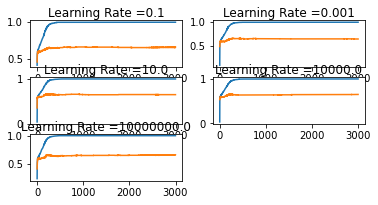

In [142]:
learning_rates = [1e-1, 1e-3, 1e1,1e4,1e7]
for i in range(len(learning_rates)):
    # determine the plot number
    plot_no = 420 + (i+1)
    plt.subplot(plot_no)
    # fit model and plot learning curves for a learning rate
    cls_model(Xc_train, yc_train, Xc_test, yc_test, learning_rates[i])

# show learning curves
plt.show()

- Choosing learning rate as 0.001 (Default Learning rate of Adam Optimizer) as we can imply from the above displayed Learning Rate graphs that the model was able to learn the problem quite okay with the learning rates 1E-1 and 1E-3.

In [197]:
input_layer = Input(shape=(X.shape[1],))
dense_layer_1 = Dense(512, activation='relu')(input_layer)
dense_layer_2 = Dense(300, activation='relu')(dense_layer_1)
output = Dense(9, activation='softmax', kernel_regularizer=regularizers.l2(0.01))(dense_layer_2)

model = Model(inputs=input_layer, outputs=output)

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc'])

In [198]:
model.summary()

Model: "functional_65"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_34 (InputLayer)        [(None, 11)]              0         
_________________________________________________________________
dense_228 (Dense)            (None, 512)               6144      
_________________________________________________________________
dense_229 (Dense)            (None, 300)               153900    
_________________________________________________________________
dense_230 (Dense)            (None, 9)                 2709      
Total params: 162,753
Trainable params: 162,753
Non-trainable params: 0
_________________________________________________________________


In [199]:
history = model.fit(Xc_train, yc_train, batch_size=1200, epochs=3000, verbose=1, validation_data = (Xc_test, yc_test))

Epoch 1/3000
1/1 [==============================] - 0s 360ms/step - loss: 2.3969 - acc: 0.0974 - val_loss: 2.1609 - val_acc: 0.4104
Epoch 2/3000
1/1 [==============================] - 0s 19ms/step - loss: 2.1496 - acc: 0.4459 - val_loss: 1.9514 - val_acc: 0.4125
Epoch 3/3000
1/1 [==============================] - 0s 16ms/step - loss: 1.9355 - acc: 0.4540 - val_loss: 1.7738 - val_acc: 0.4521
Epoch 4/3000
1/1 [==============================] - 0s 18ms/step - loss: 1.7555 - acc: 0.4754 - val_loss: 1.6275 - val_acc: 0.4833
Epoch 5/3000
1/1 [==============================] - 0s 17ms/step - loss: 1.6086 - acc: 0.5085 - val_loss: 1.5106 - val_acc: 0.5125
Epoch 6/3000
1/1 [==============================] - 0s 15ms/step - loss: 1.4927 - acc: 0.5416 - val_loss: 1.4199 - val_acc: 0.5167
Epoch 7/3000
1/1 [==============================] - 0s 15ms/step - loss: 1.4038 - acc: 0.5559 - val_loss: 1.3526 - val_acc: 0.5479
Epoch 8/3000
1/1 [==============================] - 0s 17ms/step - loss: 1.3378 - 

Epoch 125/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.6938 - acc: 0.7819 - val_loss: 1.0694 - val_acc: 0.6104
Epoch 126/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.6902 - acc: 0.7855 - val_loss: 1.0699 - val_acc: 0.6104
Epoch 127/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.6865 - acc: 0.7891 - val_loss: 1.0704 - val_acc: 0.6104
Epoch 128/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.6828 - acc: 0.7900 - val_loss: 1.0710 - val_acc: 0.6125
Epoch 129/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.6792 - acc: 0.7900 - val_loss: 1.0717 - val_acc: 0.6146
Epoch 130/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.6755 - acc: 0.7927 - val_loss: 1.0723 - val_acc: 0.6167
Epoch 131/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.6718 - acc: 0.7945 - val_loss: 1.0731 - val_acc: 0.6146
Epoch 132/3000
1/1 [==============================] - 0s 14ms/step - 

Epoch 248/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.3242 - acc: 0.9571 - val_loss: 1.2546 - val_acc: 0.6354
Epoch 249/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.3223 - acc: 0.9553 - val_loss: 1.2541 - val_acc: 0.6333
Epoch 250/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.3205 - acc: 0.9562 - val_loss: 1.2576 - val_acc: 0.6354
Epoch 251/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.3189 - acc: 0.9571 - val_loss: 1.2583 - val_acc: 0.6333
Epoch 252/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.3174 - acc: 0.9598 - val_loss: 1.2621 - val_acc: 0.6313
Epoch 253/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.3159 - acc: 0.9580 - val_loss: 1.2622 - val_acc: 0.6313
Epoch 254/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.3144 - acc: 0.9598 - val_loss: 1.2670 - val_acc: 0.6333
Epoch 255/3000
1/1 [==============================] - 0s 14ms/step - 

Epoch 371/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.1890 - acc: 0.9893 - val_loss: 1.4625 - val_acc: 0.6333
Epoch 372/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1884 - acc: 0.9911 - val_loss: 1.4615 - val_acc: 0.6292
Epoch 373/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1877 - acc: 0.9893 - val_loss: 1.4649 - val_acc: 0.6313
Epoch 374/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1870 - acc: 0.9911 - val_loss: 1.4645 - val_acc: 0.6313
Epoch 375/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1863 - acc: 0.9893 - val_loss: 1.4663 - val_acc: 0.6313
Epoch 376/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1857 - acc: 0.9902 - val_loss: 1.4675 - val_acc: 0.6313
Epoch 377/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1850 - acc: 0.9911 - val_loss: 1.4679 - val_acc: 0.6313
Epoch 378/3000
1/1 [==============================] - 0s 16ms/step - 

Epoch 494/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.1319 - acc: 0.9991 - val_loss: 1.5698 - val_acc: 0.6292
Epoch 495/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.1315 - acc: 0.9991 - val_loss: 1.5710 - val_acc: 0.6271
Epoch 496/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.1312 - acc: 0.9991 - val_loss: 1.5710 - val_acc: 0.6271
Epoch 497/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.1309 - acc: 0.9991 - val_loss: 1.5724 - val_acc: 0.6271
Epoch 498/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1305 - acc: 0.9991 - val_loss: 1.5723 - val_acc: 0.6271
Epoch 499/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.1302 - acc: 0.9991 - val_loss: 1.5736 - val_acc: 0.6271
Epoch 500/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1299 - acc: 0.9991 - val_loss: 1.5736 - val_acc: 0.6271
Epoch 501/3000
1/1 [==============================] - 0s 15ms/step - 

Epoch 617/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.1000 - acc: 1.0000 - val_loss: 1.6293 - val_acc: 0.6313
Epoch 618/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0998 - acc: 1.0000 - val_loss: 1.6302 - val_acc: 0.6333
Epoch 619/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0996 - acc: 1.0000 - val_loss: 1.6306 - val_acc: 0.6313
Epoch 620/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0994 - acc: 1.0000 - val_loss: 1.6311 - val_acc: 0.6333
Epoch 621/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0992 - acc: 1.0000 - val_loss: 1.6319 - val_acc: 0.6333
Epoch 622/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0990 - acc: 1.0000 - val_loss: 1.6319 - val_acc: 0.6333
Epoch 623/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0988 - acc: 1.0000 - val_loss: 1.6326 - val_acc: 0.6333
Epoch 624/3000
1/1 [==============================] - 0s 15ms/step - 

1/1 [==============================] - 0s 17ms/step - loss: 0.0800 - acc: 1.0000 - val_loss: 1.6744 - val_acc: 0.6354
Epoch 740/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0798 - acc: 1.0000 - val_loss: 1.6745 - val_acc: 0.6354
Epoch 741/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0797 - acc: 1.0000 - val_loss: 1.6750 - val_acc: 0.6333
Epoch 742/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0796 - acc: 1.0000 - val_loss: 1.6747 - val_acc: 0.6354
Epoch 743/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0794 - acc: 1.0000 - val_loss: 1.6756 - val_acc: 0.6333
Epoch 744/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0793 - acc: 1.0000 - val_loss: 1.6757 - val_acc: 0.6354
Epoch 745/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0792 - acc: 1.0000 - val_loss: 1.6763 - val_acc: 0.6333
Epoch 746/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0790 - 

Epoch 801/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0724 - acc: 1.0000 - val_loss: 1.6948 - val_acc: 0.6333
Epoch 802/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0723 - acc: 1.0000 - val_loss: 1.6952 - val_acc: 0.6333
Epoch 803/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0721 - acc: 1.0000 - val_loss: 1.6954 - val_acc: 0.6333
Epoch 804/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0720 - acc: 1.0000 - val_loss: 1.6958 - val_acc: 0.6333
Epoch 805/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0719 - acc: 1.0000 - val_loss: 1.6959 - val_acc: 0.6333
Epoch 806/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0718 - acc: 1.0000 - val_loss: 1.6969 - val_acc: 0.6333
Epoch 807/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0717 - acc: 1.0000 - val_loss: 1.6971 - val_acc: 0.6333
Epoch 808/3000
1/1 [==============================] - 0s 15ms/step - 

Epoch 924/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0606 - acc: 1.0000 - val_loss: 1.7334 - val_acc: 0.6396
Epoch 925/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0605 - acc: 1.0000 - val_loss: 1.7337 - val_acc: 0.6396
Epoch 926/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0605 - acc: 1.0000 - val_loss: 1.7340 - val_acc: 0.6396
Epoch 927/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0604 - acc: 1.0000 - val_loss: 1.7343 - val_acc: 0.6396
Epoch 928/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0603 - acc: 1.0000 - val_loss: 1.7344 - val_acc: 0.6396
Epoch 929/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0602 - acc: 1.0000 - val_loss: 1.7347 - val_acc: 0.6396
Epoch 930/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0601 - acc: 1.0000 - val_loss: 1.7348 - val_acc: 0.6396
Epoch 931/3000
1/1 [==============================] - 0s 15ms/step - 

1/1 [==============================] - 0s 19ms/step - loss: 0.0520 - acc: 1.0000 - val_loss: 1.7656 - val_acc: 0.6438
Epoch 1047/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0520 - acc: 1.0000 - val_loss: 1.7658 - val_acc: 0.6438
Epoch 1048/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0519 - acc: 1.0000 - val_loss: 1.7665 - val_acc: 0.6438
Epoch 1049/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0518 - acc: 1.0000 - val_loss: 1.7664 - val_acc: 0.6438
Epoch 1050/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0518 - acc: 1.0000 - val_loss: 1.7667 - val_acc: 0.6438
Epoch 1051/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0517 - acc: 1.0000 - val_loss: 1.7670 - val_acc: 0.6438
Epoch 1052/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0516 - acc: 1.0000 - val_loss: 1.7669 - val_acc: 0.6438
Epoch 1053/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.

1/1 [==============================] - 0s 16ms/step - loss: 0.0454 - acc: 1.0000 - val_loss: 1.7941 - val_acc: 0.6458
Epoch 1169/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0453 - acc: 1.0000 - val_loss: 1.7942 - val_acc: 0.6458
Epoch 1170/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0453 - acc: 1.0000 - val_loss: 1.7947 - val_acc: 0.6458
Epoch 1171/3000
1/1 [==============================] - 0s 22ms/step - loss: 0.0452 - acc: 1.0000 - val_loss: 1.7949 - val_acc: 0.6438
Epoch 1172/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0452 - acc: 1.0000 - val_loss: 1.7950 - val_acc: 0.6458
Epoch 1173/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0451 - acc: 1.0000 - val_loss: 1.7953 - val_acc: 0.6438
Epoch 1174/3000
1/1 [==============================] - 0s 24ms/step - loss: 0.0451 - acc: 1.0000 - val_loss: 1.7956 - val_acc: 0.6438
Epoch 1175/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.

1/1 [==============================] - 0s 19ms/step - loss: 0.0401 - acc: 1.0000 - val_loss: 1.8207 - val_acc: 0.6438
Epoch 1291/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0400 - acc: 1.0000 - val_loss: 1.8210 - val_acc: 0.6438
Epoch 1292/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0400 - acc: 1.0000 - val_loss: 1.8210 - val_acc: 0.6438
Epoch 1293/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0400 - acc: 1.0000 - val_loss: 1.8215 - val_acc: 0.6438
Epoch 1294/3000
1/1 [==============================] - 0s 24ms/step - loss: 0.0399 - acc: 1.0000 - val_loss: 1.8218 - val_acc: 0.6438
Epoch 1295/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0399 - acc: 1.0000 - val_loss: 1.8219 - val_acc: 0.6438
Epoch 1296/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0399 - acc: 1.0000 - val_loss: 1.8221 - val_acc: 0.6438
Epoch 1297/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0358 - acc: 1.0000 - val_loss: 1.8467 - val_acc: 0.6458
Epoch 1413/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0358 - acc: 1.0000 - val_loss: 1.8470 - val_acc: 0.6458
Epoch 1414/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0357 - acc: 1.0000 - val_loss: 1.8473 - val_acc: 0.6458
Epoch 1415/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0357 - acc: 1.0000 - val_loss: 1.8475 - val_acc: 0.6458
Epoch 1416/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0357 - acc: 1.0000 - val_loss: 1.8475 - val_acc: 0.6458
Epoch 1417/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0356 - acc: 1.0000 - val_loss: 1.8480 - val_acc: 0.6458
Epoch 1418/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0356 - acc: 1.0000 - val_loss: 1.8481 - val_acc: 0.6458
Epoch 1419/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.

1/1 [==============================] - 0s 17ms/step - loss: 0.0323 - acc: 1.0000 - val_loss: 1.8721 - val_acc: 0.6479
Epoch 1535/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0322 - acc: 1.0000 - val_loss: 1.8723 - val_acc: 0.6479
Epoch 1536/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0322 - acc: 1.0000 - val_loss: 1.8726 - val_acc: 0.6479
Epoch 1537/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0322 - acc: 1.0000 - val_loss: 1.8728 - val_acc: 0.6479
Epoch 1538/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0321 - acc: 1.0000 - val_loss: 1.8730 - val_acc: 0.6479
Epoch 1539/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0321 - acc: 1.0000 - val_loss: 1.8732 - val_acc: 0.6479
Epoch 1540/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0321 - acc: 1.0000 - val_loss: 1.8731 - val_acc: 0.6479
Epoch 1541/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.

1/1 [==============================] - 0s 22ms/step - loss: 0.0293 - acc: 1.0000 - val_loss: 1.8969 - val_acc: 0.6479
Epoch 1657/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0292 - acc: 1.0000 - val_loss: 1.8973 - val_acc: 0.6479
Epoch 1658/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0292 - acc: 1.0000 - val_loss: 1.8972 - val_acc: 0.6479
Epoch 1659/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0292 - acc: 1.0000 - val_loss: 1.8973 - val_acc: 0.6479
Epoch 1660/3000
1/1 [==============================] - 0s 26ms/step - loss: 0.0292 - acc: 1.0000 - val_loss: 1.8979 - val_acc: 0.6479
Epoch 1661/3000
1/1 [==============================] - 0s 25ms/step - loss: 0.0292 - acc: 1.0000 - val_loss: 1.8980 - val_acc: 0.6479
Epoch 1662/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0291 - acc: 1.0000 - val_loss: 1.8983 - val_acc: 0.6479
Epoch 1663/3000
1/1 [==============================] - 0s 25ms/step - loss: 0.

1/1 [==============================] - 0s 17ms/step - loss: 0.0267 - acc: 1.0000 - val_loss: 1.9202 - val_acc: 0.6500
Epoch 1779/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0267 - acc: 1.0000 - val_loss: 1.9204 - val_acc: 0.6500
Epoch 1780/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0267 - acc: 1.0000 - val_loss: 1.9206 - val_acc: 0.6500
Epoch 1781/3000
1/1 [==============================] - 0s 23ms/step - loss: 0.0266 - acc: 1.0000 - val_loss: 1.9208 - val_acc: 0.6500
Epoch 1782/3000
1/1 [==============================] - 0s 25ms/step - loss: 0.0266 - acc: 1.0000 - val_loss: 1.9211 - val_acc: 0.6500
Epoch 1783/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0266 - acc: 1.0000 - val_loss: 1.9211 - val_acc: 0.6500
Epoch 1784/3000
1/1 [==============================] - 0s 22ms/step - loss: 0.0266 - acc: 1.0000 - val_loss: 1.9214 - val_acc: 0.6500
Epoch 1785/3000
1/1 [==============================] - 0s 22ms/step - loss: 0.

1/1 [==============================] - 0s 17ms/step - loss: 0.0245 - acc: 1.0000 - val_loss: 1.9421 - val_acc: 0.6500
Epoch 1901/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0245 - acc: 1.0000 - val_loss: 1.9425 - val_acc: 0.6521
Epoch 1902/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0244 - acc: 1.0000 - val_loss: 1.9427 - val_acc: 0.6500
Epoch 1903/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0244 - acc: 1.0000 - val_loss: 1.9431 - val_acc: 0.6500
Epoch 1904/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0244 - acc: 1.0000 - val_loss: 1.9427 - val_acc: 0.6500
Epoch 1905/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0244 - acc: 1.0000 - val_loss: 1.9434 - val_acc: 0.6521
Epoch 1906/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0244 - acc: 1.0000 - val_loss: 1.9428 - val_acc: 0.6500
Epoch 1907/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0226 - acc: 1.0000 - val_loss: 1.9639 - val_acc: 0.6521
Epoch 2023/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0225 - acc: 1.0000 - val_loss: 1.9643 - val_acc: 0.6521
Epoch 2024/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0225 - acc: 1.0000 - val_loss: 1.9642 - val_acc: 0.6521
Epoch 2025/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0225 - acc: 1.0000 - val_loss: 1.9648 - val_acc: 0.6479
Epoch 2026/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0225 - acc: 1.0000 - val_loss: 1.9645 - val_acc: 0.6479
Epoch 2027/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0225 - acc: 1.0000 - val_loss: 1.9648 - val_acc: 0.6479
Epoch 2028/3000
1/1 [==============================] - 0s 25ms/step - loss: 0.0225 - acc: 1.0000 - val_loss: 1.9650 - val_acc: 0.6479
Epoch 2029/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.

1/1 [==============================] - 0s 26ms/step - loss: 0.0209 - acc: 1.0000 - val_loss: 1.9856 - val_acc: 0.6458
Epoch 2145/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0208 - acc: 1.0000 - val_loss: 1.9844 - val_acc: 0.6479
Epoch 2146/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0208 - acc: 1.0000 - val_loss: 1.9861 - val_acc: 0.6458
Epoch 2147/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0208 - acc: 1.0000 - val_loss: 1.9847 - val_acc: 0.6479
Epoch 2148/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0208 - acc: 1.0000 - val_loss: 1.9863 - val_acc: 0.6458
Epoch 2149/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0208 - acc: 1.0000 - val_loss: 1.9847 - val_acc: 0.6479
Epoch 2150/3000
1/1 [==============================] - 0s 25ms/step - loss: 0.0208 - acc: 1.0000 - val_loss: 1.9868 - val_acc: 0.6479
Epoch 2151/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0194 - acc: 1.0000 - val_loss: 2.0054 - val_acc: 0.6458
Epoch 2267/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0193 - acc: 1.0000 - val_loss: 2.0052 - val_acc: 0.6458
Epoch 2268/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0193 - acc: 1.0000 - val_loss: 2.0057 - val_acc: 0.6458
Epoch 2269/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0193 - acc: 1.0000 - val_loss: 2.0056 - val_acc: 0.6438
Epoch 2270/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0193 - acc: 1.0000 - val_loss: 2.0059 - val_acc: 0.6458
Epoch 2271/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0193 - acc: 1.0000 - val_loss: 2.0057 - val_acc: 0.6438
Epoch 2272/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0193 - acc: 1.0000 - val_loss: 2.0064 - val_acc: 0.6458
Epoch 2273/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.

1/1 [==============================] - 0s 19ms/step - loss: 0.0180 - acc: 1.0000 - val_loss: 2.0253 - val_acc: 0.6458
Epoch 2389/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0180 - acc: 1.0000 - val_loss: 2.0228 - val_acc: 0.6458
Epoch 2390/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0180 - acc: 1.0000 - val_loss: 2.0261 - val_acc: 0.6458
Epoch 2391/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0180 - acc: 1.0000 - val_loss: 2.0226 - val_acc: 0.6479
Epoch 2392/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0180 - acc: 1.0000 - val_loss: 2.0270 - val_acc: 0.6479
Epoch 2393/3000
1/1 [==============================] - 0s 22ms/step - loss: 0.0180 - acc: 1.0000 - val_loss: 2.0228 - val_acc: 0.6479
Epoch 2394/3000
1/1 [==============================] - 0s 24ms/step - loss: 0.0180 - acc: 1.0000 - val_loss: 2.0277 - val_acc: 0.6500
Epoch 2395/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.

1/1 [==============================] - 0s 17ms/step - loss: 0.0168 - acc: 1.0000 - val_loss: 2.0407 - val_acc: 0.6458
Epoch 2511/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0168 - acc: 1.0000 - val_loss: 2.0439 - val_acc: 0.6479
Epoch 2512/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0168 - acc: 1.0000 - val_loss: 2.0416 - val_acc: 0.6458
Epoch 2513/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0168 - acc: 1.0000 - val_loss: 2.0433 - val_acc: 0.6479
Epoch 2514/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0168 - acc: 1.0000 - val_loss: 2.0428 - val_acc: 0.6438
Epoch 2515/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0168 - acc: 1.0000 - val_loss: 2.0427 - val_acc: 0.6479
Epoch 2516/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0168 - acc: 1.0000 - val_loss: 2.0437 - val_acc: 0.6479
Epoch 2517/3000
1/1 [==============================] - 0s 24ms/step - loss: 0.

1/1 [==============================] - 0s 19ms/step - loss: 0.0157 - acc: 1.0000 - val_loss: 2.0576 - val_acc: 0.6458
Epoch 2633/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.0157 - acc: 1.0000 - val_loss: 2.0589 - val_acc: 0.6458
Epoch 2634/3000
1/1 [==============================] - 0s 23ms/step - loss: 0.0157 - acc: 1.0000 - val_loss: 2.0580 - val_acc: 0.6458
Epoch 2635/3000
1/1 [==============================] - 0s 22ms/step - loss: 0.0157 - acc: 1.0000 - val_loss: 2.0589 - val_acc: 0.6458
Epoch 2636/3000
1/1 [==============================] - 0s 23ms/step - loss: 0.0157 - acc: 1.0000 - val_loss: 2.0586 - val_acc: 0.6479
Epoch 2637/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0157 - acc: 1.0000 - val_loss: 2.0586 - val_acc: 0.6479
Epoch 2638/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0157 - acc: 1.0000 - val_loss: 2.0587 - val_acc: 0.6479
Epoch 2639/3000
1/1 [==============================] - 0s 22ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0148 - acc: 1.0000 - val_loss: 2.0718 - val_acc: 0.6458
Epoch 2755/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0148 - acc: 1.0000 - val_loss: 2.0730 - val_acc: 0.6479
Epoch 2756/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0148 - acc: 1.0000 - val_loss: 2.0715 - val_acc: 0.6458
Epoch 2757/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0147 - acc: 1.0000 - val_loss: 2.0737 - val_acc: 0.6500
Epoch 2758/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0147 - acc: 1.0000 - val_loss: 2.0717 - val_acc: 0.6438
Epoch 2759/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0147 - acc: 1.0000 - val_loss: 2.0744 - val_acc: 0.6500
Epoch 2760/3000
1/1 [==============================] - 0s 24ms/step - loss: 0.0147 - acc: 1.0000 - val_loss: 2.0719 - val_acc: 0.6438
Epoch 2761/3000
1/1 [==============================] - 0s 22ms/step - loss: 0.

1/1 [==============================] - 0s 19ms/step - loss: 0.0139 - acc: 1.0000 - val_loss: 2.0921 - val_acc: 0.6479
Epoch 2877/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0139 - acc: 1.0000 - val_loss: 2.0858 - val_acc: 0.6417
Epoch 2878/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0139 - acc: 1.0000 - val_loss: 2.0920 - val_acc: 0.6500
Epoch 2879/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0139 - acc: 1.0000 - val_loss: 2.0869 - val_acc: 0.6396
Epoch 2880/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0139 - acc: 1.0000 - val_loss: 2.0910 - val_acc: 0.6479
Epoch 2881/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0139 - acc: 1.0000 - val_loss: 2.0887 - val_acc: 0.6479
Epoch 2882/3000
1/1 [==============================] - 0s 24ms/step - loss: 0.0138 - acc: 1.0000 - val_loss: 2.0898 - val_acc: 0.6479
Epoch 2883/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0131 - acc: 1.0000 - val_loss: 2.1013 - val_acc: 0.6458
Epoch 2999/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0131 - acc: 1.0000 - val_loss: 2.1058 - val_acc: 0.6479
Epoch 3000/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0131 - acc: 1.0000 - val_loss: 2.1026 - val_acc: 0.6438


In [200]:
score = model.evaluate(Xc_train,yc_train,verbose=0)

print("Train Score:", score[0])
print("Train Accuracy:", score[1])

Train Score: 0.013070973567664623
Train Accuracy: 1.0


In [201]:
score = model.evaluate(Xc_test, yc_test, verbose=1)

print("Test Score:", score[0])
print("Test Accuracy:", score[1])

15/15 [==============================] - 0s 1ms/step - loss: 2.1026 - acc: 0.6438
Test Score: 2.1026463508605957
Test Accuracy: 0.643750011920929


## Pickling the model for future use

In [207]:
model.save("classmod3.h5")
modelc1 = load_model('classmod3.h5')

In [208]:
predict_prob=modelc1.predict(Xc_test)
predict_classes=np.argmax(predict_prob,axis=1)
predict_classes[:10]

array([5, 6, 6, 5, 6, 6, 5, 8, 6, 5], dtype=int64)

In [209]:
predict_c1=np.argmax(yc_test,axis=1)
predict_c1[:10]

array([6, 6, 6, 5, 6, 6, 6, 6, 6, 5], dtype=int64)

# Part Three - Designing a clickable GUI automate Part I & II of this project. 

In [210]:
#App Window

from tkinter import *
from tkinter.ttk import *

win = tk.Tk()
win.title('Neural Networks GUI -  Great Learning')
win.geometry("500x400")
win.configure(bg='lavender')

#Step1 - Importing Data

Name = ttk.Label(win, text = "Step 1: File Name")
Name.grid(row=0, column=0, sticky = tk.W)

Name_var = tk.StringVar()
Name_entrybox = ttk.Entry(win, width = 16, textvariable = Name_var)
Name_entrybox.grid(row = 0, column = 1)

def Button_Import_Data():
    
    global DB
    DF_Name = Name_var.get()
    DB_extension = re.findall("\..*", DF_Name)  

    if DB_extension == [".xlsx"]: 
        DB = pd.read_excel(DF_Name)
    
    elif DB_extension == [".csv"]:
        DB = pd.read_csv(DF_Name)
        
#     Blank empty window to print confirmation 
    confirm = "Done"
    Confirm_entrybox = ttk.Entry(win, width = 16)
    Confirm_entrybox.grid(row = 0, column = 3)
    Confirm_entrybox.insert(1, str(confirm))
    
import_data_button = ttk.Button(win, text = "Import Data", command = Button_Import_Data)
import_data_button.grid(row = 0, column = 2)
    
#Step2 - Importing Target

Target = ttk.Label(win, text = "Step 2: Target Column")
Target.grid(row=1, column=0, sticky = tk.W)

Target_var = tk.StringVar()
Target_entrybox = ttk.Entry(win, width = 16, textvariable = Target_var)
Target_entrybox.grid(row = 1, column = 1)

def Button_Target_Data():
    
    global DB, X, y, X_train, X_test, y_train, y_test
    Target_Name = Target_var.get()
    
    Column_name = DB.columns
    #Column_name
    found = 0
    
    for i in range(len(Column_name)):
        if Column_name[i] == Target_Name:
            confirm = "Found"
            y = DB[Target_Name]     #Target Variable
            X = DB.drop(Target_Name, axis =1)    #Predictor variable           
            # Train & test split
            from sklearn.model_selection import train_test_split
            import numpy as np
            seed = 7
            np.random.seed(seed)
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.30, random_state=seed)
            
            scaler = StandardScaler()
            X_train = scaler.fit_transform(X_train)
            X_test = scaler.fit_transform(X_test)
            
        else:
            confirm = "Not Found"
   
    # Blank empty window to print confirmation 
    Confirm_entrybox = ttk.Entry(win, width = 16)
    Confirm_entrybox.grid(row = 1, column = 3)
    Confirm_entrybox.insert(1, str(confirm))
    
Target_Button = ttk.Button(win, text = "Import Target", command = Button_Target_Data)
Target_Button.grid(row = 1, column = 2)

# Step3 - Neural Network Regressor

import tensorflow as tf
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Activation
from keras import optimizers, regularizers
from sklearn.preprocessing import StandardScaler
from keras import models

NNR = ttk.Label(win, text = "Step 3: Neural Network Regressor")
NNR.grid(row=2, column=0, sticky = tk.W)

Regression = ttk.Label(win, text = "Regression")
Regression.grid(row=3, column=0, sticky = tk.E)

def Regressor():
    global DB, X, y, rmodel
    
    rmodel = Sequential()
    rmodel.add(Dense(300, input_shape=(11,)))

    #Hidden layers
    rmodel.add(Dense(250,activation='relu'))
    rmodel.add(Dense(100,activation='relu'))          
    rmodel.add(Dense(50,activation='relu'))
    
    #Regularization layer
    rmodel.add(Dropout(0.5))           

    #Output Layer
    rmodel.add(Dense(1, activation='relu'))           
    
    #Compile the model
    rmodel.compile(loss = 'mean_squared_error', optimizer = tf.keras.optimizers.Adam(1e-5,1e-3), metrics = ['mean_squared_error'])
 
    #Fit the model
    rmodel.fit(X_train, y_train, batch_size=500, epochs=5000, verbose=1, validation_data = (X_test, y_test))
    
    # Blank empty window to print confirmation 
    confirm="Network Trained"
    Confirm_entrybox=ttk.Entry(win,width=16)
    Confirm_entrybox.grid(row=3,column=2)
    Confirm_entrybox.insert(1,str(confirm))
    
Train_button=ttk.Button(win, text = "Train",command = Regressor)
Train_button.grid(row = 3, column = 1)

#pickle the model
pickle_name=ttk.Label(win,text ='Pickle')
pickle_name.grid(row = 4, column = 0, sticky =tk.E)

def Reg_Pickle():
    
    global rmodel
    
    rmodel.save('Auto_Reg_model.pkl')

    # Blank empty window to print confirmation
    confirm="Saved model to disk"
    Confirm_entrybox=ttk.Entry(win, width = 20)
    Confirm_entrybox.grid(row = 4, column = 2)
    Confirm_entrybox.insert(1, str(confirm))
    
Pickle_button=ttk.Button(win, text = "Pickle", command = Reg_Pickle)
Pickle_button.grid(row = 4, column = 1)
    
#classification model

from keras.utils import np_utils

classification_label = ttk.Label(win, text = "Step 4: Neural Network Classifier")
classification_label.grid(row = 5, column = 0, sticky = tk.W)

classification_name=ttk.Label(win, text = "Classification")
classification_name.grid(row = 6, column = 0, sticky = tk.E)

def Classification():
    
    global DB, X, y, cmodel, X_train, X_test, y_train, y_test
    
    y_train = np_utils.to_categorical(y_train)
    y_test = np_utils.to_categorical(y_test)
    
    #Input Layer
    input_layer = Input(shape=(X.shape[1],))
    
    #Hidden Layer
    dense_layer_1 = Dense(512, activation='relu')(input_layer)
    dense_layer_2 = Dense(300, activation='relu')(dense_layer_1)
    
    #Output Layer
    output = Dense(9, activation='softmax', kernel_regularizer=regularizers.l2(0.01))(dense_layer_2)

    #Compiling the model
    cmodel = Model(inputs = input_layer, outputs = output)
    cmodel.compile(loss='categorical_crossentropy', optimizer = 'adam', metrics= ['acc'])
    
    #Fitting the model
    cmodel.fit(X_train, y_train, batch_size=1200, epochs=3000, verbose=1, validation_data = (X_test, y_test))
    
    # Blank empty window to print confirmation
    confirm="Network trained"
    confirm_entrybox=ttk.Entry(win,width=16)
    confirm_entrybox.grid(row=6,column=2)
    confirm_entrybox.insert(1,str(confirm))
    
Train_button=ttk.Button(win, text = 'Train', command = Classification)
Train_button.grid(row = 6, column = 1)

#Pickle the model
pickle_name = ttk.Label(win,text = "Pickle")
pickle_name.grid(row = 7, column = 0, sticky = tk.E)

def CPickle():
    
    global cmodel
    
    cmodel.save('Auto_Class_model.pkl')
    
    confirm = "Saved model to disk"
    confirm_entrybox=ttk.Entry(win, width = 20)
    confirm_entrybox.grid(row = 7, column =2)
    confirm_entrybox.insert(1, str(confirm))

Pickle_button = ttk.Button(win, text = "Pickle", command = CPickle)
Pickle_button.grid(row=7,column=1)

win.mainloop()

Epoch 1/5000
3/3 [==============================] - 0s 42ms/step - loss: 31.4918 - mean_squared_error: 31.4918 - val_loss: 32.0271 - val_mean_squared_error: 32.0271
Epoch 2/5000
3/3 [==============================] - 0s 8ms/step - loss: 31.2287 - mean_squared_error: 31.2287 - val_loss: 31.9632 - val_mean_squared_error: 31.9632
Epoch 3/5000
3/3 [==============================] - 0s 7ms/step - loss: 31.3018 - mean_squared_error: 31.3018 - val_loss: 31.9042 - val_mean_squared_error: 31.9042
Epoch 4/5000
3/3 [==============================] - 0s 9ms/step - loss: 31.2614 - mean_squared_error: 31.2614 - val_loss: 31.8421 - val_mean_squared_error: 31.8421
Epoch 5/5000
3/3 [==============================] - 0s 9ms/step - loss: 31.2042 - mean_squared_error: 31.2042 - val_loss: 31.7735 - val_mean_squared_error: 31.7735
Epoch 6/5000
3/3 [==============================] - 0s 7ms/step - loss: 31.1045 - mean_squared_error: 31.1045 - val_loss: 31.6941 - val_mean_squared_error: 31.6941
Epoch 7/5000
3/

Epoch 51/5000
3/3 [==============================] - 0s 8ms/step - loss: 26.5710 - mean_squared_error: 26.5710 - val_loss: 26.6671 - val_mean_squared_error: 26.6671
Epoch 52/5000
3/3 [==============================] - 0s 9ms/step - loss: 26.5139 - mean_squared_error: 26.5139 - val_loss: 26.5463 - val_mean_squared_error: 26.5463
Epoch 53/5000
3/3 [==============================] - 0s 8ms/step - loss: 26.3900 - mean_squared_error: 26.3900 - val_loss: 26.4314 - val_mean_squared_error: 26.4314
Epoch 54/5000
3/3 [==============================] - 0s 8ms/step - loss: 26.3638 - mean_squared_error: 26.3638 - val_loss: 26.3164 - val_mean_squared_error: 26.3164
Epoch 55/5000
3/3 [==============================] - 0s 8ms/step - loss: 26.1369 - mean_squared_error: 26.1369 - val_loss: 26.1948 - val_mean_squared_error: 26.1948
Epoch 56/5000
3/3 [==============================] - 0s 8ms/step - loss: 26.0983 - mean_squared_error: 26.0983 - val_loss: 26.0764 - val_mean_squared_error: 26.0764
Epoch 57/5

Epoch 101/5000
3/3 [==============================] - 0s 8ms/step - loss: 20.5665 - mean_squared_error: 20.5665 - val_loss: 20.5811 - val_mean_squared_error: 20.5811
Epoch 102/5000
3/3 [==============================] - 0s 8ms/step - loss: 20.5543 - mean_squared_error: 20.5543 - val_loss: 20.4533 - val_mean_squared_error: 20.4533
Epoch 103/5000
3/3 [==============================] - 0s 8ms/step - loss: 20.4605 - mean_squared_error: 20.4605 - val_loss: 20.3247 - val_mean_squared_error: 20.3247
Epoch 104/5000
3/3 [==============================] - 0s 8ms/step - loss: 19.9597 - mean_squared_error: 19.9597 - val_loss: 20.1936 - val_mean_squared_error: 20.1936
Epoch 105/5000
3/3 [==============================] - 0s 8ms/step - loss: 20.1110 - mean_squared_error: 20.1110 - val_loss: 20.0663 - val_mean_squared_error: 20.0663
Epoch 106/5000
3/3 [==============================] - 0s 8ms/step - loss: 20.1886 - mean_squared_error: 20.1886 - val_loss: 19.9385 - val_mean_squared_error: 19.9385
Epoc

Epoch 200/5000
3/3 [==============================] - 0s 9ms/step - loss: 9.5164 - mean_squared_error: 9.5164 - val_loss: 8.7301 - val_mean_squared_error: 8.7301
Epoch 201/5000
3/3 [==============================] - 0s 8ms/step - loss: 9.4310 - mean_squared_error: 9.4310 - val_loss: 8.6448 - val_mean_squared_error: 8.6448
Epoch 202/5000
3/3 [==============================] - 0s 8ms/step - loss: 9.2590 - mean_squared_error: 9.2590 - val_loss: 8.5581 - val_mean_squared_error: 8.5581
Epoch 203/5000
3/3 [==============================] - 0s 8ms/step - loss: 9.2820 - mean_squared_error: 9.2820 - val_loss: 8.4746 - val_mean_squared_error: 8.4746
Epoch 204/5000
3/3 [==============================] - 0s 8ms/step - loss: 9.1961 - mean_squared_error: 9.1961 - val_loss: 8.3883 - val_mean_squared_error: 8.3883
Epoch 205/5000
3/3 [==============================] - 0s 10ms/step - loss: 9.0267 - mean_squared_error: 9.0267 - val_loss: 8.3083 - val_mean_squared_error: 8.3083
Epoch 206/5000
3/3 [=======

Epoch 301/5000
3/3 [==============================] - 0s 7ms/step - loss: 5.3383 - mean_squared_error: 5.3383 - val_loss: 4.1104 - val_mean_squared_error: 4.1104
Epoch 302/5000
3/3 [==============================] - 0s 7ms/step - loss: 5.2173 - mean_squared_error: 5.2173 - val_loss: 4.0879 - val_mean_squared_error: 4.0879
Epoch 303/5000
3/3 [==============================] - 0s 7ms/step - loss: 5.4372 - mean_squared_error: 5.4372 - val_loss: 4.0669 - val_mean_squared_error: 4.0669
Epoch 304/5000
3/3 [==============================] - 0s 8ms/step - loss: 5.7004 - mean_squared_error: 5.7004 - val_loss: 4.0518 - val_mean_squared_error: 4.0518
Epoch 305/5000
3/3 [==============================] - 0s 8ms/step - loss: 5.3736 - mean_squared_error: 5.3736 - val_loss: 4.0339 - val_mean_squared_error: 4.0339
Epoch 306/5000
3/3 [==============================] - 0s 8ms/step - loss: 5.2440 - mean_squared_error: 5.2440 - val_loss: 4.0160 - val_mean_squared_error: 4.0160
Epoch 307/5000
3/3 [========

Epoch 402/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.5891 - mean_squared_error: 4.5891 - val_loss: 3.1029 - val_mean_squared_error: 3.1029
Epoch 403/5000
3/3 [==============================] - 0s 9ms/step - loss: 4.2608 - mean_squared_error: 4.2608 - val_loss: 3.0976 - val_mean_squared_error: 3.0976
Epoch 404/5000
3/3 [==============================] - 0s 9ms/step - loss: 4.3777 - mean_squared_error: 4.3777 - val_loss: 3.0940 - val_mean_squared_error: 3.0940
Epoch 405/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.1888 - mean_squared_error: 4.1888 - val_loss: 3.0911 - val_mean_squared_error: 3.0911
Epoch 406/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.2367 - mean_squared_error: 4.2367 - val_loss: 3.0867 - val_mean_squared_error: 3.0867
Epoch 407/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.2001 - mean_squared_error: 4.2001 - val_loss: 3.0804 - val_mean_squared_error: 3.0804
Epoch 408/5000
3/3 [========

Epoch 503/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.8191 - mean_squared_error: 3.8191 - val_loss: 2.7223 - val_mean_squared_error: 2.7223
Epoch 504/5000
3/3 [==============================] - 0s 7ms/step - loss: 3.9673 - mean_squared_error: 3.9673 - val_loss: 2.7177 - val_mean_squared_error: 2.7177
Epoch 505/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.7708 - mean_squared_error: 3.7708 - val_loss: 2.7153 - val_mean_squared_error: 2.7153
Epoch 506/5000
3/3 [==============================] - 0s 8ms/step - loss: 4.0187 - mean_squared_error: 4.0187 - val_loss: 2.7116 - val_mean_squared_error: 2.7116
Epoch 507/5000
3/3 [==============================] - 0s 7ms/step - loss: 3.9426 - mean_squared_error: 3.9426 - val_loss: 2.7108 - val_mean_squared_error: 2.7108
Epoch 508/5000
3/3 [==============================] - 0s 7ms/step - loss: 4.1029 - mean_squared_error: 4.1029 - val_loss: 2.7087 - val_mean_squared_error: 2.7087
Epoch 509/5000
3/3 [========

Epoch 604/5000
3/3 [==============================] - 0s 7ms/step - loss: 3.6797 - mean_squared_error: 3.6797 - val_loss: 2.4594 - val_mean_squared_error: 2.4594
Epoch 605/5000
3/3 [==============================] - 0s 7ms/step - loss: 3.5952 - mean_squared_error: 3.5952 - val_loss: 2.4554 - val_mean_squared_error: 2.4554
Epoch 606/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.5337 - mean_squared_error: 3.5337 - val_loss: 2.4527 - val_mean_squared_error: 2.4527
Epoch 607/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.6909 - mean_squared_error: 3.6909 - val_loss: 2.4516 - val_mean_squared_error: 2.4516
Epoch 608/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.7210 - mean_squared_error: 3.7210 - val_loss: 2.4497 - val_mean_squared_error: 2.4497
Epoch 609/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.4680 - mean_squared_error: 3.4680 - val_loss: 2.4459 - val_mean_squared_error: 2.4459
Epoch 610/5000
3/3 [========

Epoch 705/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.2783 - mean_squared_error: 3.2783 - val_loss: 2.2495 - val_mean_squared_error: 2.2495
Epoch 706/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.2973 - mean_squared_error: 3.2973 - val_loss: 2.2451 - val_mean_squared_error: 2.2451
Epoch 707/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.1052 - mean_squared_error: 3.1052 - val_loss: 2.2448 - val_mean_squared_error: 2.2448
Epoch 708/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.2848 - mean_squared_error: 3.2848 - val_loss: 2.2455 - val_mean_squared_error: 2.2455
Epoch 709/5000
3/3 [==============================] - 0s 9ms/step - loss: 3.1047 - mean_squared_error: 3.1047 - val_loss: 2.2381 - val_mean_squared_error: 2.2381
Epoch 710/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.2349 - mean_squared_error: 3.2349 - val_loss: 2.2363 - val_mean_squared_error: 2.2363
Epoch 711/5000
3/3 [========

3/3 [==============================] - 0s 8ms/step - loss: 3.0965 - mean_squared_error: 3.0965 - val_loss: 2.0762 - val_mean_squared_error: 2.0762
Epoch 806/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.9337 - mean_squared_error: 2.9337 - val_loss: 2.0747 - val_mean_squared_error: 2.0747
Epoch 807/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.8916 - mean_squared_error: 2.8916 - val_loss: 2.0684 - val_mean_squared_error: 2.0684
Epoch 808/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.0659 - mean_squared_error: 3.0659 - val_loss: 2.0685 - val_mean_squared_error: 2.0685
Epoch 809/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.8342 - mean_squared_error: 2.8342 - val_loss: 2.0641 - val_mean_squared_error: 2.0641
Epoch 810/5000
3/3 [==============================] - 0s 8ms/step - loss: 3.1276 - mean_squared_error: 3.1276 - val_loss: 2.0638 - val_mean_squared_error: 2.0638
Epoch 811/5000
3/3 [=======================

Epoch 856/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.9370 - mean_squared_error: 2.9370 - val_loss: 1.9833 - val_mean_squared_error: 1.9833
Epoch 857/5000
3/3 [==============================] - 0s 7ms/step - loss: 3.0479 - mean_squared_error: 3.0479 - val_loss: 1.9824 - val_mean_squared_error: 1.9824
Epoch 858/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.8562 - mean_squared_error: 2.8562 - val_loss: 1.9846 - val_mean_squared_error: 1.9846
Epoch 859/5000
3/3 [==============================] - 0s 7ms/step - loss: 2.9219 - mean_squared_error: 2.9219 - val_loss: 1.9827 - val_mean_squared_error: 1.9827
Epoch 860/5000
3/3 [==============================] - 0s 7ms/step - loss: 3.0313 - mean_squared_error: 3.0313 - val_loss: 1.9783 - val_mean_squared_error: 1.9783
Epoch 861/5000
3/3 [==============================] - 0s 7ms/step - loss: 2.8938 - mean_squared_error: 2.8938 - val_loss: 1.9779 - val_mean_squared_error: 1.9779
Epoch 862/5000
3/3 [========

Epoch 957/5000
3/3 [==============================] - 0s 7ms/step - loss: 2.5437 - mean_squared_error: 2.5437 - val_loss: 1.8478 - val_mean_squared_error: 1.8478
Epoch 958/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.7449 - mean_squared_error: 2.7449 - val_loss: 1.8497 - val_mean_squared_error: 1.8497
Epoch 959/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.6444 - mean_squared_error: 2.6444 - val_loss: 1.8485 - val_mean_squared_error: 1.8485
Epoch 960/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.7621 - mean_squared_error: 2.7621 - val_loss: 1.8470 - val_mean_squared_error: 1.8470
Epoch 961/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.7520 - mean_squared_error: 2.7520 - val_loss: 1.8430 - val_mean_squared_error: 1.8430
Epoch 962/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.6439 - mean_squared_error: 2.6439 - val_loss: 1.8406 - val_mean_squared_error: 1.8406
Epoch 963/5000
3/3 [========

3/3 [==============================] - 0s 8ms/step - loss: 2.5986 - mean_squared_error: 2.5986 - val_loss: 1.7071 - val_mean_squared_error: 1.7071
Epoch 1058/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.6843 - mean_squared_error: 2.6843 - val_loss: 1.7100 - val_mean_squared_error: 1.7100
Epoch 1059/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.5964 - mean_squared_error: 2.5964 - val_loss: 1.7089 - val_mean_squared_error: 1.7089
Epoch 1060/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.5284 - mean_squared_error: 2.5284 - val_loss: 1.7070 - val_mean_squared_error: 1.7070
Epoch 1061/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.4758 - mean_squared_error: 2.4758 - val_loss: 1.7071 - val_mean_squared_error: 1.7071
Epoch 1062/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.5074 - mean_squared_error: 2.5074 - val_loss: 1.7070 - val_mean_squared_error: 1.7070
Epoch 1063/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 2.3869 - mean_squared_error: 2.3869 - val_loss: 1.5873 - val_mean_squared_error: 1.5873
Epoch 1158/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.4038 - mean_squared_error: 2.4038 - val_loss: 1.5869 - val_mean_squared_error: 1.5869
Epoch 1159/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.2344 - mean_squared_error: 2.2344 - val_loss: 1.5841 - val_mean_squared_error: 1.5841
Epoch 1160/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.3415 - mean_squared_error: 2.3415 - val_loss: 1.5853 - val_mean_squared_error: 1.5853
Epoch 1161/5000
3/3 [==============================] - 0s 7ms/step - loss: 2.4554 - mean_squared_error: 2.4554 - val_loss: 1.5813 - val_mean_squared_error: 1.5813
Epoch 1162/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.3611 - mean_squared_error: 2.3611 - val_loss: 1.5798 - val_mean_squared_error: 1.5798
Epoch 1163/5000
3/3 [=================

3/3 [==============================] - 0s 9ms/step - loss: 2.2813 - mean_squared_error: 2.2813 - val_loss: 1.4716 - val_mean_squared_error: 1.4716
Epoch 1258/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.4226 - mean_squared_error: 2.4226 - val_loss: 1.4685 - val_mean_squared_error: 1.4685
Epoch 1259/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1615 - mean_squared_error: 2.1615 - val_loss: 1.4672 - val_mean_squared_error: 1.4672
Epoch 1260/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.3194 - mean_squared_error: 2.3194 - val_loss: 1.4662 - val_mean_squared_error: 1.4662
Epoch 1261/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.2902 - mean_squared_error: 2.2902 - val_loss: 1.4636 - val_mean_squared_error: 1.4636
Epoch 1262/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.2911 - mean_squared_error: 2.2911 - val_loss: 1.4583 - val_mean_squared_error: 1.4583
Epoch 1263/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 2.0445 - mean_squared_error: 2.0445 - val_loss: 1.3595 - val_mean_squared_error: 1.3595
Epoch 1358/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9699 - mean_squared_error: 1.9699 - val_loss: 1.3609 - val_mean_squared_error: 1.3609
Epoch 1359/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1089 - mean_squared_error: 2.1089 - val_loss: 1.3617 - val_mean_squared_error: 1.3617
Epoch 1360/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0473 - mean_squared_error: 2.0473 - val_loss: 1.3656 - val_mean_squared_error: 1.3656
Epoch 1361/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1385 - mean_squared_error: 2.1385 - val_loss: 1.3617 - val_mean_squared_error: 1.3617
Epoch 1362/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.2188 - mean_squared_error: 2.2188 - val_loss: 1.3611 - val_mean_squared_error: 1.3611
Epoch 1363/5000
3/3 [=================

3/3 [==============================] - 0s 7ms/step - loss: 1.9711 - mean_squared_error: 1.9711 - val_loss: 1.2603 - val_mean_squared_error: 1.2603
Epoch 1458/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.1035 - mean_squared_error: 2.1035 - val_loss: 1.2598 - val_mean_squared_error: 1.2598
Epoch 1459/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0165 - mean_squared_error: 2.0165 - val_loss: 1.2586 - val_mean_squared_error: 1.2586
Epoch 1460/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0579 - mean_squared_error: 2.0579 - val_loss: 1.2603 - val_mean_squared_error: 1.2603
Epoch 1461/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0709 - mean_squared_error: 2.0709 - val_loss: 1.2570 - val_mean_squared_error: 1.2570
Epoch 1462/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9317 - mean_squared_error: 1.9317 - val_loss: 1.2527 - val_mean_squared_error: 1.2527
Epoch 1463/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 1.9716 - mean_squared_error: 1.9716 - val_loss: 1.1617 - val_mean_squared_error: 1.1617
Epoch 1558/5000
3/3 [==============================] - 0s 9ms/step - loss: 2.0293 - mean_squared_error: 2.0293 - val_loss: 1.1643 - val_mean_squared_error: 1.1643
Epoch 1559/5000
3/3 [==============================] - 0s 8ms/step - loss: 2.0395 - mean_squared_error: 2.0395 - val_loss: 1.1609 - val_mean_squared_error: 1.1609
Epoch 1560/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9997 - mean_squared_error: 1.9997 - val_loss: 1.1593 - val_mean_squared_error: 1.1593
Epoch 1561/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9554 - mean_squared_error: 1.9554 - val_loss: 1.1587 - val_mean_squared_error: 1.1587
Epoch 1562/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.9450 - mean_squared_error: 1.9450 - val_loss: 1.1572 - val_mean_squared_error: 1.1572
Epoch 1563/5000
3/3 [=================

3/3 [==============================] - 0s 7ms/step - loss: 1.8265 - mean_squared_error: 1.8265 - val_loss: 1.0743 - val_mean_squared_error: 1.0743
Epoch 1658/5000
3/3 [==============================] - 0s 7ms/step - loss: 2.0182 - mean_squared_error: 2.0182 - val_loss: 1.0730 - val_mean_squared_error: 1.0730
Epoch 1659/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8033 - mean_squared_error: 1.8033 - val_loss: 1.0697 - val_mean_squared_error: 1.0697
Epoch 1660/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.9328 - mean_squared_error: 1.9328 - val_loss: 1.0680 - val_mean_squared_error: 1.0680
Epoch 1661/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8366 - mean_squared_error: 1.8366 - val_loss: 1.0635 - val_mean_squared_error: 1.0635
Epoch 1662/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.8064 - mean_squared_error: 1.8064 - val_loss: 1.0602 - val_mean_squared_error: 1.0602
Epoch 1663/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 1.8628 - mean_squared_error: 1.8628 - val_loss: 0.9875 - val_mean_squared_error: 0.9875
Epoch 1758/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.6938 - mean_squared_error: 1.6938 - val_loss: 0.9900 - val_mean_squared_error: 0.9900
Epoch 1759/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7008 - mean_squared_error: 1.7008 - val_loss: 0.9859 - val_mean_squared_error: 0.9859
Epoch 1760/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8385 - mean_squared_error: 1.8385 - val_loss: 0.9866 - val_mean_squared_error: 0.9866
Epoch 1761/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7272 - mean_squared_error: 1.7272 - val_loss: 0.9865 - val_mean_squared_error: 0.9865
Epoch 1762/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8368 - mean_squared_error: 1.8368 - val_loss: 0.9834 - val_mean_squared_error: 0.9834
Epoch 1763/5000
3/3 [=================

3/3 [==============================] - 0s 7ms/step - loss: 1.7425 - mean_squared_error: 1.7425 - val_loss: 0.9227 - val_mean_squared_error: 0.9227
Epoch 1858/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.6019 - mean_squared_error: 1.6019 - val_loss: 0.9207 - val_mean_squared_error: 0.9207
Epoch 1859/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.8690 - mean_squared_error: 1.8690 - val_loss: 0.9184 - val_mean_squared_error: 0.9184
Epoch 1860/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7907 - mean_squared_error: 1.7907 - val_loss: 0.9118 - val_mean_squared_error: 0.9118
Epoch 1861/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.5986 - mean_squared_error: 1.5986 - val_loss: 0.9066 - val_mean_squared_error: 0.9066
Epoch 1862/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.7562 - mean_squared_error: 1.7562 - val_loss: 0.9067 - val_mean_squared_error: 0.9067
Epoch 1863/5000
3/3 [=================

3/3 [==============================] - 0s 7ms/step - loss: 1.6624 - mean_squared_error: 1.6624 - val_loss: 0.8475 - val_mean_squared_error: 0.8475
Epoch 1958/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.7309 - mean_squared_error: 1.7309 - val_loss: 0.8482 - val_mean_squared_error: 0.8482
Epoch 1959/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7365 - mean_squared_error: 1.7365 - val_loss: 0.8472 - val_mean_squared_error: 0.8472
Epoch 1960/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.6486 - mean_squared_error: 1.6486 - val_loss: 0.8497 - val_mean_squared_error: 0.8497
Epoch 1961/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.7952 - mean_squared_error: 1.7952 - val_loss: 0.8495 - val_mean_squared_error: 0.8495
Epoch 1962/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.7272 - mean_squared_error: 1.7272 - val_loss: 0.8491 - val_mean_squared_error: 0.8491
Epoch 1963/5000
3/3 [=================

3/3 [==============================] - 0s 7ms/step - loss: 1.5086 - mean_squared_error: 1.5086 - val_loss: 0.7859 - val_mean_squared_error: 0.7859
Epoch 2058/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.5737 - mean_squared_error: 1.5737 - val_loss: 0.7857 - val_mean_squared_error: 0.7857
Epoch 2059/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.5111 - mean_squared_error: 1.5111 - val_loss: 0.7868 - val_mean_squared_error: 0.7868
Epoch 2060/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.5761 - mean_squared_error: 1.5761 - val_loss: 0.7844 - val_mean_squared_error: 0.7844
Epoch 2061/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.5717 - mean_squared_error: 1.5717 - val_loss: 0.7831 - val_mean_squared_error: 0.7831
Epoch 2062/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.5792 - mean_squared_error: 1.5792 - val_loss: 0.7807 - val_mean_squared_error: 0.7807
Epoch 2063/5000
3/3 [=================

3/3 [==============================] - 0s 9ms/step - loss: 1.5912 - mean_squared_error: 1.5912 - val_loss: 0.7320 - val_mean_squared_error: 0.7320
Epoch 2158/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.4958 - mean_squared_error: 1.4958 - val_loss: 0.7327 - val_mean_squared_error: 0.7327
Epoch 2159/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.7042 - mean_squared_error: 1.7042 - val_loss: 0.7300 - val_mean_squared_error: 0.7300
Epoch 2160/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.6337 - mean_squared_error: 1.6337 - val_loss: 0.7348 - val_mean_squared_error: 0.7348
Epoch 2161/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.5062 - mean_squared_error: 1.5062 - val_loss: 0.7353 - val_mean_squared_error: 0.7353
Epoch 2162/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.5934 - mean_squared_error: 1.5934 - val_loss: 0.7304 - val_mean_squared_error: 0.7304
Epoch 2163/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 1.4471 - mean_squared_error: 1.4471 - val_loss: 0.6914 - val_mean_squared_error: 0.6914
Epoch 2258/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.6262 - mean_squared_error: 1.6262 - val_loss: 0.6872 - val_mean_squared_error: 0.6872
Epoch 2259/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.4226 - mean_squared_error: 1.4226 - val_loss: 0.6848 - val_mean_squared_error: 0.6848
Epoch 2260/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.5423 - mean_squared_error: 1.5423 - val_loss: 0.6842 - val_mean_squared_error: 0.6842
Epoch 2261/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.5896 - mean_squared_error: 1.5896 - val_loss: 0.6844 - val_mean_squared_error: 0.6844
Epoch 2262/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.6113 - mean_squared_error: 1.6113 - val_loss: 0.6859 - val_mean_squared_error: 0.6859
Epoch 2263/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 1.4419 - mean_squared_error: 1.4419 - val_loss: 0.6641 - val_mean_squared_error: 0.6641
Epoch 2358/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.5031 - mean_squared_error: 1.5031 - val_loss: 0.6618 - val_mean_squared_error: 0.6618
Epoch 2359/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.5163 - mean_squared_error: 1.5163 - val_loss: 0.6648 - val_mean_squared_error: 0.6648
Epoch 2360/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.4840 - mean_squared_error: 1.4840 - val_loss: 0.6606 - val_mean_squared_error: 0.6606
Epoch 2361/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.4838 - mean_squared_error: 1.4838 - val_loss: 0.6668 - val_mean_squared_error: 0.6668
Epoch 2362/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.4783 - mean_squared_error: 1.4783 - val_loss: 0.6715 - val_mean_squared_error: 0.6715
Epoch 2363/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 1.5110 - mean_squared_error: 1.5110 - val_loss: 0.6311 - val_mean_squared_error: 0.6311
Epoch 2458/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.4416 - mean_squared_error: 1.4416 - val_loss: 0.6275 - val_mean_squared_error: 0.6275
Epoch 2459/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.4167 - mean_squared_error: 1.4167 - val_loss: 0.6301 - val_mean_squared_error: 0.6301
Epoch 2460/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.4940 - mean_squared_error: 1.4940 - val_loss: 0.6266 - val_mean_squared_error: 0.6266
Epoch 2461/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.4952 - mean_squared_error: 1.4952 - val_loss: 0.6322 - val_mean_squared_error: 0.6322
Epoch 2462/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.3945 - mean_squared_error: 1.3945 - val_loss: 0.6291 - val_mean_squared_error: 0.6291
Epoch 2463/5000
3/3 [=================

3/3 [==============================] - 0s 7ms/step - loss: 1.4316 - mean_squared_error: 1.4316 - val_loss: 0.6022 - val_mean_squared_error: 0.6022
Epoch 2558/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.5538 - mean_squared_error: 1.5538 - val_loss: 0.6005 - val_mean_squared_error: 0.6005
Epoch 2559/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.5041 - mean_squared_error: 1.5041 - val_loss: 0.5966 - val_mean_squared_error: 0.5966
Epoch 2560/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.6075 - mean_squared_error: 1.6075 - val_loss: 0.5975 - val_mean_squared_error: 0.5975
Epoch 2561/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.3732 - mean_squared_error: 1.3732 - val_loss: 0.5983 - val_mean_squared_error: 0.5983
Epoch 2562/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3689 - mean_squared_error: 1.3689 - val_loss: 0.6050 - val_mean_squared_error: 0.6050
Epoch 2563/5000
3/3 [=================

3/3 [==============================] - 0s 7ms/step - loss: 1.4197 - mean_squared_error: 1.4197 - val_loss: 0.5751 - val_mean_squared_error: 0.5751
Epoch 2658/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.4261 - mean_squared_error: 1.4261 - val_loss: 0.5798 - val_mean_squared_error: 0.5798
Epoch 2659/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.5368 - mean_squared_error: 1.5368 - val_loss: 0.5805 - val_mean_squared_error: 0.5805
Epoch 2660/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.3715 - mean_squared_error: 1.3715 - val_loss: 0.5758 - val_mean_squared_error: 0.5758
Epoch 2661/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.4947 - mean_squared_error: 1.4947 - val_loss: 0.5775 - val_mean_squared_error: 0.5775
Epoch 2662/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.3644 - mean_squared_error: 1.3644 - val_loss: 0.5759 - val_mean_squared_error: 0.5759
Epoch 2663/5000
3/3 [=================

3/3 [==============================] - 0s 7ms/step - loss: 1.4347 - mean_squared_error: 1.4347 - val_loss: 0.5606 - val_mean_squared_error: 0.5606
Epoch 2758/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.5091 - mean_squared_error: 1.5091 - val_loss: 0.5634 - val_mean_squared_error: 0.5634
Epoch 2759/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.3765 - mean_squared_error: 1.3765 - val_loss: 0.5661 - val_mean_squared_error: 0.5661
Epoch 2760/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2710 - mean_squared_error: 1.2710 - val_loss: 0.5647 - val_mean_squared_error: 0.5647
Epoch 2761/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.4735 - mean_squared_error: 1.4735 - val_loss: 0.5597 - val_mean_squared_error: 0.5597
Epoch 2762/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.3878 - mean_squared_error: 1.3878 - val_loss: 0.5660 - val_mean_squared_error: 0.5660
Epoch 2763/5000
3/3 [=================

3/3 [==============================] - 0s 9ms/step - loss: 1.3979 - mean_squared_error: 1.3979 - val_loss: 0.5488 - val_mean_squared_error: 0.5488
Epoch 2858/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.4542 - mean_squared_error: 1.4542 - val_loss: 0.5471 - val_mean_squared_error: 0.5471
Epoch 2859/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3448 - mean_squared_error: 1.3448 - val_loss: 0.5569 - val_mean_squared_error: 0.5569
Epoch 2860/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.4512 - mean_squared_error: 1.4512 - val_loss: 0.5541 - val_mean_squared_error: 0.5541
Epoch 2861/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.4405 - mean_squared_error: 1.4405 - val_loss: 0.5531 - val_mean_squared_error: 0.5531
Epoch 2862/5000
3/3 [==============================] - 0s 10ms/step - loss: 1.3328 - mean_squared_error: 1.3328 - val_loss: 0.5536 - val_mean_squared_error: 0.5536
Epoch 2863/5000
3/3 [================

3/3 [==============================] - 0s 8ms/step - loss: 1.4765 - mean_squared_error: 1.4765 - val_loss: 0.5365 - val_mean_squared_error: 0.5365
Epoch 2958/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3719 - mean_squared_error: 1.3719 - val_loss: 0.5408 - val_mean_squared_error: 0.5408
Epoch 2959/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.5046 - mean_squared_error: 1.5046 - val_loss: 0.5473 - val_mean_squared_error: 0.5473
Epoch 2960/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.4214 - mean_squared_error: 1.4214 - val_loss: 0.5483 - val_mean_squared_error: 0.5483
Epoch 2961/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.4634 - mean_squared_error: 1.4634 - val_loss: 0.5491 - val_mean_squared_error: 0.5491
Epoch 2962/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3589 - mean_squared_error: 1.3589 - val_loss: 0.5516 - val_mean_squared_error: 0.5516
Epoch 2963/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 1.4034 - mean_squared_error: 1.4034 - val_loss: 0.5274 - val_mean_squared_error: 0.5274
Epoch 3058/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3183 - mean_squared_error: 1.3183 - val_loss: 0.5330 - val_mean_squared_error: 0.5330
Epoch 3059/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3320 - mean_squared_error: 1.3320 - val_loss: 0.5351 - val_mean_squared_error: 0.5351
Epoch 3060/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.3689 - mean_squared_error: 1.3689 - val_loss: 0.5368 - val_mean_squared_error: 0.5368
Epoch 3061/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.4848 - mean_squared_error: 1.4848 - val_loss: 0.5332 - val_mean_squared_error: 0.5332
Epoch 3062/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.4441 - mean_squared_error: 1.4441 - val_loss: 0.5330 - val_mean_squared_error: 0.5330
Epoch 3063/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 1.4599 - mean_squared_error: 1.4599 - val_loss: 0.5220 - val_mean_squared_error: 0.5220
Epoch 3158/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.4321 - mean_squared_error: 1.4321 - val_loss: 0.5245 - val_mean_squared_error: 0.5245
Epoch 3159/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3285 - mean_squared_error: 1.3285 - val_loss: 0.5264 - val_mean_squared_error: 0.5264
Epoch 3160/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.4722 - mean_squared_error: 1.4722 - val_loss: 0.5198 - val_mean_squared_error: 0.5198
Epoch 3161/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.4114 - mean_squared_error: 1.4114 - val_loss: 0.5206 - val_mean_squared_error: 0.5206
Epoch 3162/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.4872 - mean_squared_error: 1.4872 - val_loss: 0.5181 - val_mean_squared_error: 0.5181
Epoch 3163/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 1.3108 - mean_squared_error: 1.3108 - val_loss: 0.5242 - val_mean_squared_error: 0.5242
Epoch 3258/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.4569 - mean_squared_error: 1.4569 - val_loss: 0.5246 - val_mean_squared_error: 0.5246
Epoch 3259/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3340 - mean_squared_error: 1.3340 - val_loss: 0.5257 - val_mean_squared_error: 0.5257
Epoch 3260/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.4131 - mean_squared_error: 1.4131 - val_loss: 0.5260 - val_mean_squared_error: 0.5260
Epoch 3261/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.3625 - mean_squared_error: 1.3625 - val_loss: 0.5251 - val_mean_squared_error: 0.5251
Epoch 3262/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3652 - mean_squared_error: 1.3652 - val_loss: 0.5300 - val_mean_squared_error: 0.5300
Epoch 3263/5000
3/3 [=================

3/3 [==============================] - 0s 9ms/step - loss: 1.3667 - mean_squared_error: 1.3667 - val_loss: 0.5251 - val_mean_squared_error: 0.5251
Epoch 3358/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3722 - mean_squared_error: 1.3722 - val_loss: 0.5244 - val_mean_squared_error: 0.5244
Epoch 3359/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.4270 - mean_squared_error: 1.4270 - val_loss: 0.5199 - val_mean_squared_error: 0.5199
Epoch 3360/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.4609 - mean_squared_error: 1.4609 - val_loss: 0.5157 - val_mean_squared_error: 0.5157
Epoch 3361/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.3166 - mean_squared_error: 1.3166 - val_loss: 0.5163 - val_mean_squared_error: 0.5163
Epoch 3362/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.4695 - mean_squared_error: 1.4695 - val_loss: 0.5161 - val_mean_squared_error: 0.5161
Epoch 3363/5000
3/3 [=================

3/3 [==============================] - 0s 7ms/step - loss: 1.4053 - mean_squared_error: 1.4053 - val_loss: 0.5114 - val_mean_squared_error: 0.5114
Epoch 3458/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.3316 - mean_squared_error: 1.3316 - val_loss: 0.5159 - val_mean_squared_error: 0.5159
Epoch 3459/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.3195 - mean_squared_error: 1.3195 - val_loss: 0.5151 - val_mean_squared_error: 0.5151
Epoch 3460/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.4297 - mean_squared_error: 1.4297 - val_loss: 0.5190 - val_mean_squared_error: 0.5190
Epoch 3461/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3247 - mean_squared_error: 1.3247 - val_loss: 0.5112 - val_mean_squared_error: 0.5112
Epoch 3462/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3562 - mean_squared_error: 1.3562 - val_loss: 0.5091 - val_mean_squared_error: 0.5091
Epoch 3463/5000
3/3 [=================

3/3 [==============================] - 0s 7ms/step - loss: 1.3386 - mean_squared_error: 1.3386 - val_loss: 0.5125 - val_mean_squared_error: 0.5125
Epoch 3558/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2282 - mean_squared_error: 1.2282 - val_loss: 0.5053 - val_mean_squared_error: 0.5053
Epoch 3559/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.4009 - mean_squared_error: 1.4009 - val_loss: 0.5015 - val_mean_squared_error: 0.5015
Epoch 3560/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3507 - mean_squared_error: 1.3507 - val_loss: 0.5042 - val_mean_squared_error: 0.5042
Epoch 3561/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3063 - mean_squared_error: 1.3063 - val_loss: 0.5020 - val_mean_squared_error: 0.5020
Epoch 3562/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2825 - mean_squared_error: 1.2825 - val_loss: 0.5036 - val_mean_squared_error: 0.5036
Epoch 3563/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 1.2898 - mean_squared_error: 1.2898 - val_loss: 0.5041 - val_mean_squared_error: 0.5041
Epoch 3658/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.3164 - mean_squared_error: 1.3164 - val_loss: 0.5080 - val_mean_squared_error: 0.5080
Epoch 3659/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.2943 - mean_squared_error: 1.2943 - val_loss: 0.5031 - val_mean_squared_error: 0.5031
Epoch 3660/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.3781 - mean_squared_error: 1.3781 - val_loss: 0.4947 - val_mean_squared_error: 0.4947
Epoch 3661/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3487 - mean_squared_error: 1.3487 - val_loss: 0.5007 - val_mean_squared_error: 0.5007
Epoch 3662/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3486 - mean_squared_error: 1.3486 - val_loss: 0.5067 - val_mean_squared_error: 0.5067
Epoch 3663/5000
3/3 [=================

3/3 [==============================] - 0s 7ms/step - loss: 1.3427 - mean_squared_error: 1.3427 - val_loss: 0.5043 - val_mean_squared_error: 0.5043
Epoch 3758/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.3006 - mean_squared_error: 1.3006 - val_loss: 0.5012 - val_mean_squared_error: 0.5012
Epoch 3759/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.4309 - mean_squared_error: 1.4309 - val_loss: 0.4971 - val_mean_squared_error: 0.4971
Epoch 3760/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2935 - mean_squared_error: 1.2935 - val_loss: 0.4955 - val_mean_squared_error: 0.4955
Epoch 3761/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3580 - mean_squared_error: 1.3580 - val_loss: 0.4949 - val_mean_squared_error: 0.4949
Epoch 3762/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3541 - mean_squared_error: 1.3541 - val_loss: 0.5006 - val_mean_squared_error: 0.5006
Epoch 3763/5000
3/3 [=================

3/3 [==============================] - 0s 7ms/step - loss: 1.3024 - mean_squared_error: 1.3024 - val_loss: 0.4951 - val_mean_squared_error: 0.4951
Epoch 3858/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2874 - mean_squared_error: 1.2874 - val_loss: 0.5016 - val_mean_squared_error: 0.5016
Epoch 3859/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.2541 - mean_squared_error: 1.2541 - val_loss: 0.5081 - val_mean_squared_error: 0.5081
Epoch 3860/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3753 - mean_squared_error: 1.3753 - val_loss: 0.5029 - val_mean_squared_error: 0.5029
Epoch 3861/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.3680 - mean_squared_error: 1.3680 - val_loss: 0.4979 - val_mean_squared_error: 0.4979
Epoch 3862/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3896 - mean_squared_error: 1.3896 - val_loss: 0.5009 - val_mean_squared_error: 0.5009
Epoch 3863/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 1.3455 - mean_squared_error: 1.3455 - val_loss: 0.4988 - val_mean_squared_error: 0.4988
Epoch 3958/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2852 - mean_squared_error: 1.2852 - val_loss: 0.5022 - val_mean_squared_error: 0.5022
Epoch 3959/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3055 - mean_squared_error: 1.3055 - val_loss: 0.4981 - val_mean_squared_error: 0.4981
Epoch 3960/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3339 - mean_squared_error: 1.3339 - val_loss: 0.5062 - val_mean_squared_error: 0.5062
Epoch 3961/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3477 - mean_squared_error: 1.3477 - val_loss: 0.5018 - val_mean_squared_error: 0.5018
Epoch 3962/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3961 - mean_squared_error: 1.3961 - val_loss: 0.5043 - val_mean_squared_error: 0.5043
Epoch 3963/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 1.2885 - mean_squared_error: 1.2885 - val_loss: 0.5102 - val_mean_squared_error: 0.5102
Epoch 4058/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.3629 - mean_squared_error: 1.3629 - val_loss: 0.5096 - val_mean_squared_error: 0.5096
Epoch 4059/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.3015 - mean_squared_error: 1.3015 - val_loss: 0.5069 - val_mean_squared_error: 0.5069
Epoch 4060/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.3195 - mean_squared_error: 1.3195 - val_loss: 0.5072 - val_mean_squared_error: 0.5072
Epoch 4061/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.2216 - mean_squared_error: 1.2216 - val_loss: 0.5022 - val_mean_squared_error: 0.5022
Epoch 4062/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.3378 - mean_squared_error: 1.3378 - val_loss: 0.5003 - val_mean_squared_error: 0.5003
Epoch 4063/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 1.3931 - mean_squared_error: 1.3931 - val_loss: 0.4974 - val_mean_squared_error: 0.4974
Epoch 4158/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.3538 - mean_squared_error: 1.3538 - val_loss: 0.4979 - val_mean_squared_error: 0.4979
Epoch 4159/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2714 - mean_squared_error: 1.2714 - val_loss: 0.5004 - val_mean_squared_error: 0.5004
Epoch 4160/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.3226 - mean_squared_error: 1.3226 - val_loss: 0.5028 - val_mean_squared_error: 0.5028
Epoch 4161/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2996 - mean_squared_error: 1.2996 - val_loss: 0.4982 - val_mean_squared_error: 0.4982
Epoch 4162/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.1768 - mean_squared_error: 1.1768 - val_loss: 0.5015 - val_mean_squared_error: 0.5015
Epoch 4163/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 1.4022 - mean_squared_error: 1.4022 - val_loss: 0.5045 - val_mean_squared_error: 0.5045
Epoch 4258/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2790 - mean_squared_error: 1.2790 - val_loss: 0.4977 - val_mean_squared_error: 0.4977
Epoch 4259/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2890 - mean_squared_error: 1.2890 - val_loss: 0.5013 - val_mean_squared_error: 0.5013
Epoch 4260/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.3378 - mean_squared_error: 1.3378 - val_loss: 0.4931 - val_mean_squared_error: 0.4931
Epoch 4261/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.2570 - mean_squared_error: 1.2570 - val_loss: 0.4910 - val_mean_squared_error: 0.4910
Epoch 4262/5000
3/3 [==============================] - 0s 7ms/step - loss: 1.3702 - mean_squared_error: 1.3702 - val_loss: 0.5010 - val_mean_squared_error: 0.5010
Epoch 4263/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 1.2939 - mean_squared_error: 1.2939 - val_loss: 0.4990 - val_mean_squared_error: 0.4990
Epoch 4358/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.1941 - mean_squared_error: 1.1941 - val_loss: 0.4962 - val_mean_squared_error: 0.4962
Epoch 4359/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2531 - mean_squared_error: 1.2531 - val_loss: 0.4943 - val_mean_squared_error: 0.4943
Epoch 4360/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3758 - mean_squared_error: 1.3758 - val_loss: 0.4981 - val_mean_squared_error: 0.4981
Epoch 4361/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3571 - mean_squared_error: 1.3571 - val_loss: 0.4952 - val_mean_squared_error: 0.4952
Epoch 4362/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2474 - mean_squared_error: 1.2474 - val_loss: 0.4987 - val_mean_squared_error: 0.4987
Epoch 4363/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 1.3385 - mean_squared_error: 1.3385 - val_loss: 0.4974 - val_mean_squared_error: 0.4974
Epoch 4458/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2609 - mean_squared_error: 1.2609 - val_loss: 0.5009 - val_mean_squared_error: 0.5009
Epoch 4459/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.3249 - mean_squared_error: 1.3249 - val_loss: 0.5065 - val_mean_squared_error: 0.5065
Epoch 4460/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3410 - mean_squared_error: 1.3410 - val_loss: 0.5037 - val_mean_squared_error: 0.5037
Epoch 4461/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2586 - mean_squared_error: 1.2586 - val_loss: 0.5019 - val_mean_squared_error: 0.5019
Epoch 4462/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3186 - mean_squared_error: 1.3186 - val_loss: 0.5063 - val_mean_squared_error: 0.5063
Epoch 4463/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 1.2885 - mean_squared_error: 1.2885 - val_loss: 0.4969 - val_mean_squared_error: 0.4969
Epoch 4558/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2840 - mean_squared_error: 1.2840 - val_loss: 0.4922 - val_mean_squared_error: 0.4922
Epoch 4559/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.1731 - mean_squared_error: 1.1731 - val_loss: 0.4958 - val_mean_squared_error: 0.4958
Epoch 4560/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.2724 - mean_squared_error: 1.2724 - val_loss: 0.4971 - val_mean_squared_error: 0.4971
Epoch 4561/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3468 - mean_squared_error: 1.3468 - val_loss: 0.4948 - val_mean_squared_error: 0.4948
Epoch 4562/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.3661 - mean_squared_error: 1.3661 - val_loss: 0.4922 - val_mean_squared_error: 0.4922
Epoch 4563/5000
3/3 [=================

3/3 [==============================] - 0s 8ms/step - loss: 1.3196 - mean_squared_error: 1.3196 - val_loss: 0.4981 - val_mean_squared_error: 0.4981
Epoch 4658/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2892 - mean_squared_error: 1.2892 - val_loss: 0.4960 - val_mean_squared_error: 0.4960
Epoch 4659/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2917 - mean_squared_error: 1.2917 - val_loss: 0.5001 - val_mean_squared_error: 0.5001
Epoch 4660/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.3382 - mean_squared_error: 1.3382 - val_loss: 0.4976 - val_mean_squared_error: 0.4976
Epoch 4661/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.1685 - mean_squared_error: 1.1685 - val_loss: 0.4935 - val_mean_squared_error: 0.4935
Epoch 4662/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.2761 - mean_squared_error: 1.2761 - val_loss: 0.4918 - val_mean_squared_error: 0.4918
Epoch 4663/5000
3/3 [=================

3/3 [==============================] - 0s 10ms/step - loss: 1.1808 - mean_squared_error: 1.1808 - val_loss: 0.4901 - val_mean_squared_error: 0.4901
Epoch 4758/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.4033 - mean_squared_error: 1.4033 - val_loss: 0.4963 - val_mean_squared_error: 0.4963
Epoch 4759/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2451 - mean_squared_error: 1.2451 - val_loss: 0.5019 - val_mean_squared_error: 0.5019
Epoch 4760/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.2513 - mean_squared_error: 1.2513 - val_loss: 0.4958 - val_mean_squared_error: 0.4958
Epoch 4761/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3091 - mean_squared_error: 1.3091 - val_loss: 0.4942 - val_mean_squared_error: 0.4942
Epoch 4762/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2237 - mean_squared_error: 1.2237 - val_loss: 0.4971 - val_mean_squared_error: 0.4971
Epoch 4763/5000
3/3 [================

3/3 [==============================] - 0s 9ms/step - loss: 1.2421 - mean_squared_error: 1.2421 - val_loss: 0.5025 - val_mean_squared_error: 0.5025
Epoch 4858/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2986 - mean_squared_error: 1.2986 - val_loss: 0.4963 - val_mean_squared_error: 0.4963
Epoch 4859/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2505 - mean_squared_error: 1.2505 - val_loss: 0.4935 - val_mean_squared_error: 0.4935
Epoch 4860/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2889 - mean_squared_error: 1.2889 - val_loss: 0.4944 - val_mean_squared_error: 0.4944
Epoch 4861/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2897 - mean_squared_error: 1.2897 - val_loss: 0.4985 - val_mean_squared_error: 0.4985
Epoch 4862/5000
3/3 [==============================] - 0s 10ms/step - loss: 1.3207 - mean_squared_error: 1.3207 - val_loss: 0.5030 - val_mean_squared_error: 0.5030
Epoch 4863/5000
3/3 [================

3/3 [==============================] - 0s 8ms/step - loss: 1.3139 - mean_squared_error: 1.3139 - val_loss: 0.4972 - val_mean_squared_error: 0.4972
Epoch 4958/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.1731 - mean_squared_error: 1.1731 - val_loss: 0.4944 - val_mean_squared_error: 0.4944
Epoch 4959/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.2476 - mean_squared_error: 1.2476 - val_loss: 0.5043 - val_mean_squared_error: 0.5043
Epoch 4960/5000
3/3 [==============================] - 0s 10ms/step - loss: 1.3228 - mean_squared_error: 1.3228 - val_loss: 0.5014 - val_mean_squared_error: 0.5014
Epoch 4961/5000
3/3 [==============================] - 0s 8ms/step - loss: 1.3249 - mean_squared_error: 1.3249 - val_loss: 0.5013 - val_mean_squared_error: 0.5013
Epoch 4962/5000
3/3 [==============================] - 0s 9ms/step - loss: 1.2427 - mean_squared_error: 1.2427 - val_loss: 0.5006 - val_mean_squared_error: 0.5006
Epoch 4963/5000
3/3 [================

1/1 [==============================] - 0s 16ms/step - loss: 0.8825 - acc: 0.6765 - val_loss: 1.1066 - val_acc: 0.5833
Epoch 71/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.8793 - acc: 0.6756 - val_loss: 1.1059 - val_acc: 0.5833
Epoch 72/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.8761 - acc: 0.6765 - val_loss: 1.1052 - val_acc: 0.5833
Epoch 73/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.8729 - acc: 0.6774 - val_loss: 1.1047 - val_acc: 0.5833
Epoch 74/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.8697 - acc: 0.6792 - val_loss: 1.1042 - val_acc: 0.5833
Epoch 75/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.8665 - acc: 0.6828 - val_loss: 1.1037 - val_acc: 0.5833
Epoch 76/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.8634 - acc: 0.6836 - val_loss: 1.1032 - val_acc: 0.5813
Epoch 77/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.8602 - acc: 0.

Epoch 132/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.6872 - acc: 0.7802 - val_loss: 1.1016 - val_acc: 0.6083
Epoch 133/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.6839 - acc: 0.7828 - val_loss: 1.1022 - val_acc: 0.6083
Epoch 134/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.6806 - acc: 0.7837 - val_loss: 1.1030 - val_acc: 0.6083
Epoch 135/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.6773 - acc: 0.7855 - val_loss: 1.1036 - val_acc: 0.6083
Epoch 136/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.6740 - acc: 0.7864 - val_loss: 1.1043 - val_acc: 0.6104
Epoch 137/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.6707 - acc: 0.7873 - val_loss: 1.1053 - val_acc: 0.6125
Epoch 138/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.6674 - acc: 0.7891 - val_loss: 1.1064 - val_acc: 0.6146
Epoch 139/3000
1/1 [==============================] - 0s 15ms/step - 

Epoch 255/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.3694 - acc: 0.9401 - val_loss: 1.2387 - val_acc: 0.6417
Epoch 256/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.3677 - acc: 0.9419 - val_loss: 1.2360 - val_acc: 0.6375
Epoch 257/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.3660 - acc: 0.9401 - val_loss: 1.2443 - val_acc: 0.6375
Epoch 258/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.3645 - acc: 0.9383 - val_loss: 1.2357 - val_acc: 0.6375
Epoch 259/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.3634 - acc: 0.9401 - val_loss: 1.2560 - val_acc: 0.6417
Epoch 260/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.3630 - acc: 0.9401 - val_loss: 1.2368 - val_acc: 0.6417
Epoch 261/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.3629 - acc: 0.9383 - val_loss: 1.2663 - val_acc: 0.6292
Epoch 262/3000
1/1 [==============================] - 0s 17ms/step - 

Epoch 378/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.2284 - acc: 0.9830 - val_loss: 1.4110 - val_acc: 0.6417
Epoch 379/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.2276 - acc: 0.9830 - val_loss: 1.4092 - val_acc: 0.6438
Epoch 380/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.2269 - acc: 0.9830 - val_loss: 1.4149 - val_acc: 0.6417
Epoch 381/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.2262 - acc: 0.9830 - val_loss: 1.4117 - val_acc: 0.6438
Epoch 382/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.2256 - acc: 0.9830 - val_loss: 1.4182 - val_acc: 0.6417
Epoch 383/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.2248 - acc: 0.9830 - val_loss: 1.4143 - val_acc: 0.6479
Epoch 384/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.2241 - acc: 0.9830 - val_loss: 1.4211 - val_acc: 0.6438
Epoch 385/3000
1/1 [==============================] - 0s 18ms/step - 

Epoch 501/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1610 - acc: 0.9920 - val_loss: 1.5463 - val_acc: 0.6458
Epoch 502/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.1606 - acc: 0.9929 - val_loss: 1.5486 - val_acc: 0.6458
Epoch 503/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1602 - acc: 0.9920 - val_loss: 1.5469 - val_acc: 0.6458
Epoch 504/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.1598 - acc: 0.9929 - val_loss: 1.5510 - val_acc: 0.6479
Epoch 505/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.1595 - acc: 0.9929 - val_loss: 1.5481 - val_acc: 0.6458
Epoch 506/3000
1/1 [==============================] - 0s 22ms/step - loss: 0.1591 - acc: 0.9929 - val_loss: 1.5533 - val_acc: 0.6479
Epoch 507/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.1587 - acc: 0.9929 - val_loss: 1.5503 - val_acc: 0.6458
Epoch 508/3000
1/1 [==============================] - 0s 19ms/step - 

Epoch 624/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.1232 - acc: 0.9991 - val_loss: 1.6306 - val_acc: 0.6521
Epoch 625/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.1230 - acc: 0.9991 - val_loss: 1.6306 - val_acc: 0.6500
Epoch 626/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1228 - acc: 0.9991 - val_loss: 1.6312 - val_acc: 0.6500
Epoch 627/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.1225 - acc: 0.9991 - val_loss: 1.6316 - val_acc: 0.6500
Epoch 628/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1223 - acc: 0.9991 - val_loss: 1.6322 - val_acc: 0.6542
Epoch 629/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.1220 - acc: 0.9991 - val_loss: 1.6331 - val_acc: 0.6562
Epoch 630/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.1218 - acc: 0.9991 - val_loss: 1.6330 - val_acc: 0.6500
Epoch 631/3000
1/1 [==============================] - 0s 14ms/step - 

Epoch 747/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0989 - acc: 0.9991 - val_loss: 1.6874 - val_acc: 0.6521
Epoch 748/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0988 - acc: 0.9991 - val_loss: 1.6881 - val_acc: 0.6500
Epoch 749/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0986 - acc: 0.9991 - val_loss: 1.6888 - val_acc: 0.6500
Epoch 750/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0984 - acc: 0.9991 - val_loss: 1.6891 - val_acc: 0.6521
Epoch 751/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0983 - acc: 0.9991 - val_loss: 1.6895 - val_acc: 0.6521
Epoch 752/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0981 - acc: 0.9991 - val_loss: 1.6897 - val_acc: 0.6521
Epoch 753/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0979 - acc: 0.9991 - val_loss: 1.6902 - val_acc: 0.6542
Epoch 754/3000
1/1 [==============================] - 0s 18ms/step - 

Epoch 870/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0820 - acc: 1.0000 - val_loss: 1.7321 - val_acc: 0.6500
Epoch 871/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0819 - acc: 1.0000 - val_loss: 1.7328 - val_acc: 0.6500
Epoch 872/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0818 - acc: 1.0000 - val_loss: 1.7328 - val_acc: 0.6500
Epoch 873/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0817 - acc: 1.0000 - val_loss: 1.7332 - val_acc: 0.6500
Epoch 874/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0816 - acc: 1.0000 - val_loss: 1.7335 - val_acc: 0.6500
Epoch 875/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0815 - acc: 1.0000 - val_loss: 1.7337 - val_acc: 0.6500
Epoch 876/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0813 - acc: 1.0000 - val_loss: 1.7339 - val_acc: 0.6500
Epoch 877/3000
1/1 [==============================] - 0s 18ms/step - 

Epoch 993/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0697 - acc: 1.0000 - val_loss: 1.7677 - val_acc: 0.6562
Epoch 994/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0696 - acc: 1.0000 - val_loss: 1.7680 - val_acc: 0.6562
Epoch 995/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0695 - acc: 1.0000 - val_loss: 1.7682 - val_acc: 0.6562
Epoch 996/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0695 - acc: 1.0000 - val_loss: 1.7688 - val_acc: 0.6562
Epoch 997/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0694 - acc: 1.0000 - val_loss: 1.7691 - val_acc: 0.6500
Epoch 998/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0693 - acc: 1.0000 - val_loss: 1.7691 - val_acc: 0.6562
Epoch 999/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0692 - acc: 1.0000 - val_loss: 1.7694 - val_acc: 0.6562
Epoch 1000/3000
1/1 [==============================] - 0s 16ms/step -

1/1 [==============================] - 0s 17ms/step - loss: 0.0604 - acc: 1.0000 - val_loss: 1.8003 - val_acc: 0.6562
Epoch 1116/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0603 - acc: 1.0000 - val_loss: 1.8005 - val_acc: 0.6562
Epoch 1117/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0602 - acc: 1.0000 - val_loss: 1.8007 - val_acc: 0.6562
Epoch 1118/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0602 - acc: 1.0000 - val_loss: 1.8009 - val_acc: 0.6562
Epoch 1119/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0601 - acc: 1.0000 - val_loss: 1.8009 - val_acc: 0.6562
Epoch 1120/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0600 - acc: 1.0000 - val_loss: 1.8013 - val_acc: 0.6562
Epoch 1121/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0600 - acc: 1.0000 - val_loss: 1.8014 - val_acc: 0.6562
Epoch 1122/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.

1/1 [==============================] - 0s 19ms/step - loss: 0.0530 - acc: 1.0000 - val_loss: 1.8315 - val_acc: 0.6604
Epoch 1238/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0529 - acc: 1.0000 - val_loss: 1.8320 - val_acc: 0.6604
Epoch 1239/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0529 - acc: 1.0000 - val_loss: 1.8321 - val_acc: 0.6604
Epoch 1240/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0528 - acc: 1.0000 - val_loss: 1.8324 - val_acc: 0.6604
Epoch 1241/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0528 - acc: 1.0000 - val_loss: 1.8327 - val_acc: 0.6604
Epoch 1242/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0527 - acc: 1.0000 - val_loss: 1.8329 - val_acc: 0.6604
Epoch 1243/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0527 - acc: 1.0000 - val_loss: 1.8332 - val_acc: 0.6604
Epoch 1244/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.

1/1 [==============================] - 0s 15ms/step - loss: 0.0470 - acc: 1.0000 - val_loss: 1.8584 - val_acc: 0.6625
Epoch 1360/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0470 - acc: 1.0000 - val_loss: 1.8588 - val_acc: 0.6625
Epoch 1361/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0470 - acc: 1.0000 - val_loss: 1.8589 - val_acc: 0.6625
Epoch 1362/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0469 - acc: 1.0000 - val_loss: 1.8593 - val_acc: 0.6625
Epoch 1363/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0469 - acc: 1.0000 - val_loss: 1.8596 - val_acc: 0.6625
Epoch 1364/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0468 - acc: 1.0000 - val_loss: 1.8599 - val_acc: 0.6625
Epoch 1365/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0468 - acc: 1.0000 - val_loss: 1.8602 - val_acc: 0.6625
Epoch 1366/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.

1/1 [==============================] - 0s 16ms/step - loss: 0.0422 - acc: 1.0000 - val_loss: 1.8846 - val_acc: 0.6646
Epoch 1482/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0421 - acc: 1.0000 - val_loss: 1.8852 - val_acc: 0.6667
Epoch 1483/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0421 - acc: 1.0000 - val_loss: 1.8849 - val_acc: 0.6667
Epoch 1484/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0421 - acc: 1.0000 - val_loss: 1.8853 - val_acc: 0.6667
Epoch 1485/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0420 - acc: 1.0000 - val_loss: 1.8855 - val_acc: 0.6667
Epoch 1486/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0420 - acc: 1.0000 - val_loss: 1.8855 - val_acc: 0.6667
Epoch 1487/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0420 - acc: 1.0000 - val_loss: 1.8860 - val_acc: 0.6687
Epoch 1488/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.

1/1 [==============================] - 0s 17ms/step - loss: 0.0381 - acc: 1.0000 - val_loss: 1.9106 - val_acc: 0.6646
Epoch 1604/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0381 - acc: 1.0000 - val_loss: 1.9114 - val_acc: 0.6646
Epoch 1605/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0380 - acc: 1.0000 - val_loss: 1.9113 - val_acc: 0.6646
Epoch 1606/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0380 - acc: 1.0000 - val_loss: 1.9117 - val_acc: 0.6646
Epoch 1607/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0380 - acc: 1.0000 - val_loss: 1.9120 - val_acc: 0.6646
Epoch 1608/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0379 - acc: 1.0000 - val_loss: 1.9117 - val_acc: 0.6646
Epoch 1609/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0379 - acc: 1.0000 - val_loss: 1.9121 - val_acc: 0.6646
Epoch 1610/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.

1/1 [==============================] - 0s 14ms/step - loss: 0.0346 - acc: 1.0000 - val_loss: 1.9351 - val_acc: 0.6625
Epoch 1726/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0346 - acc: 1.0000 - val_loss: 1.9354 - val_acc: 0.6625
Epoch 1727/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.0345 - acc: 1.0000 - val_loss: 1.9358 - val_acc: 0.6625
Epoch 1728/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0345 - acc: 1.0000 - val_loss: 1.9358 - val_acc: 0.6625
Epoch 1729/3000
1/1 [==============================] - 0s 13ms/step - loss: 0.0345 - acc: 1.0000 - val_loss: 1.9361 - val_acc: 0.6625
Epoch 1730/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0345 - acc: 1.0000 - val_loss: 1.9362 - val_acc: 0.6625
Epoch 1731/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0344 - acc: 1.0000 - val_loss: 1.9363 - val_acc: 0.6625
Epoch 1732/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.

1/1 [==============================] - 0s 15ms/step - loss: 0.0316 - acc: 1.0000 - val_loss: 1.9576 - val_acc: 0.6625
Epoch 1848/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0316 - acc: 1.0000 - val_loss: 1.9578 - val_acc: 0.6625
Epoch 1849/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0316 - acc: 1.0000 - val_loss: 1.9579 - val_acc: 0.6625
Epoch 1850/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0315 - acc: 1.0000 - val_loss: 1.9579 - val_acc: 0.6625
Epoch 1851/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0315 - acc: 1.0000 - val_loss: 1.9585 - val_acc: 0.6625
Epoch 1852/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0315 - acc: 1.0000 - val_loss: 1.9582 - val_acc: 0.6625
Epoch 1853/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0315 - acc: 1.0000 - val_loss: 1.9588 - val_acc: 0.6583
Epoch 1854/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.

1/1 [==============================] - 0s 15ms/step - loss: 0.0290 - acc: 1.0000 - val_loss: 1.9807 - val_acc: 0.6583
Epoch 1970/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0290 - acc: 1.0000 - val_loss: 1.9815 - val_acc: 0.6604
Epoch 1971/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0290 - acc: 1.0000 - val_loss: 1.9807 - val_acc: 0.6625
Epoch 1972/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0290 - acc: 1.0000 - val_loss: 1.9816 - val_acc: 0.6625
Epoch 1973/3000
1/1 [==============================] - 0s 20ms/step - loss: 0.0290 - acc: 1.0000 - val_loss: 1.9809 - val_acc: 0.6625
Epoch 1974/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0289 - acc: 1.0000 - val_loss: 1.9817 - val_acc: 0.6625
Epoch 1975/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0289 - acc: 1.0000 - val_loss: 1.9815 - val_acc: 0.6625
Epoch 1976/3000
1/1 [==============================] - 0s 19ms/step - loss: 0.

1/1 [==============================] - 0s 16ms/step - loss: 0.0268 - acc: 1.0000 - val_loss: 2.0016 - val_acc: 0.6625
Epoch 2092/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0268 - acc: 1.0000 - val_loss: 2.0018 - val_acc: 0.6625
Epoch 2093/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0268 - acc: 1.0000 - val_loss: 2.0020 - val_acc: 0.6625
Epoch 2094/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0267 - acc: 1.0000 - val_loss: 2.0023 - val_acc: 0.6625
Epoch 2095/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0267 - acc: 1.0000 - val_loss: 2.0021 - val_acc: 0.6625
Epoch 2096/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0267 - acc: 1.0000 - val_loss: 2.0028 - val_acc: 0.6625
Epoch 2097/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0267 - acc: 1.0000 - val_loss: 2.0023 - val_acc: 0.6625
Epoch 2098/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.

1/1 [==============================] - 0s 15ms/step - loss: 0.0248 - acc: 1.0000 - val_loss: 2.0217 - val_acc: 0.6646
Epoch 2214/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0248 - acc: 1.0000 - val_loss: 2.0230 - val_acc: 0.6625
Epoch 2215/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0248 - acc: 1.0000 - val_loss: 2.0218 - val_acc: 0.6646
Epoch 2216/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0248 - acc: 1.0000 - val_loss: 2.0234 - val_acc: 0.6625
Epoch 2217/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0247 - acc: 1.0000 - val_loss: 2.0223 - val_acc: 0.6646
Epoch 2218/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0247 - acc: 1.0000 - val_loss: 2.0235 - val_acc: 0.6625
Epoch 2219/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0247 - acc: 1.0000 - val_loss: 2.0226 - val_acc: 0.6646
Epoch 2220/3000
1/1 [==============================] - 0s 21ms/step - loss: 0.

1/1 [==============================] - 0s 18ms/step - loss: 0.0230 - acc: 1.0000 - val_loss: 2.0446 - val_acc: 0.6625
Epoch 2336/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0230 - acc: 1.0000 - val_loss: 2.0444 - val_acc: 0.6646
Epoch 2337/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0230 - acc: 1.0000 - val_loss: 2.0449 - val_acc: 0.6625
Epoch 2338/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0230 - acc: 1.0000 - val_loss: 2.0442 - val_acc: 0.6646
Epoch 2339/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0230 - acc: 1.0000 - val_loss: 2.0457 - val_acc: 0.6625
Epoch 2340/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0230 - acc: 1.0000 - val_loss: 2.0444 - val_acc: 0.6646
Epoch 2341/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0230 - acc: 1.0000 - val_loss: 2.0466 - val_acc: 0.6604
Epoch 2342/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.

1/1 [==============================] - 0s 16ms/step - loss: 0.0215 - acc: 1.0000 - val_loss: 2.0634 - val_acc: 0.6646
Epoch 2458/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0215 - acc: 1.0000 - val_loss: 2.0680 - val_acc: 0.6604
Epoch 2459/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0215 - acc: 1.0000 - val_loss: 2.0636 - val_acc: 0.6646
Epoch 2460/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0214 - acc: 1.0000 - val_loss: 2.0681 - val_acc: 0.6604
Epoch 2461/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0214 - acc: 1.0000 - val_loss: 2.0640 - val_acc: 0.6646
Epoch 2462/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0214 - acc: 1.0000 - val_loss: 2.0680 - val_acc: 0.6604
Epoch 2463/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0214 - acc: 1.0000 - val_loss: 2.0644 - val_acc: 0.6646
Epoch 2464/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.

1/1 [==============================] - 0s 17ms/step - loss: 0.0201 - acc: 1.0000 - val_loss: 2.0856 - val_acc: 0.6646
Epoch 2580/3000
1/1 [==============================] - 0s 16ms/step - loss: 0.0201 - acc: 1.0000 - val_loss: 2.0848 - val_acc: 0.6646
Epoch 2581/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0200 - acc: 1.0000 - val_loss: 2.0852 - val_acc: 0.6646
Epoch 2582/3000
1/1 [==============================] - 0s 18ms/step - loss: 0.0200 - acc: 1.0000 - val_loss: 2.0858 - val_acc: 0.6646
Epoch 2583/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0200 - acc: 1.0000 - val_loss: 2.0851 - val_acc: 0.6646
Epoch 2584/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0200 - acc: 1.0000 - val_loss: 2.0867 - val_acc: 0.6646
Epoch 2585/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.0200 - acc: 1.0000 - val_loss: 2.0848 - val_acc: 0.6646
Epoch 2586/3000
1/1 [==============================] - 0s 17ms/step - loss: 0.

1/1 [==============================] - 0s 13ms/step - loss: 0.0188 - acc: 1.0000 - val_loss: 2.1028 - val_acc: 0.6646
Epoch 2702/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0188 - acc: 1.0000 - val_loss: 2.1025 - val_acc: 0.6646
Epoch 2703/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0188 - acc: 1.0000 - val_loss: 2.1022 - val_acc: 0.6646
Epoch 2704/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0188 - acc: 1.0000 - val_loss: 2.1032 - val_acc: 0.6646
Epoch 2705/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0188 - acc: 1.0000 - val_loss: 2.1018 - val_acc: 0.6646
Epoch 2706/3000
1/1 [==============================] - 0s 13ms/step - loss: 0.0188 - acc: 1.0000 - val_loss: 2.1043 - val_acc: 0.6646
Epoch 2707/3000
1/1 [==============================] - 0s 13ms/step - loss: 0.0187 - acc: 1.0000 - val_loss: 2.1016 - val_acc: 0.6667
Epoch 2708/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.

1/1 [==============================] - 0s 14ms/step - loss: 0.0177 - acc: 1.0000 - val_loss: 2.1224 - val_acc: 0.6646
Epoch 2824/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0177 - acc: 1.0000 - val_loss: 2.1157 - val_acc: 0.6687
Epoch 2825/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0177 - acc: 1.0000 - val_loss: 2.1230 - val_acc: 0.6646
Epoch 2826/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0177 - acc: 1.0000 - val_loss: 2.1161 - val_acc: 0.6687
Epoch 2827/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0176 - acc: 1.0000 - val_loss: 2.1232 - val_acc: 0.6646
Epoch 2828/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0176 - acc: 1.0000 - val_loss: 2.1166 - val_acc: 0.6687
Epoch 2829/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0176 - acc: 1.0000 - val_loss: 2.1233 - val_acc: 0.6646
Epoch 2830/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.

1/1 [==============================] - 0s 14ms/step - loss: 0.0166 - acc: 1.0000 - val_loss: 2.1348 - val_acc: 0.6687
Epoch 2946/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0166 - acc: 1.0000 - val_loss: 2.1389 - val_acc: 0.6646
Epoch 2947/3000
1/1 [==============================] - 0s 13ms/step - loss: 0.0166 - acc: 1.0000 - val_loss: 2.1345 - val_acc: 0.6687
Epoch 2948/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0166 - acc: 1.0000 - val_loss: 2.1391 - val_acc: 0.6646
Epoch 2949/3000
1/1 [==============================] - 0s 14ms/step - loss: 0.0166 - acc: 1.0000 - val_loss: 2.1342 - val_acc: 0.6687
Epoch 2950/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0166 - acc: 1.0000 - val_loss: 2.1390 - val_acc: 0.6646
Epoch 2951/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.0166 - acc: 1.0000 - val_loss: 2.1345 - val_acc: 0.6687
Epoch 2952/3000
1/1 [==============================] - 0s 15ms/step - loss: 0.

# Part Four - Building a digit classifier on the SVHN (Street View Housing Number) dataset.

## Importing the data

In [214]:
import h5py

##  Data pre-processing and visualisation

In [249]:
#Creating a new file object

h5_df = h5py.File('Part - 4 - Autonomous_Vehicles_SVHN_single_grey1.h5','r')

In [250]:
#Displaying the attributes in the file

print(h5_df.keys())

<KeysViewHDF5 ['X_test', 'X_train', 'X_val', 'y_test', 'y_train', 'y_val']>


In [251]:
X_train = h5_df['X_train'][:]
y_train1 = h5_df['y_train'][:]
X_test = h5_df['X_test'][:]
y_test1 = h5_df['y_test'][:]

In [252]:
#One Hot Encode Outputs
y_train = np_utils.to_categorical(y_train1)
y_test= np_utils.to_categorical(y_test1)

#Number of classes
num_classes= y_test.shape[1]
num_hidden=32
num_classes

10

Label: 2


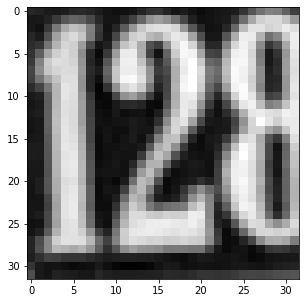

Label: 6


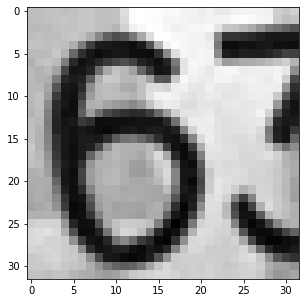

Label: 7


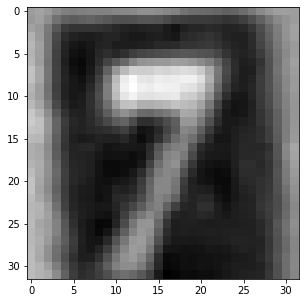

Label: 4


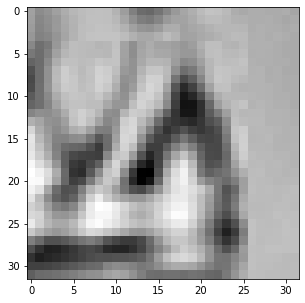

Label: 4


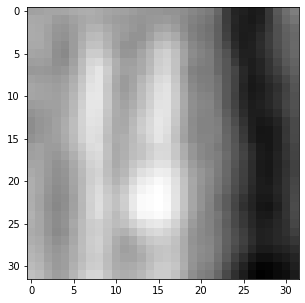

Label: 0


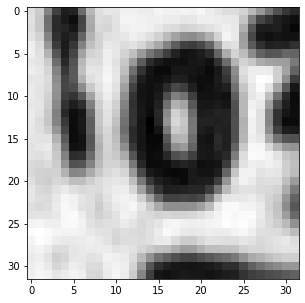

Label: 3


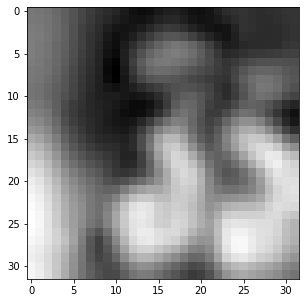

Label: 0


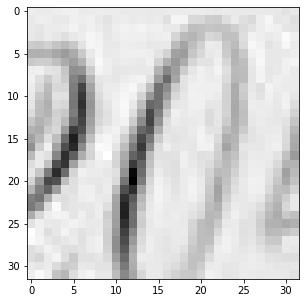

Label: 7


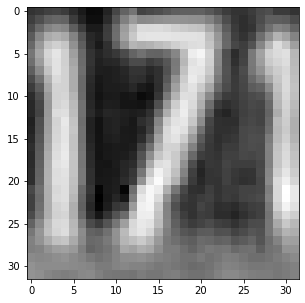

Label: 3


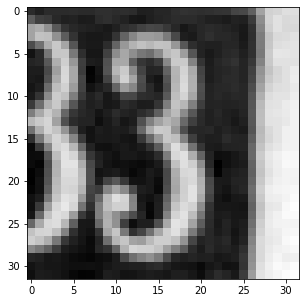

In [253]:
# plt.figure(figsize=(10,1))
for i in range(10):
#     plt.subplot(1,10,i+1)
    print("Label: {}".format(y_train1[i]))
    plt.figure(figsize=(20,5))
    plt.imshow(X_train[i], cmap='gray')
    plt.show()

In [254]:
#Reshaping the data

X_train = X_train.reshape(X_train.shape[0],1024)
X_test = X_test.reshape(X_test.shape[0],1024)

In [255]:
#Normalize inputs from 0-255 to 0-1

X_train = X_train/255.0
X_test =X_test/255.0
print('Training set',X_train.shape,y_train1.shape)
print('Testset',X_test.shape,y_test1.shape)

Training set (42000, 1024) (42000,)
Testset (18000, 1024) (18000,)


In [256]:
print(X_test.shape)
print(y_test1.shape)

(18000, 1024)
(18000,)


## Designing, training, tuning and testing a neural network image classifier.

In [266]:
def nn_model(lrate):
    
    model4 = Sequential()
    
    model4.add(BatchNormalization(input_shape=((1024,)))) 
    
    model4.add(Dense(256,activation='relu'))
    model4.add(Dense(64,activation='relu'))
    model4.add(Dense(32,activation='relu'))
    
    model4.add(Dense(num_classes,activation='softmax'))
    
    # compile the model   
    adam1 = optimizers.Adam(lr = lrate)
    model4.compile(loss='categorical_crossentropy', optimizer = adam1, metrics=['acc'])
    
    model4.fit(X_test, y_test, validation_data = (X_test,y_test), epochs = 30, batch_size = 200, verbose = 2)
    
    
   # plot learning curves
    plt.plot(history.history['acc'], label='train')
    plt.plot(history.history['val_acc'], label='test')
    plt.title('Learning Rate = '+str(lrate), pad=-80)


Epoch 1/30
90/90 - 1s - loss: 23763.5547 - acc: 0.0987 - val_loss: 2.3181 - val_acc: 0.1007
Epoch 2/30
90/90 - 1s - loss: 2.3218 - acc: 0.0998 - val_loss: 2.3301 - val_acc: 0.1007
Epoch 3/30
90/90 - 1s - loss: 2.3191 - acc: 0.0973 - val_loss: 2.3282 - val_acc: 0.0982
Epoch 4/30
90/90 - 1s - loss: 2.3296 - acc: 0.0977 - val_loss: 2.3346 - val_acc: 0.1018
Epoch 5/30
90/90 - 1s - loss: 2.3322 - acc: 0.0968 - val_loss: 2.3340 - val_acc: 0.1004
Epoch 6/30
90/90 - 1s - loss: 2.3362 - acc: 0.1027 - val_loss: 2.3145 - val_acc: 0.0955
Epoch 7/30
90/90 - 1s - loss: 2.3325 - acc: 0.0978 - val_loss: 2.3383 - val_acc: 0.1002
Epoch 8/30
90/90 - 1s - loss: 2.3423 - acc: 0.0952 - val_loss: 2.3630 - val_acc: 0.1007
Epoch 9/30
90/90 - 1s - loss: 2.3243 - acc: 0.1068 - val_loss: 2.3296 - val_acc: 0.1002
Epoch 10/30
90/90 - 1s - loss: 2.3292 - acc: 0.0994 - val_loss: 2.3259 - val_acc: 0.1018
Epoch 11/30
90/90 - 1s - loss: 2.3314 - acc: 0.1012 - val_loss: 2.3171 - val_acc: 0.0982
Epoch 12/30
90/90 - 1s - l

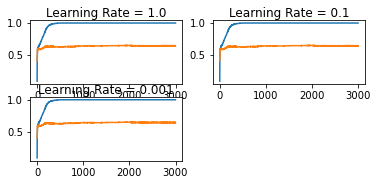

In [267]:
learning_rates = [1e-1, 1e-3, 1e4, 1e6]
for i in range(len(learning_rates)):
    # determine the plot number
    plot_no = 320 + (i+1)
    plt.subplot(plot_no)
    # fit model and plot learning curves for a learning rate
    nn_model(learning_rates[i])
# show learning curves
plt.show()

 - Choosing the learning rate of 1e-3 since the model was able to learn the problem well.

In [268]:
#Building the model with best chosen hyper parameters

def nn_model():
    
    model4= Sequential()
    
    model4.add(BatchNormalization(input_shape=((1024,)))) 
    
    model4.add(Dense(256,activation='relu'))
    model4.add(Dense(64,activation='relu'))
    model4.add(Dense(32,activation='relu'))
    
    model4.add(Dense(num_classes,activation='softmax'))
    
    # compile the model
    
    adam1 = optimizers.Adam(lr = 1e-3)
    model4.compile(loss='categorical_crossentropy', optimizer = adam1, metrics=['acc'])
    
    return model4


In [270]:
# Build the model
model_img = nn_model()

# Fit the model
history = model_img.fit(X_test, y_test, validation_data = (X_test,y_test), epochs = 30, batch_size = 200, verbose=2)

Epoch 1/30
90/90 - 1s - loss: 1.9084 - acc: 0.3316 - val_loss: 1.8288 - val_acc: 0.5144
Epoch 2/30
90/90 - 1s - loss: 1.2353 - acc: 0.6089 - val_loss: 1.3708 - val_acc: 0.6601
Epoch 3/30
90/90 - 1s - loss: 1.0105 - acc: 0.6834 - val_loss: 1.0180 - val_acc: 0.7149
Epoch 4/30
90/90 - 1s - loss: 0.8888 - acc: 0.7260 - val_loss: 0.8194 - val_acc: 0.7631
Epoch 5/30
90/90 - 1s - loss: 0.8057 - acc: 0.7468 - val_loss: 0.7042 - val_acc: 0.7867
Epoch 6/30
90/90 - 1s - loss: 0.7426 - acc: 0.7678 - val_loss: 0.6777 - val_acc: 0.7872
Epoch 7/30
90/90 - 1s - loss: 0.6906 - acc: 0.7831 - val_loss: 0.6231 - val_acc: 0.8075
Epoch 8/30
90/90 - 1s - loss: 0.6227 - acc: 0.8071 - val_loss: 0.5755 - val_acc: 0.8209
Epoch 9/30
90/90 - 1s - loss: 0.6081 - acc: 0.8102 - val_loss: 0.5226 - val_acc: 0.8381
Epoch 10/30
90/90 - 1s - loss: 0.5718 - acc: 0.8213 - val_loss: 0.4870 - val_acc: 0.8475
Epoch 11/30
90/90 - 1s - loss: 0.5439 - acc: 0.8281 - val_loss: 0.4833 - val_acc: 0.8479
Epoch 12/30
90/90 - 1s - loss:

In [275]:
score = model_img.evaluate(X_test, y_test, verbose = 0)

print("Test Score:", score[0])
print("Test Accuracy:", score[1])

Test Score: 0.2016165554523468
Test Accuracy: 0.9385555386543274


In [278]:
#Testing the model

y_pred = model_img.predict(X_test)

print(np.argmax(y_pred[5]))
print(np.argmax(y_test[5]))

9
9


## Plotting the training loss, validation loss vs number of epochs and training accuracy, validation accuracy vs number of epochs plot and my observations on the same

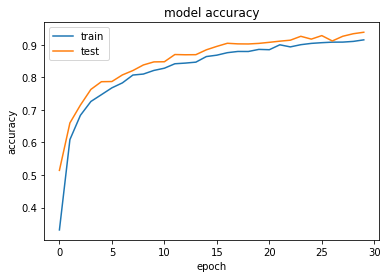

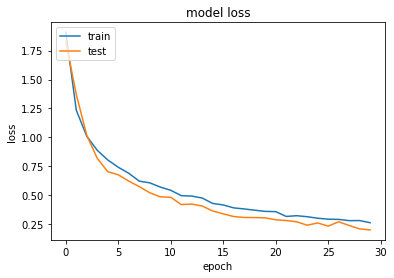

In [293]:
#summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train','test'],loc='upper left')
plt.show()

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','test'],loc='upper left')
plt.show()

 - From the plot of accuracy we can see that the model is trained quite well as the trend for accuracy on both datasets is incraesing at the lower epochs. We can also see that the model has not yet over-learned the training dataset, showing comparable skill on both datasets.
 - From the plot of loss, we can see that the model has comparable performance on both train and validation datasets. The loss decreases consistently as the number of epochs increase.
 - Also, it is challenging to tune hyper-parameters for this model as with a little adjustment, the accuracy of the model change significantly. Finding the best combination of parameter definitely require many experiments and deep understanding neural networks.